<a href="https://colab.research.google.com/github/vmainmc/Organelle-Segmentation-with-Detectron2/blob/main/deneme_bitirme.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

Mon Jun 12 22:57:40 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   50C    P8    10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-slfzzvzp
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-slfzzvzp
  Resolved https://github.com/facebookresearch/detectron2.git to commit 027099d37a246aebf835b0bd05b075758c3a40cd
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 1.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 10.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 17.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 51.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 15.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for detectron2: filen

In [3]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0
torch:  2.0 ; cuda:  cu118
detectron2: 0.6


In [4]:
# COMMON LIBRARIES
import os
import cv2

from datetime import datetime
from google.colab.patches import cv2_imshow

# DATA SET PREPARATION AND LOADING
from detectron2.data.datasets import register_coco_instances
from detectron2.data import DatasetCatalog, MetadataCatalog

# VISUALIZATION
from detectron2.utils.visualizer import Visualizer
from detectron2.utils.visualizer import ColorMode

# CONFIGURATION
from detectron2 import model_zoo
from detectron2.config import get_cfg

# EVALUATION
from detectron2.engine import DefaultPredictor

# TRAINING
from detectron2.engine import DefaultTrainer

In [5]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="dhNkBoh6HWJmqWm3D9W5")
project = rf.workspace("cellsegmentation").project("gh-n4jgw")
dataset = project.version(3).download("coco-segmentation")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 7.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 6.4 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9657 sha256=c6b900ba6e1ed8a09276a80604a81817a5ecc18b3717ea3eeb58c82e060ee549
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.0.9
    Uninstalling pyparsing-3.0.9:
      Successfully uninstalled pyparsing-3.0.9
  Attempting uninstall: idna
    Found existing installation: idna 3.4
    Uninstalling idna-3.4:
    

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to gh-3 in coco-segmentation:: 100%|██████████| 442/442 [00:00<00:00, 1270.77it/s]


In [6]:
DATA_SET_NAME = dataset.name.replace(" ", "-")
ANNOTATIONS_FILE_NAME = "_annotations.coco.json"
# TRAIN SET
train_df = f"{DATA_SET_NAME}-train"
TRAIN_DATA_SET_IMAGES_DIR_PATH = os.path.join(dataset.location, "train")
TRAIN_DATA_SET_ANN_FILE_PATH = os.path.join(dataset.location, "train", ANNOTATIONS_FILE_NAME)

register_coco_instances(
    name=train_df, 
    metadata={}, 
    json_file=TRAIN_DATA_SET_ANN_FILE_PATH, 
    image_root=TRAIN_DATA_SET_IMAGES_DIR_PATH
)

# TEST SET
test_df = f"{DATA_SET_NAME}-test"
TEST_DATA_SET_IMAGES_DIR_PATH = os.path.join(dataset.location, "test")
TEST_DATA_SET_ANN_FILE_PATH = os.path.join(dataset.location, "test", ANNOTATIONS_FILE_NAME)

register_coco_instances(
    name=test_df, 
    metadata={}, 
    json_file=TEST_DATA_SET_ANN_FILE_PATH, 
    image_root=TEST_DATA_SET_IMAGES_DIR_PATH
)

# VALID SET
valid_df = f"{DATA_SET_NAME}-valid"
VALID_DATA_SET_IMAGES_DIR_PATH = os.path.join(dataset.location, "valid")
VALID_DATA_SET_ANN_FILE_PATH = os.path.join(dataset.location, "valid", ANNOTATIONS_FILE_NAME)

register_coco_instances(
    name=valid_df, 
    metadata={}, 
    json_file=VALID_DATA_SET_ANN_FILE_PATH, 
    image_root=VALID_DATA_SET_IMAGES_DIR_PATH
)

In [7]:
[
    data_set
    for data_set
    in MetadataCatalog.list()
    if data_set.startswith(DATA_SET_NAME)
]

['gh-train', 'gh-test', 'gh-valid']

Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.



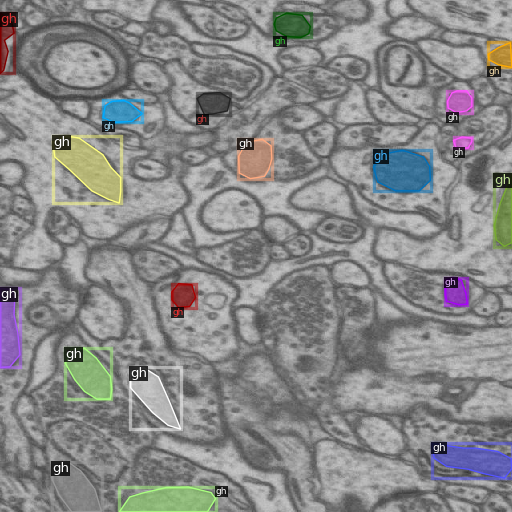

In [8]:
metadata = MetadataCatalog.get(train_df)
dataset_train = DatasetCatalog.get(train_df)

dataset_entry = dataset_train[0]
image = cv2.imread(dataset_entry["file_name"])

visualizer = Visualizer(
    image[:, :, ::-1],
    metadata=metadata, 
    scale=0.8, 
    instance_mode=ColorMode.IMAGE_BW
)

out = visualizer.draw_dataset_dict(dataset_entry)
cv2_imshow(out.get_image()[:, :, ::-1])

In [9]:
# HYPERPARAMETERS
ARCHITECTURE = "mask_rcnn_R_101_FPN_3x"
CONFIG_FILE_PATH = f"COCO-InstanceSegmentation/{ARCHITECTURE}.yaml"
MAX_ITER = 2000
EVAL_PERIOD = 300
BASE_LR = 0.001
NUM_CLASSES = 3

# OUTPUT DIR
OUTPUT_DIR_PATH = os.path.join(
    DATA_SET_NAME, 
    ARCHITECTURE, 
    datetime.now().strftime('%Y-%m-%d-%H-%M-%S')
)

os.makedirs(OUTPUT_DIR_PATH, exist_ok=True)

In [10]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(CONFIG_FILE_PATH))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(CONFIG_FILE_PATH)
cfg.DATASETS.TRAIN = (train_df,)
cfg.DATASETS.TEST = (test_df,)
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.TEST.EVAL_PERIOD = EVAL_PERIOD
cfg.DATALOADER.NUM_WORKERS = 2
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.INPUT.MASK_FORMAT='bitmask'
cfg.SOLVER.BASE_LR = BASE_LR
cfg.SOLVER.MAX_ITER = MAX_ITER
cfg.MODEL.ROI_HEADS.NUM_CLASSES = NUM_CLASSES
cfg.OUTPUT_DIR = OUTPUT_DIR_PATH

In [11]:
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[06/12 23:02:25 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_a3ec72.pkl: 254MB [00:01, 159MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[06/12 23:02:27 d2.engine.train_loop]: Starting training from iteration 0


torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)


[06/12 23:02:44 d2.utils.events]:  eta: 0:18:11  iter: 19  total_loss: 4.772  loss_cls: 1.421  loss_box_reg: 0.6169  loss_mask: 0.6865  loss_rpn_cls: 1.818  loss_rpn_loc: 0.1234    time: 0.5929  last_time: 0.4819  data_time: 0.0512  last_data_time: 0.0125   lr: 1.9981e-05  max_mem: 2415M
[06/12 23:02:59 d2.utils.events]:  eta: 0:16:46  iter: 39  total_loss: 2.908  loss_cls: 1.139  loss_box_reg: 0.6817  loss_mask: 0.6328  loss_rpn_cls: 0.2866  loss_rpn_loc: 0.09084    time: 0.5317  last_time: 0.4462  data_time: 0.0180  last_data_time: 0.0216   lr: 3.9961e-05  max_mem: 2424M
[06/12 23:03:09 d2.utils.events]:  eta: 0:16:23  iter: 59  total_loss: 2.199  loss_cls: 0.7182  loss_box_reg: 0.6926  loss_mask: 0.5397  loss_rpn_cls: 0.1171  loss_rpn_loc: 0.06691    time: 0.5165  last_time: 0.4611  data_time: 0.0179  last_data_time: 0.0104   lr: 5.9941e-05  max_mem: 2424M
[06/12 23:03:18 d2.utils.events]:  eta: 0:16:09  iter: 79  total_loss: 1.874  loss_cls: 0.5299  loss_box_reg: 0.6644  loss_mask:

In [12]:
%load_ext tensorboard
%tensorboard --logdir $OUTPUT_DIR_PATH

<IPython.core.display.Javascript object>

In [13]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7
predictor = DefaultPredictor(cfg)

[06/12 23:19:30 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from gh/mask_rcnn_R_101_FPN_3x/2023-06-12-23-02-23/model_final.pth ...


WARNING [06/12 23:19:31 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[06/12 23:19:31 d2.data.datasets.coco]: Loaded 10 images in COCO format from /content/gh-3/test/_annotations.coco.json


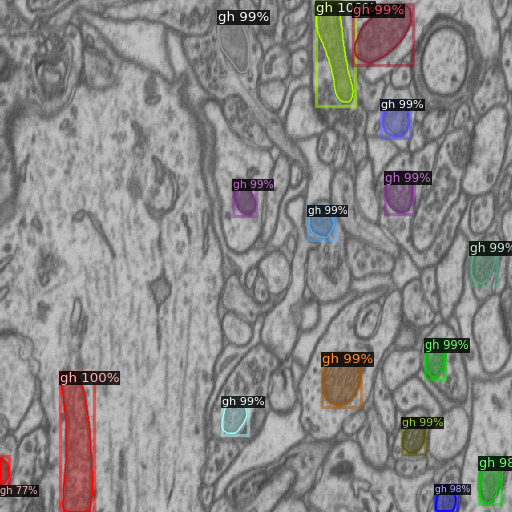

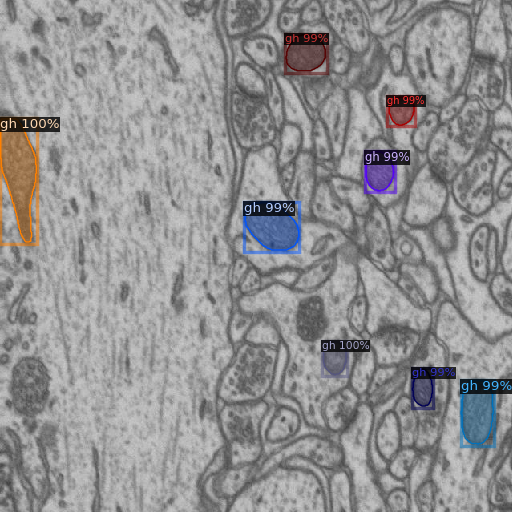

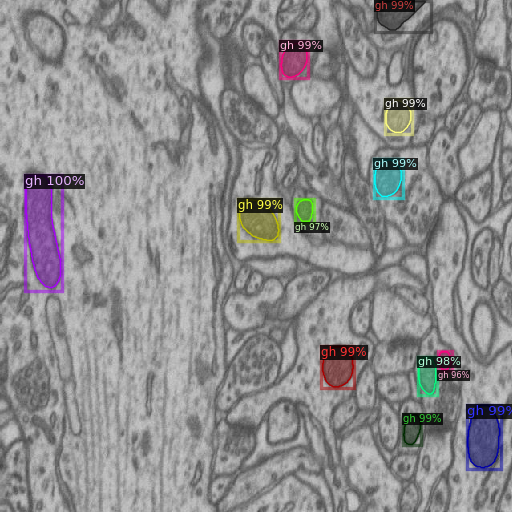

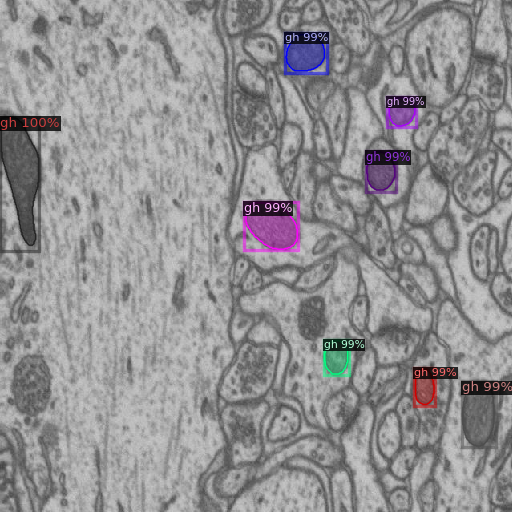

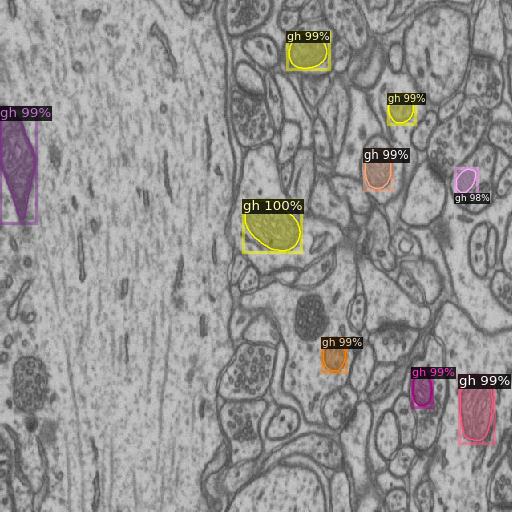

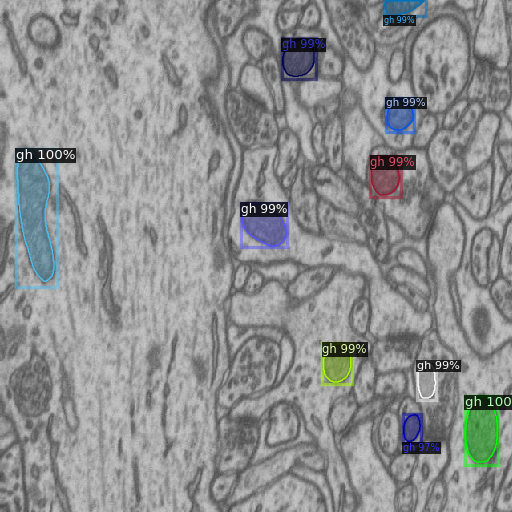

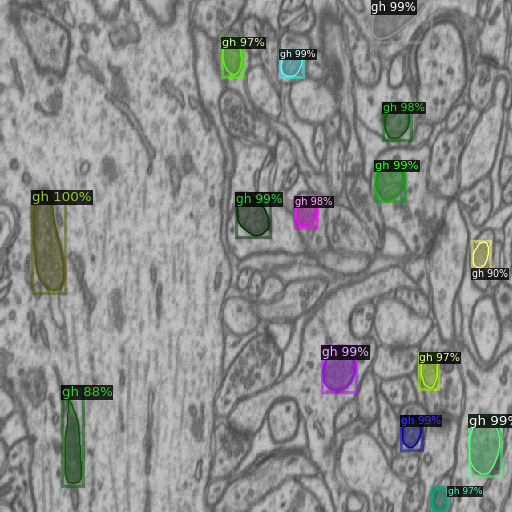

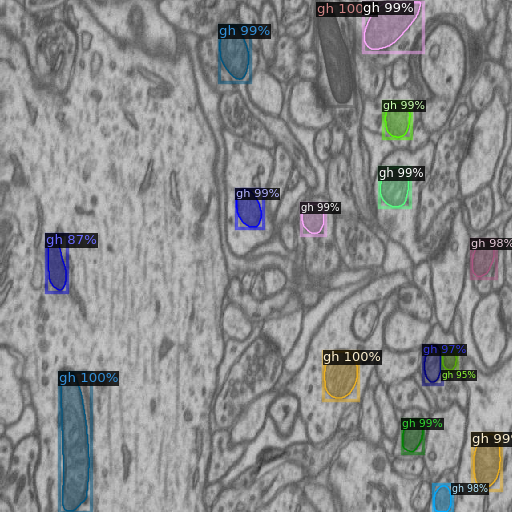

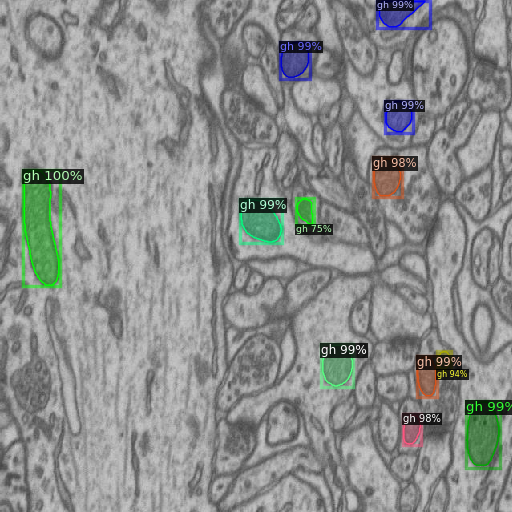

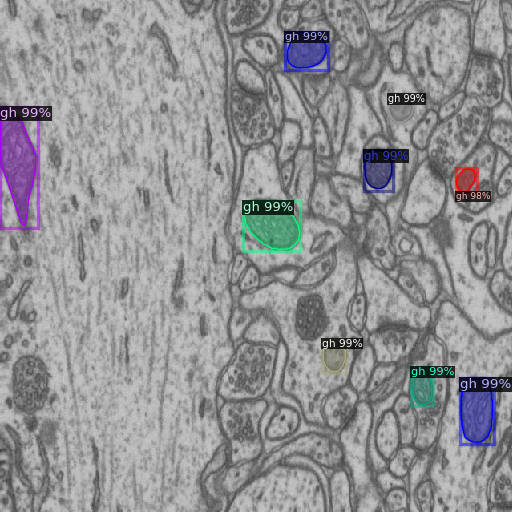

In [14]:
dataset_test = DatasetCatalog.get(test_df)

for d in dataset_test:
    img = cv2.imread(d["file_name"])
    outputs = predictor(img)
    visualizer = Visualizer(
        img[:, :, ::-1],
        metadata=metadata, 
        scale=0.8, 
        instance_mode=ColorMode.IMAGE_BW
    )
    out = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [15]:
from google.colab.patches import cv2_imshow
from PIL import Image
import pandas as pd
from detectron2.structures import BoxMode
import matplotlib.pyplot as plt
from matplotlib.path import Path
import matplotlib.patches as patches
import matplotlib.pyplot as plt
from matplotlib.path import Path
import matplotlib.patches as patches
import numpy as np
file_dict = {}

In [17]:
import json
from pycocotools import mask
with open('/content/gh-3/test/_annotations.coco.json', 'r') as f:
    annotations = json.load(f)
count=0
image_data = {}
new_list = []
for annotation in annotations.values():
  if count < 4:
    count += 1
    pass
  if count % 4 == 0:
    count+=1
    for data in annotation:
      image_data[data['id']] = data['file_name']
count=0
for annotation2 in annotations.values():
  if count < 5:
    count += 1
    pass
  if count % 5 == 0:
    for annotation in annotation2:
      image_id = annotation['image_id']
      if image_id in image_data:
          new_annotation = {
              'file_name': image_data[image_id],
              'segmentation': annotation['segmentation']
          }
          new_list.append(new_annotation)
print(new_list)

[{'file_name': 'testing-084_jpg.rf.4d7437f9ae09796af17752f9be5e1a8a.jpg', 'segmentation': [[309.722, 94.444, 312.5, 62.037, 306.25, 27.778, 290.278, 13.889, 274.306, 12.037, 269.444, 25, 273.611, 37.963, 273.611, 63.889, 286.111, 80.556, 303.472, 96.296, 309.722, 94.444]]}, {'file_name': 'testing-084_jpg.rf.4d7437f9ae09796af17752f9be5e1a8a.jpg', 'segmentation': [[407.639, 77.778, 413.194, 100, 416.667, 122.222, 429.167, 128.704, 441.667, 125, 440.972, 106.481, 429.861, 83.333, 427.083, 39.815, 417.361, 0, 396.528, 0.926, 392.361, 23.148, 397.222, 43.519, 403.472, 60.185, 407.639, 77.778]]}, {'file_name': 'testing-084_jpg.rf.4d7437f9ae09796af17752f9be5e1a8a.jpg', 'segmentation': [[444.444, 62.037, 448.611, 75, 474.306, 76.852, 493.75, 57.407, 511.806, 41.667, 514.583, 27.778, 516.667, 12.037, 497.917, 3.704, 481.25, 5.556, 460.417, 18.519, 454.167, 33.333, 445.139, 46.296, 444.444, 62.037]]}, {'file_name': 'testing-084_jpg.rf.4d7437f9ae09796af17752f9be5e1a8a.jpg', 'segmentation': [[493.

In [18]:
for d in new_list:
    file_name = d['file_name']
    if file_name not in file_dict:
        file_dict[file_name] = [d]
    else:
        file_dict[file_name].append(d)
print(file_dict)

{'testing-084_jpg.rf.4d7437f9ae09796af17752f9be5e1a8a.jpg': [{'file_name': 'testing-084_jpg.rf.4d7437f9ae09796af17752f9be5e1a8a.jpg', 'segmentation': [[309.722, 94.444, 312.5, 62.037, 306.25, 27.778, 290.278, 13.889, 274.306, 12.037, 269.444, 25, 273.611, 37.963, 273.611, 63.889, 286.111, 80.556, 303.472, 96.296, 309.722, 94.444]]}, {'file_name': 'testing-084_jpg.rf.4d7437f9ae09796af17752f9be5e1a8a.jpg', 'segmentation': [[407.639, 77.778, 413.194, 100, 416.667, 122.222, 429.167, 128.704, 441.667, 125, 440.972, 106.481, 429.861, 83.333, 427.083, 39.815, 417.361, 0, 396.528, 0.926, 392.361, 23.148, 397.222, 43.519, 403.472, 60.185, 407.639, 77.778]]}, {'file_name': 'testing-084_jpg.rf.4d7437f9ae09796af17752f9be5e1a8a.jpg', 'segmentation': [[444.444, 62.037, 448.611, 75, 474.306, 76.852, 493.75, 57.407, 511.806, 41.667, 514.583, 27.778, 516.667, 12.037, 497.917, 3.704, 481.25, 5.556, 460.417, 18.519, 454.167, 33.333, 445.139, 46.296, 444.444, 62.037]]}, {'file_name': 'testing-084_jpg.rf.4

/content/gh-3/test/testing-084_jpg.rf.4d7437f9ae09796af17752f9be5e1a8a.jpg


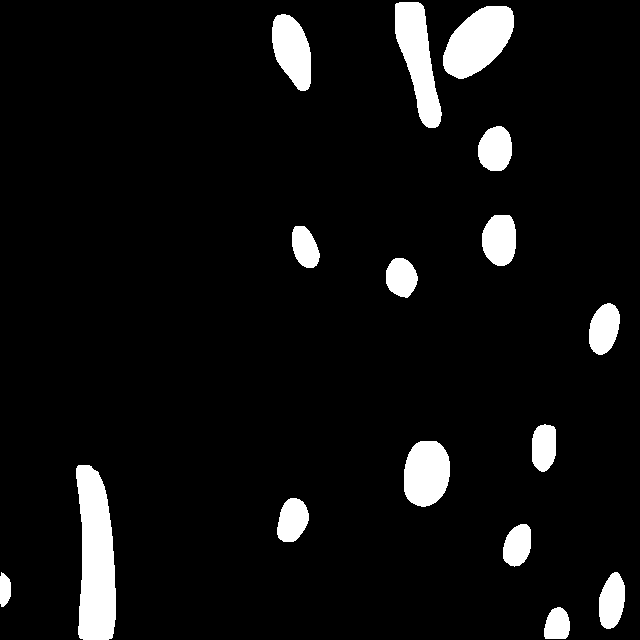

/content/gh-3/test/testing-156_jpg.rf.bd0643d7cabfd0592c9c356a86e8ddec.jpg


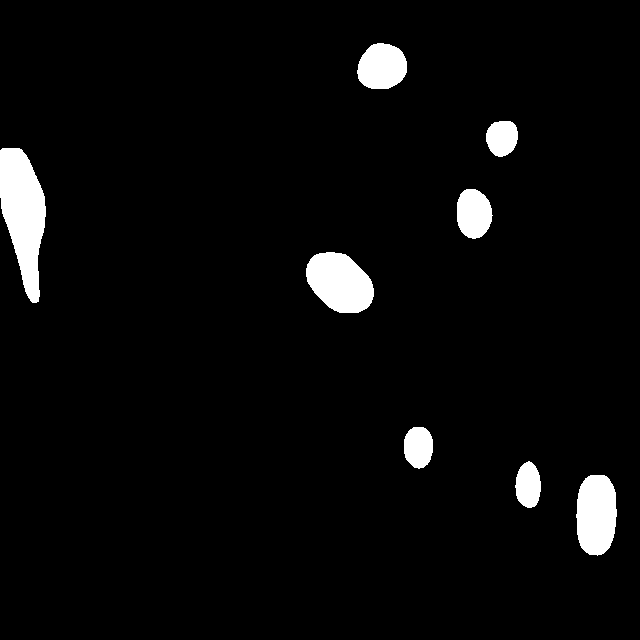

/content/gh-3/test/testing-128_jpg.rf.16ed26ff435cee10b283652c90b110b1.jpg


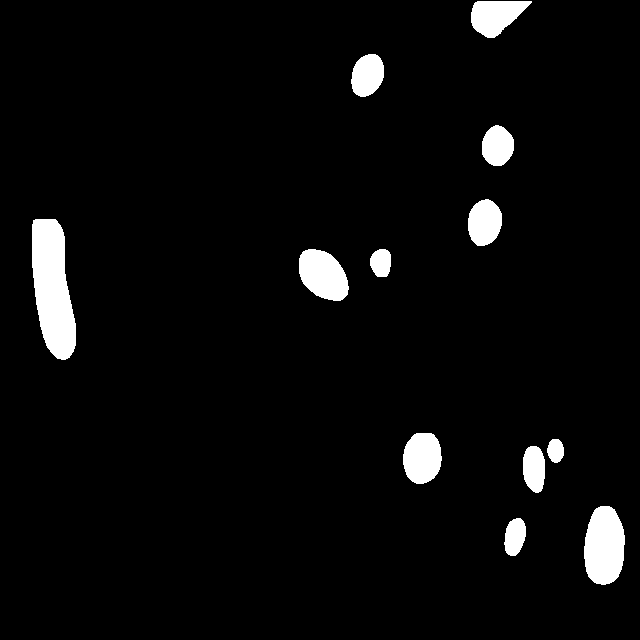

/content/gh-3/test/testing-154_jpg.rf.f6f44e5e6e603400810a05e46aa5d047.jpg


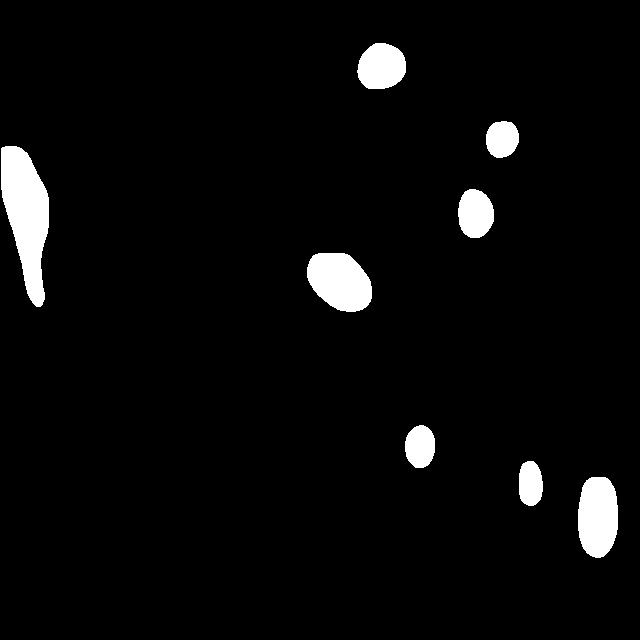

/content/gh-3/test/testing-159_jpg.rf.02f3ba74f4c8956b05aade1a2e5ef737.jpg


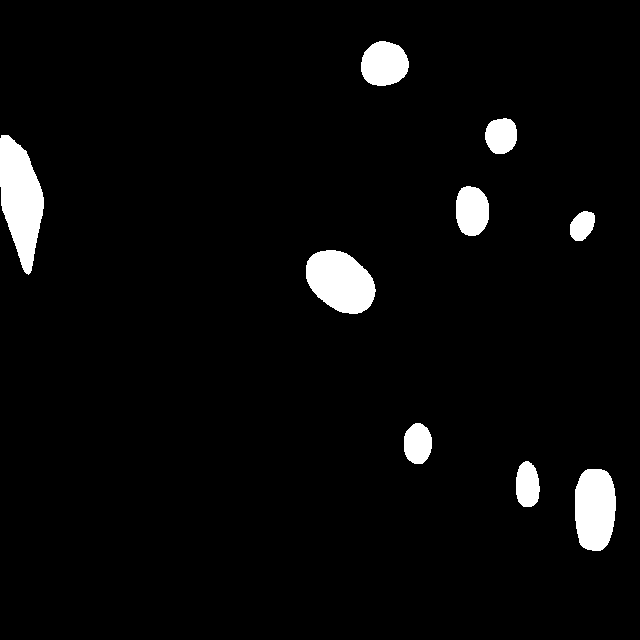

/content/gh-3/test/testing-138_jpg.rf.789c48bd9e9b587d788511395ea70ff0.jpg


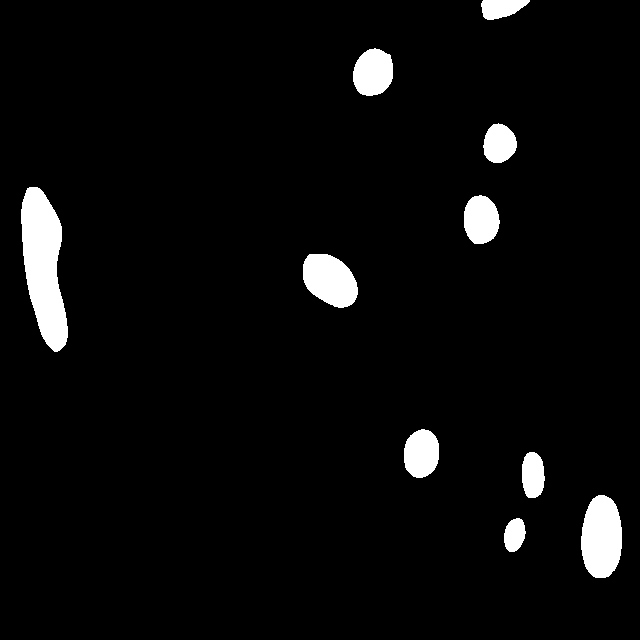

/content/gh-3/test/testing-118_jpg.rf.e3aaedda177287a8e4d297342ffc1c94.jpg


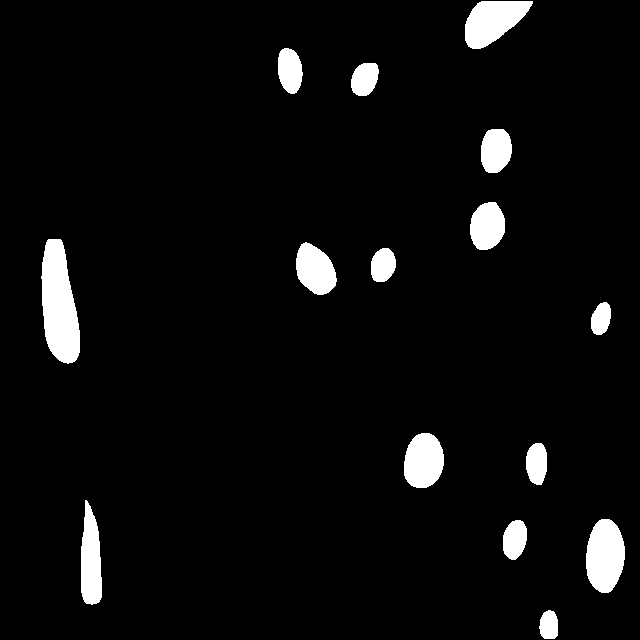

/content/gh-3/test/testing-102_jpg.rf.27497b8589d25da34db4cc44f0685ad8.jpg


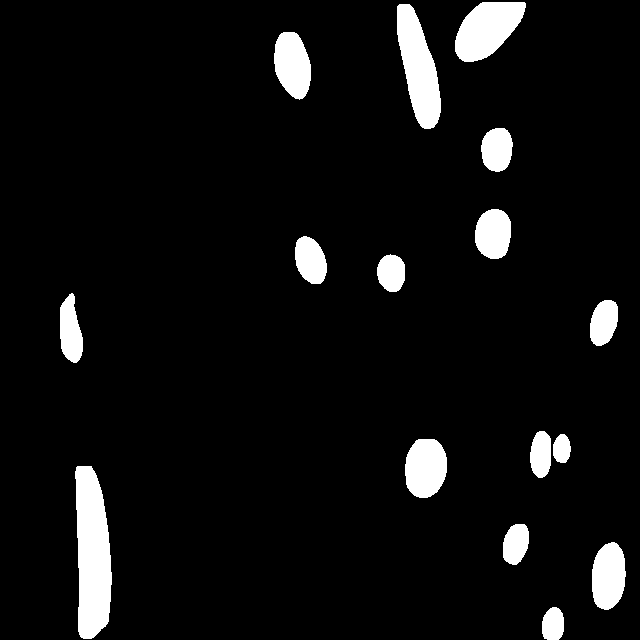

/content/gh-3/test/testing-131_jpg.rf.7df9a2688fd5d6fa282892878c748596.jpg


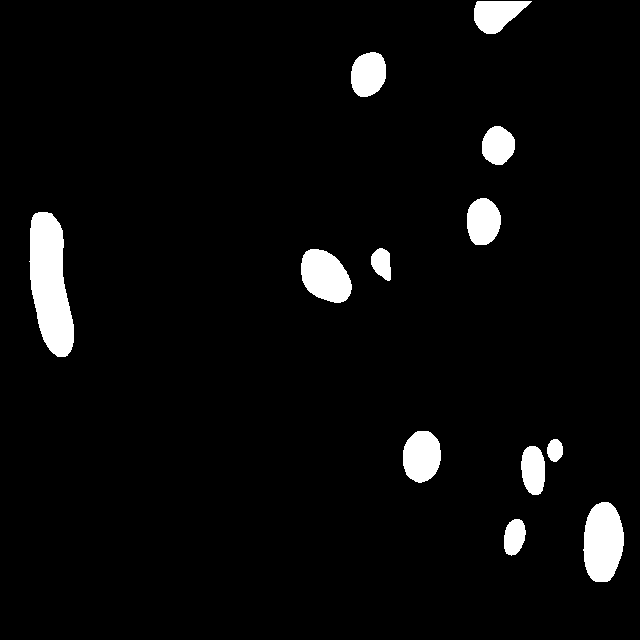

/content/gh-3/test/testing-158_jpg.rf.d05ffce9a9f2bdacbf052ad0a0ef18d0.jpg


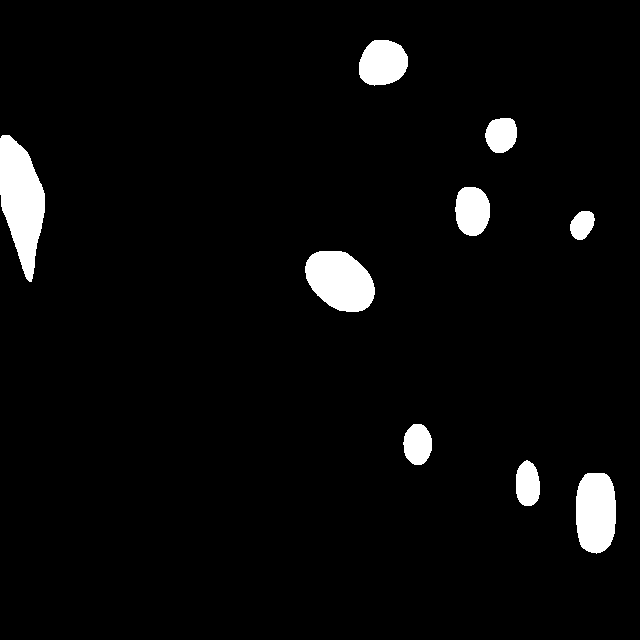

In [19]:
predicted_mask = np.zeros_like(img)  # Boş bir maske oluştur
pd_mask_list=[]

for d in dataset_test:
  
    img = cv2.imread(d["file_name"])
    predicted_mask = np.zeros_like(img[:, :, 0])  # img ile aynı boyutta bir dizi oluştur

    outputs = predictor(img)
    instances = outputs["instances"]
    masks = instances.pred_masks.cpu().numpy()
    combined_mask = np.logical_or.reduce(masks).astype(np.uint8) * 255
    print(d["file_name"])
    pd_mask_list.append(combined_mask)
    cv2_imshow(combined_mask)
    # Her bir maskeyi birleştir

testing-084_jpg.rf.4d7437f9ae09796af17752f9be5e1a8a.jpg


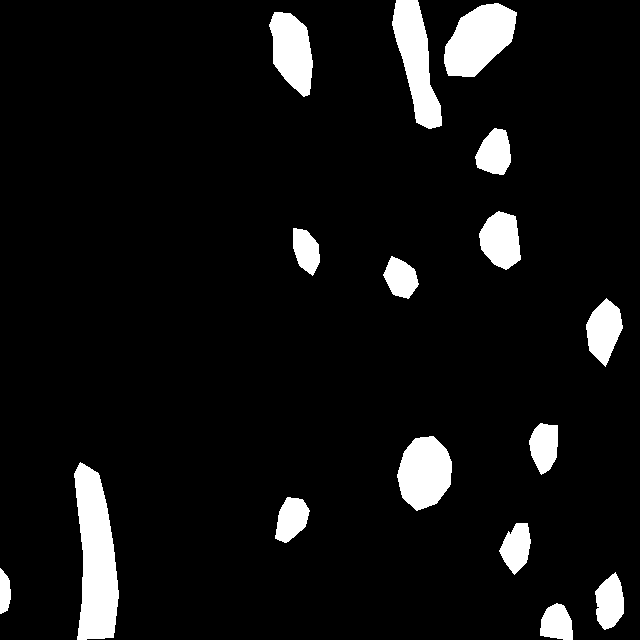

testing-156_jpg.rf.bd0643d7cabfd0592c9c356a86e8ddec.jpg


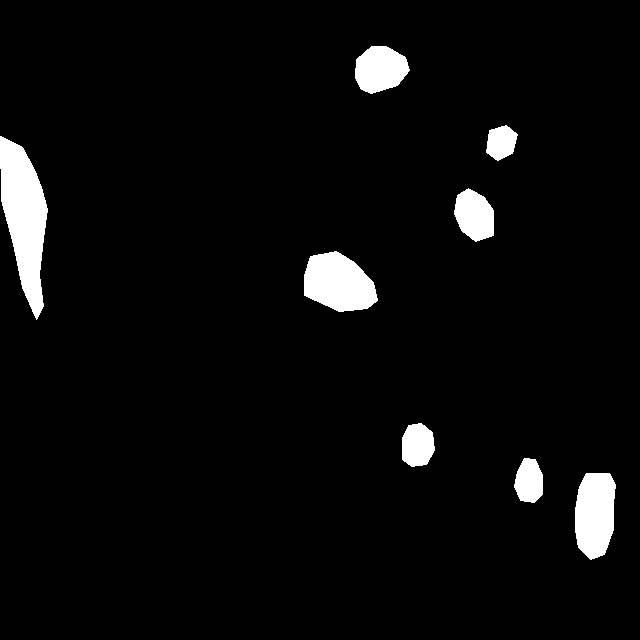

testing-128_jpg.rf.16ed26ff435cee10b283652c90b110b1.jpg


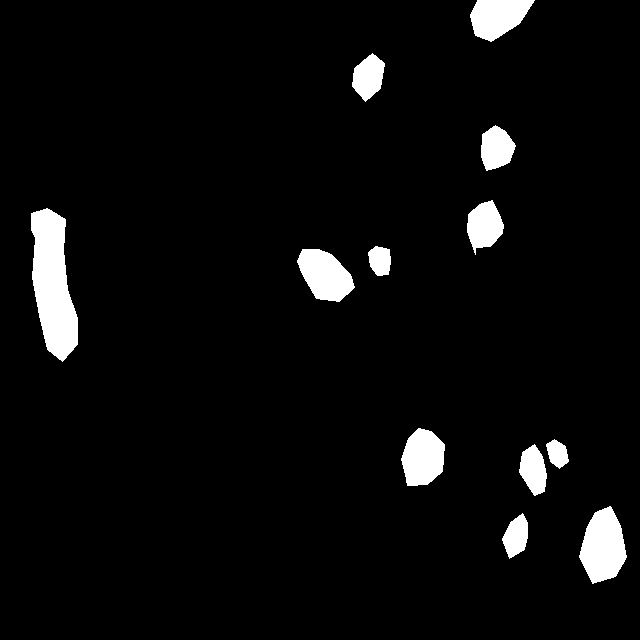

testing-154_jpg.rf.f6f44e5e6e603400810a05e46aa5d047.jpg


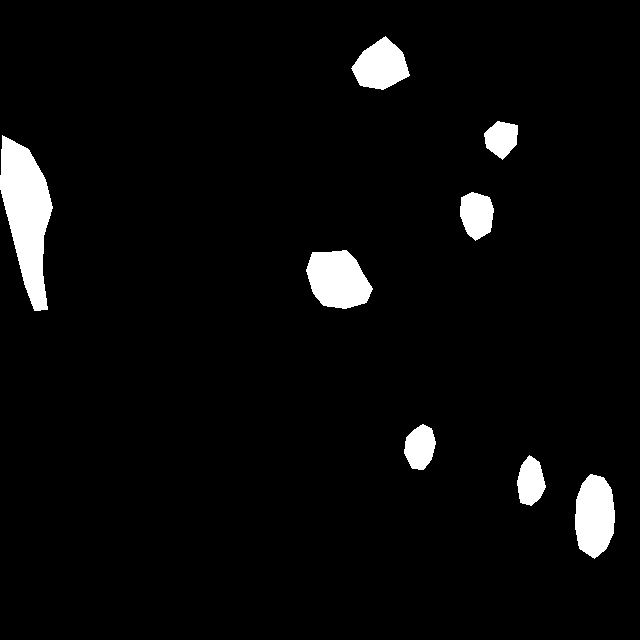

testing-159_jpg.rf.02f3ba74f4c8956b05aade1a2e5ef737.jpg


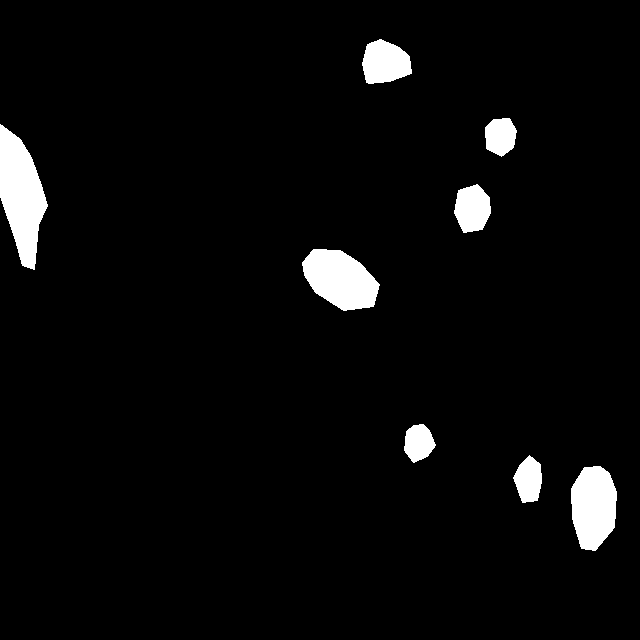

testing-138_jpg.rf.789c48bd9e9b587d788511395ea70ff0.jpg


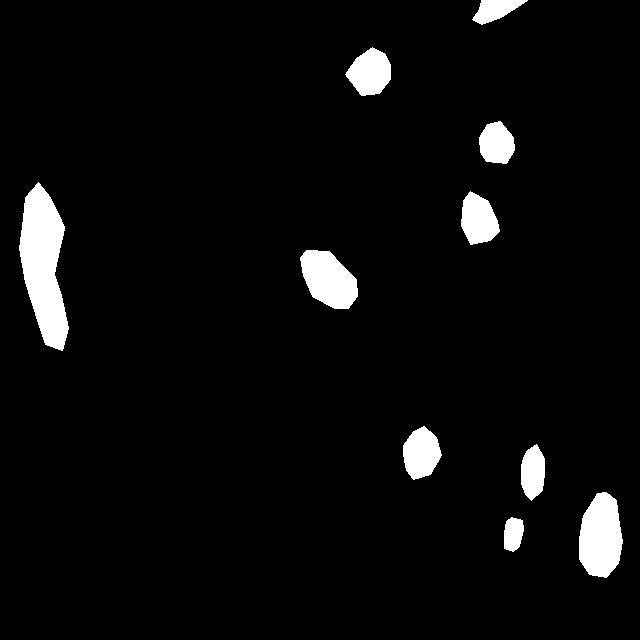

testing-118_jpg.rf.e3aaedda177287a8e4d297342ffc1c94.jpg


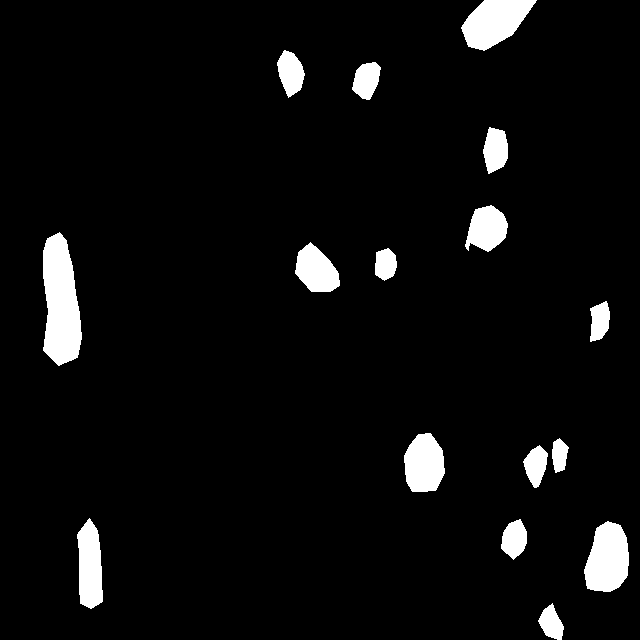

testing-102_jpg.rf.27497b8589d25da34db4cc44f0685ad8.jpg


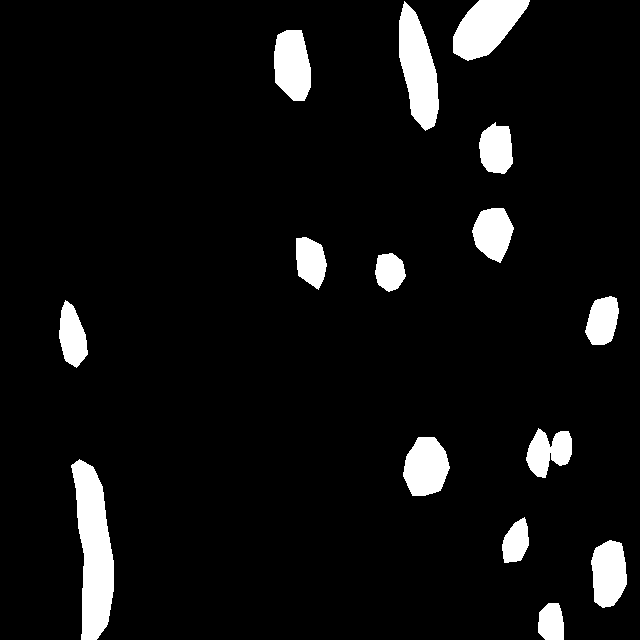

testing-131_jpg.rf.7df9a2688fd5d6fa282892878c748596.jpg


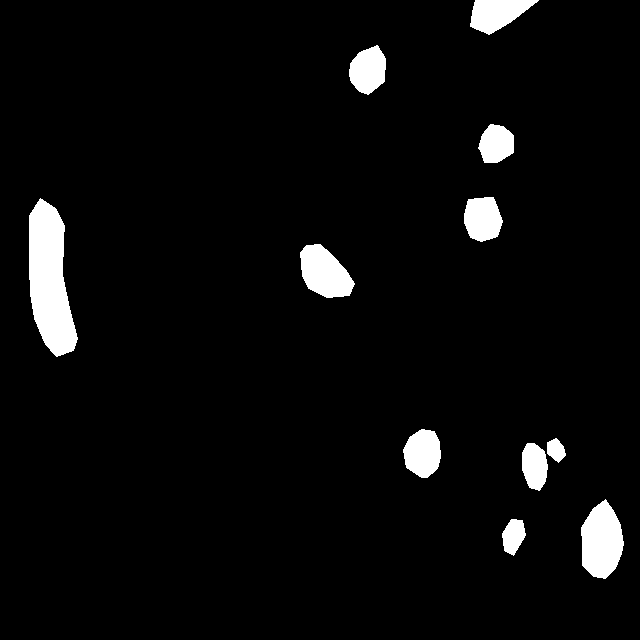

testing-158_jpg.rf.d05ffce9a9f2bdacbf052ad0a0ef18d0.jpg


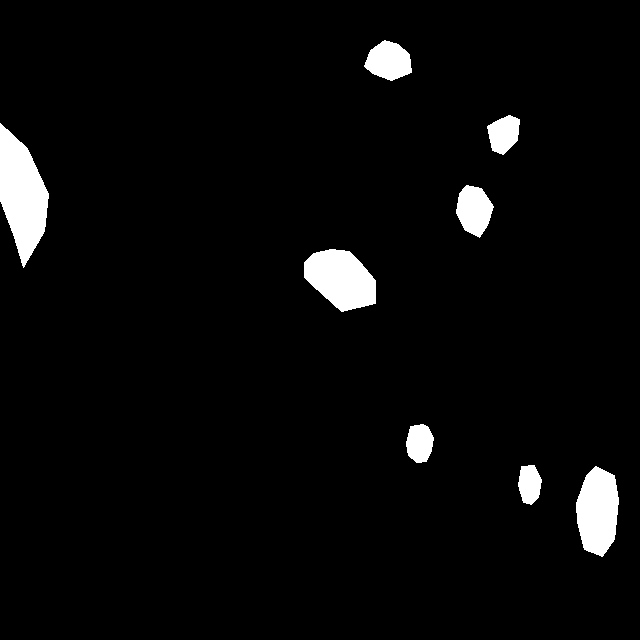

In [20]:
gt_mask_list = []
for file_name in file_dict:
    # ilgili sözlük listesini al
    dict_list = file_dict[file_name]
    mask_shape = (640, 640)  # Maske boyutunu belirtin
    ground_truth_mask = np.zeros(mask_shape, dtype=np.uint8)
    
    # her sözlükteki segmentasyon verilerini al ve plot et
    for d in dict_list:
        segmentation = d['segmentation'][0]
        x = segmentation[0::2]
        y = segmentation[1::2]
        points = list(zip(x, y))
        polygon_points = np.array(points, np.int32)
        polygon_points = polygon_points.reshape((-1, 1, 2))
        cv2.fillPoly(ground_truth_mask, [polygon_points], 255) 
    gt_mask_list.append(ground_truth_mask)  
    print(file_name)
    cv2_imshow( ground_truth_mask)
    cv2.waitKey(0)
    cv2.destroyAllWindows()
          

In [21]:
toplam=0
sayac=0
for gt_mask, pd_mask in zip(gt_mask_list, pd_mask_list):
  intersection = np.logical_and(gt_mask, pd_mask)
  union = np.logical_or(gt_mask, pd_mask)
  iou = np.sum(intersection) / np.sum(union)
  toplam=toplam+iou
  sayac=sayac+1
sonuc=toplam/sayac
print("Train verisinden alınan verilerle ortalama jaccard değeri:",sonuc)

Train verisinden alınan verilerle ortalama jaccard değeri: 0.8326975598755351


In [22]:
from roboflow import Roboflow
rf = Roboflow(api_key="qGpUodzfLs5ylMRPd4VV")
project = rf.workspace("bitirme-aevnz").project("bitirme-lo0qk")
dataset = project.version(3).download("coco-segmentation")


loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to bitirme-3 in coco-segmentation:: 100%|██████████| 167/167 [00:00<00:00, 1198.16it/s]


In [23]:
NEW_DATA_SET_NAME = dataset.name.replace(" ", "-")
ANNOTATIONS_FILE_NAME = "_annotations.coco.json"
test_df_new = f"{NEW_DATA_SET_NAME}-yenitest"
TEST_DATA_SET_NEW_IMAGES_DIR_PATH = "/content/bitirme-3/test"
TEST_DATA_SET_NEW_ANN_FILE_PATH = "/content/bitirme-3/test/_annotations.coco.json"

register_coco_instances(
    name=test_df_new,
    metadata={}, 
    json_file=TEST_DATA_SET_NEW_ANN_FILE_PATH, 
    image_root=TEST_DATA_SET_NEW_IMAGES_DIR_PATH
)
cfg.DATASETS.TEST = (test_df_new,)

In [24]:
new_dataset_test = DatasetCatalog.get(test_df_new)
with open('/content/bitirme-3/test/_annotations.coco.json', 'r') as f:
    annotations = json.load(f)
count=0
image_data = {}
new_list_test = []
for annotation in annotations.values():
  if count < 4:
    count += 1
    pass
  if count % 4 == 0:
    count+=1
    for data in annotation:
      image_data[data['id']] = data['file_name']
count=0
for annotation2 in annotations.values():
  if count < 5:
    count += 1
    pass
  if count % 5 == 0:
    for annotation in annotation2:
      image_id = annotation['image_id']
      if image_id in image_data:
          new_annotation = {
              'file_name': image_data[image_id],
              'segmentation': annotation['segmentation']
          }
          new_list_test.append(new_annotation)
print(new_list_test)

WARNING [06/12 23:25:49 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[06/12 23:25:49 d2.data.datasets.coco]: Loaded 163 images in COCO format from /content/bitirme-3/test/_annotations.coco.json
[{'file_name': 'training-016_jpg.rf.03632a4bba838e0c3fa43cd68c1f4f7b.jpg', 'segmentation': [[132.5, 0, 132.5, 14.167, 136.875, 27.5, 145.625, 38.333, 151.25, 36.667, 152.5, 27.5, 156.25, 7.5, 158.125, 0, 132.5, 0]]}, {'file_name': 'training-016_jpg.rf.03632a4bba838e0c3fa43cd68c1f4f7b.jpg', 'segmentation': [[198.75, 78.333, 208.125, 84.167, 220.625, 82.5, 229.375, 74.167, 230, 59.167, 230, 45, 224.375, 34.167, 213.75, 32.5, 206.25, 33.333, 197.5, 43.333, 195.625, 54.167, 195, 66.667, 198.75, 78.333]]}, {'file_name': 'training-016_jpg.rf.03632a4bba838e0c3fa43cd68c1f4f7b.jpg', 'segmentation': [[131.875, 213.333, 141.25, 205, 149.375, 194.167, 155.625, 182.5, 157.5, 168.333, 150, 160, 138.125, 162.5, 125.625, 170.833, 121.25, 181.6

In [25]:
new_file_dict={}
for d in new_list_test:
    file_name = d['file_name']
    if file_name not in new_file_dict:
        new_file_dict[file_name] = [d]
    else:
        new_file_dict[file_name].append(d)
print(file_dict)

{'testing-084_jpg.rf.4d7437f9ae09796af17752f9be5e1a8a.jpg': [{'file_name': 'testing-084_jpg.rf.4d7437f9ae09796af17752f9be5e1a8a.jpg', 'segmentation': [[309.722, 94.444, 312.5, 62.037, 306.25, 27.778, 290.278, 13.889, 274.306, 12.037, 269.444, 25, 273.611, 37.963, 273.611, 63.889, 286.111, 80.556, 303.472, 96.296, 309.722, 94.444]]}, {'file_name': 'testing-084_jpg.rf.4d7437f9ae09796af17752f9be5e1a8a.jpg', 'segmentation': [[407.639, 77.778, 413.194, 100, 416.667, 122.222, 429.167, 128.704, 441.667, 125, 440.972, 106.481, 429.861, 83.333, 427.083, 39.815, 417.361, 0, 396.528, 0.926, 392.361, 23.148, 397.222, 43.519, 403.472, 60.185, 407.639, 77.778]]}, {'file_name': 'testing-084_jpg.rf.4d7437f9ae09796af17752f9be5e1a8a.jpg', 'segmentation': [[444.444, 62.037, 448.611, 75, 474.306, 76.852, 493.75, 57.407, 511.806, 41.667, 514.583, 27.778, 516.667, 12.037, 497.917, 3.704, 481.25, 5.556, 460.417, 18.519, 454.167, 33.333, 445.139, 46.296, 444.444, 62.037]]}, {'file_name': 'testing-084_jpg.rf.4

training-016_jpg.rf.03632a4bba838e0c3fa43cd68c1f4f7b.jpg


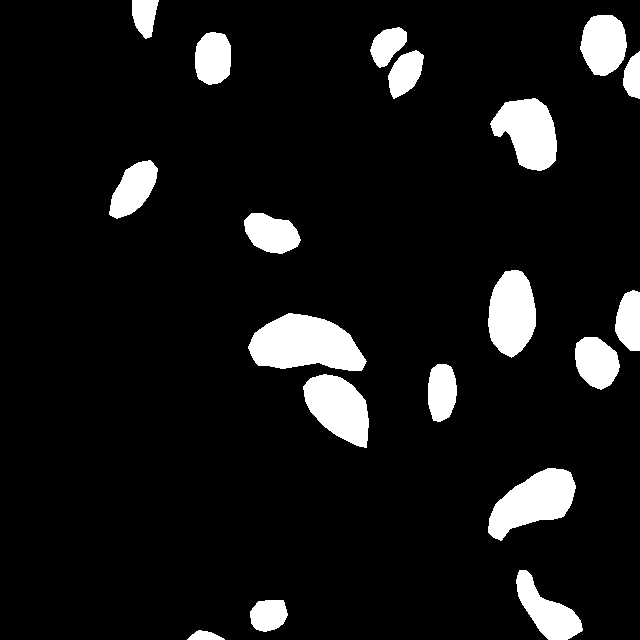

training-164_jpg.rf.03a61ef08181147c558cd33c4d5c812d.jpg


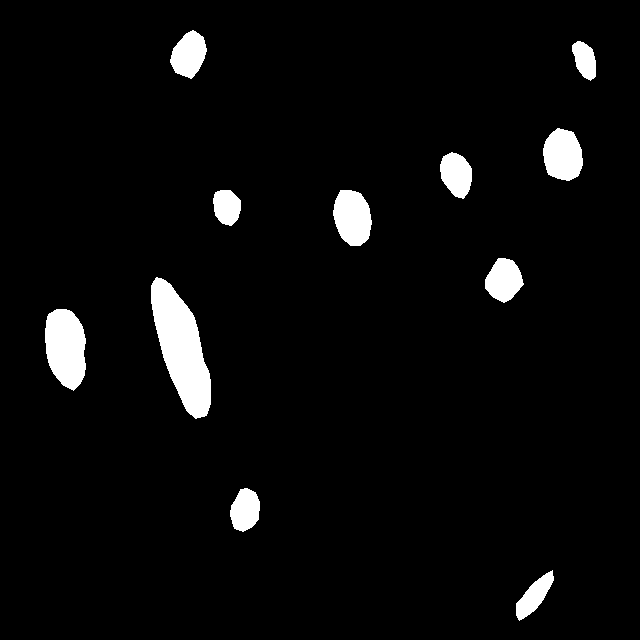

training-121_jpg.rf.16d46b3de4033d964da97cd29821a09f.jpg


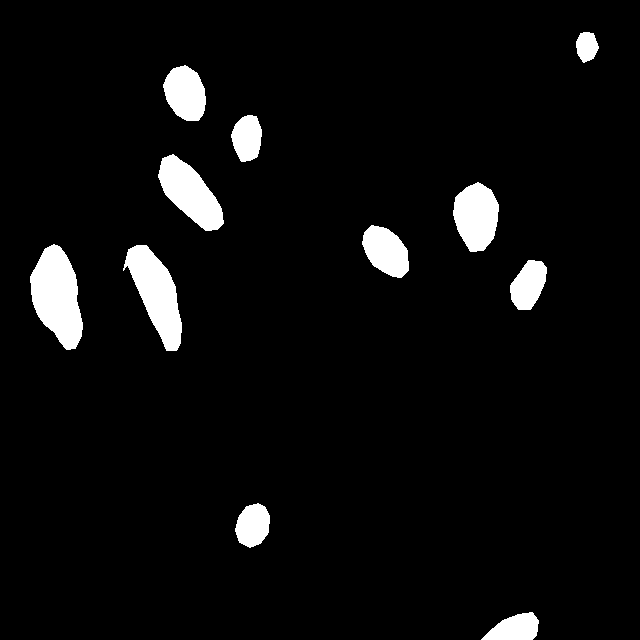

training-100_jpg.rf.14e244d28d914560ded55e9651bbb7ad.jpg


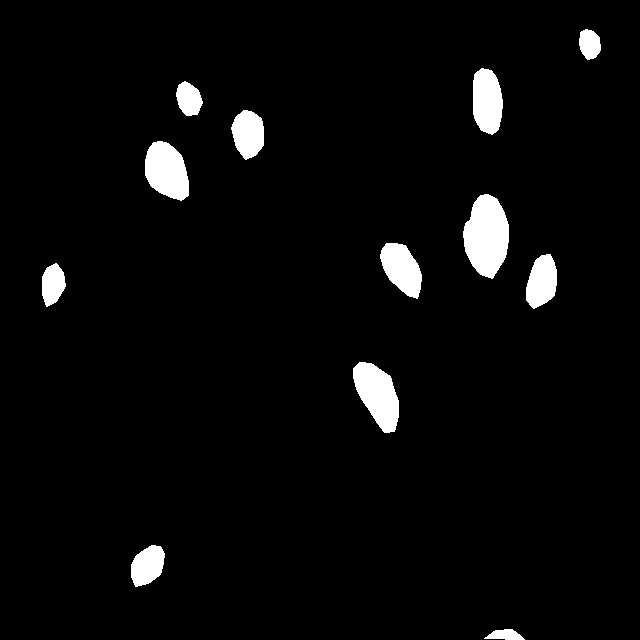

training-105_jpg.rf.0353f4bce17dc544e22ecfe4df71810d.jpg


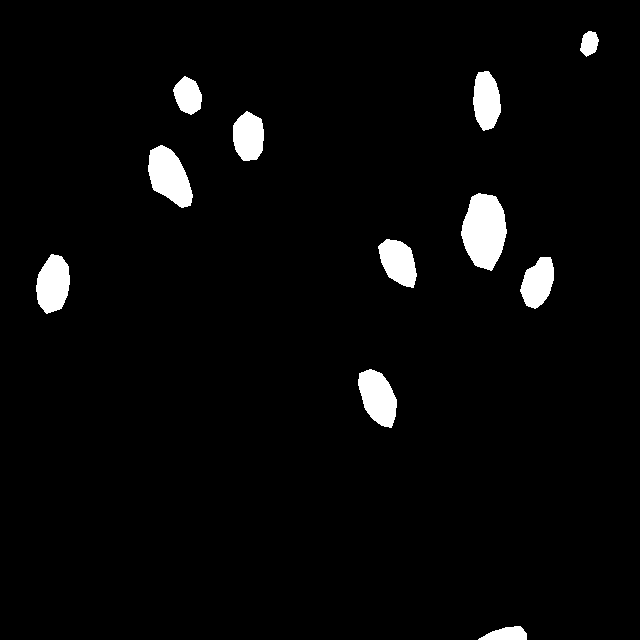

training-146_jpg.rf.0318b24c0c6ec4fcc17e70b0fb64549b.jpg


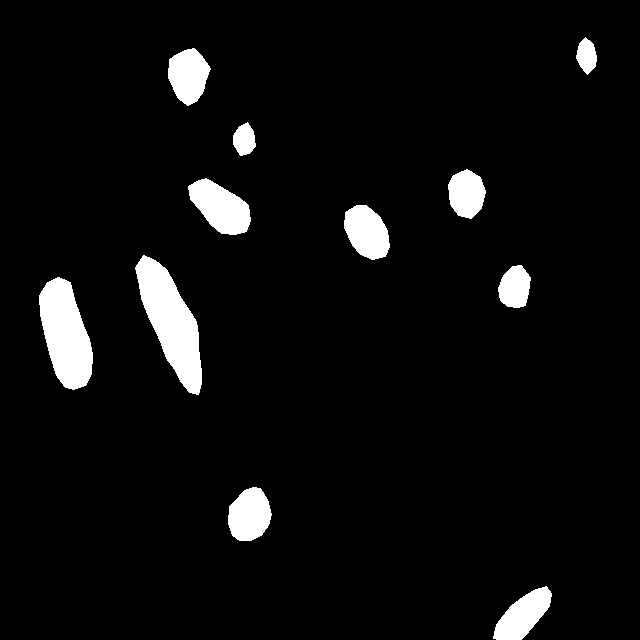

training-076_jpg.rf.1b1519395d441d625ca8fbf97a7cedf0.jpg


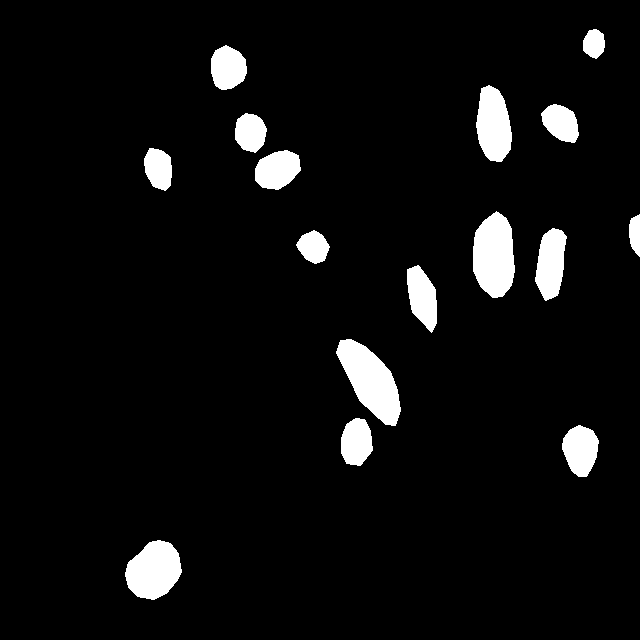

training-145_jpg.rf.0d9e16c9a61ccd7c857f91912cad65b1.jpg


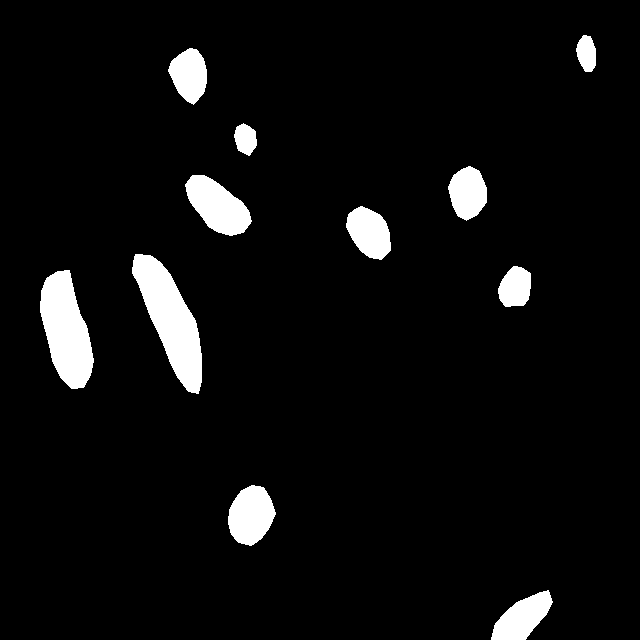

training-141_jpg.rf.18dfe17b9039aa863d1ac66b4cc257d0.jpg


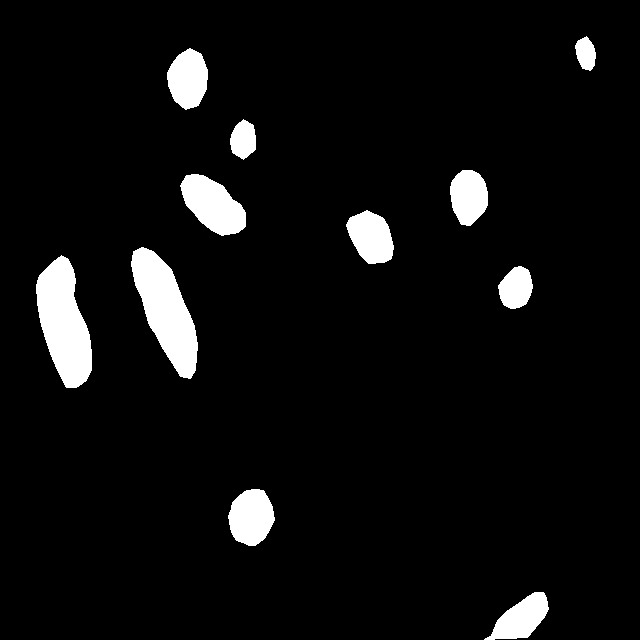

training-126_jpg.rf.22fe4c2dd104d3c183b1a52123fba09c.jpg


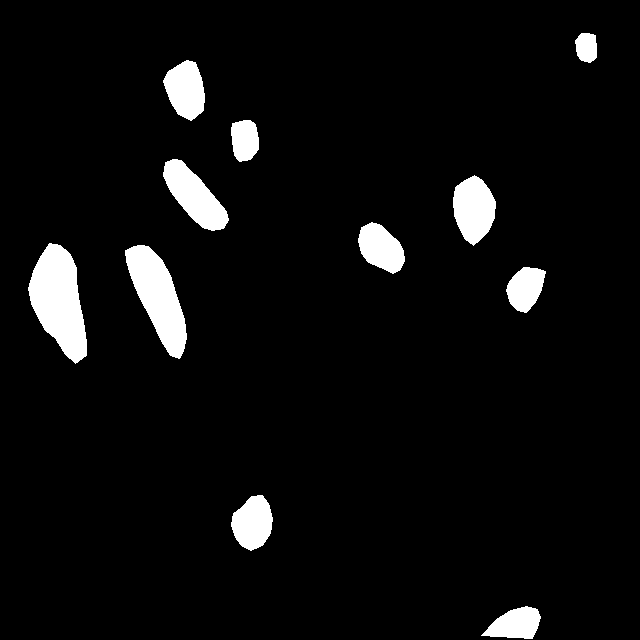

training-160_jpg.rf.0b41a3bed9801f12ad88a601a0934276.jpg


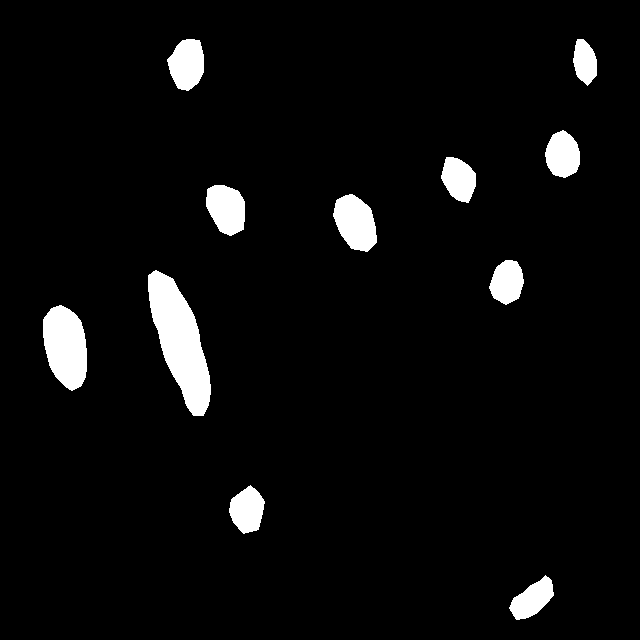

training-109_jpg.rf.11780e1ba2b4c74f62d5156dd191bfca.jpg


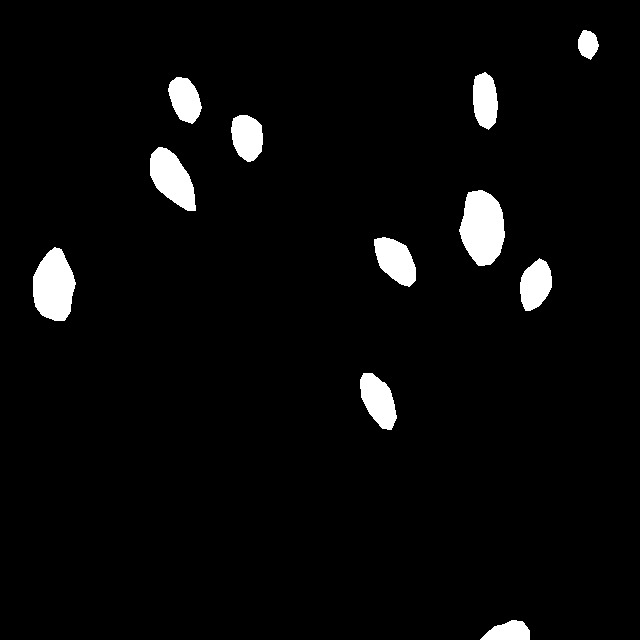

training-024_jpg.rf.17be7996799dd48af20f85f47d5e740d.jpg


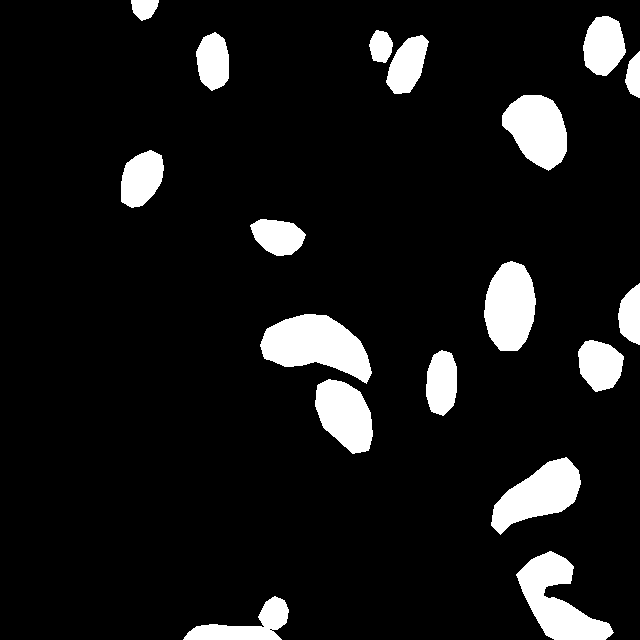

training-066_jpg.rf.21a4655488b3780466b74f31e7628a91.jpg


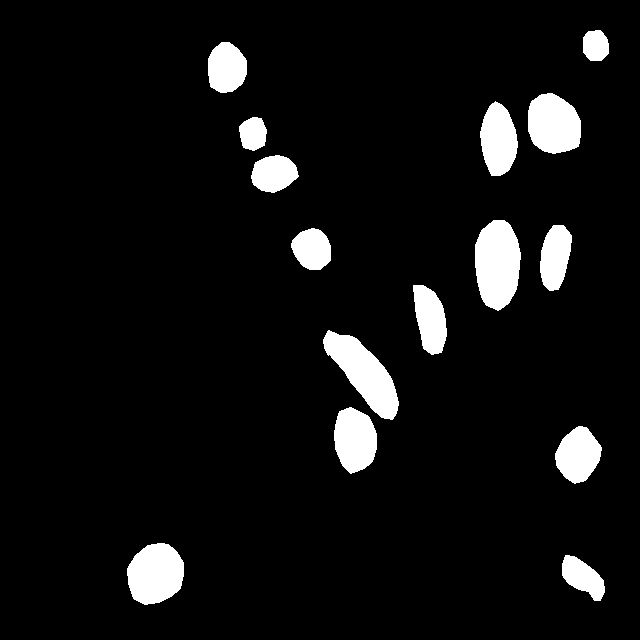

training-102_jpg.rf.2cdc5b439a0e2d8e8486b19cc6957f3b.jpg


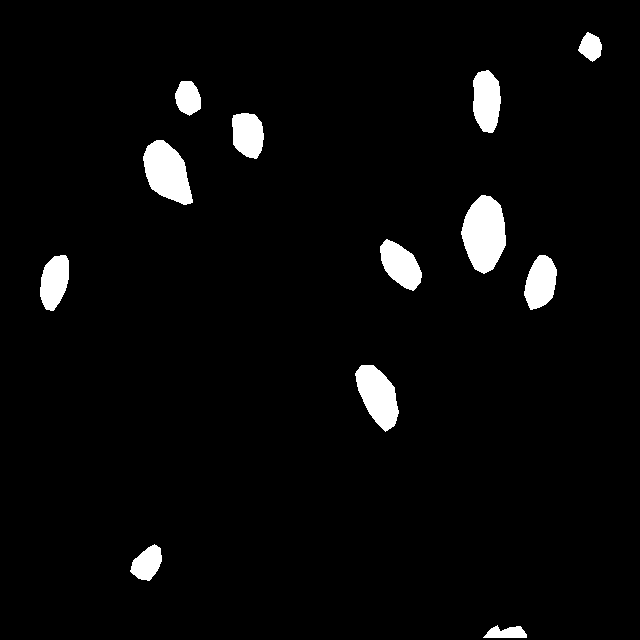

training-149_jpg.rf.1e4d281a5831d2c368e4d9584284d4d7.jpg


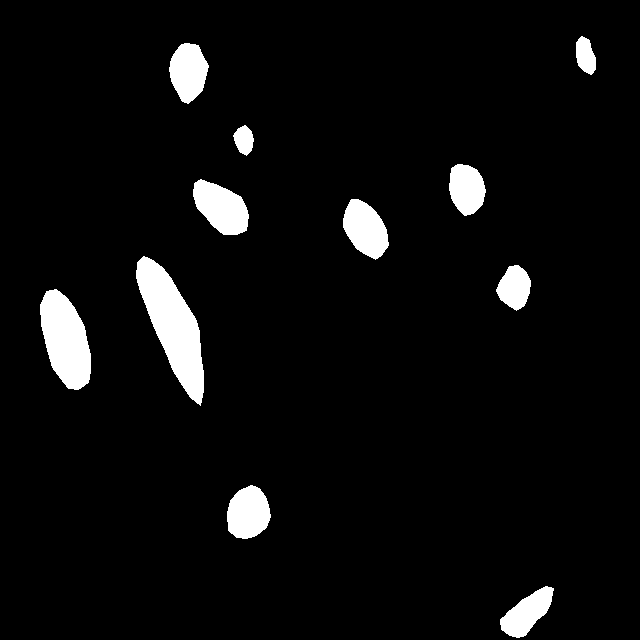

training-011_jpg.rf.26c3537d1e8d52146ce7f3aed18a5936.jpg


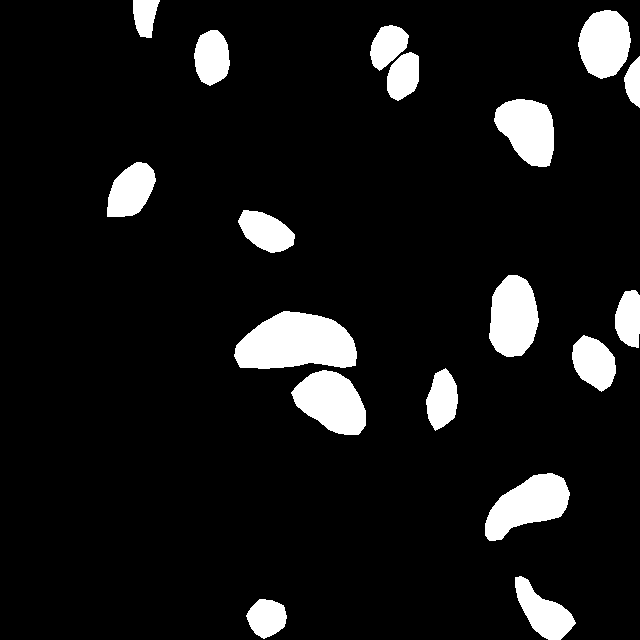

training-084_jpg.rf.1bcad2f62f06e1e77807827084986744.jpg


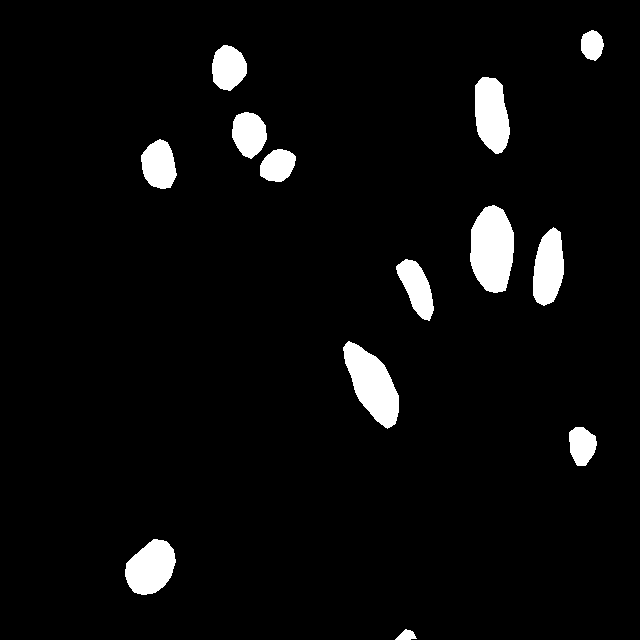

training-098_jpg.rf.20b2a62843f2f508c1167137ee2546df.jpg


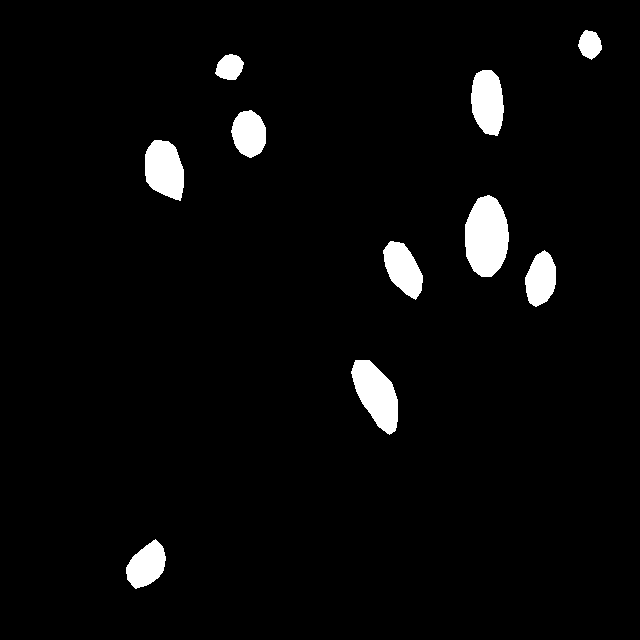

training-070_jpg.rf.23c2fe02ac343d72634ccf0c0ee1506d.jpg


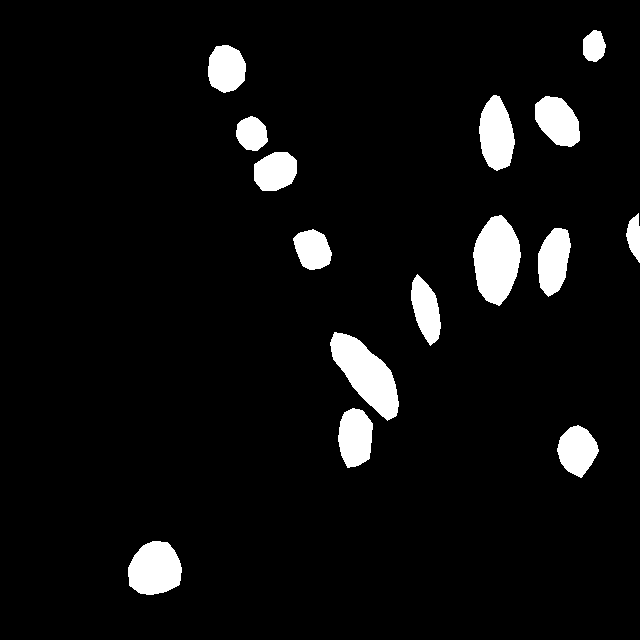

training-143_jpg.rf.22046531768b8f8d823337c0f81eeb80.jpg


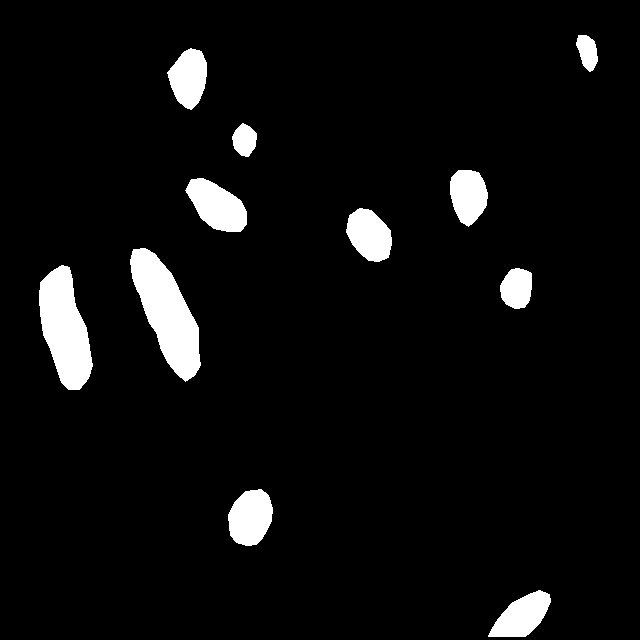

training-127_jpg.rf.041df53f0bb3cff0f28d86b21c9a2f6b.jpg


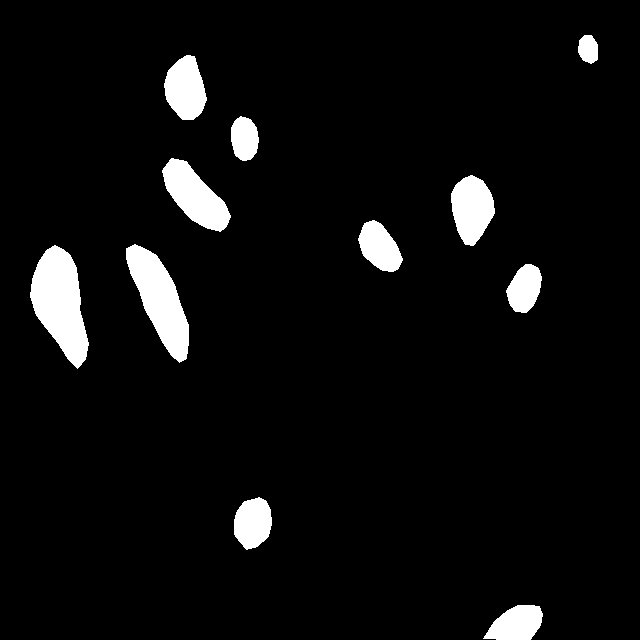

training-132_jpg.rf.213cf4a44c5081f7f6fd39c483c3961d.jpg


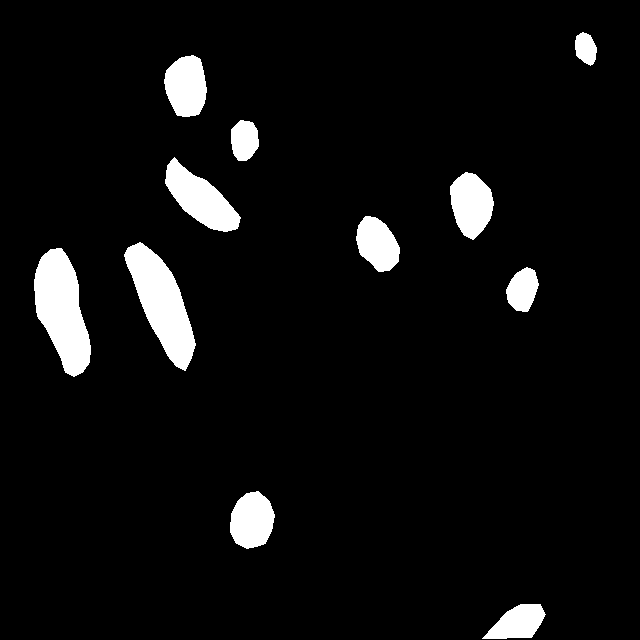

training-157_jpg.rf.2ca1a9d84caf3b5c425d2797feb3127c.jpg


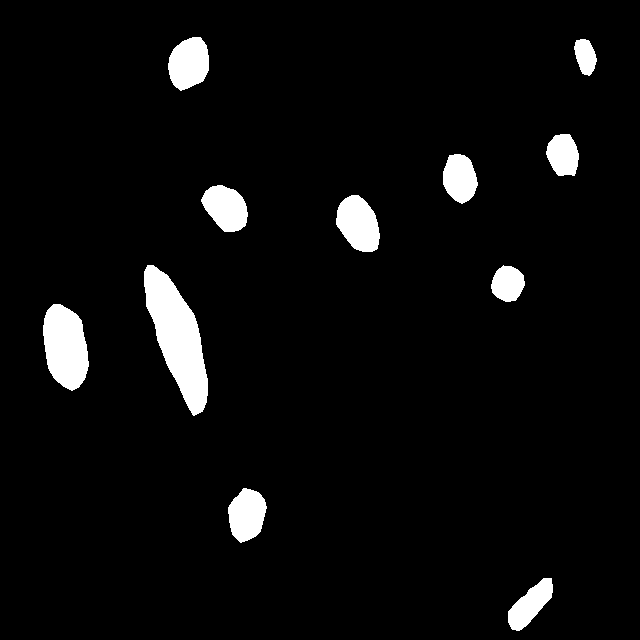

training-021_jpg.rf.2e5d9c5c20e479f26a7c83ea59b67d56.jpg


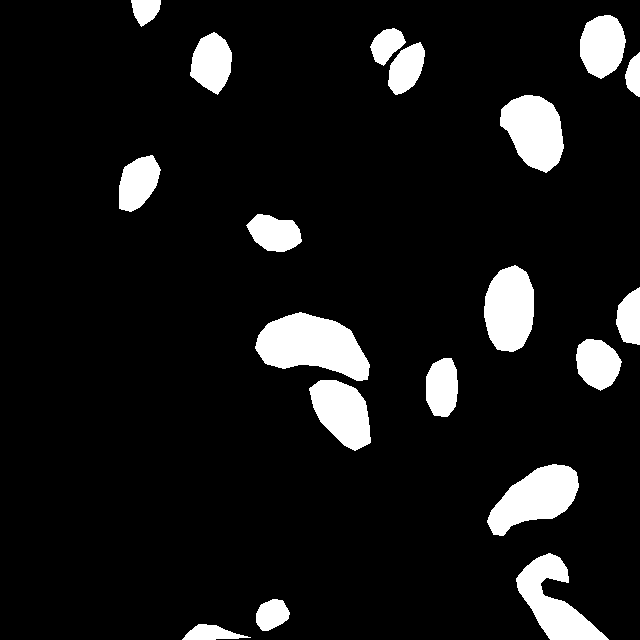

training-091_jpg.rf.38fbab4f12a87494fef9e4b4d66ff36e.jpg


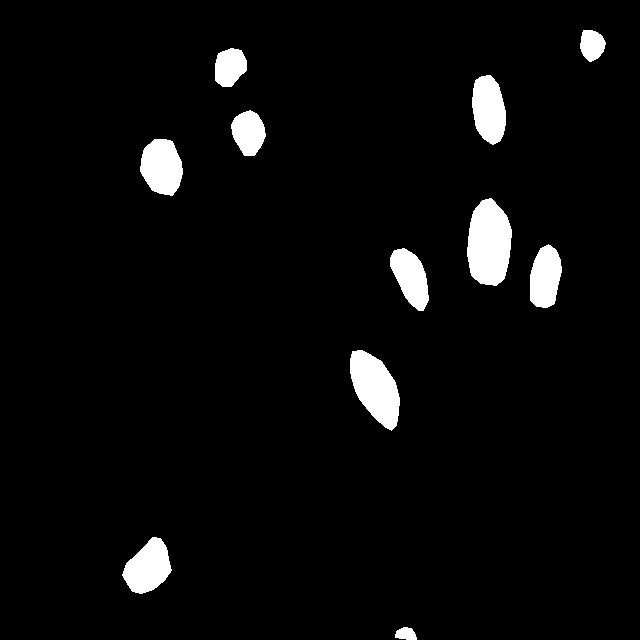

training-067_jpg.rf.23b0d016af49f70930f1f5234ab10224.jpg


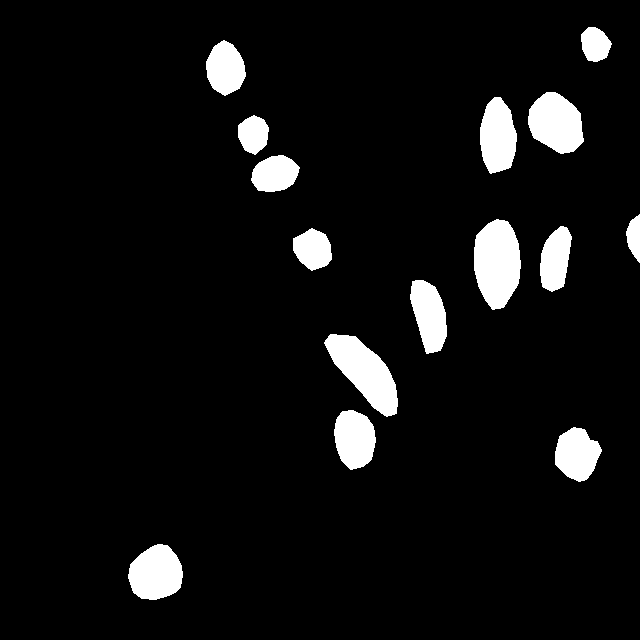

training-040_jpg.rf.306ca59f21c5a360b3cdad4add053598.jpg


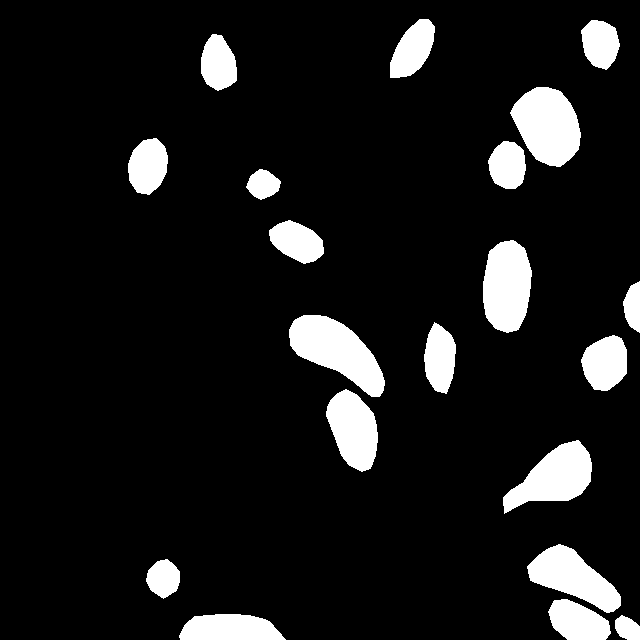

training-051_jpg.rf.41f1b8cf2d454046ab2dcf3139b65d67.jpg


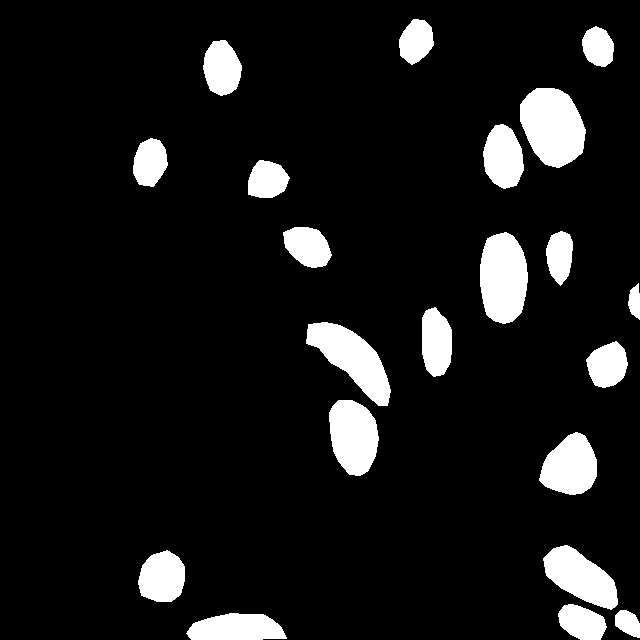

training-034_jpg.rf.2f8e16c368661c90f739f6f707fcb05b.jpg


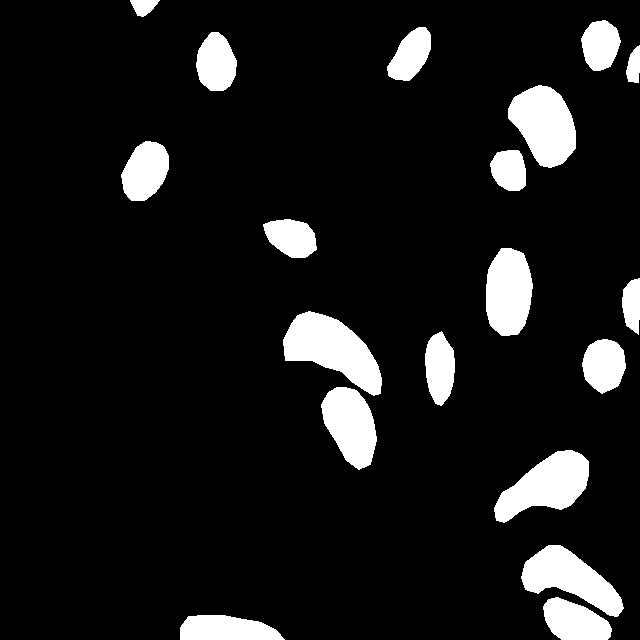

training-052_jpg.rf.42270028d6075913129bdac41fe4cebc.jpg


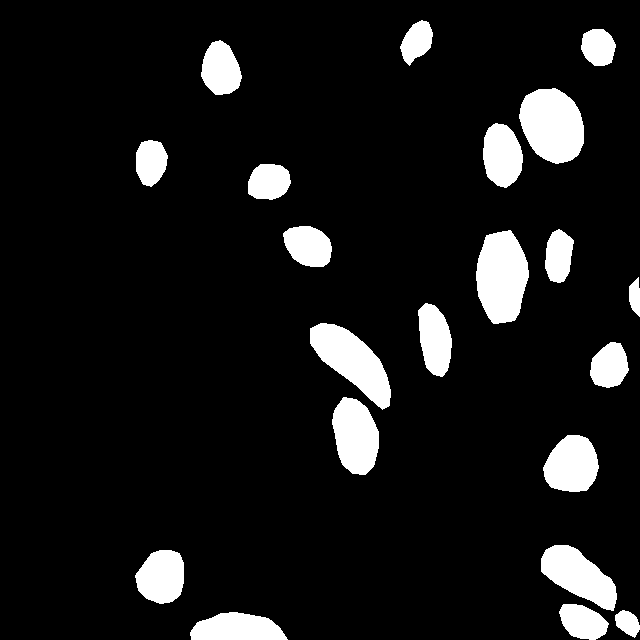

training-128_jpg.rf.33bec863cc82c9e737eeaafb726e5bea.jpg


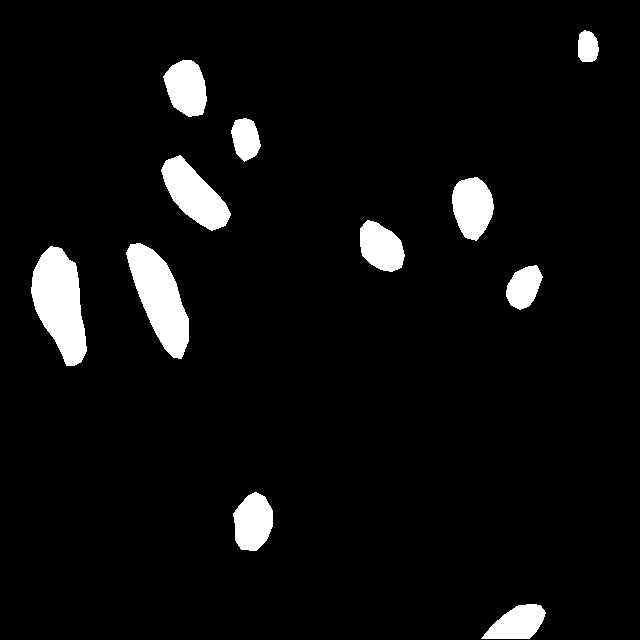

training-122_jpg.rf.433b28e62cce6eccd864554fb8256332.jpg


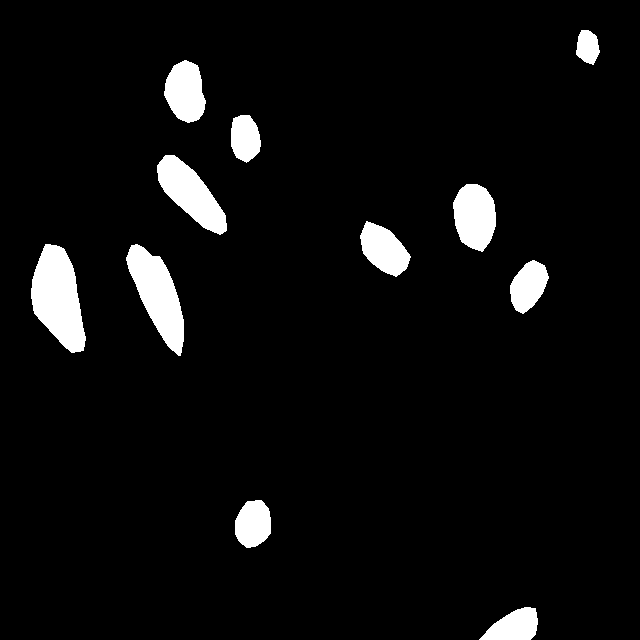

training-099_jpg.rf.3bb5291bfe7845ea3f2e992303881078.jpg


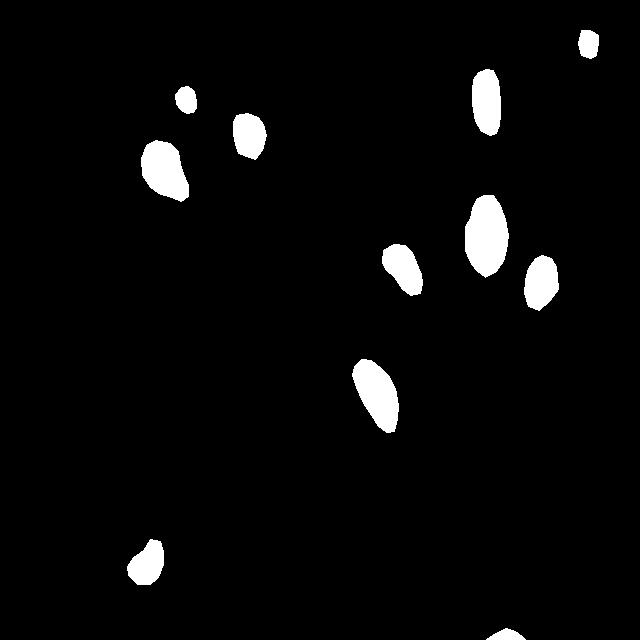

training-057_jpg.rf.31bf2788013f9dc88347eb8a97c3b187.jpg


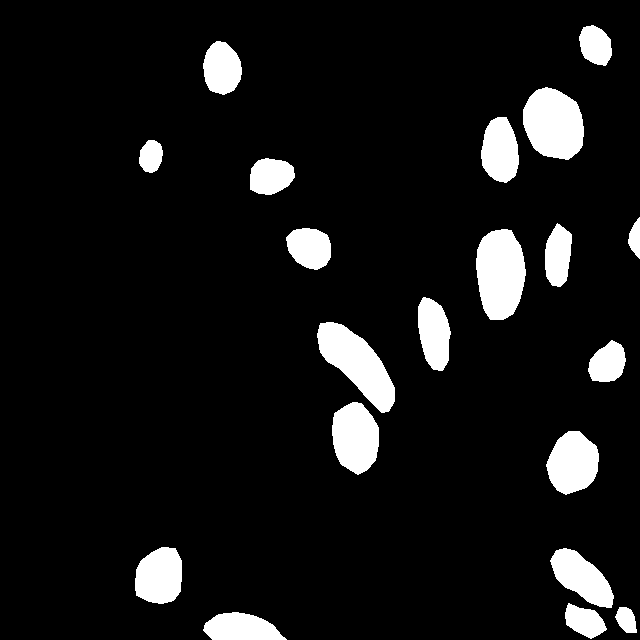

training-068_jpg.rf.2f9fb6ecdca2d14961bfe2a84a9c7975.jpg


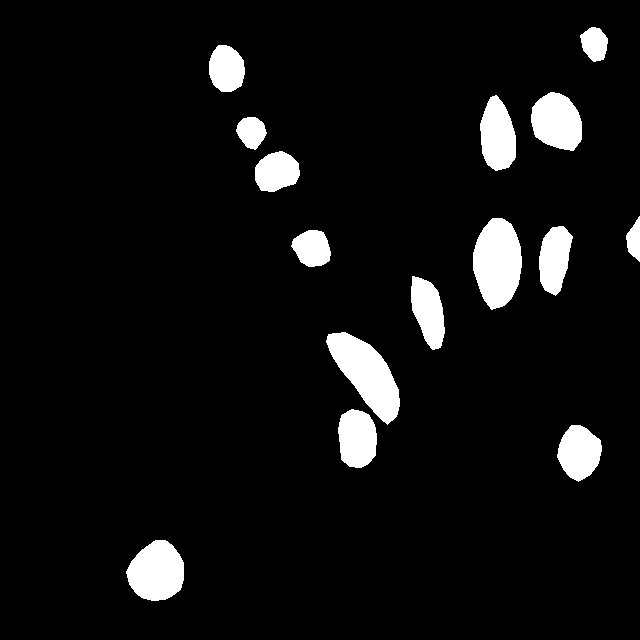

training-112_jpg.rf.4fced0d51aa433d32338299f4f336cb4.jpg


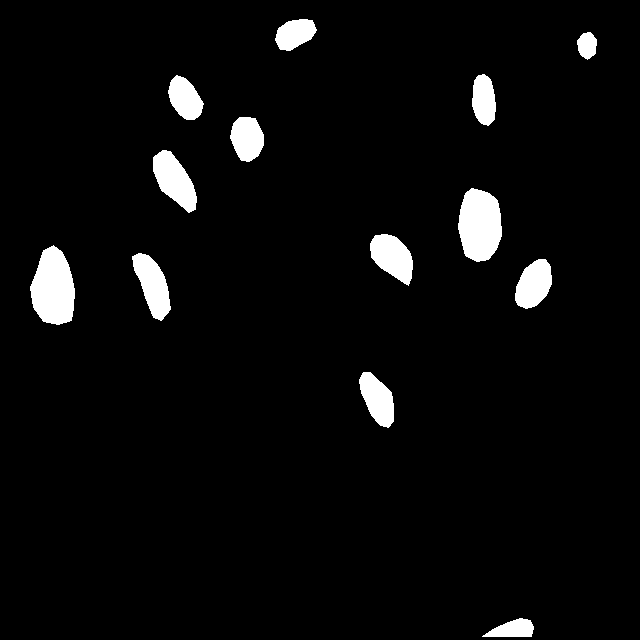

training-159_jpg.rf.2d2b6f84d3fd030dbd26135a1cfaa279.jpg


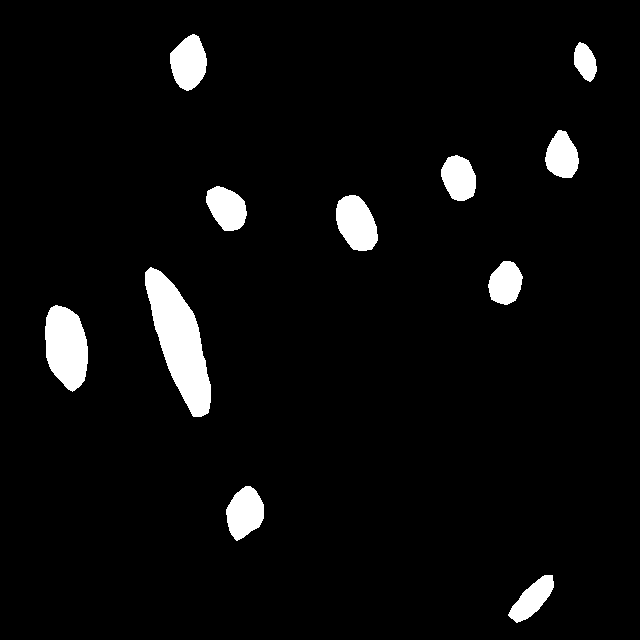

training-092_jpg.rf.4fc7c31ecc7c545c499aeeadafeb47be.jpg


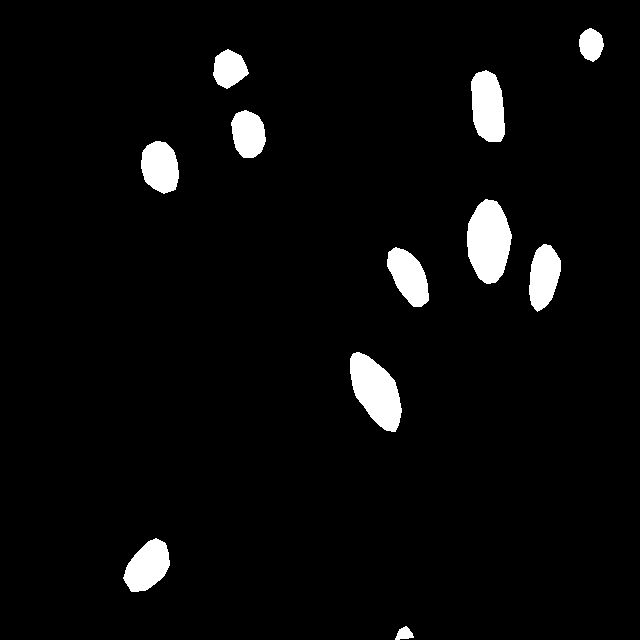

training-006_jpg.rf.4818ecf61d2b211ac35afa47c718817d.jpg


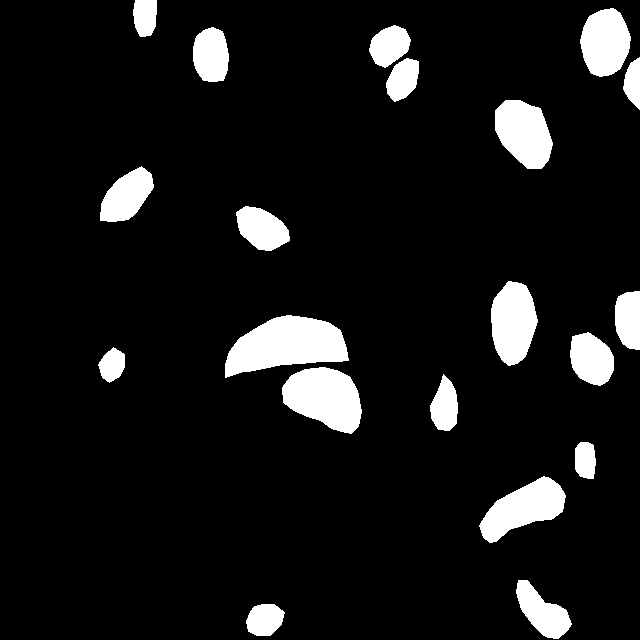

training-009_jpg.rf.39f4fe1501a533ae0fabd3e83ed00e2c.jpg


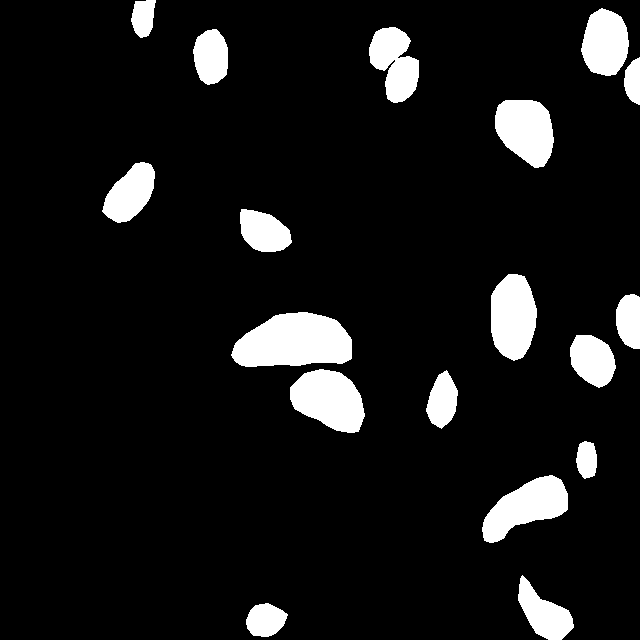

training-138_jpg.rf.45e8d1d96cd5ee9a610e8b8d44923430.jpg


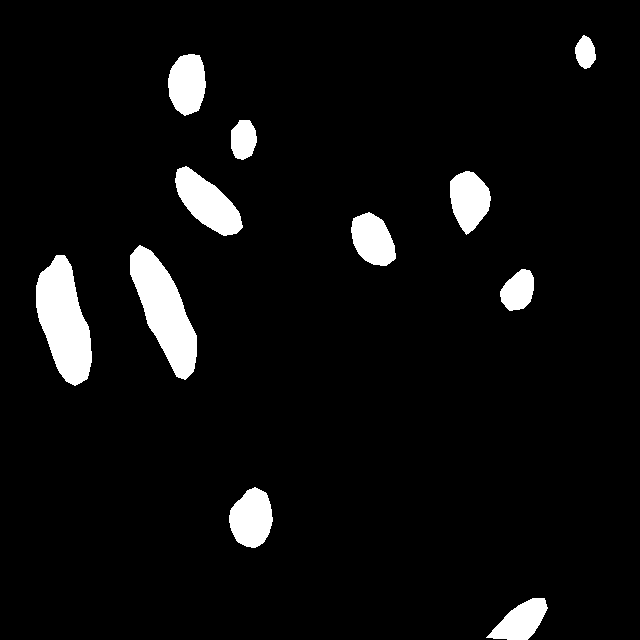

training-095_jpg.rf.4ee804fa52cdaef3411ee2c4c973cc7e.jpg


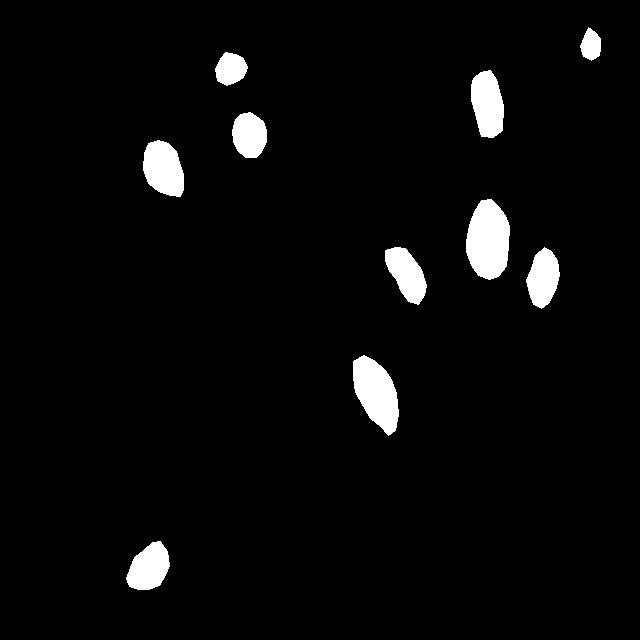

training-036_jpg.rf.3ab9d817d7cd0b5442d5005c1253e17c.jpg


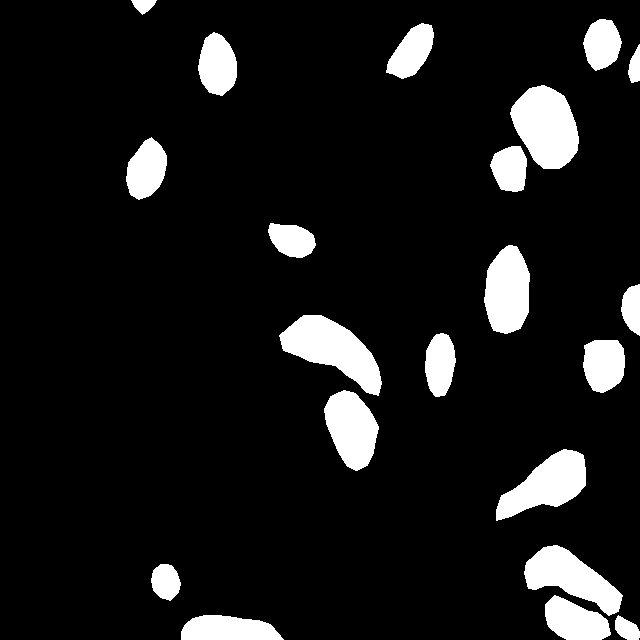

training-103_jpg.rf.64449523a401fd205a5b6a78f86c954a.jpg


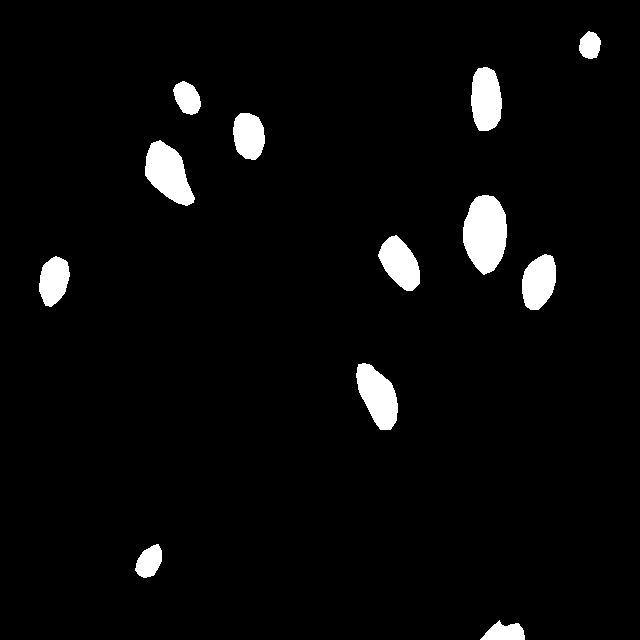

training-031_jpg.rf.5bcc3b4c74c3aa80712c9374c766bb2d.jpg


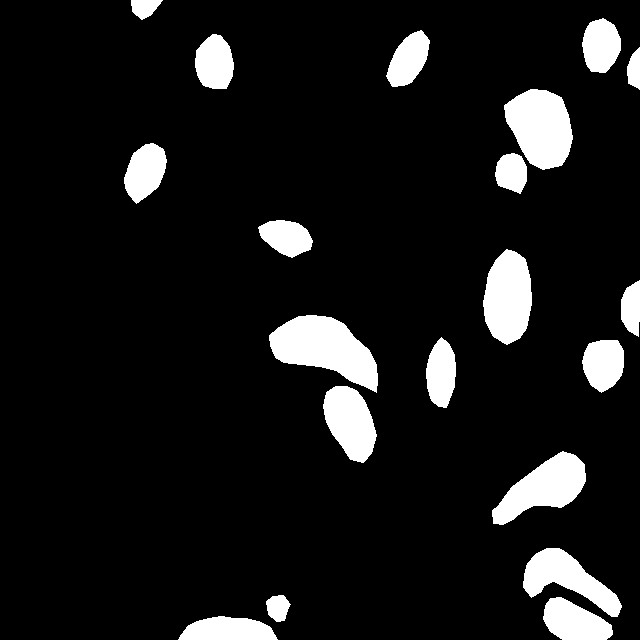

training-045_jpg.rf.60a732f8b3a1441f7ccb79fc0c95d180.jpg


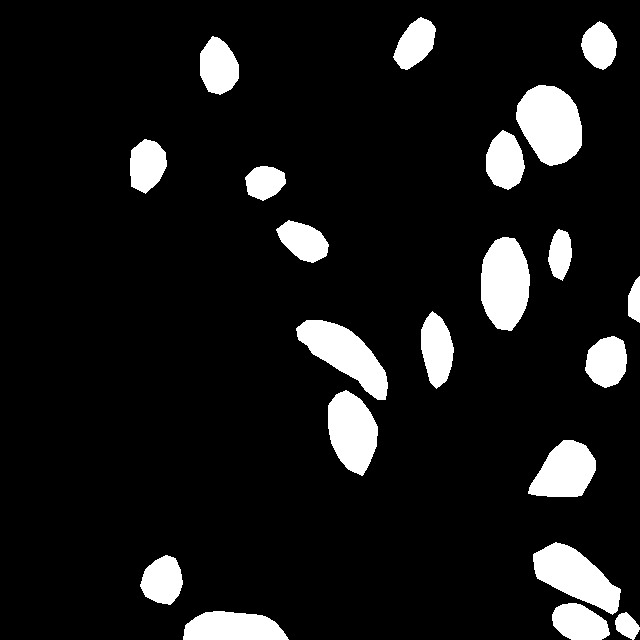

training-125_jpg.rf.3155b2bb38e9c9fb4b8d62482d1c849b.jpg


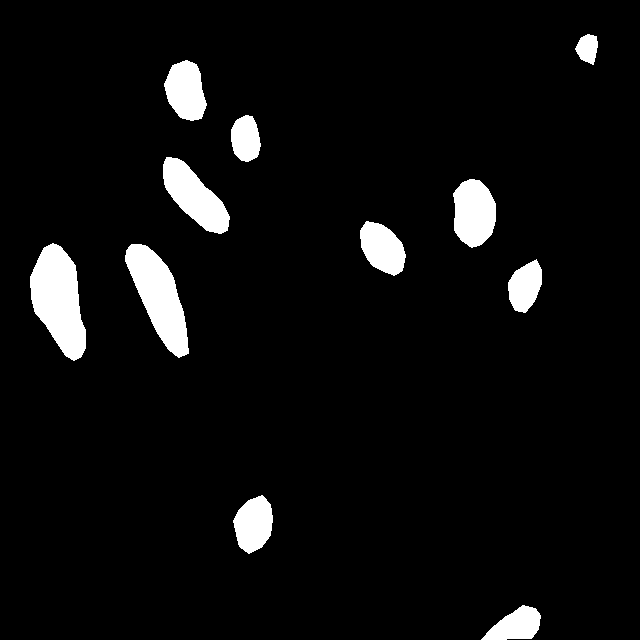

training-053_jpg.rf.672e831f52e1ff9f9d02c7c78901629d.jpg


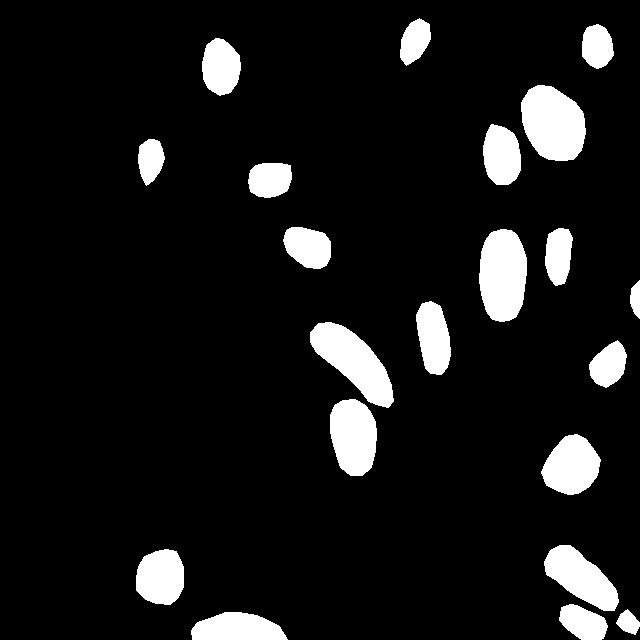

training-116_jpg.rf.4f405d9162bbe90d22bed7254a294bba.jpg


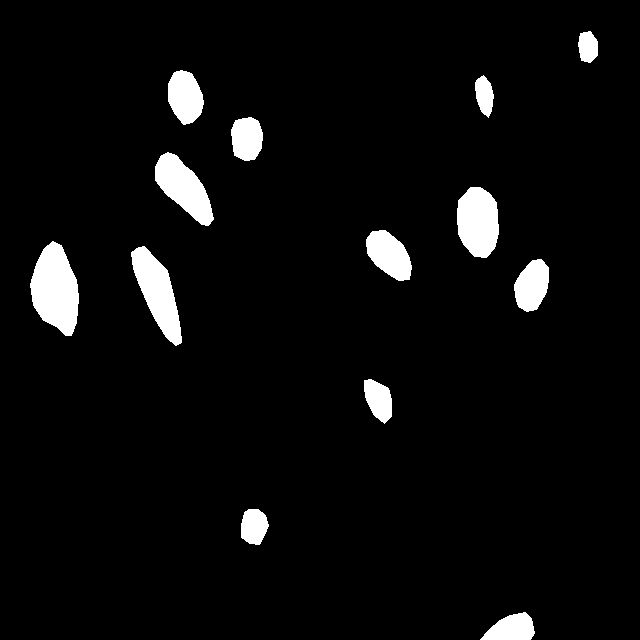

training-090_jpg.rf.2ea397beded0c961d4e4923da8f810aa.jpg


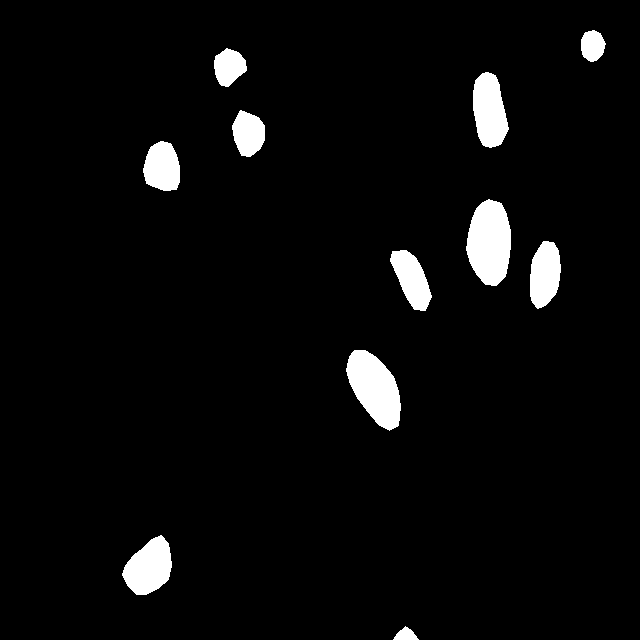

training-056_jpg.rf.4a13dea05a600d567af096e7b54615a8.jpg


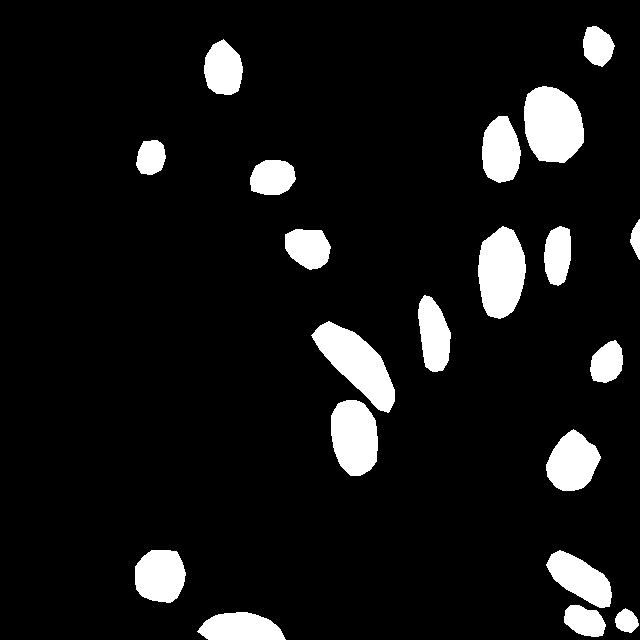

training-142_jpg.rf.59bc9d50bb7e37ac176e62c697060af0.jpg


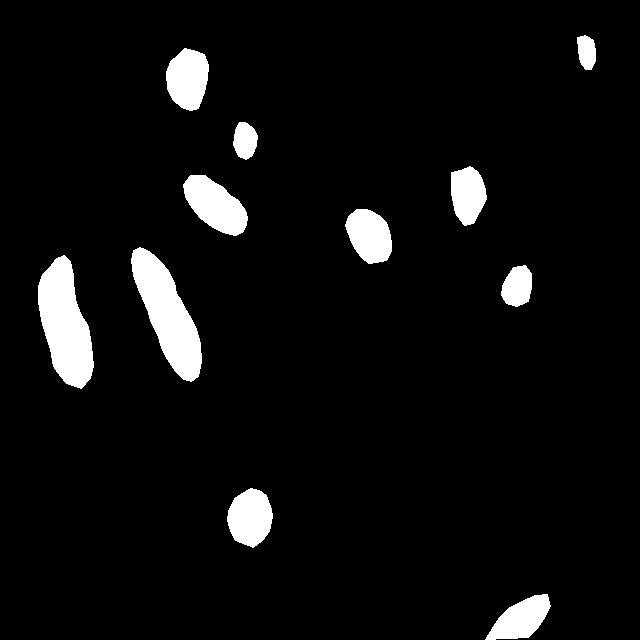

training-042_jpg.rf.683a127134aa8ad0c073665b2e3049b2.jpg


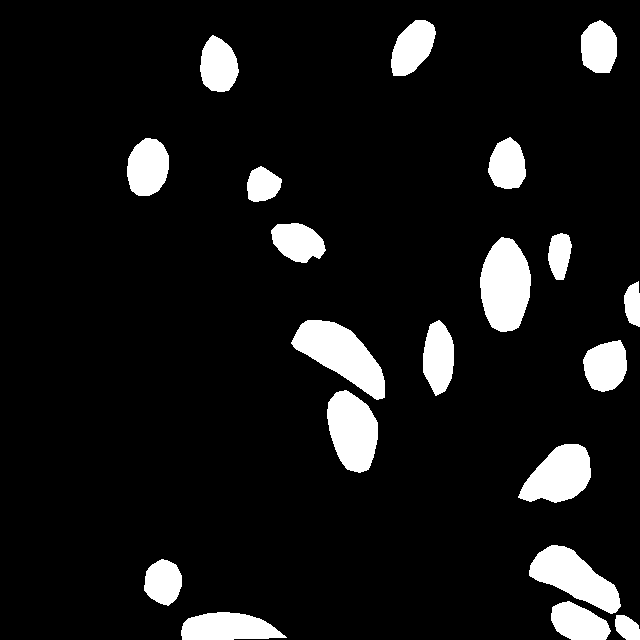

training-119_jpg.rf.7c5f68bb817c30867629c69b19b595ce.jpg


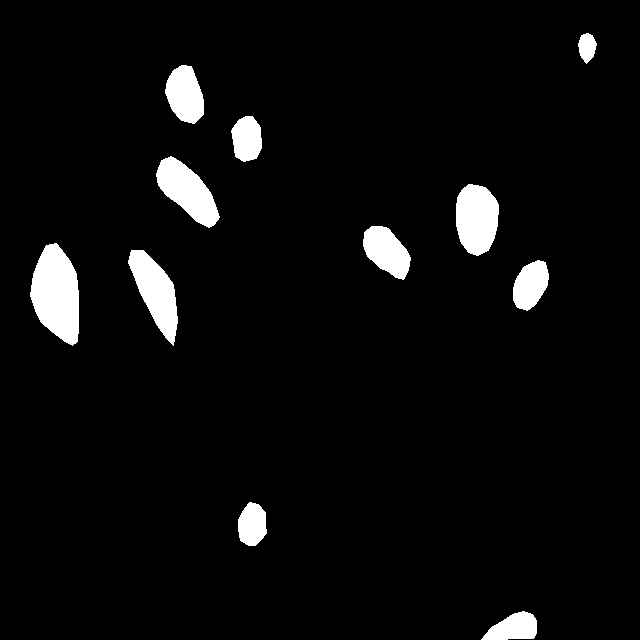

training-120_jpg.rf.72dd9cd09fd3ccc9c859e26372a9ded7.jpg


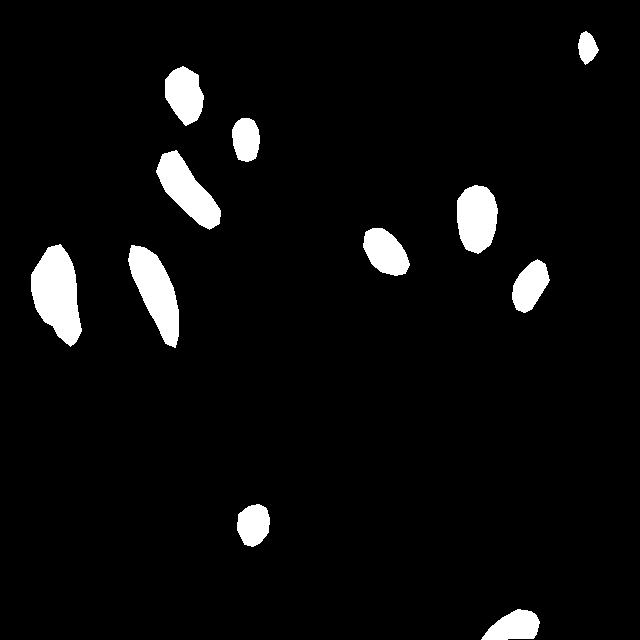

training-046_jpg.rf.63abae95aae9462b3e67bcf84ad2fd42.jpg


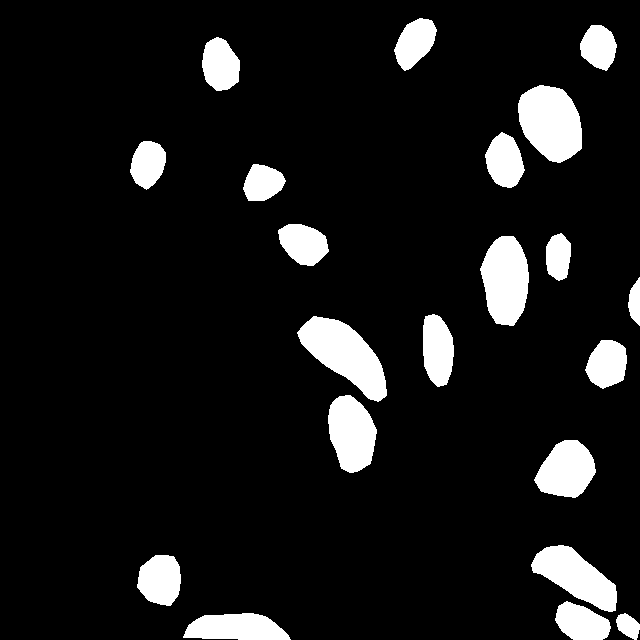

training-038_jpg.rf.5753f46e524fad2fd9038c35cc50c0b9.jpg


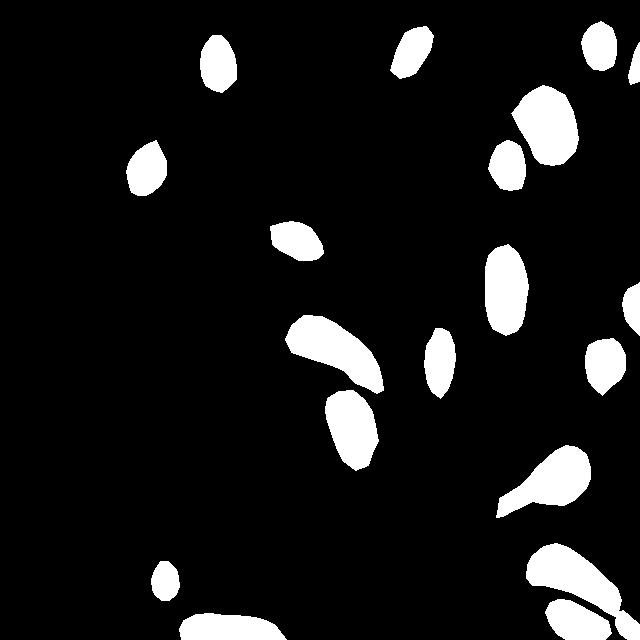

training-019_jpg.rf.772115eec5ada1597c2a8fa7ebc8ca8d.jpg


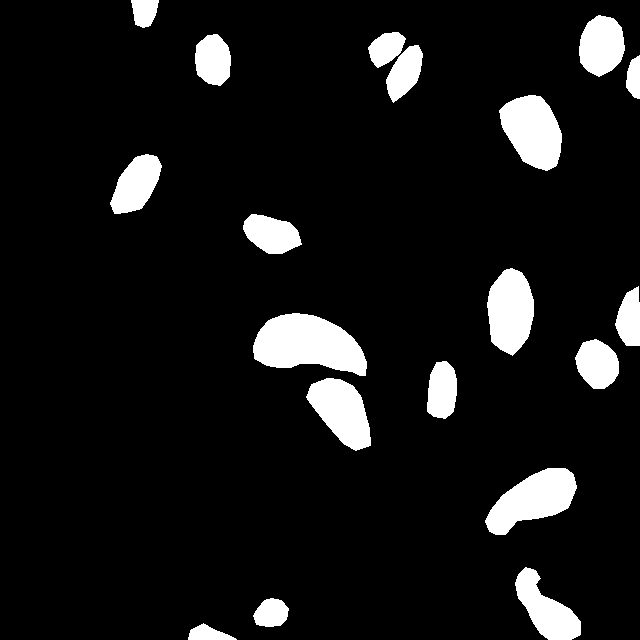

training-005_jpg.rf.850822d6e229245efe5e477571e22081.jpg


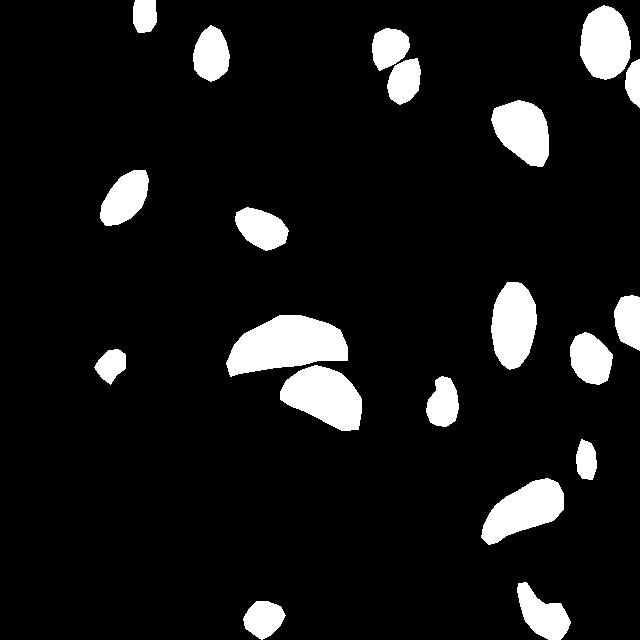

training-133_jpg.rf.6595f41cc5cf17a6d199552c06d4fd54.jpg


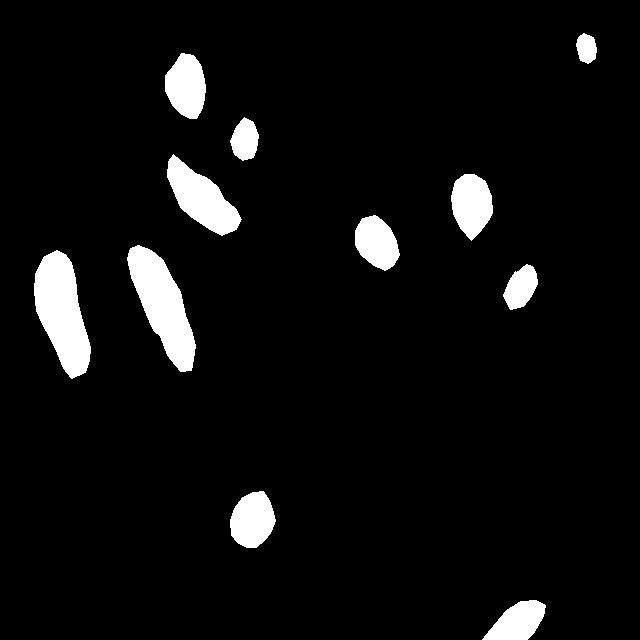

training-026_jpg.rf.7fea5ca86e05223c148248741d1402f9.jpg


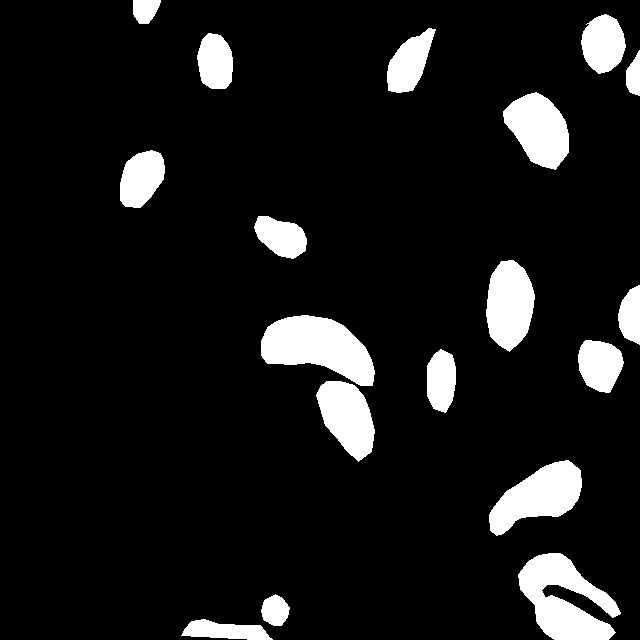

training-071_jpg.rf.68d8825711652d8286035d99d982c988.jpg


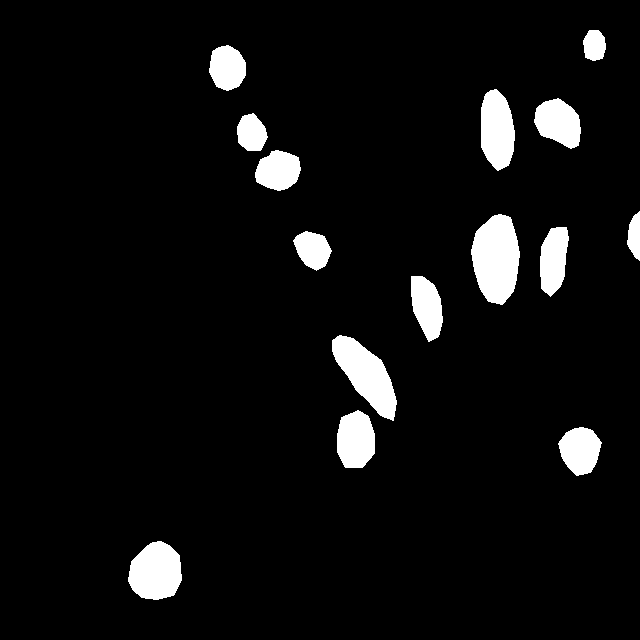

training-134_jpg.rf.80fef21d85f0a035ce2f842bf229bd2f.jpg


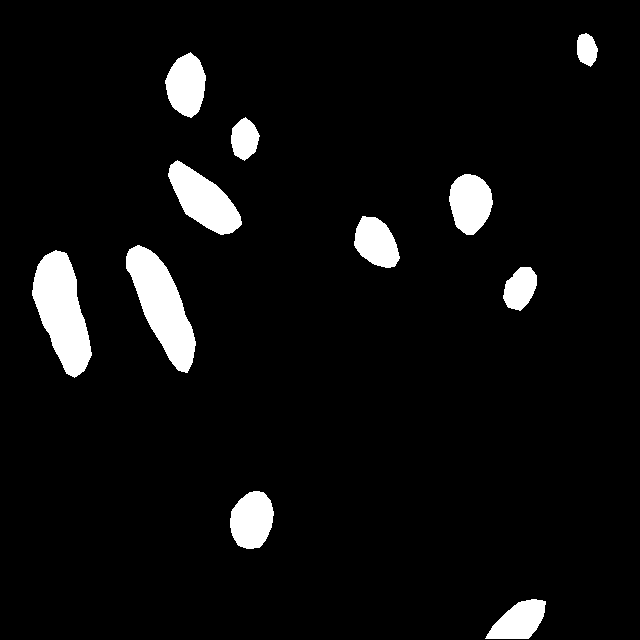

training-013_jpg.rf.674e5d65d3ea9f2eb721cce31d6fadbd.jpg


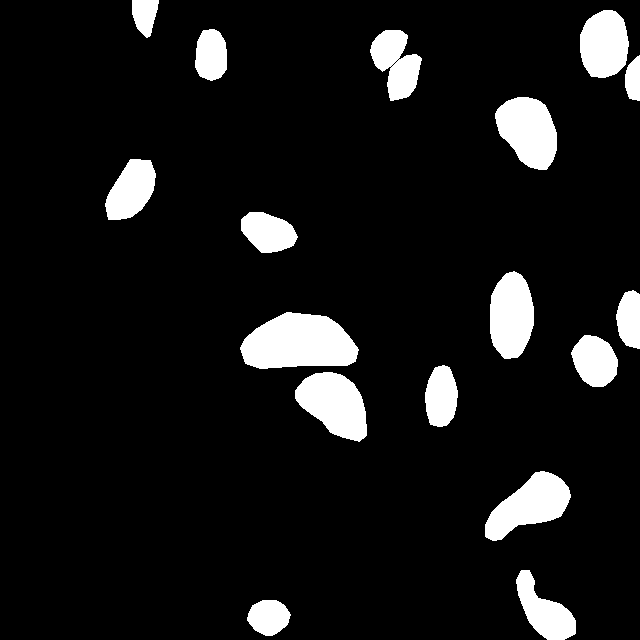

training-075_jpg.rf.94510589cc403821e533d51aa9765ad1.jpg


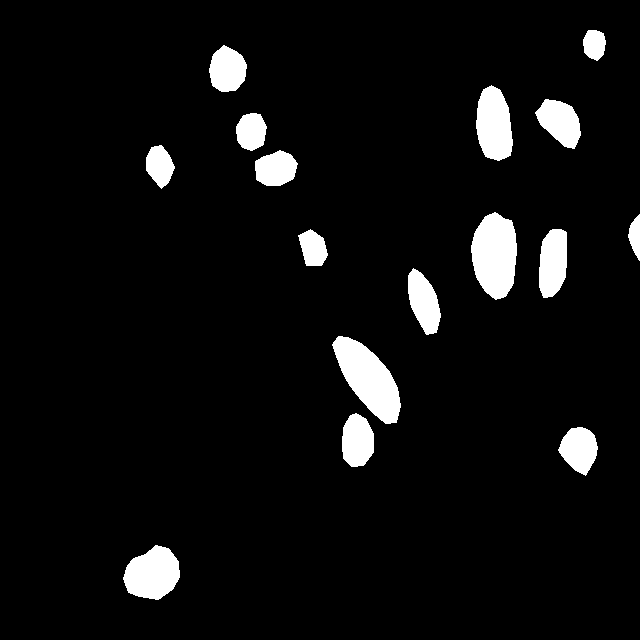

training-082_jpg.rf.90442ba21a37d43bd1ed6c09957e3309.jpg


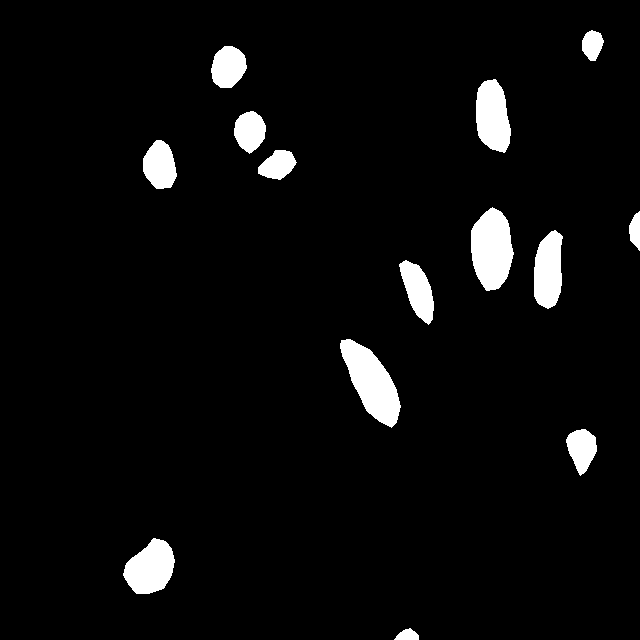

training-008_jpg.rf.8b4ab8b57c6c942acc351efba32439c5.jpg


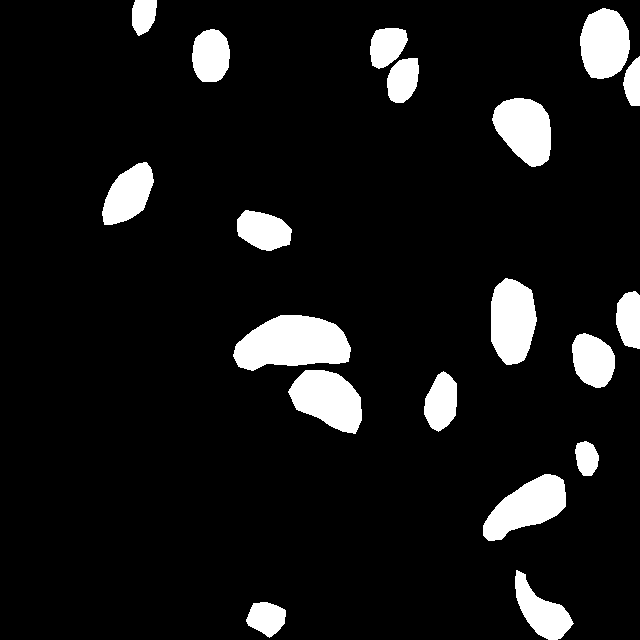

training-062_jpg.rf.67bbf5b1f76a7763d346cc61d3b2be38.jpg


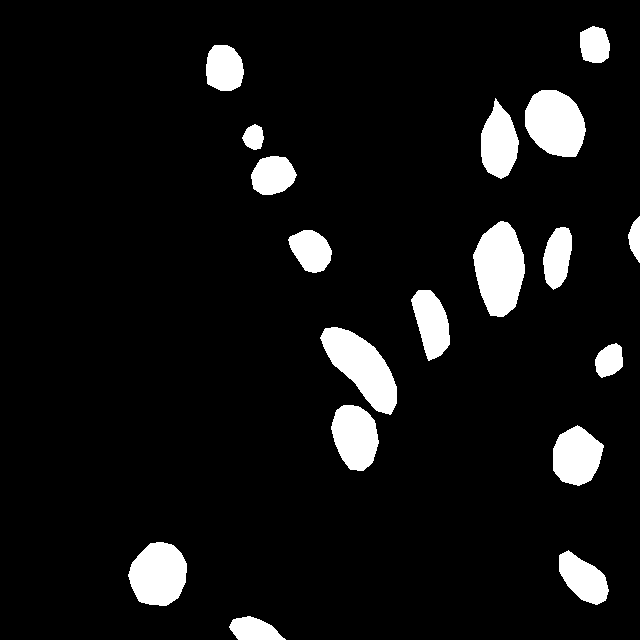

training-089_jpg.rf.658e54943df0138e8aed7fcdbb8fec55.jpg


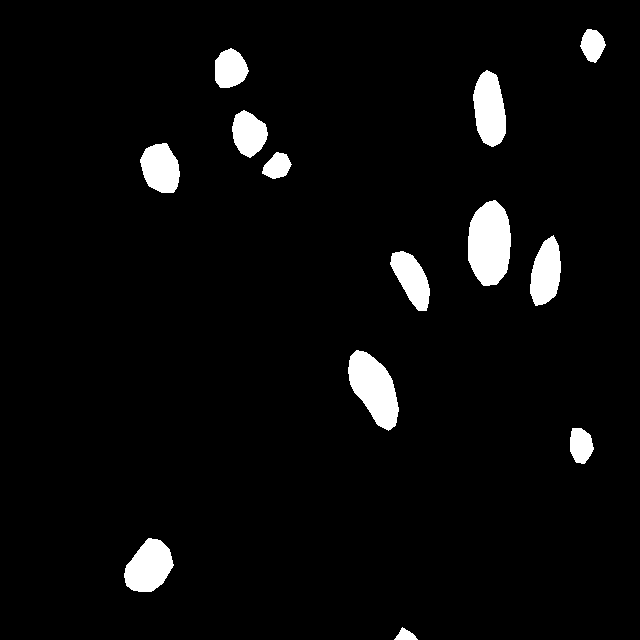

training-158_jpg.rf.6b11ba662d5785b5018c398254aeb289.jpg


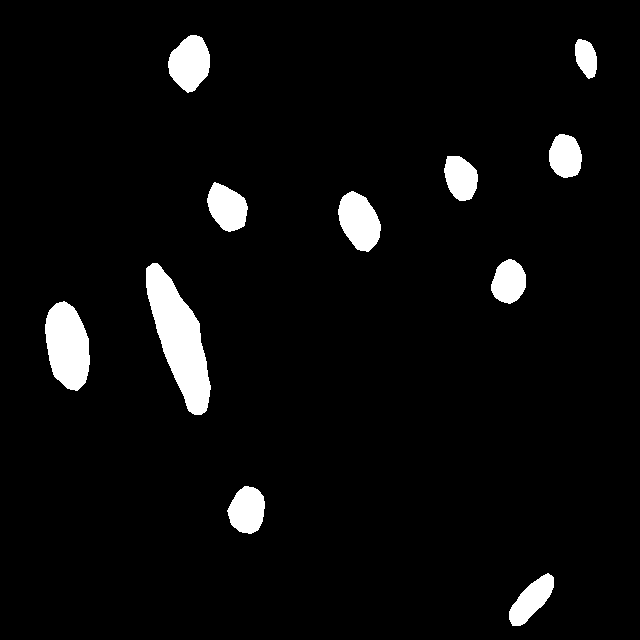

training-163_jpg.rf.87c213aa66b08ff12510474e0b4c9808.jpg


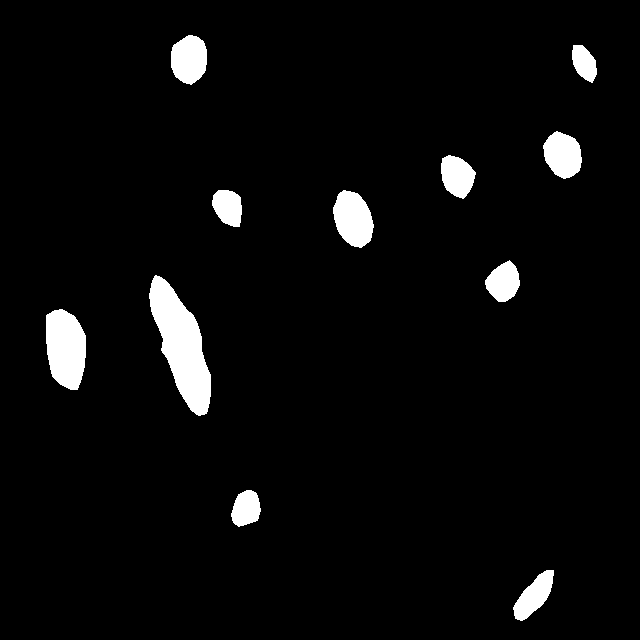

training-097_jpg.rf.8b42da92c4f8cc4d60d295c55b140ee9.jpg


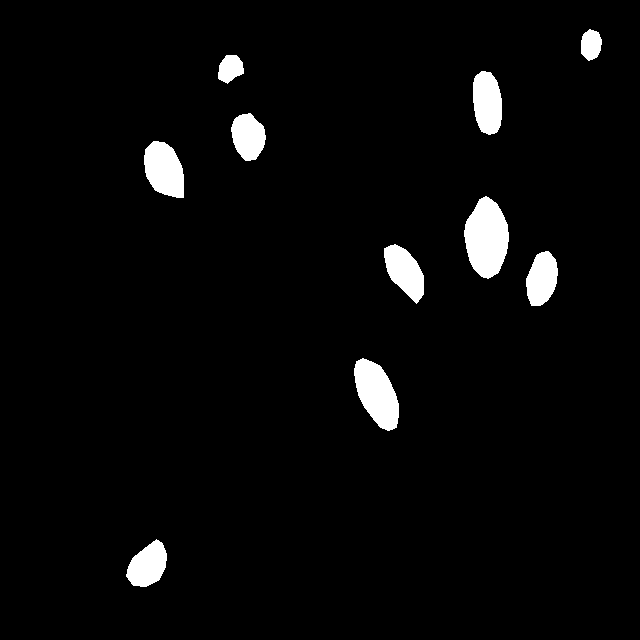

training-014_jpg.rf.3ba810de46b45ccc2714d6c3752b52ff.jpg


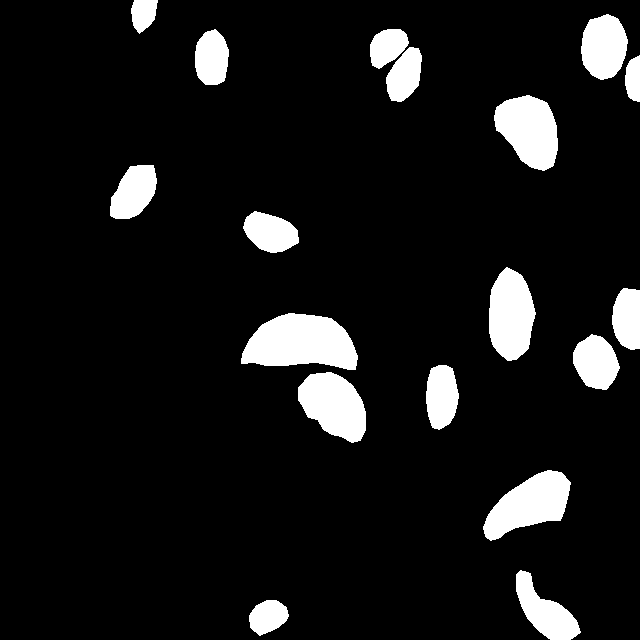

training-059_jpg.rf.89c725931a0bb15193b7f26578ad70a4.jpg


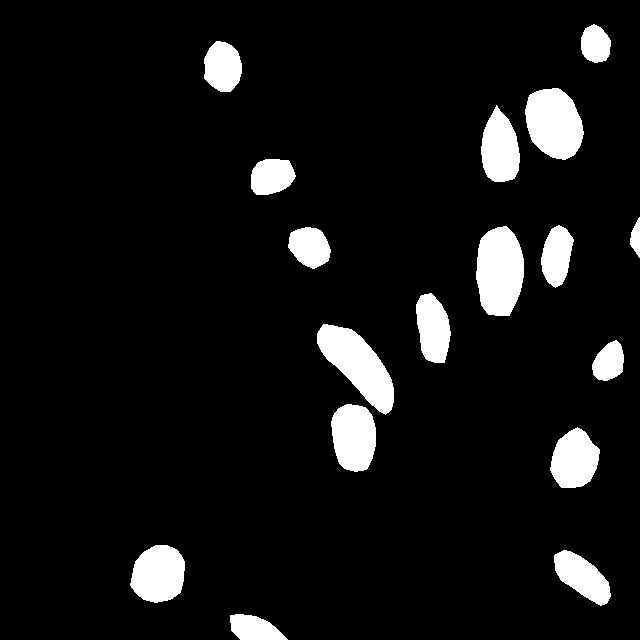

training-039_jpg.rf.693efa82ba36bbafddf4ccf3a7ecf013.jpg


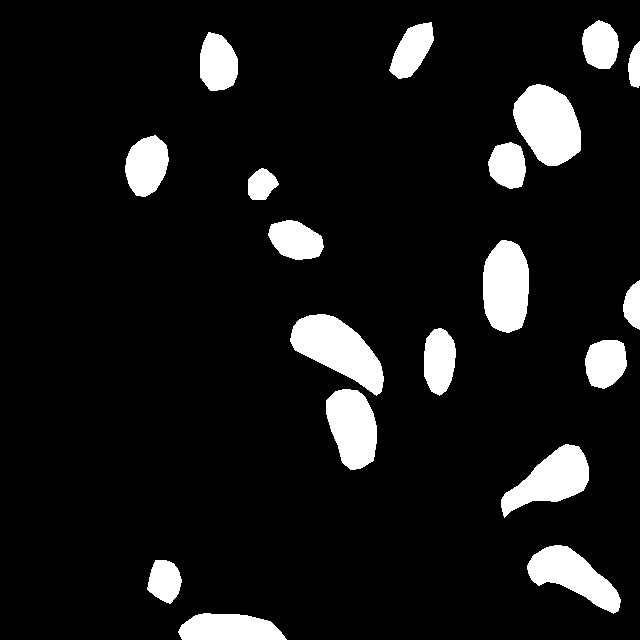

training-048_jpg.rf.5785d680ae716a1d68e57baa334cecfa.jpg


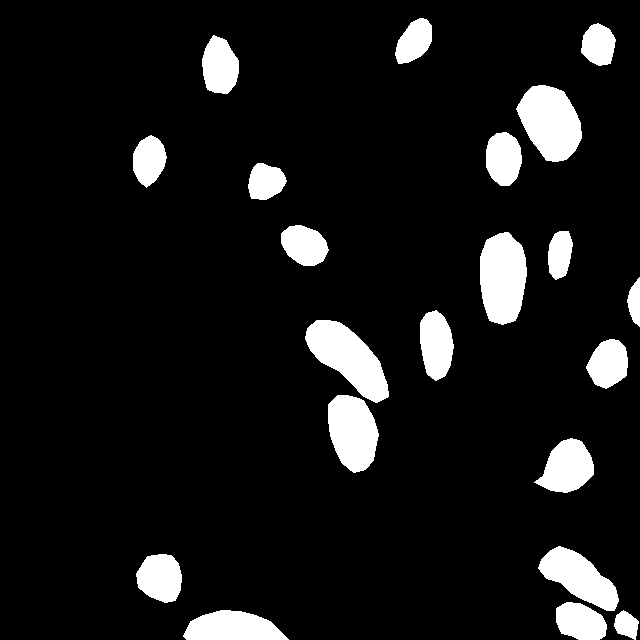

training-047_jpg.rf.9ca7644962c88a387e888365a9968bc0.jpg


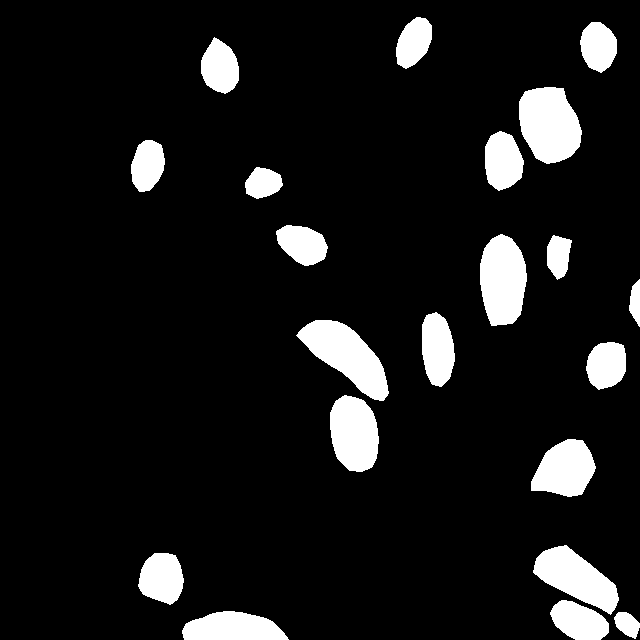

training-069_jpg.rf.a0976e481ca06fe62d7340e80990735d.jpg


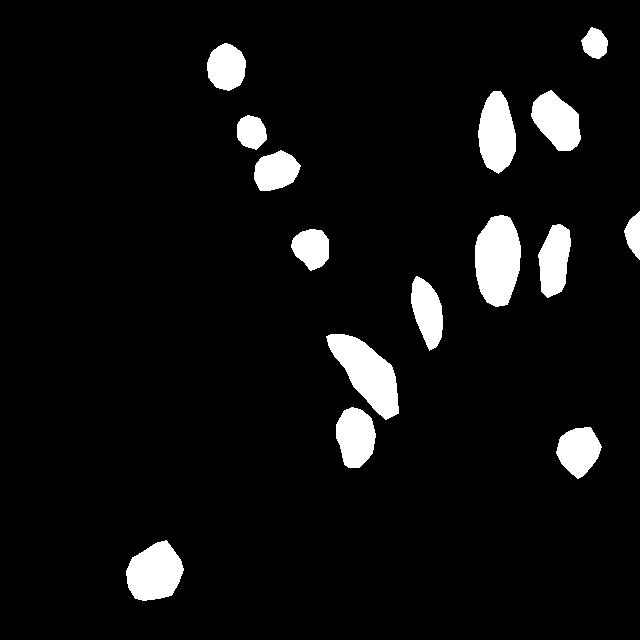

training-065_jpg.rf.94a5e0adf37279f29682609eb6d89abf.jpg


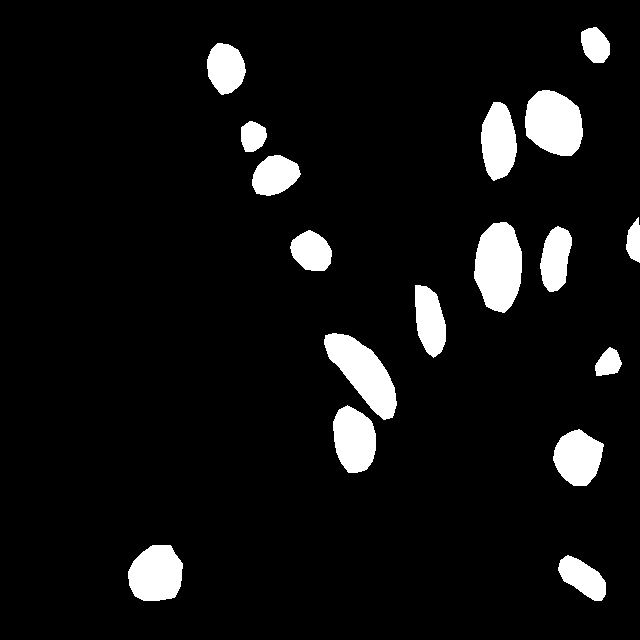

training-074_jpg.rf.841f32d1ff96bb86feb996e226de1696.jpg


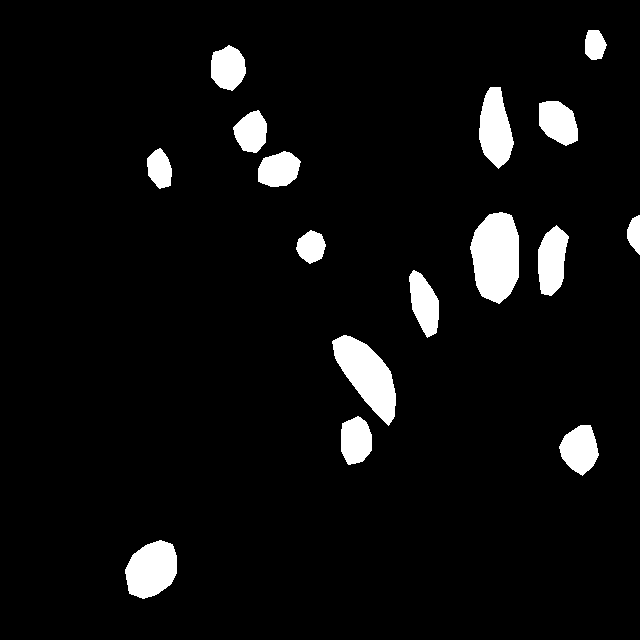

training-072_jpg.rf.a042f366d687840722dfc67ef59b8d97.jpg


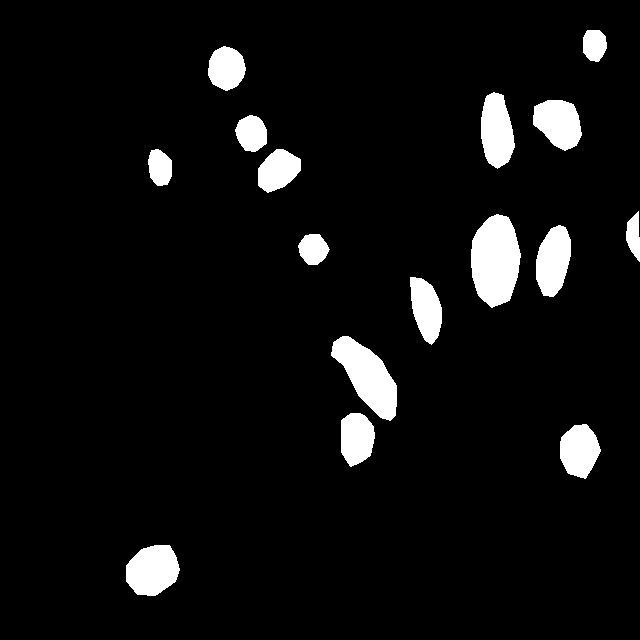

training-058_jpg.rf.954906ebaae4167fd10567feea16f95f.jpg


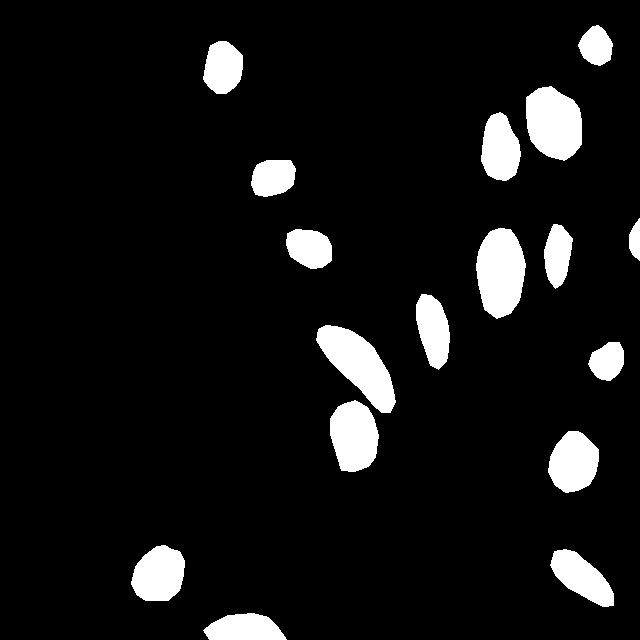

training-124_jpg.rf.aa171efe674ff2f56c11ebe6af62dc93.jpg


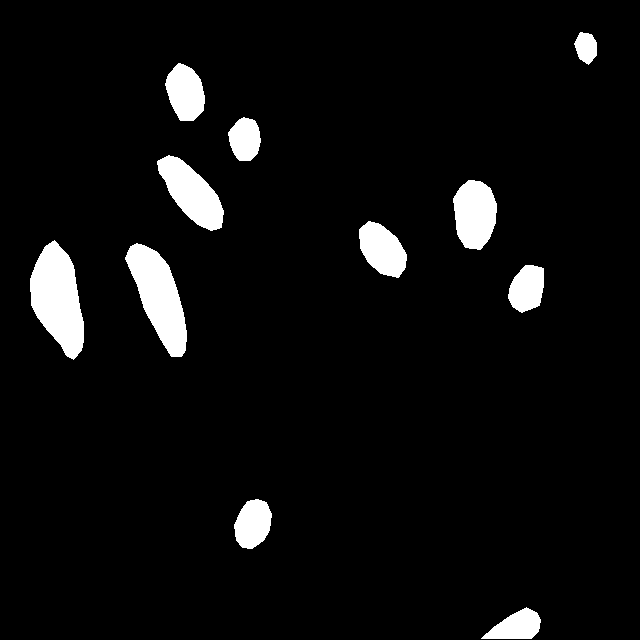

training-044_jpg.rf.9eb109b65b38636767e6855b465dc2c5.jpg


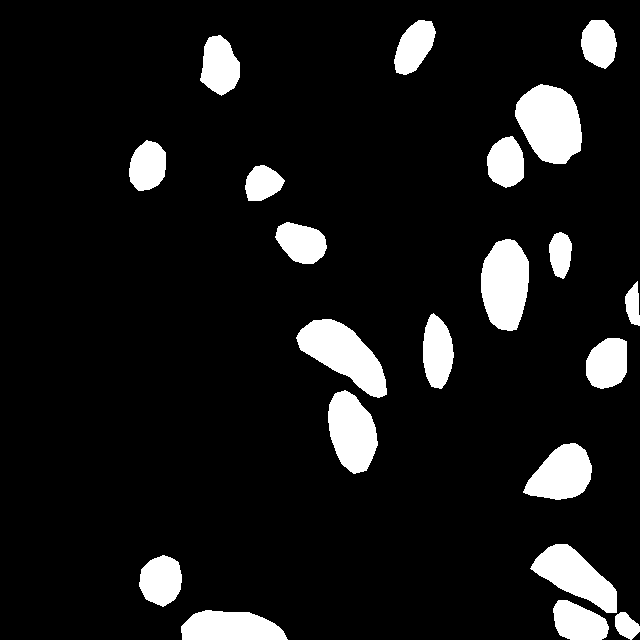

training-140_jpg.rf.a4a998b99906cb34b4b3ccb5d081008b.jpg


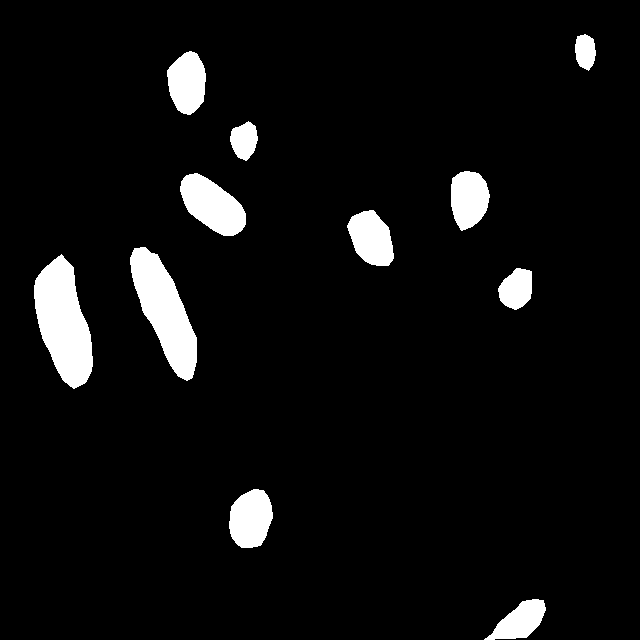

training-101_jpg.rf.9479b33aa76ce9ed40d0c9d463391efc.jpg


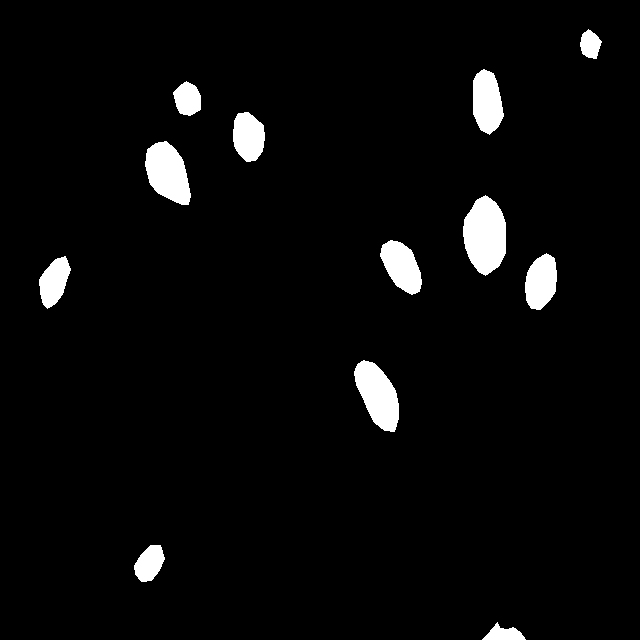

training-050_jpg.rf.a30cd5d7c9d59d13f92fb90d2840bba4.jpg


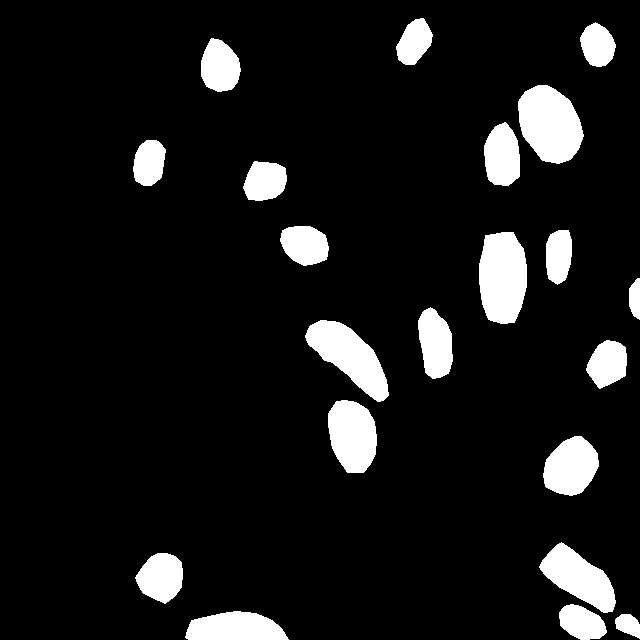

training-153_jpg.rf.980c9a36d883d67d5fecd21244e6a3b5.jpg


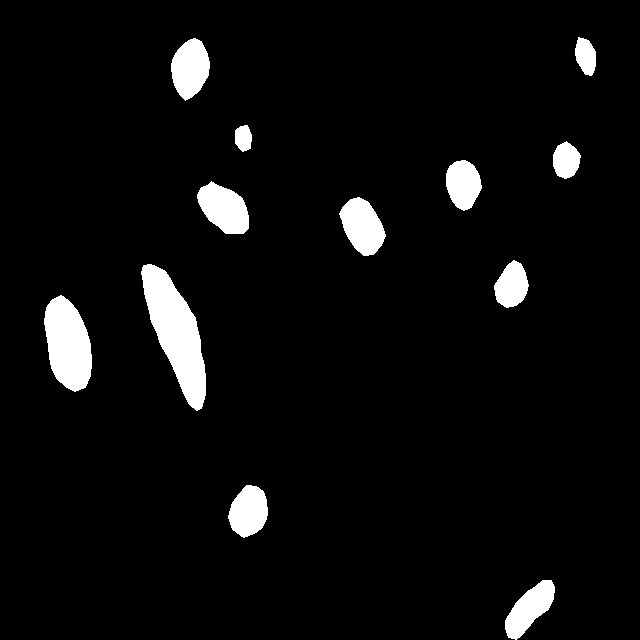

training-155_jpg.rf.a52fbee5f763e51d18fb933f2eb8b276.jpg


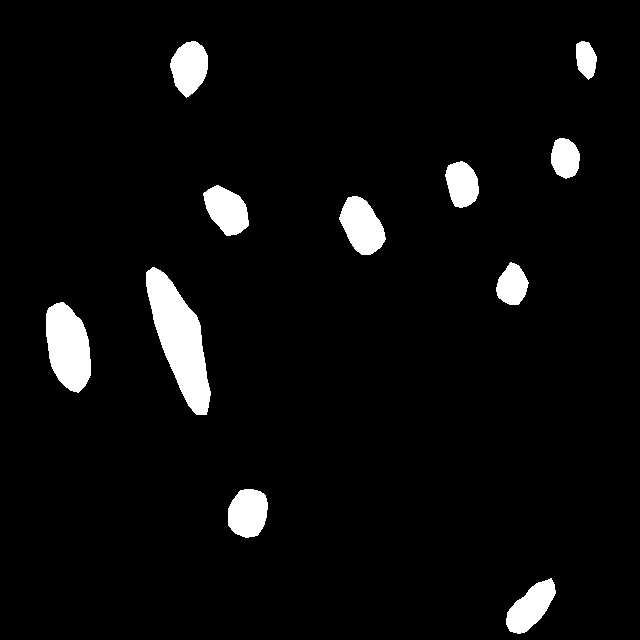

training-152_jpg.rf.7d97c4c0cede9847c381434fd5b3acd6.jpg


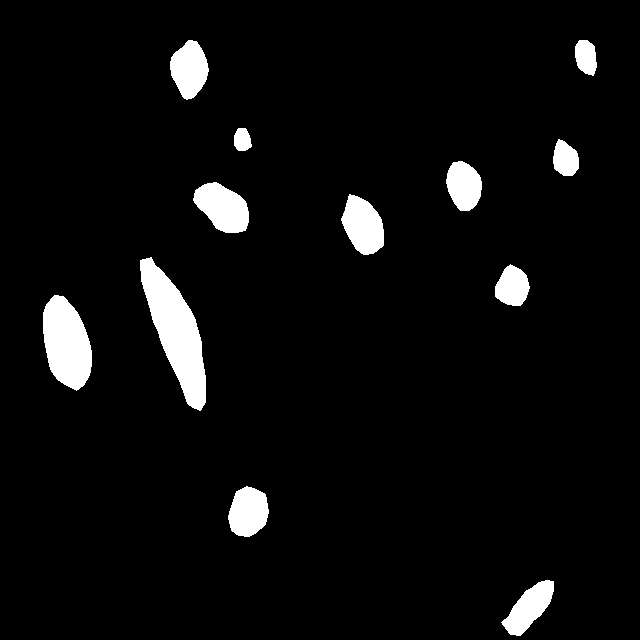

training-078_jpg.rf.aeb34908cefc0c3c409541ea8d9b73a4.jpg


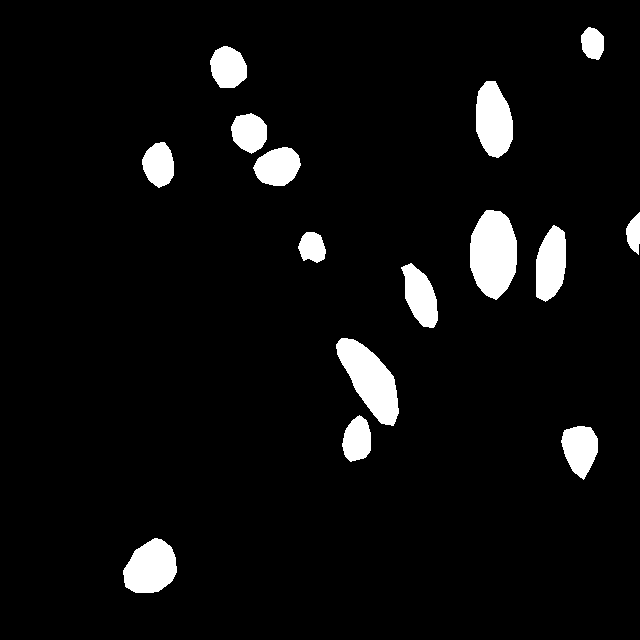

training-151_jpg.rf.adc48b79e697b162c52bbfc413721ac9.jpg


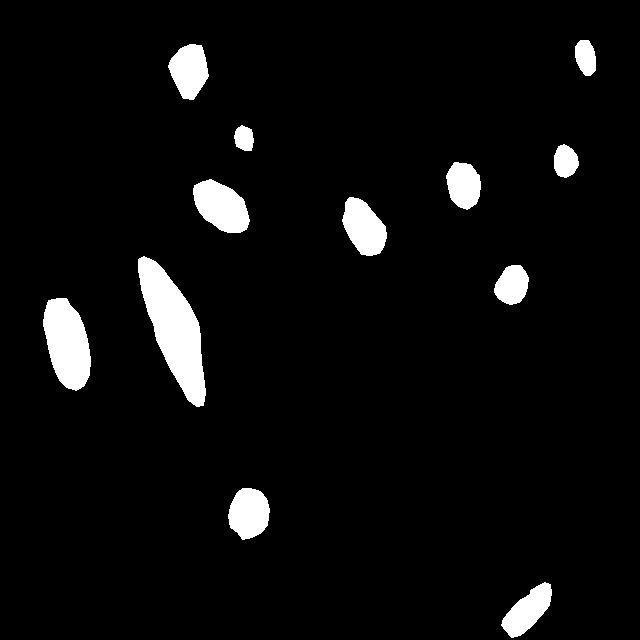

training-150_jpg.rf.ad420212919d342e2f25b2e9736c646d.jpg


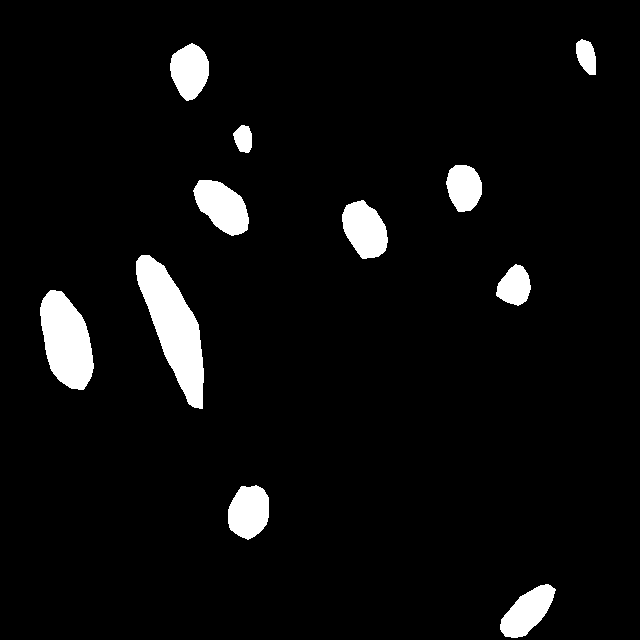

training-137_jpg.rf.aab198b46e770ab019280b39d13fd33a.jpg


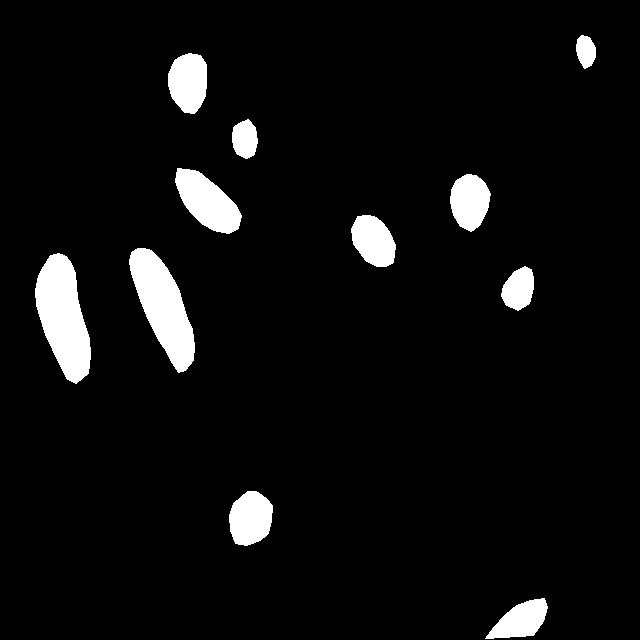

training-064_jpg.rf.b4f1569b84e3a623651ff1288401e877.jpg


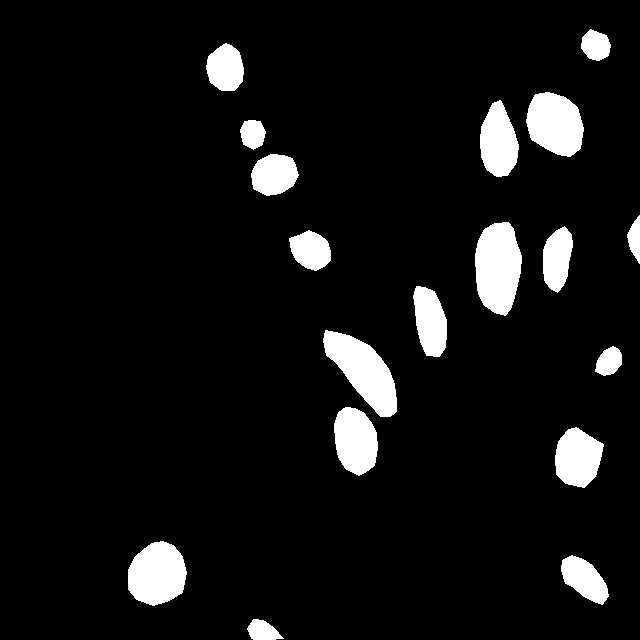

training-079_jpg.rf.9d28f9b9a211a88b97b98666bf878596.jpg


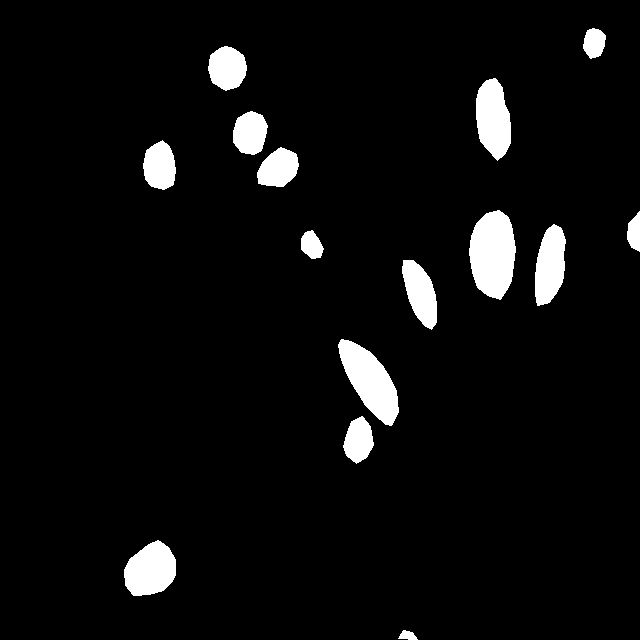

training-123_jpg.rf.aee60e47f8a3464ceb4ac1f888e05f6c.jpg


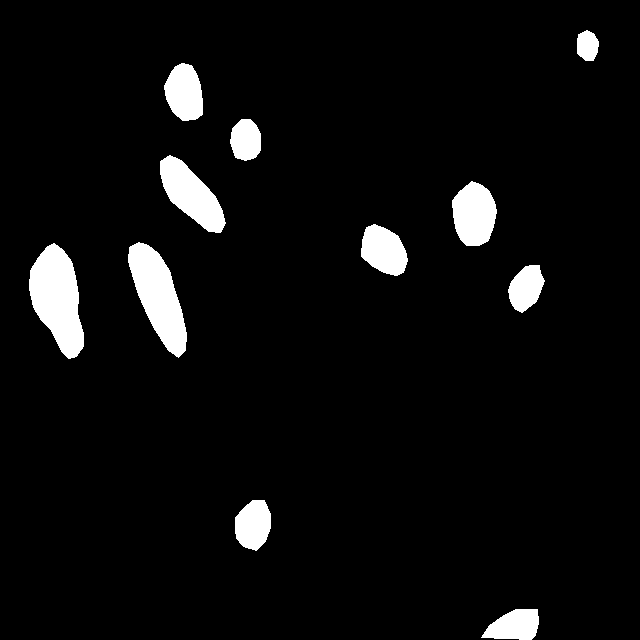

training-088_jpg.rf.ac5a962ace6bd614f45330e6b0a96934.jpg


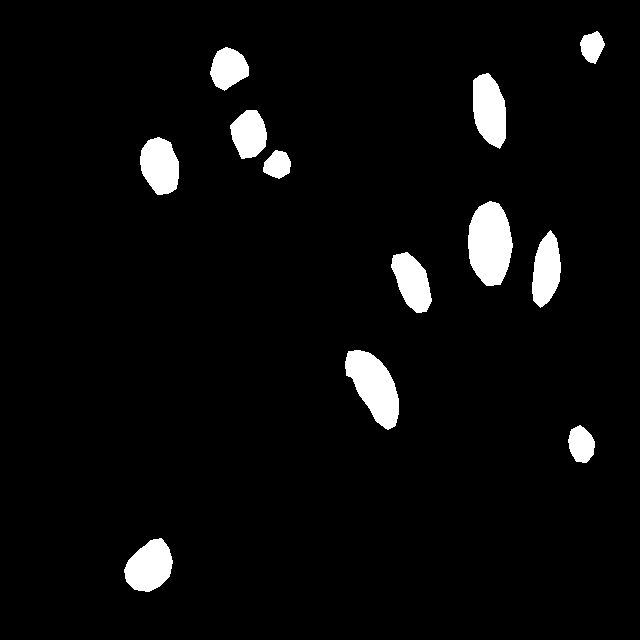

training-007_jpg.rf.b1181a6f6a3a13d3a9ba94e4bf35f593.jpg


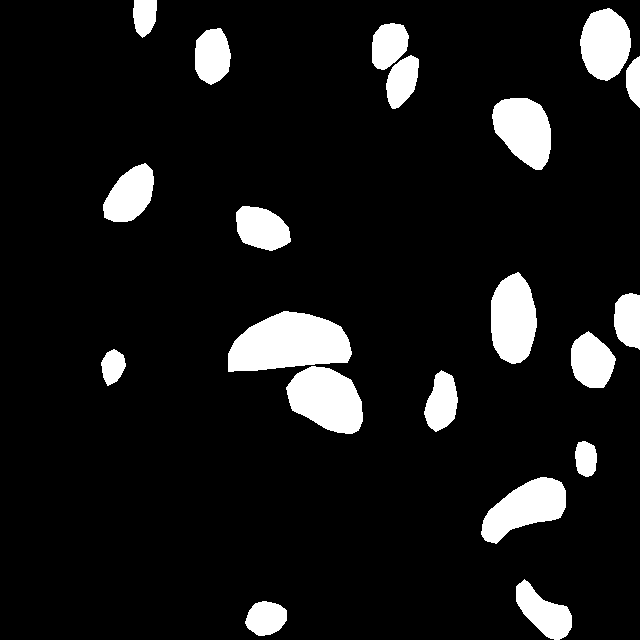

training-136_jpg.rf.ae90f7a7ce3e8f40b5f2c28d82a209d3.jpg


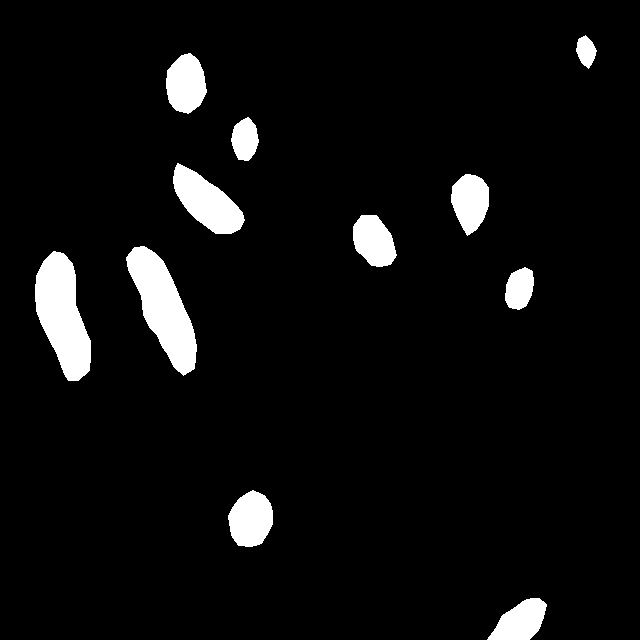

training-118_jpg.rf.b5366fbd4e7876ac4b2c0484fc37ab6a.jpg


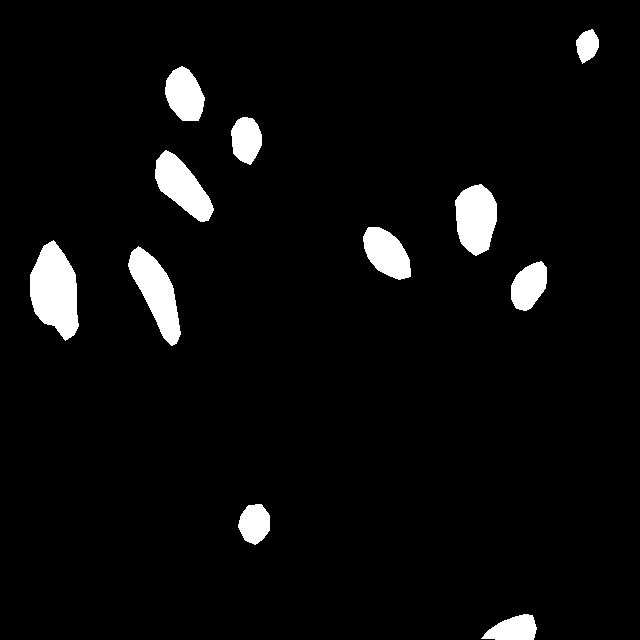

training-114_jpg.rf.94e2ec7e7c0441f7570523c2dc1d1661.jpg


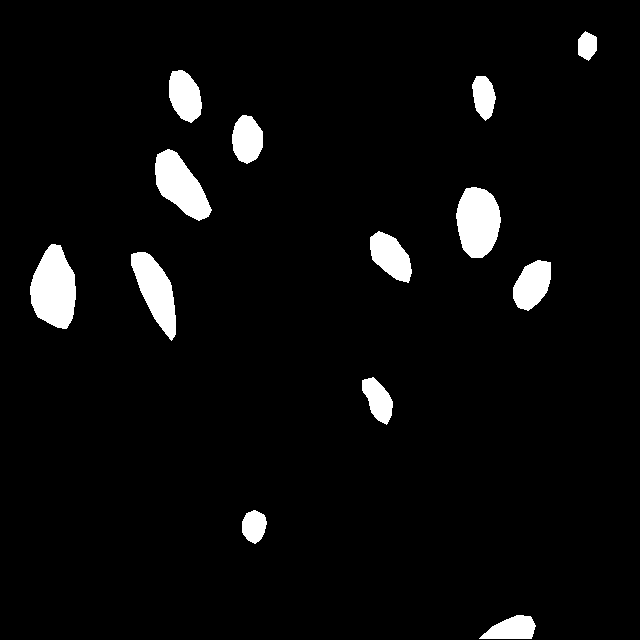

training-043_jpg.rf.b62a46d042d429116531a17bc211453d.jpg


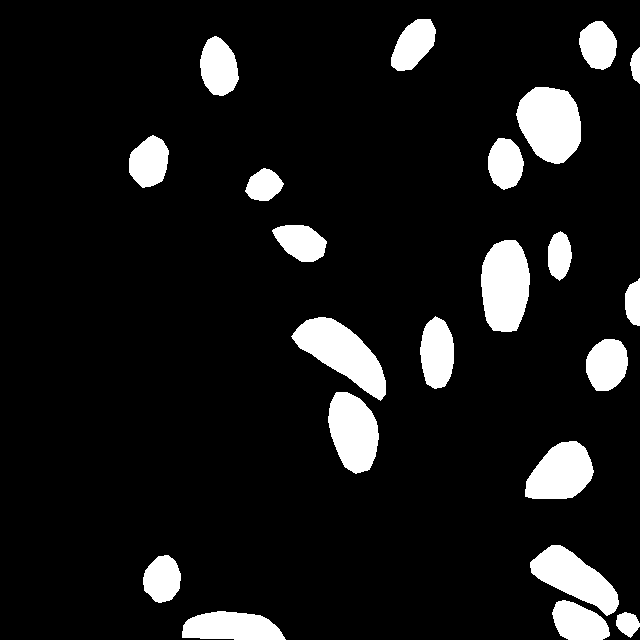

training-107_jpg.rf.a8f3372c33eade03f0330001bd3e37cb.jpg


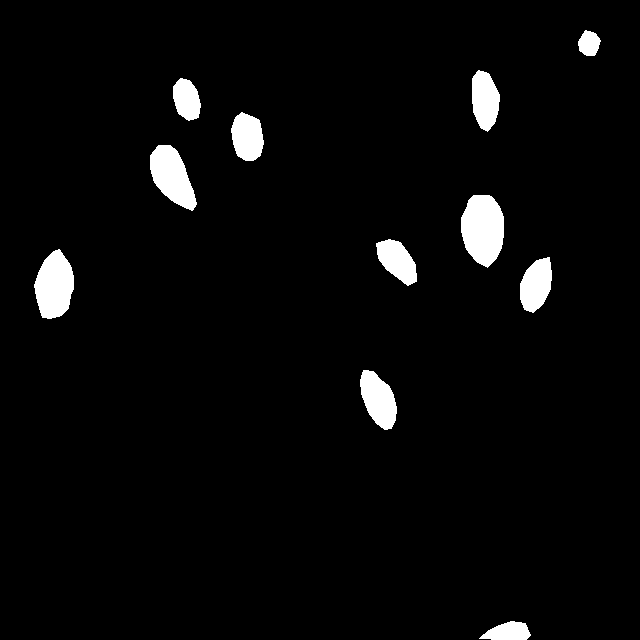

training-096_jpg.rf.baec98b99e9bb1d8c104b06006b6f263.jpg


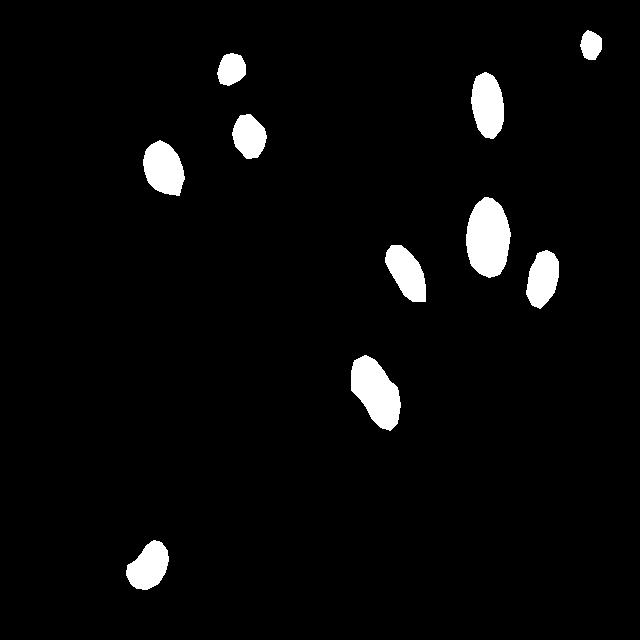

training-041_jpg.rf.b4fd2f20690ed8574d7c1328341cc027.jpg


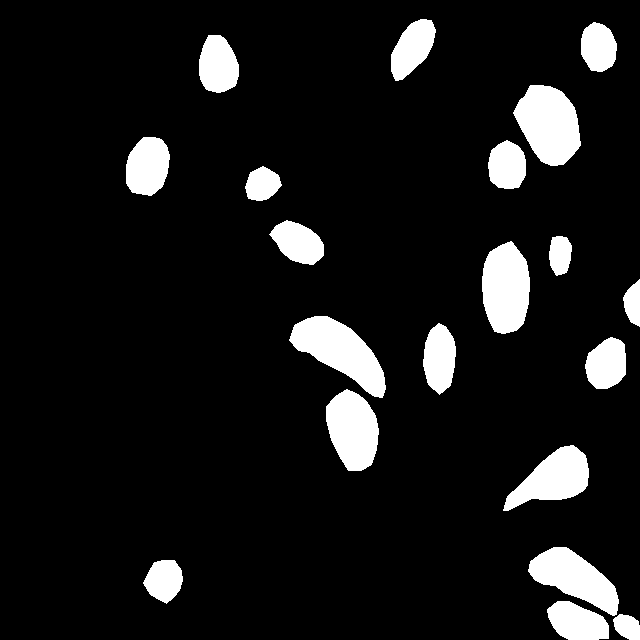

training-015_jpg.rf.b8207e13fe951ed2794b162f1f8e57db.jpg


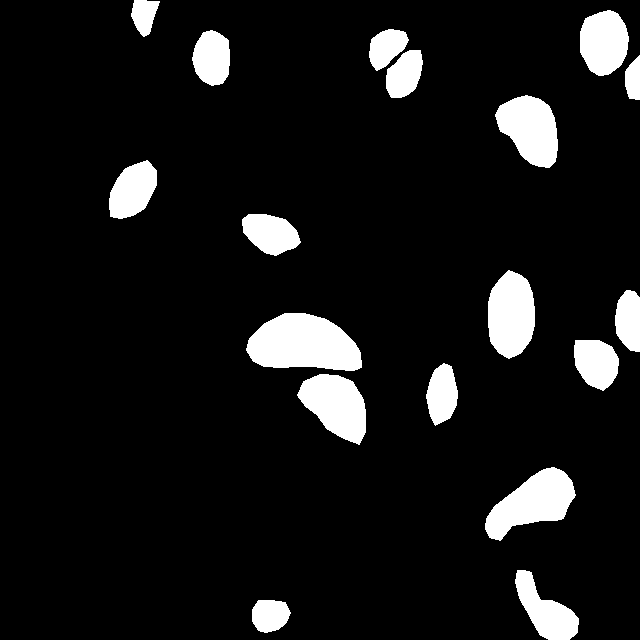

training-161_jpg.rf.6db979892b2ea3b8a67be6c1335912bf.jpg


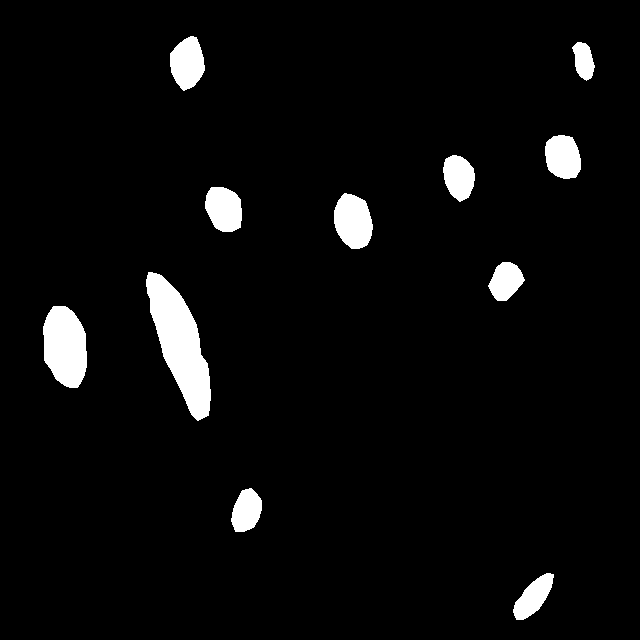

training-004_jpg.rf.b6c9d06a86f400f489a2f79a777f5e82.jpg


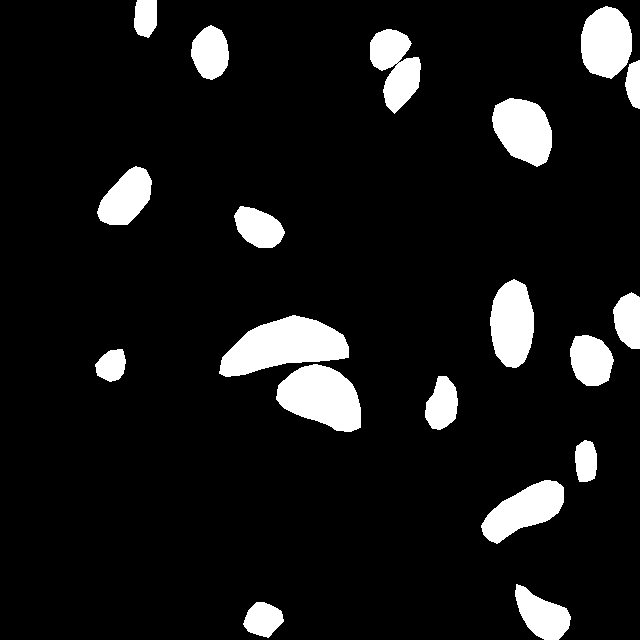

training-086_jpg.rf.b804cd22438338e2b6145f25a6cd5850.jpg


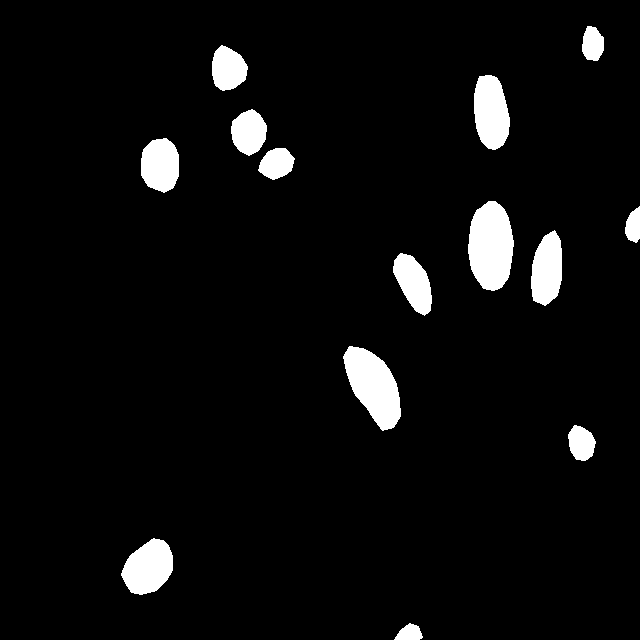

training-061_jpg.rf.c8bf49a58c67562cb4c933d9a4d202d7.jpg


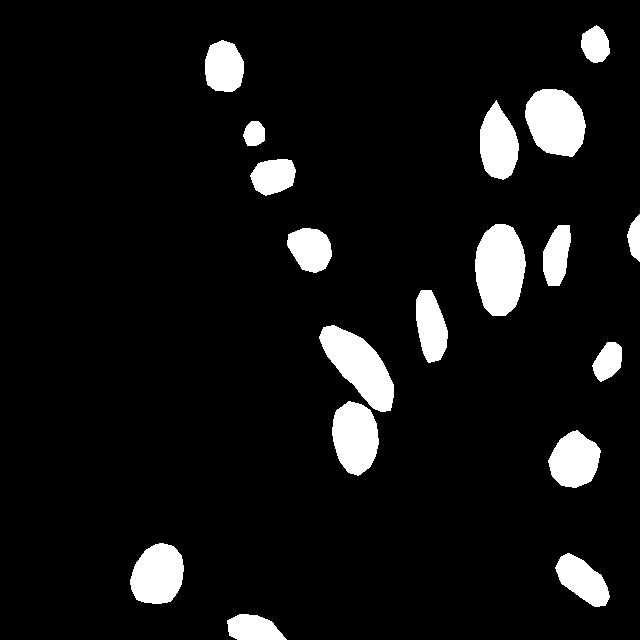

training-001_jpg.rf.bf41a9d26215be1bc95f25d1c3142cf1.jpg


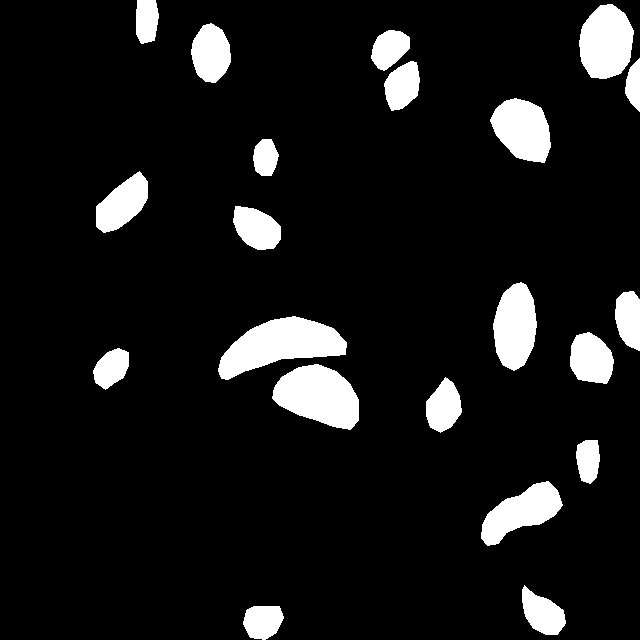

training-073_jpg.rf.b4029ac5df396bac280e438890676568.jpg


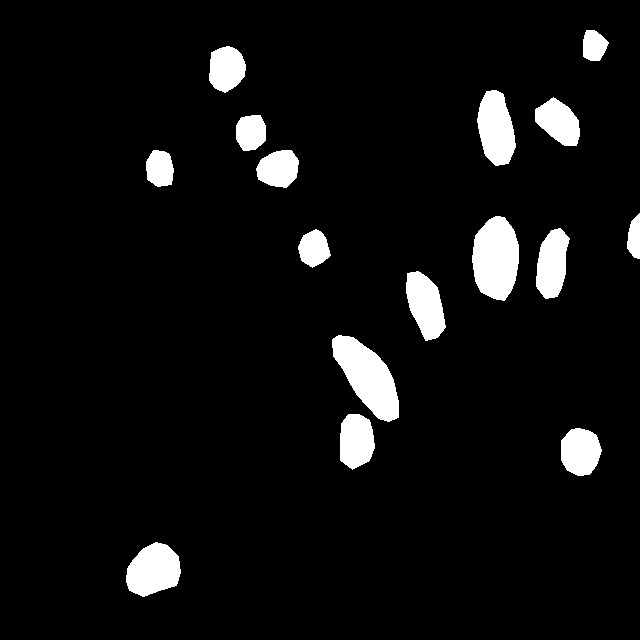

training-025_jpg.rf.adf524fc8d828a5ee9ffa1cbd9088a98.jpg


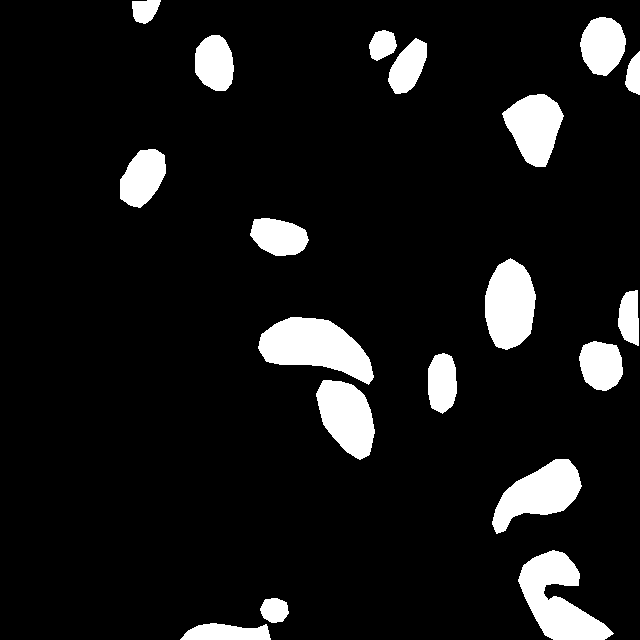

training-020_jpg.rf.acb20c85099da3fd6a81c2ef3e1f911f.jpg


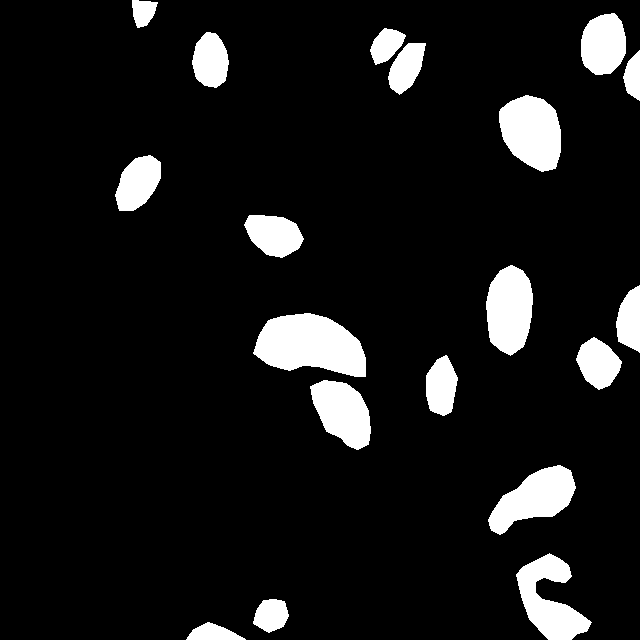

training-012_jpg.rf.b2d84a69d1e940c5d2323f8d5b3eccc7.jpg


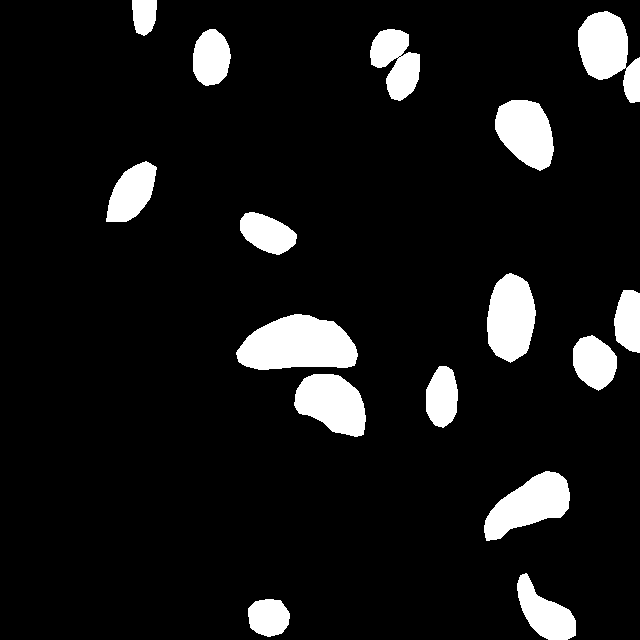

training-010_jpg.rf.cb252eab49d03f4e0245921dc9ed7d22.jpg


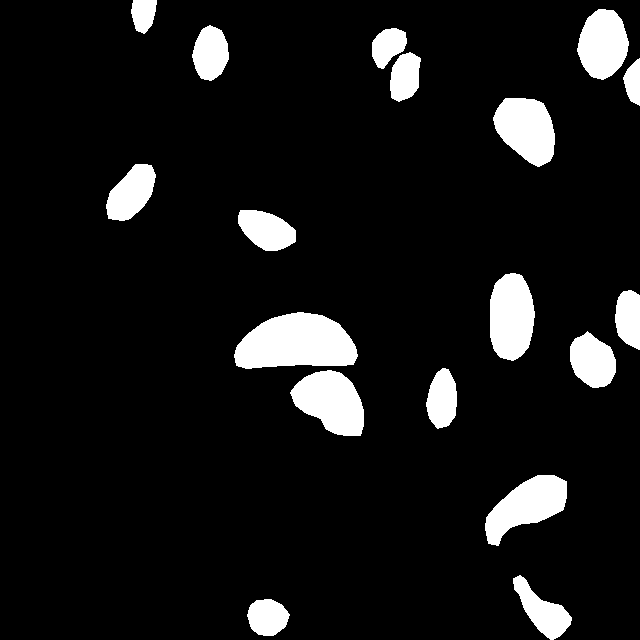

training-049_jpg.rf.d3ca6e126b7e471129ec64663bf33922.jpg


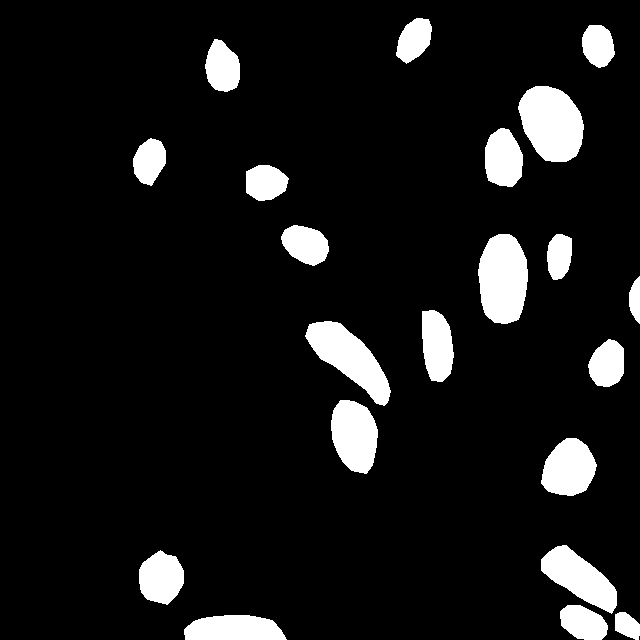

training-085_jpg.rf.cf79eced71926f0bf3a20d39be2e6141.jpg


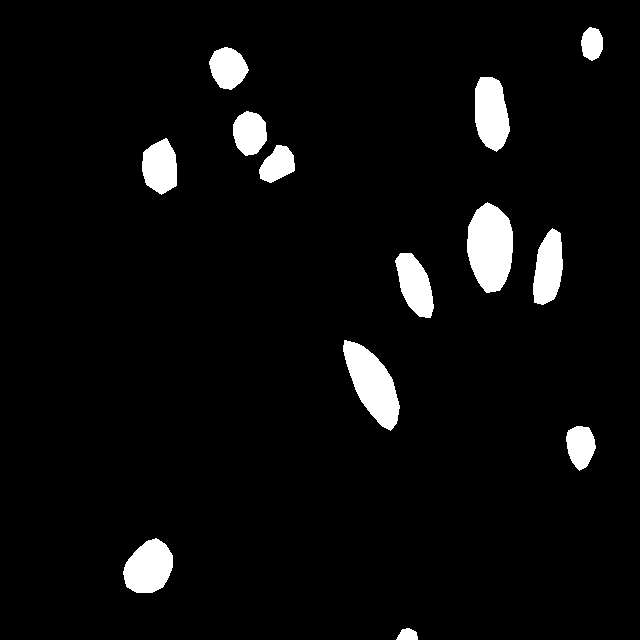

training-156_jpg.rf.af5b01912a577e083bc286f3af073eec.jpg


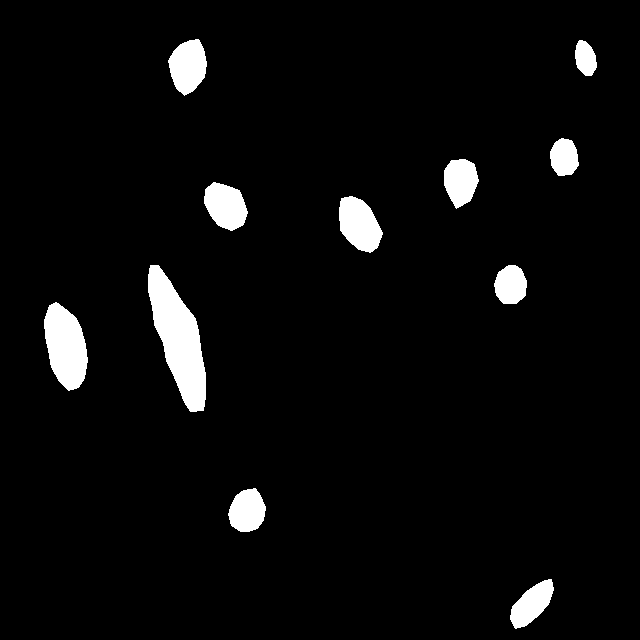

training-029_jpg.rf.d87495e2e4ae901c4e083358e482b015.jpg


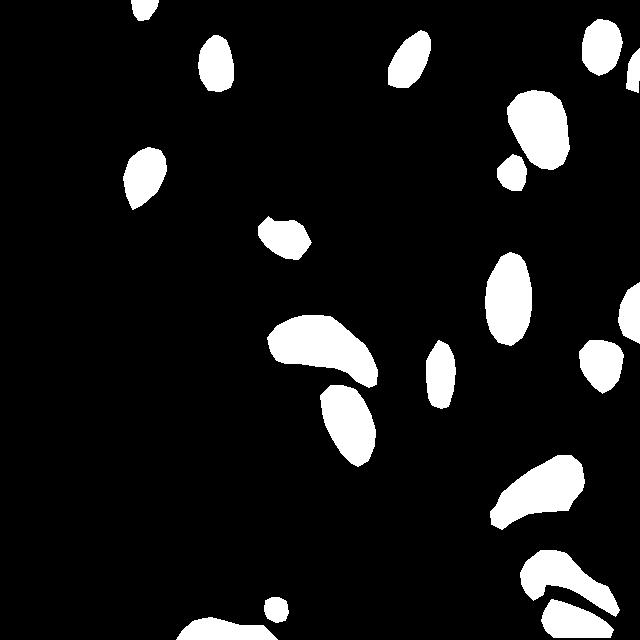

training-017_jpg.rf.d00e5464e70517fd11cee7d798dcbb24.jpg


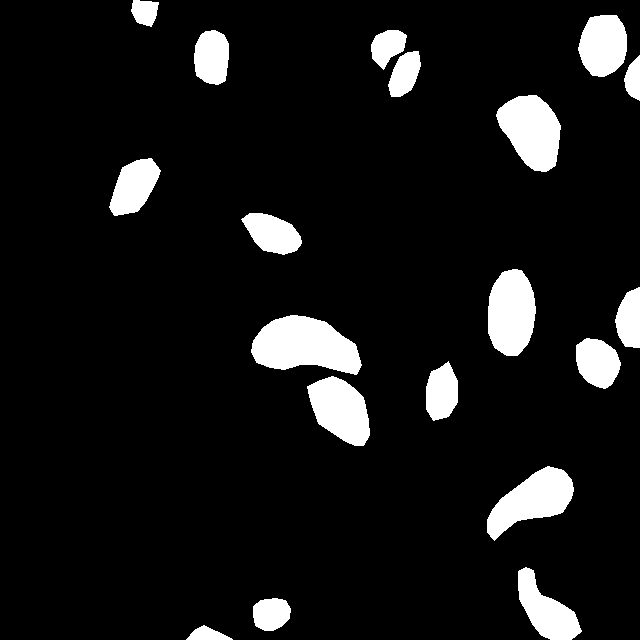

training-117_jpg.rf.db087acaac5925d7044409fc5955d2b3.jpg


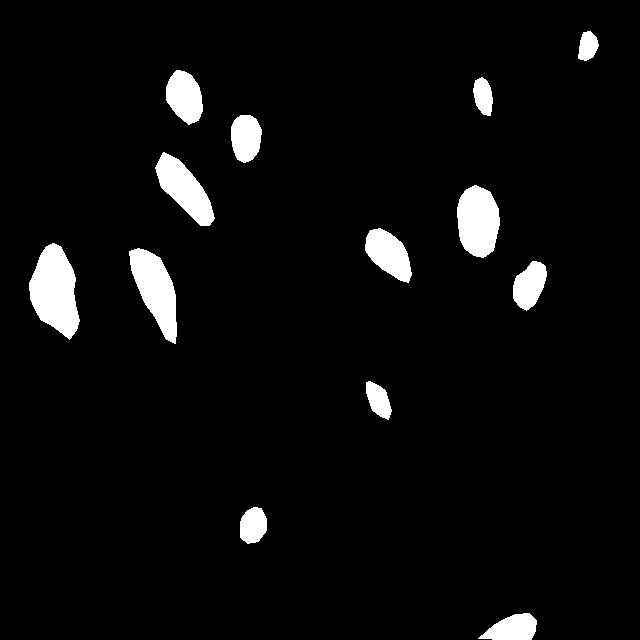

training-002_jpg.rf.dbcdac671d38c73e2c709f5413b77cb5.jpg


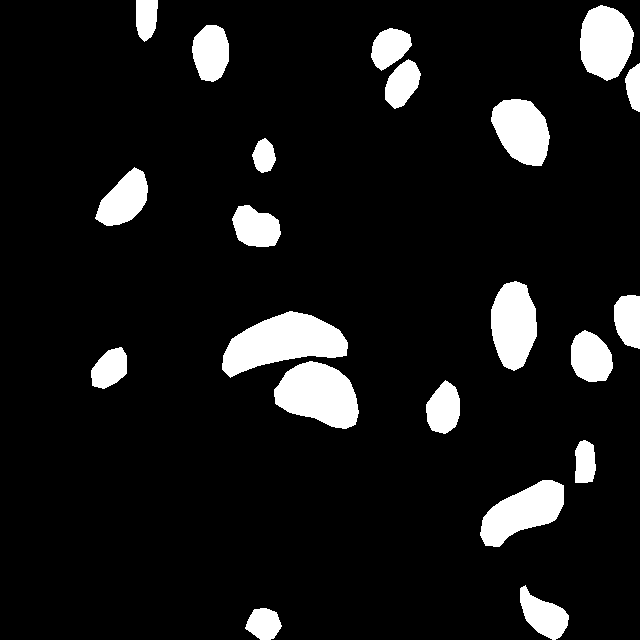

training-033_jpg.rf.d7760f79f3d432189a3b442578e2909f.jpg


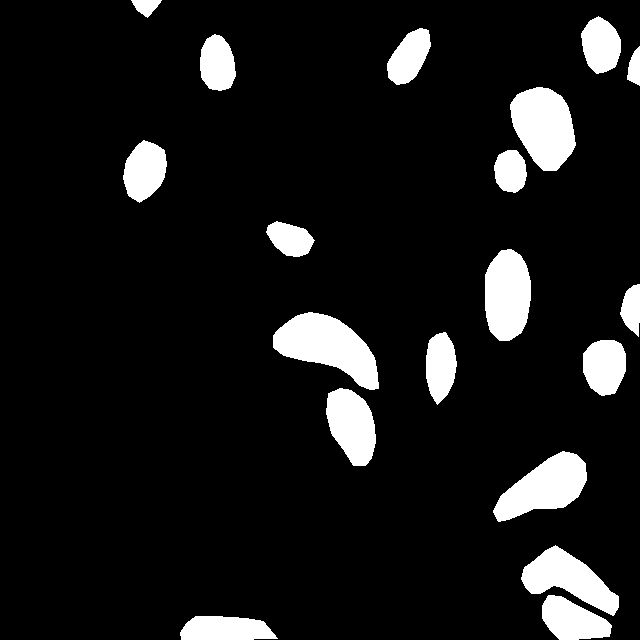

training-087_jpg.rf.e5c972f20ba242c2d4ccbb9464eec772.jpg


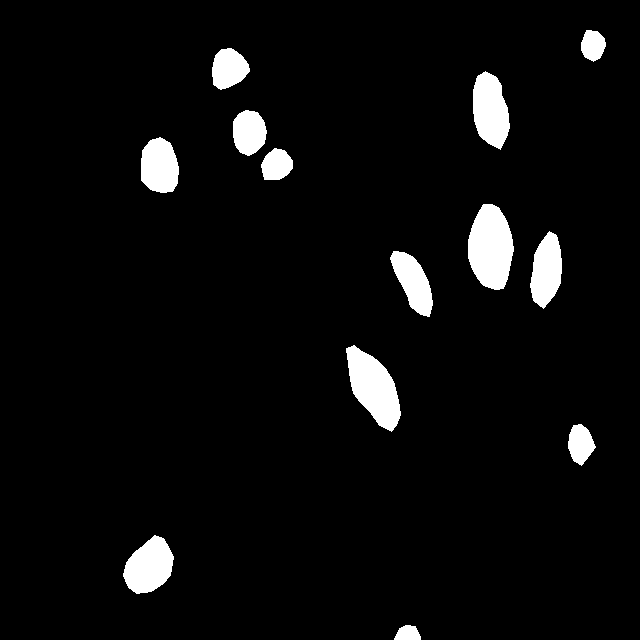

training-080_jpg.rf.dbaff44518309ae19055ef361f55aeb5.jpg


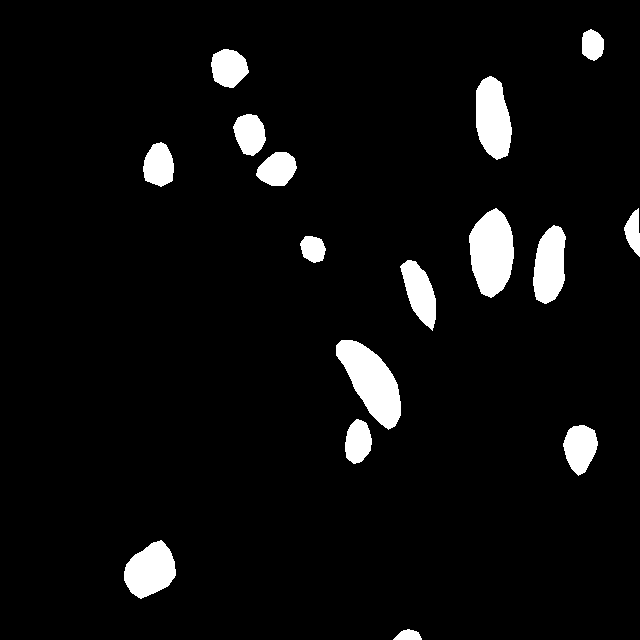

training-148_jpg.rf.cca5ae5929fab0c9fe7835db207bec4e.jpg


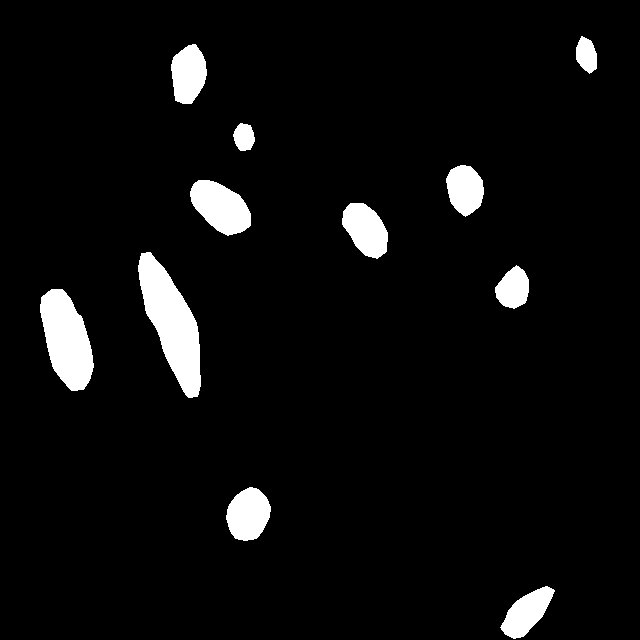

training-027_jpg.rf.d251ebe0c1e3af8d1ebd787c006eb77c.jpg


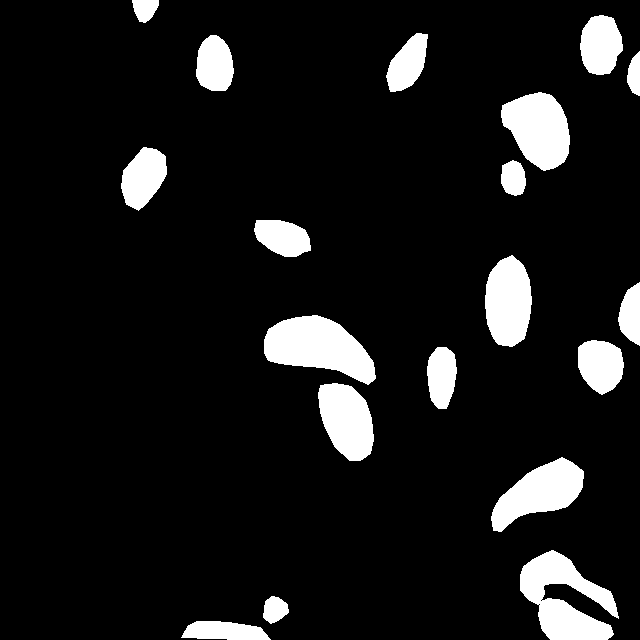

training-111_jpg.rf.cc13235cf4e60d3aa6345f6a893acc17.jpg


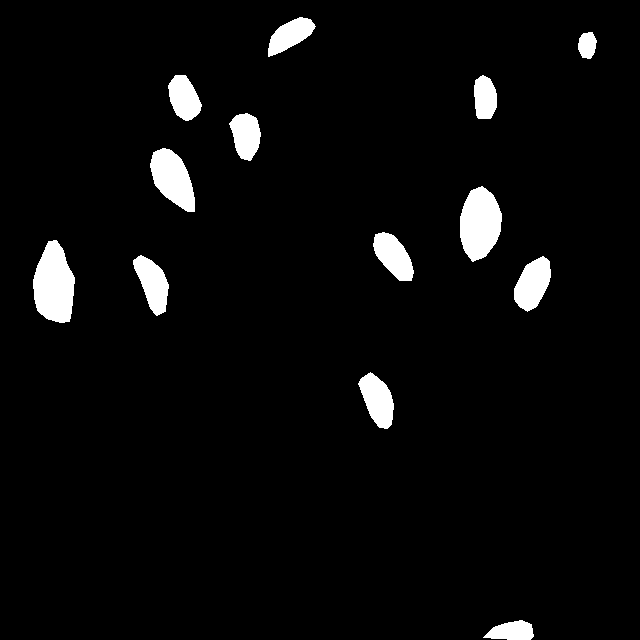

training-094_jpg.rf.d026cf1e5e6798f92ca384484e1e12f8.jpg


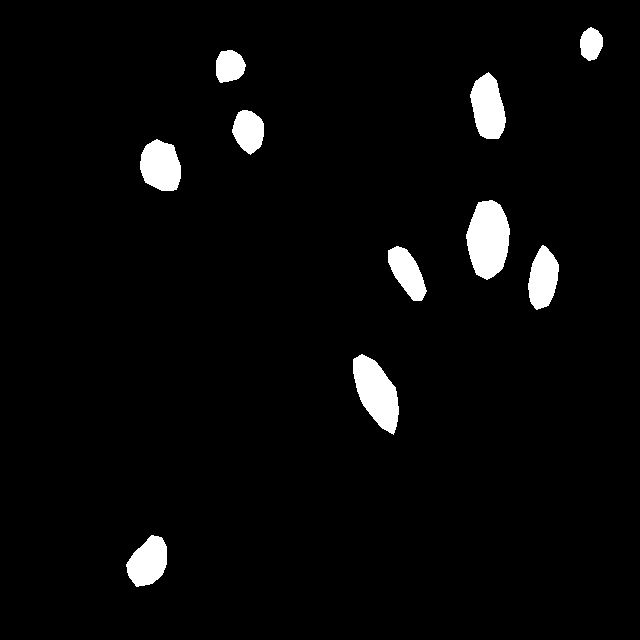

training-115_jpg.rf.e6201803f429d62bada71a4f27650561.jpg


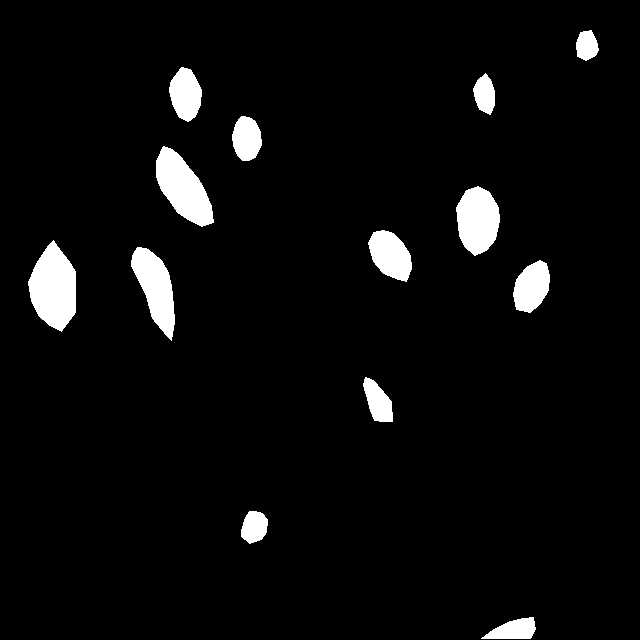

training-003_jpg.rf.d7fa96d5acfbdf5ba6d927bbefd17278.jpg


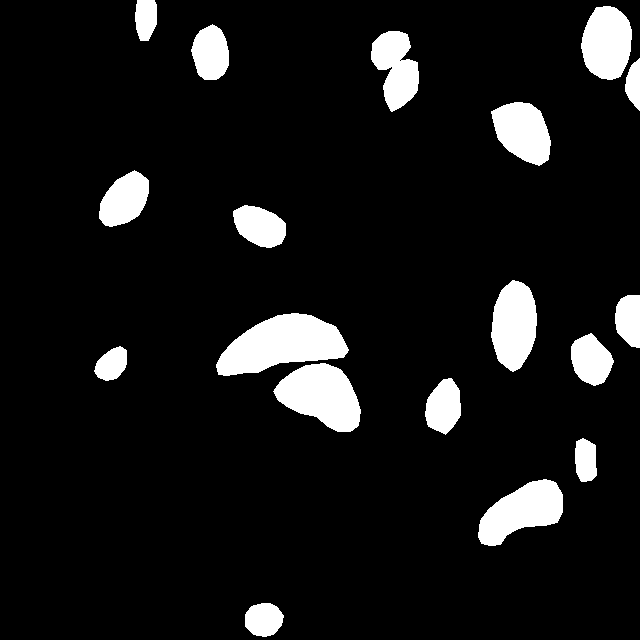

training-030_jpg.rf.ec3827a07942b1c0cbb943a2e956718e.jpg


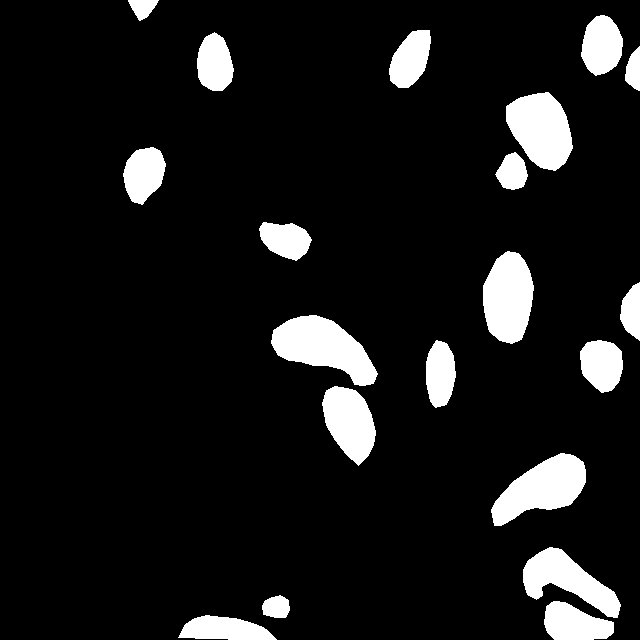

training-139_jpg.rf.daff8f3703126498944ae5186f600921.jpg


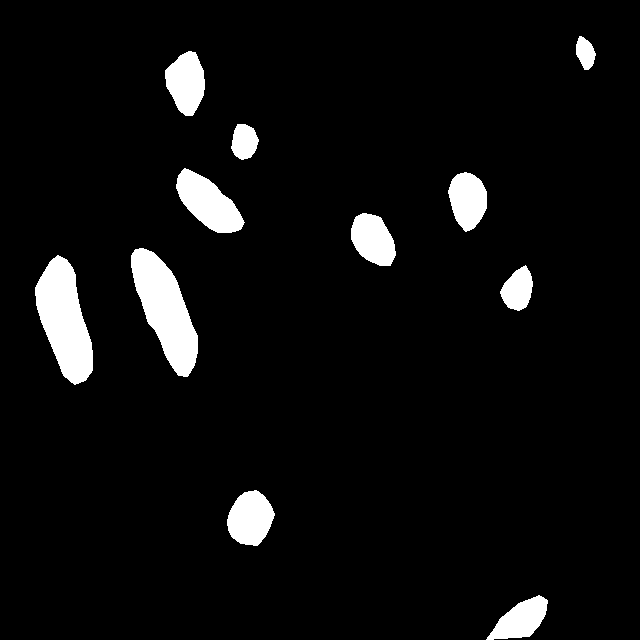

training-104_jpg.rf.eea93ad3d5723dc63193c1286492a55a.jpg


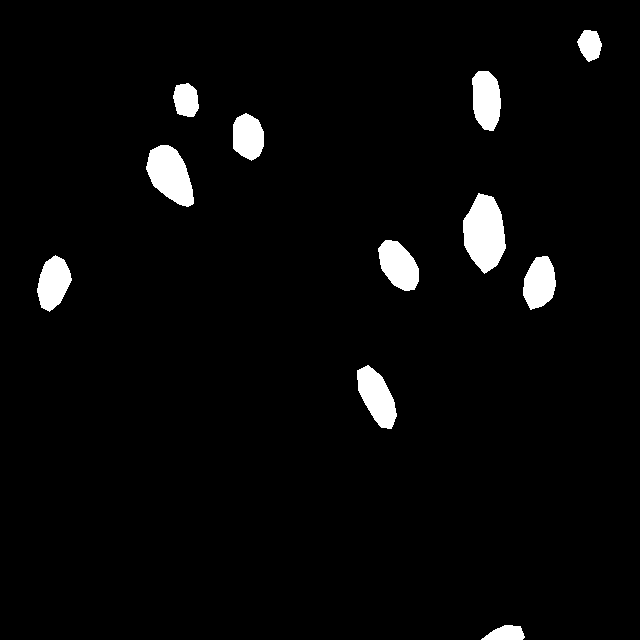

training-063_jpg.rf.d1aaaf1b5f789385c1338f89c5341926.jpg


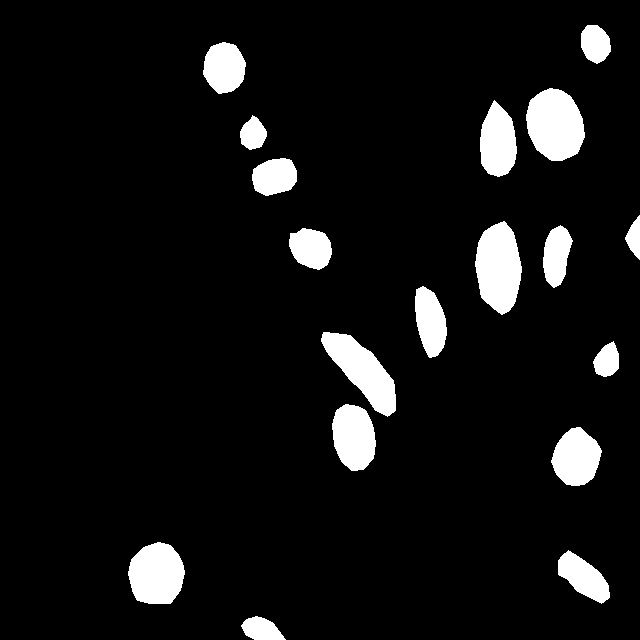

training-022_jpg.rf.c12f6e31e27b002b30ebc9b6d794a053.jpg


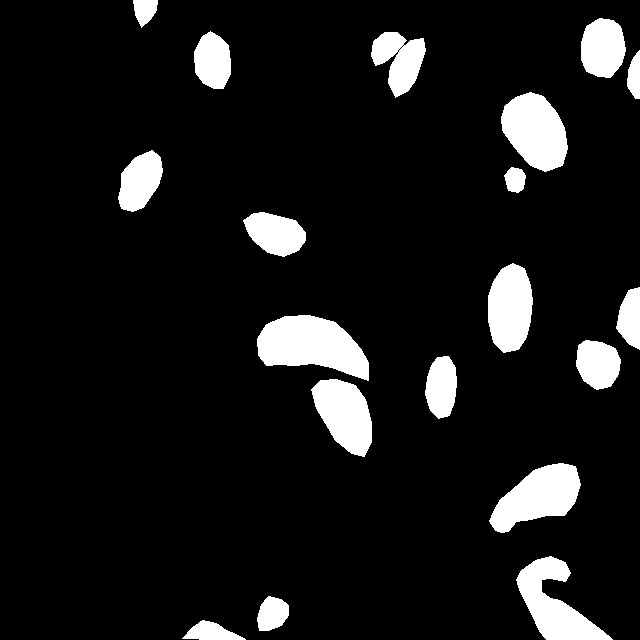

training-028_jpg.rf.ef6a01bcf2ff9a3cd01bc4c28c846762.jpg


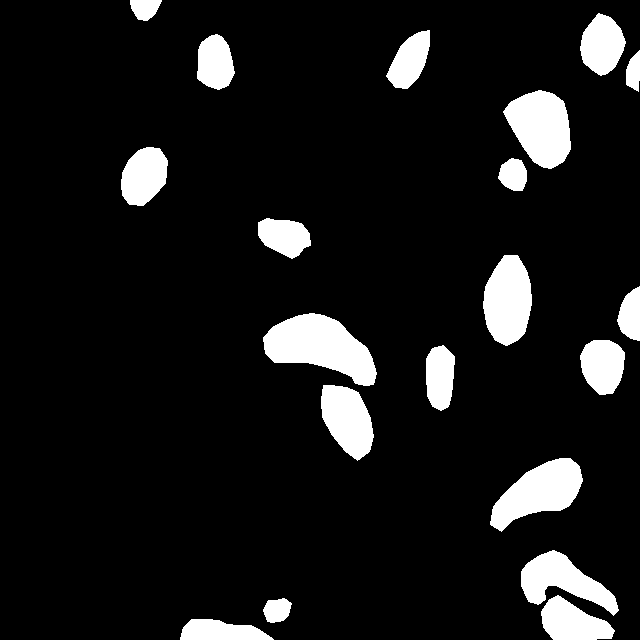

training-154_jpg.rf.e666885529b00c9ae9b77a2776186b3a.jpg


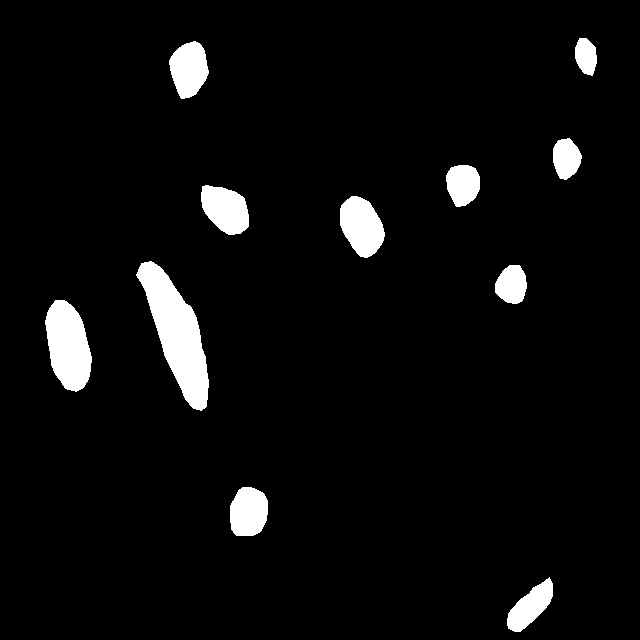

training-037_jpg.rf.aa48bf828381fe45ebb51da471af5565.jpg


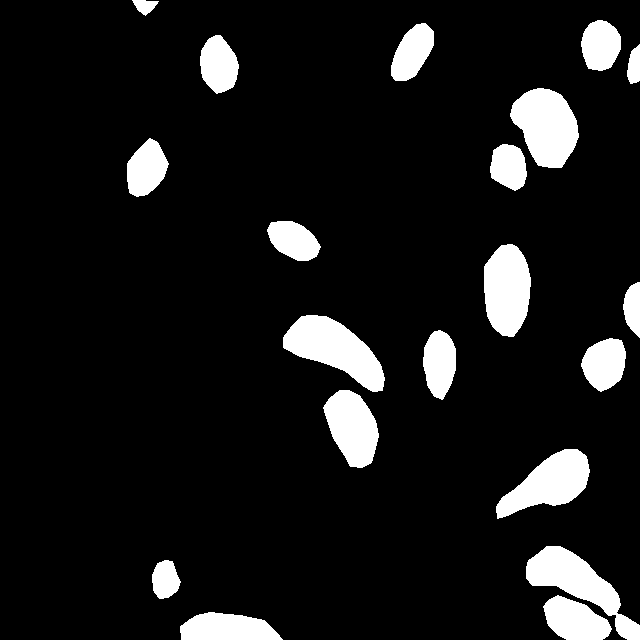

training-055_jpg.rf.f12a5142815c8121460cb8a4c7848d73.jpg


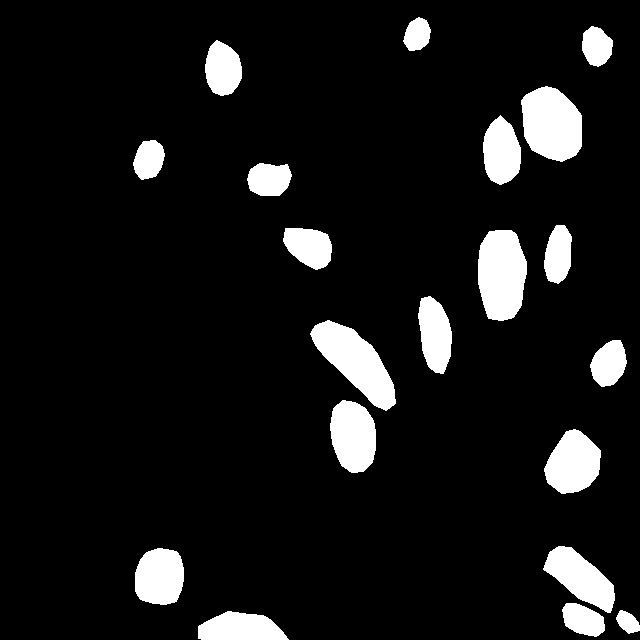

training-018_jpg.rf.e8b7bd953004cb4f4a034da77c8fbff7.jpg


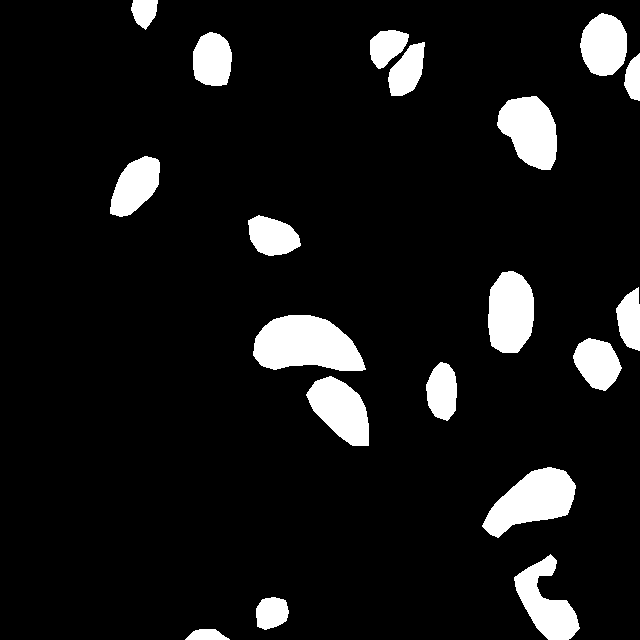

training-093_jpg.rf.de2d138ab171bb3363951c6b74e07075.jpg


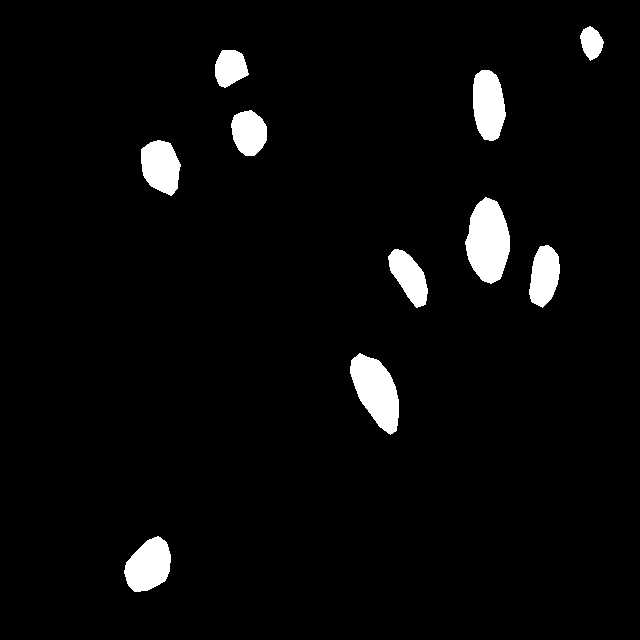

training-131_jpg.rf.efe360ddd2410848eee2ca675275f055.jpg


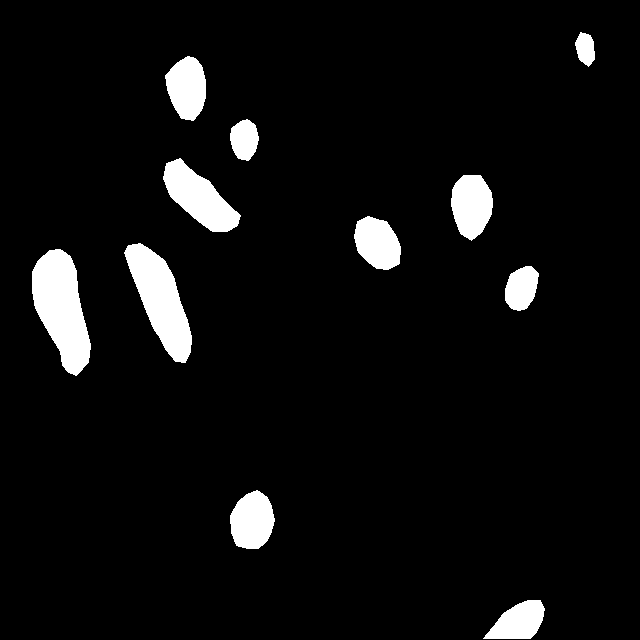

training-110_jpg.rf.f2ba1e1c15767f05fcce889092869c04.jpg


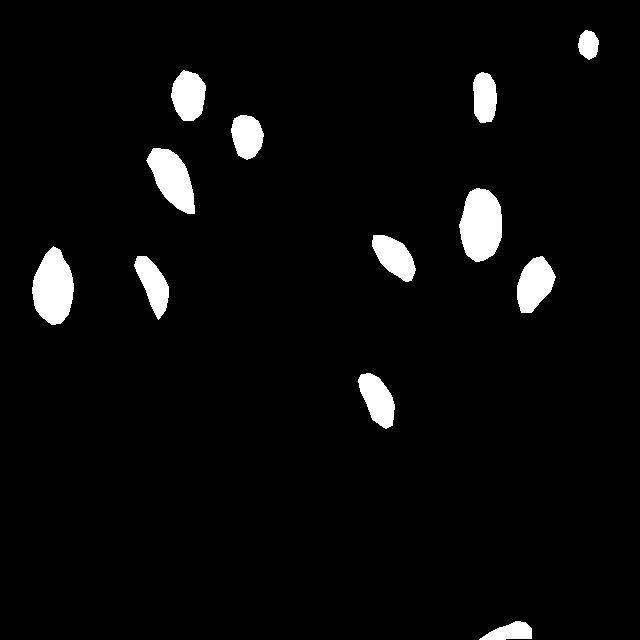

training-129_jpg.rf.fa540798ee608c21c179db088f7e546e.jpg


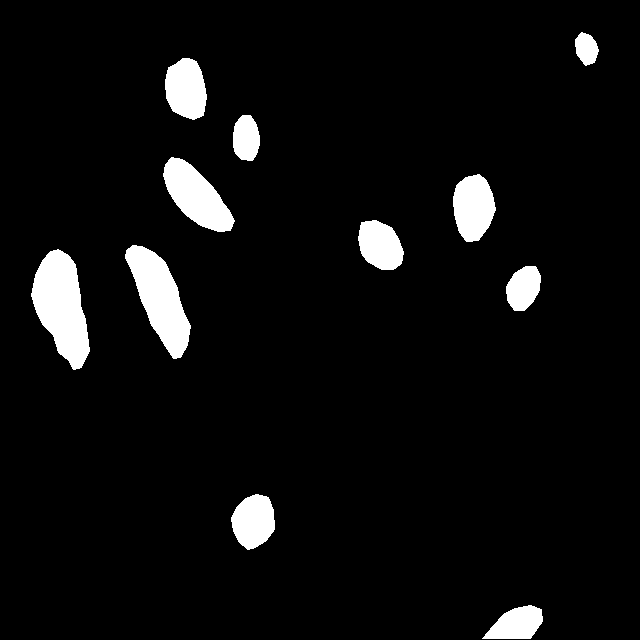

training-083_jpg.rf.ef797c133c818db427dea2ec81d5dfb0.jpg


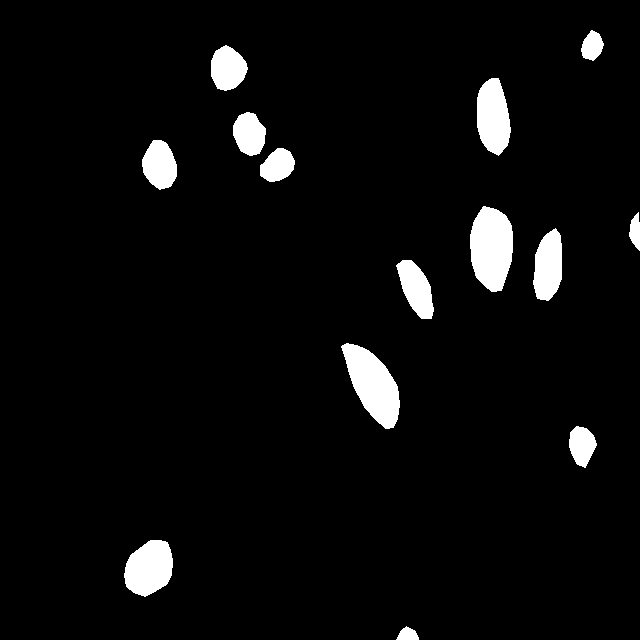

training-144_jpg.rf.f8f1fd3639b8c439eb1a8dbf6c571e82.jpg


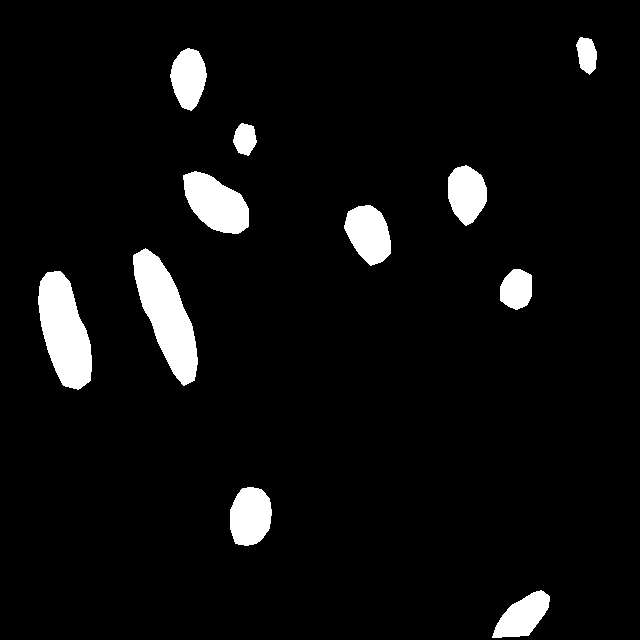

training-035_jpg.rf.fad07d8037ba150c5cc5d2837d5449f3.jpg


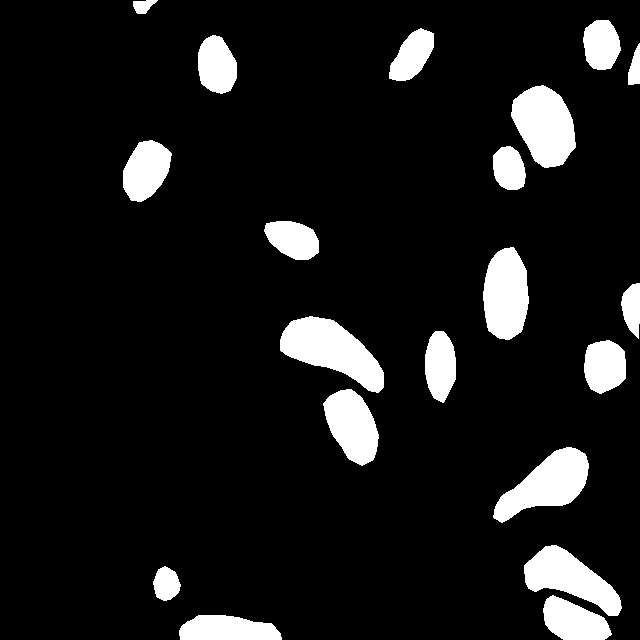

training-113_jpg.rf.ebc24f4b7f77a046ef218de48f168537.jpg


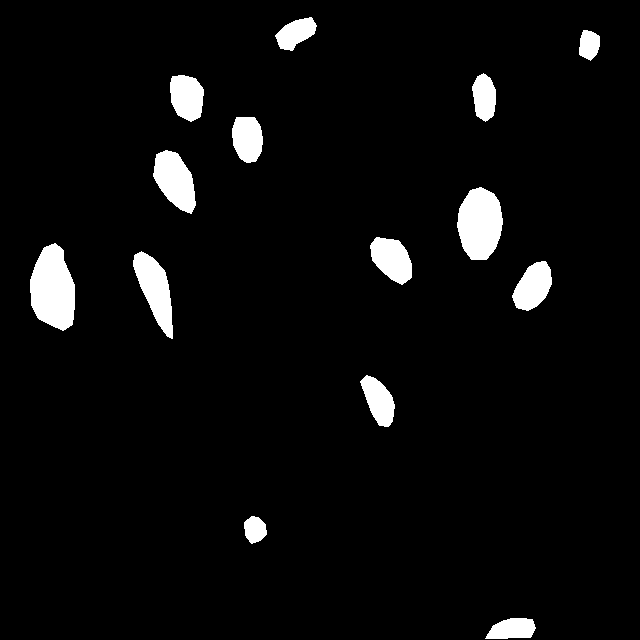

training-077_jpg.rf.f06df665875738f2330879b4c25ab342.jpg


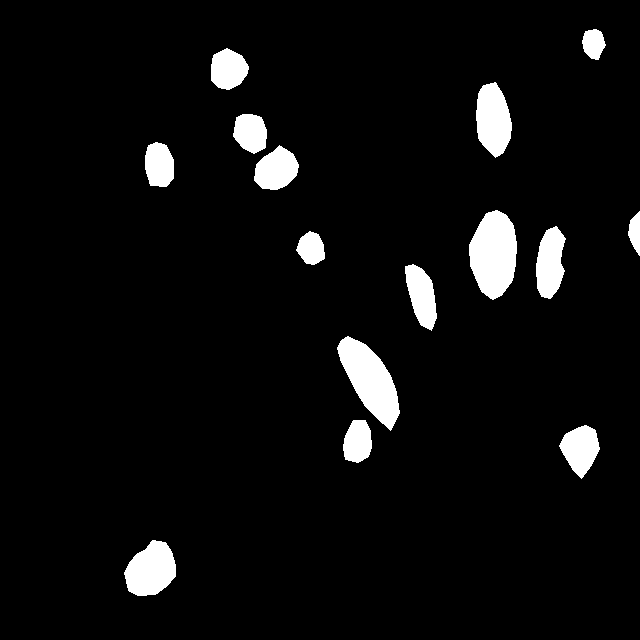

training-130_jpg.rf.ea10747347bcae27aba11c5032c51231.jpg


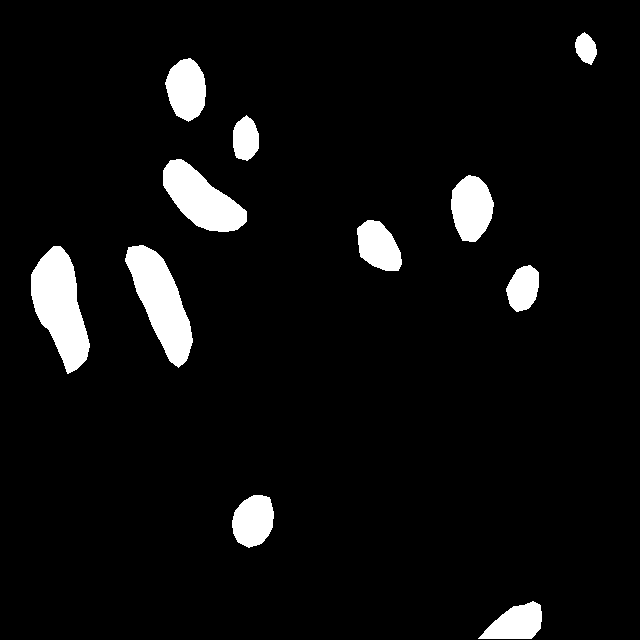

training-108_jpg.rf.f3931769c9793e2db767ced2f811929d.jpg


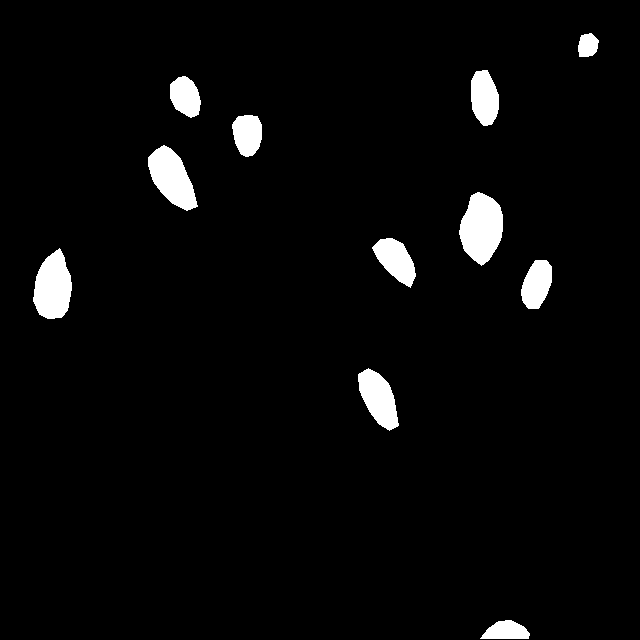

training-106_jpg.rf.fea54bbaf4264f00433049ca81d0ac15.jpg


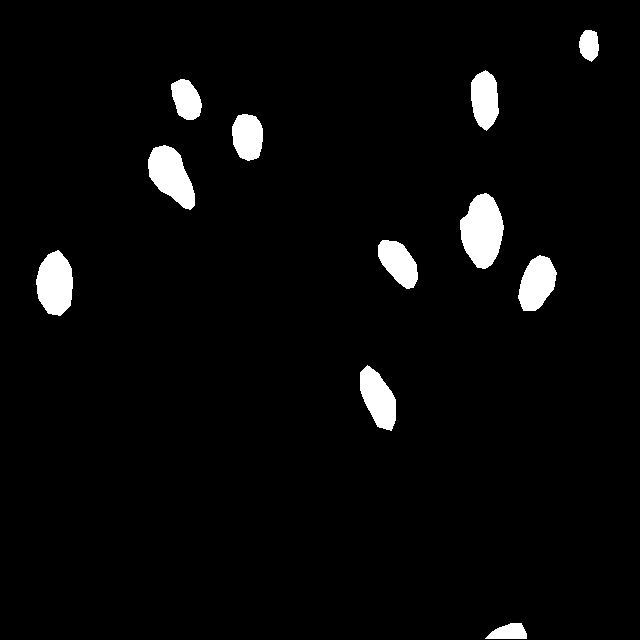

training-023_jpg.rf.f34d92d19c35d56bdb38667132becdf3.jpg


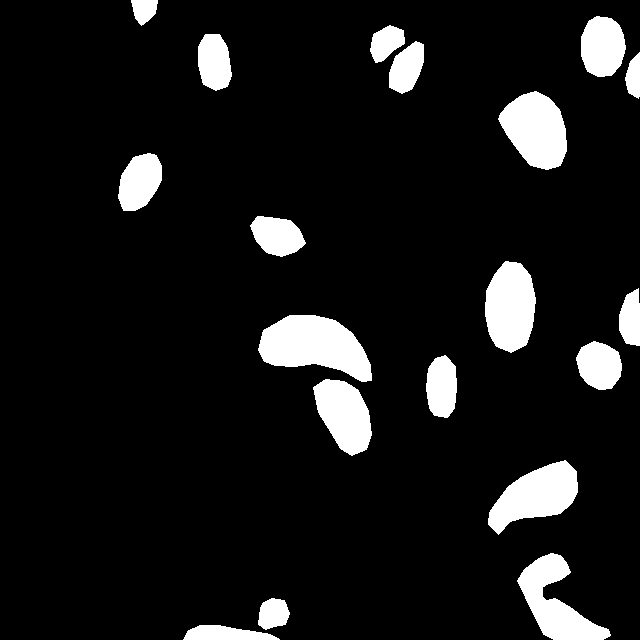

training-060_jpg.rf.f8fe2e68e856033570dfb9a48cd46023.jpg


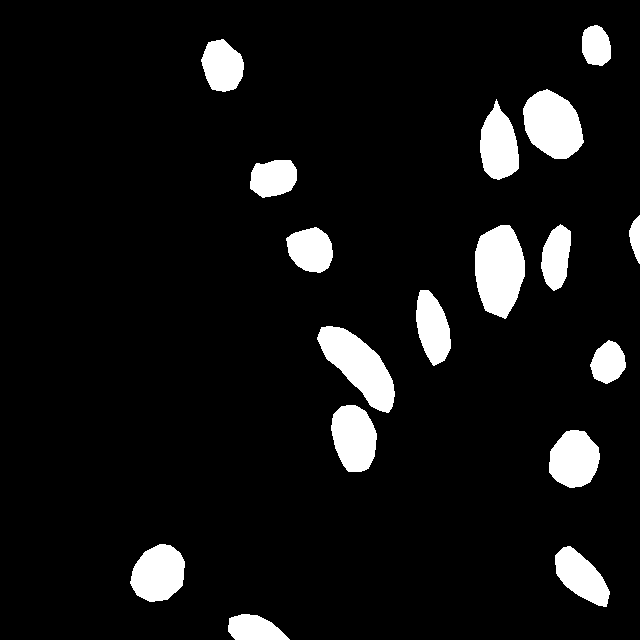

training-081_jpg.rf.fb42c0556226ab68705b6b9bd3ad19fa.jpg


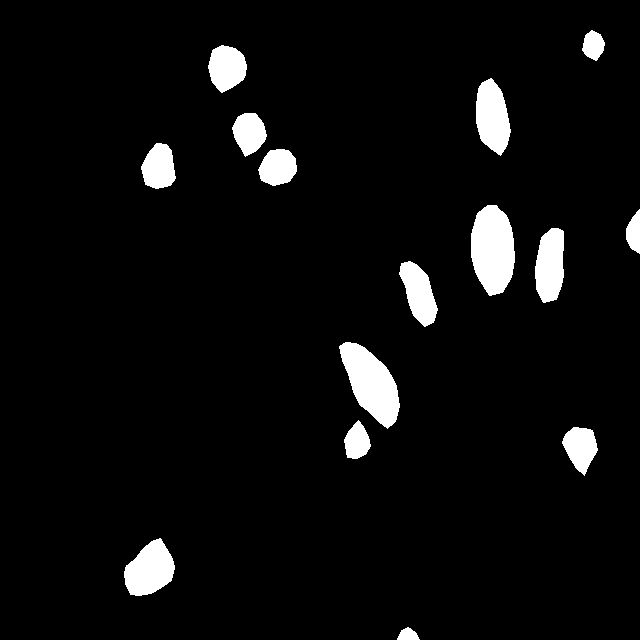

training-147_jpg.rf.fdb6e0cac88c8595ea76494da148165a.jpg


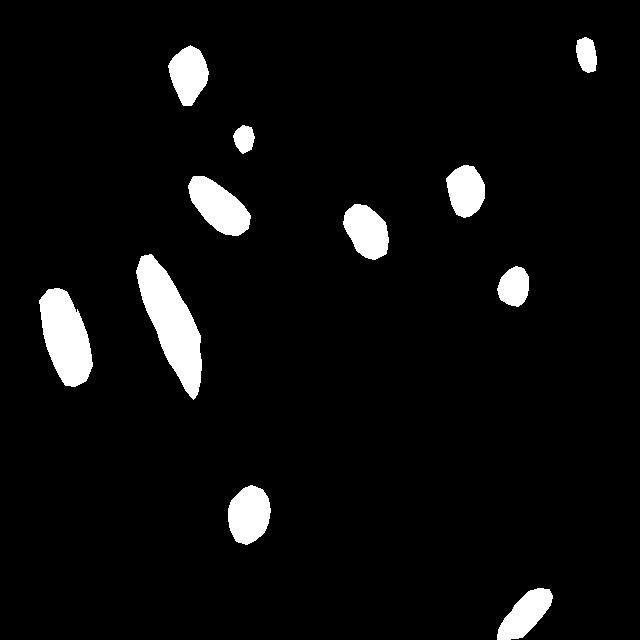

training-032_jpg.rf.fffcc9900fe8dcc9190aa77a62d63366.jpg


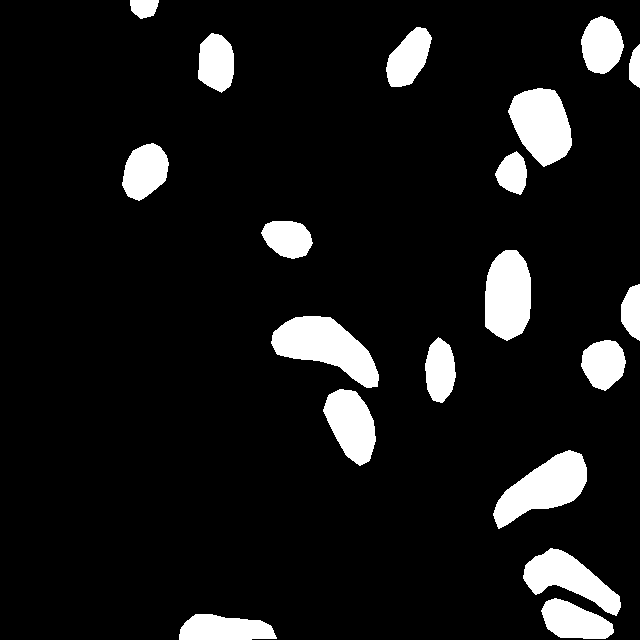

training-135_jpg.rf.fcffcc5a4facbfbd3d1fd36fe37d8672.jpg


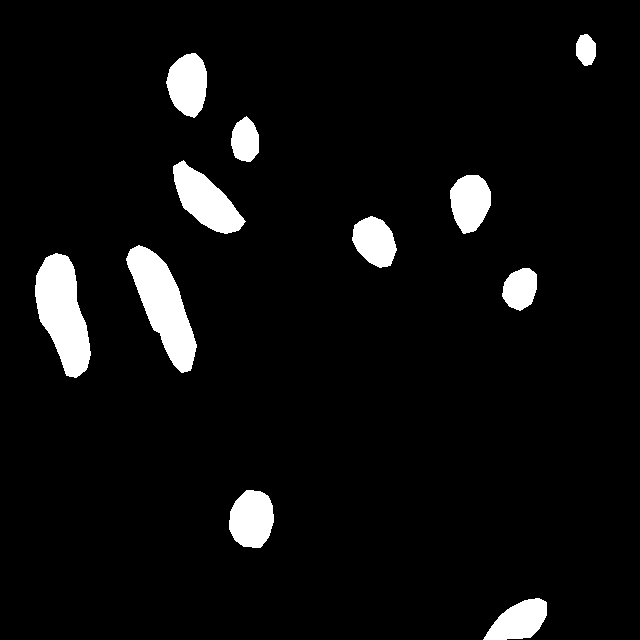

training-054_jpg.rf.d0dfe1f7dd243b19a5fa8d3e2df69cb3.jpg


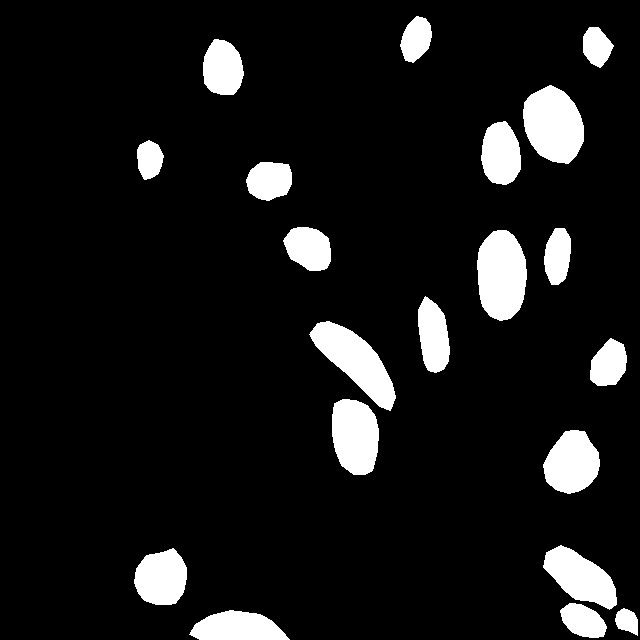

In [26]:
new_gt_mask_list = []
for file_name in new_file_dict:
    # ilgili sözlük listesini al
    dict_list = new_file_dict[file_name]
    mask_shape = (640, 640)  # Maske boyutunu belirtin
    ground_truth_mask = np.zeros(mask_shape, dtype=np.uint8)
    
    # her sözlükteki segmentasyon verilerini al ve görselleştir
    for d in dict_list:
        segmentation = d['segmentation'][0]
        x = segmentation[0::2]
        y = segmentation[1::2]
        points = list(zip(x, y))
        polygon_points = np.array(points, np.int32)
        polygon_points = polygon_points.reshape((-1, 1, 2))
        cv2.fillPoly(ground_truth_mask, [polygon_points], 255) 
    new_gt_mask_list.append(ground_truth_mask)  
    print(file_name)
    cv2_imshow( ground_truth_mask)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

/content/bitirme-3/test/training-016_jpg.rf.03632a4bba838e0c3fa43cd68c1f4f7b.jpg


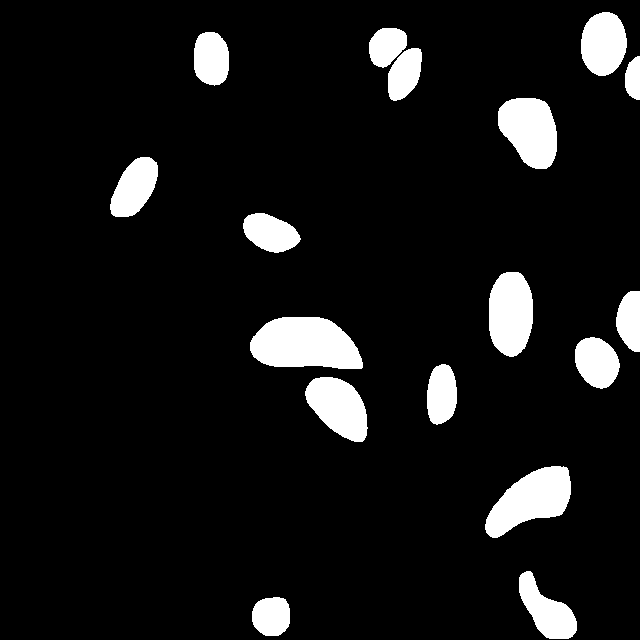

/content/bitirme-3/test/training-164_jpg.rf.03a61ef08181147c558cd33c4d5c812d.jpg


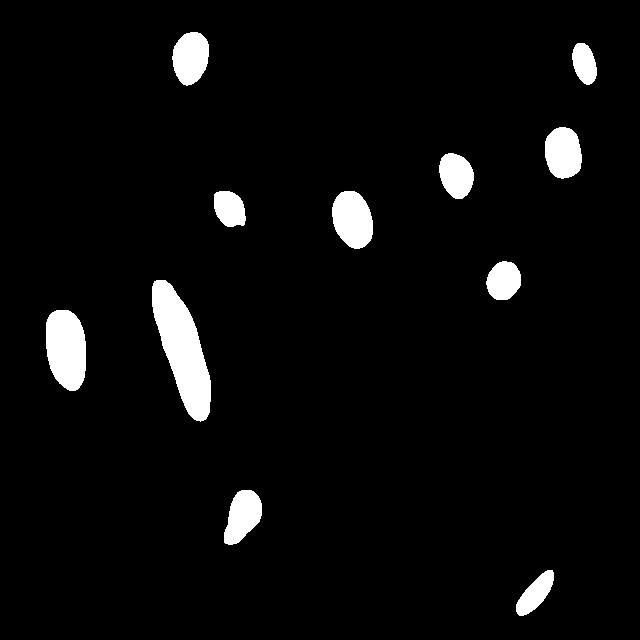

/content/bitirme-3/test/training-121_jpg.rf.16d46b3de4033d964da97cd29821a09f.jpg


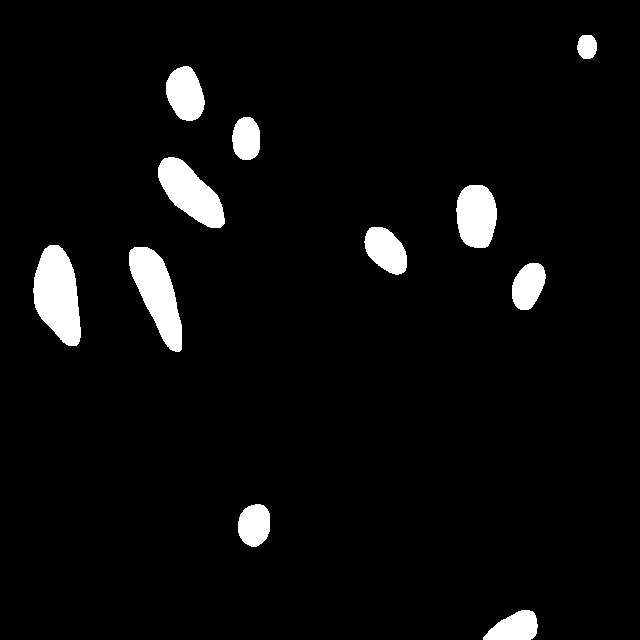

/content/bitirme-3/test/training-100_jpg.rf.14e244d28d914560ded55e9651bbb7ad.jpg


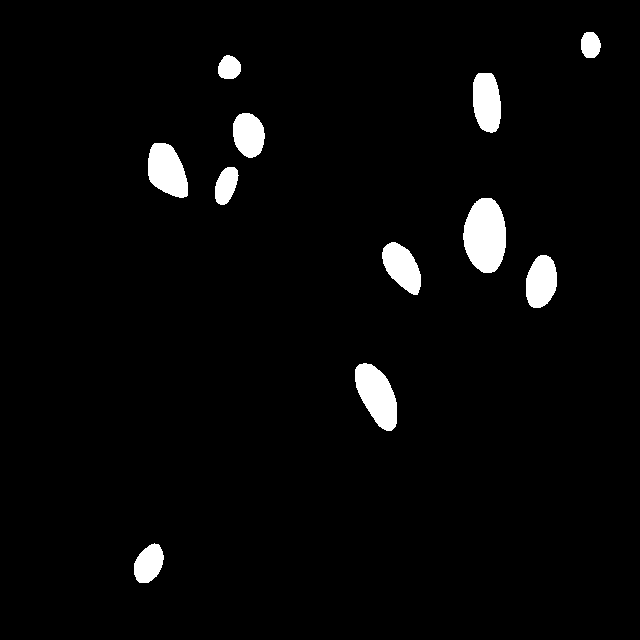

/content/bitirme-3/test/training-105_jpg.rf.0353f4bce17dc544e22ecfe4df71810d.jpg


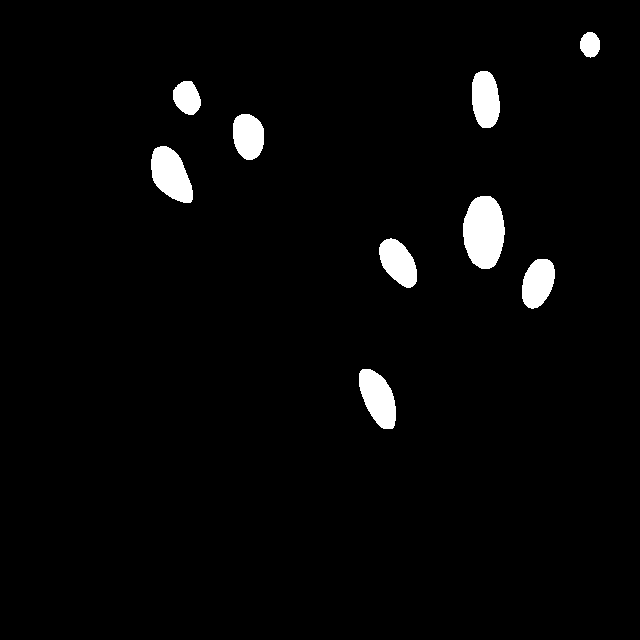

/content/bitirme-3/test/training-146_jpg.rf.0318b24c0c6ec4fcc17e70b0fb64549b.jpg


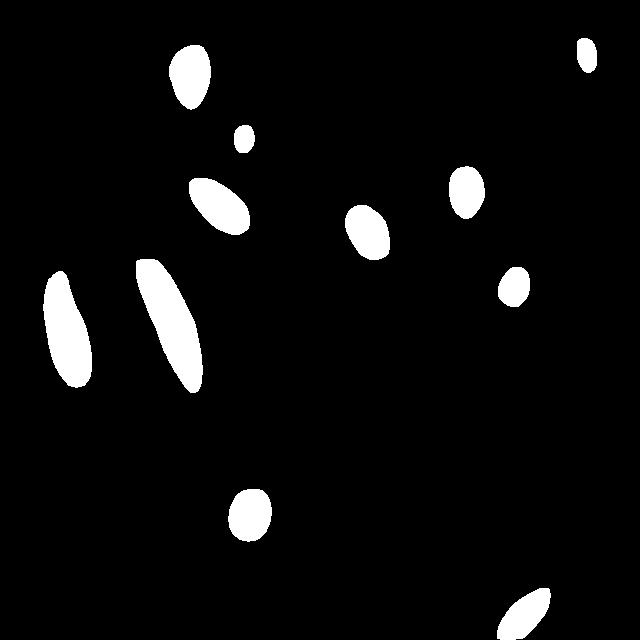

/content/bitirme-3/test/training-076_jpg.rf.1b1519395d441d625ca8fbf97a7cedf0.jpg


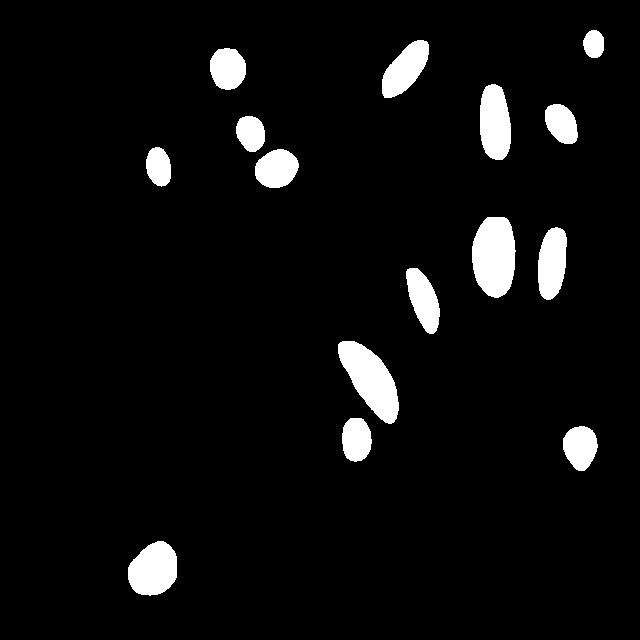

/content/bitirme-3/test/training-145_jpg.rf.0d9e16c9a61ccd7c857f91912cad65b1.jpg


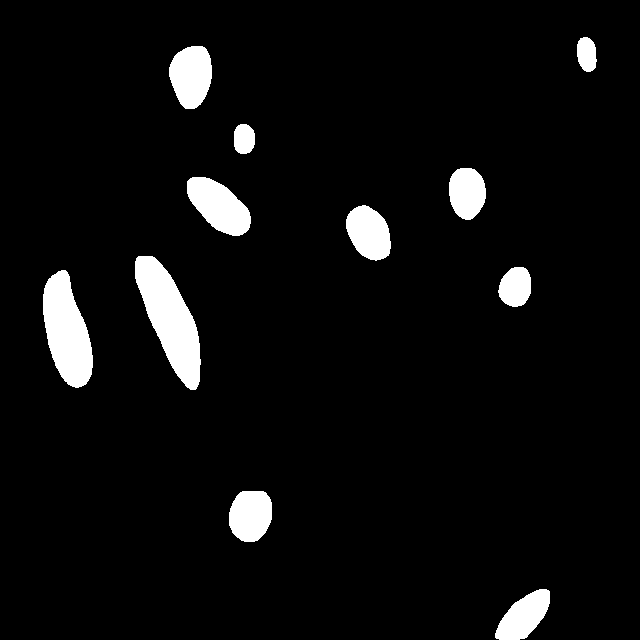

/content/bitirme-3/test/training-141_jpg.rf.18dfe17b9039aa863d1ac66b4cc257d0.jpg


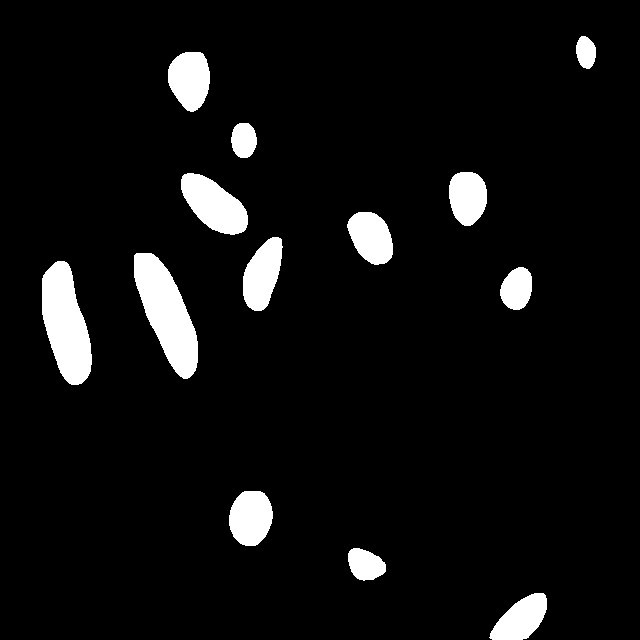

/content/bitirme-3/test/training-126_jpg.rf.22fe4c2dd104d3c183b1a52123fba09c.jpg


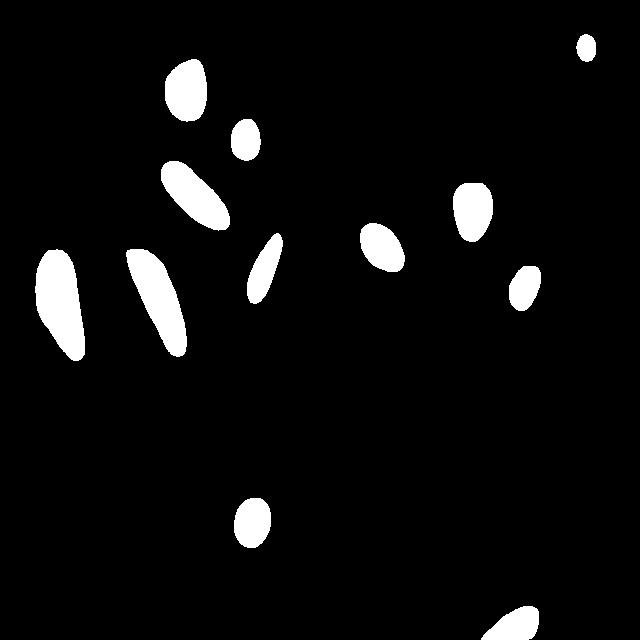

/content/bitirme-3/test/training-160_jpg.rf.0b41a3bed9801f12ad88a601a0934276.jpg


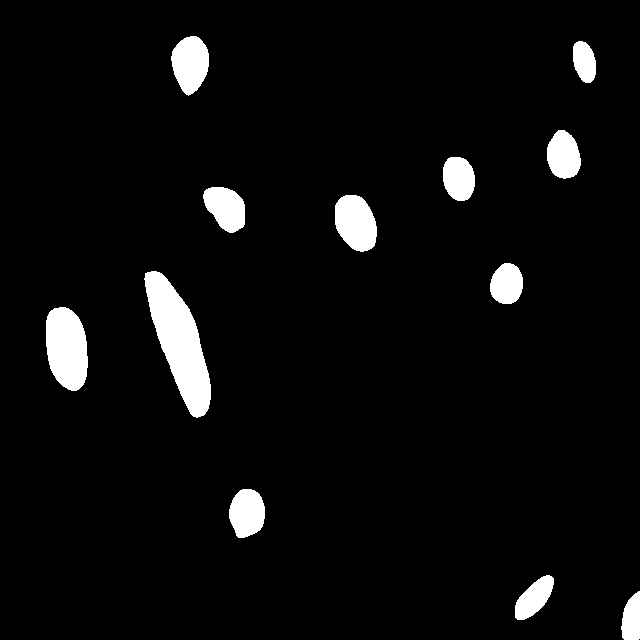

/content/bitirme-3/test/training-109_jpg.rf.11780e1ba2b4c74f62d5156dd191bfca.jpg


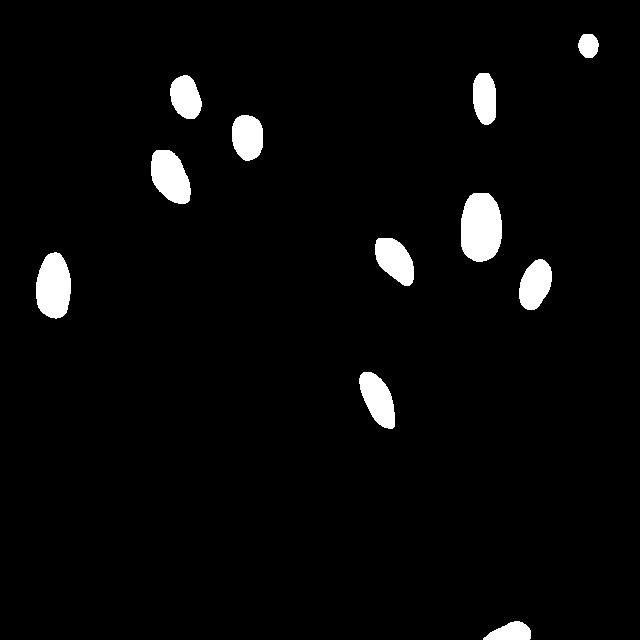

/content/bitirme-3/test/training-024_jpg.rf.17be7996799dd48af20f85f47d5e740d.jpg


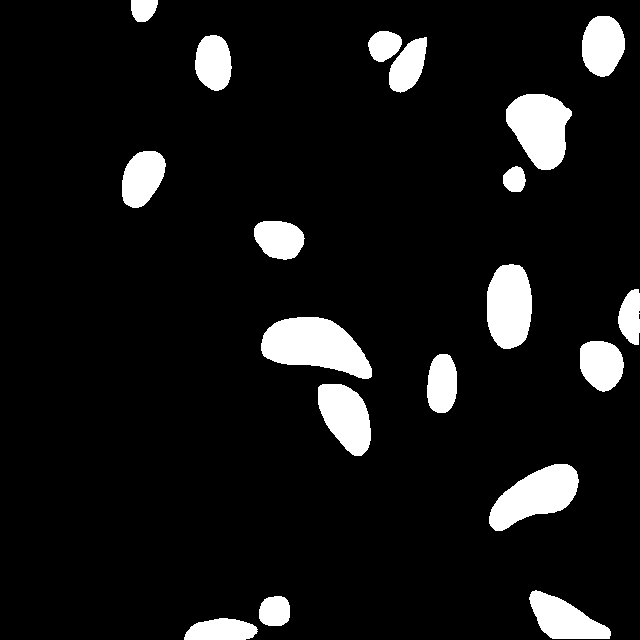

/content/bitirme-3/test/training-066_jpg.rf.21a4655488b3780466b74f31e7628a91.jpg


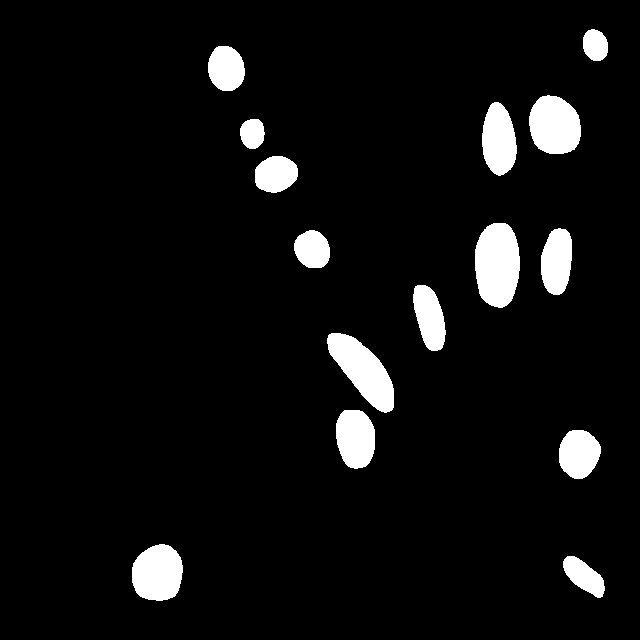

/content/bitirme-3/test/training-102_jpg.rf.2cdc5b439a0e2d8e8486b19cc6957f3b.jpg


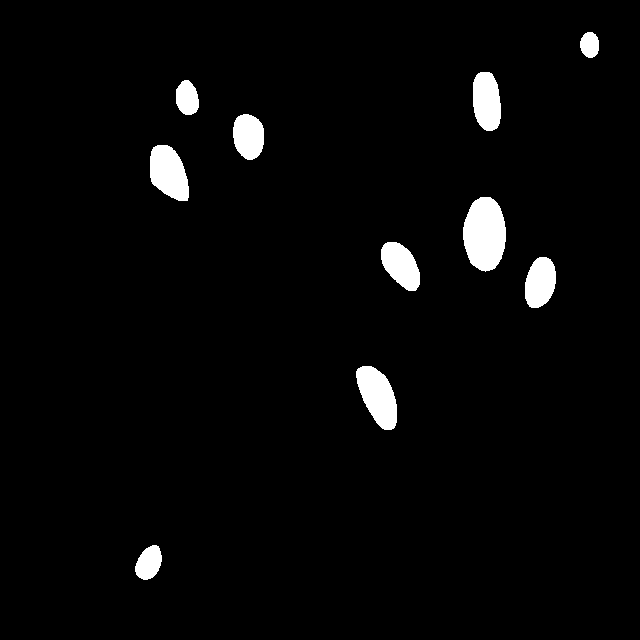

/content/bitirme-3/test/training-149_jpg.rf.1e4d281a5831d2c368e4d9584284d4d7.jpg


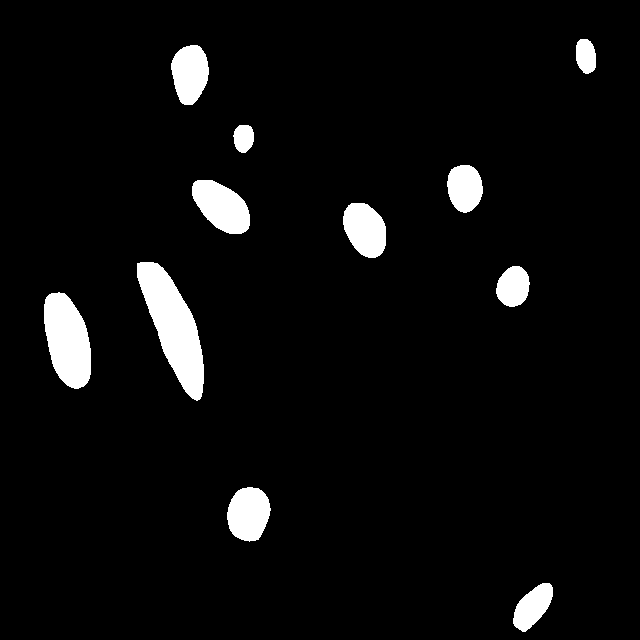

/content/bitirme-3/test/training-011_jpg.rf.26c3537d1e8d52146ce7f3aed18a5936.jpg


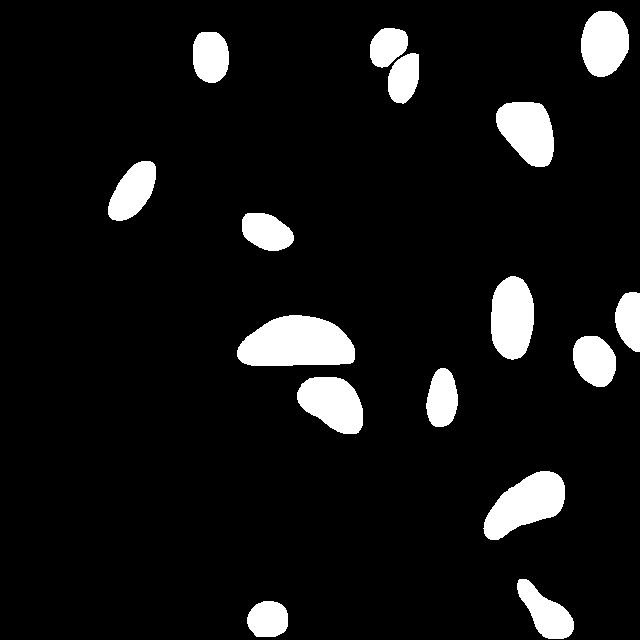

/content/bitirme-3/test/training-084_jpg.rf.1bcad2f62f06e1e77807827084986744.jpg


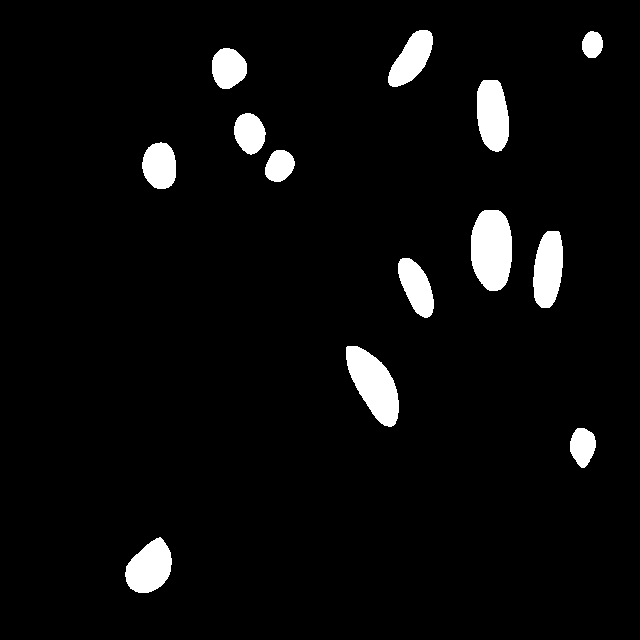

/content/bitirme-3/test/training-098_jpg.rf.20b2a62843f2f508c1167137ee2546df.jpg


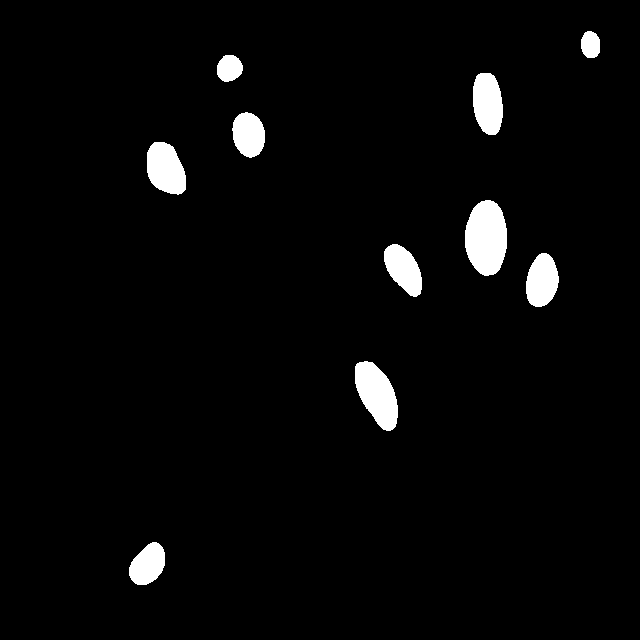

/content/bitirme-3/test/training-070_jpg.rf.23c2fe02ac343d72634ccf0c0ee1506d.jpg


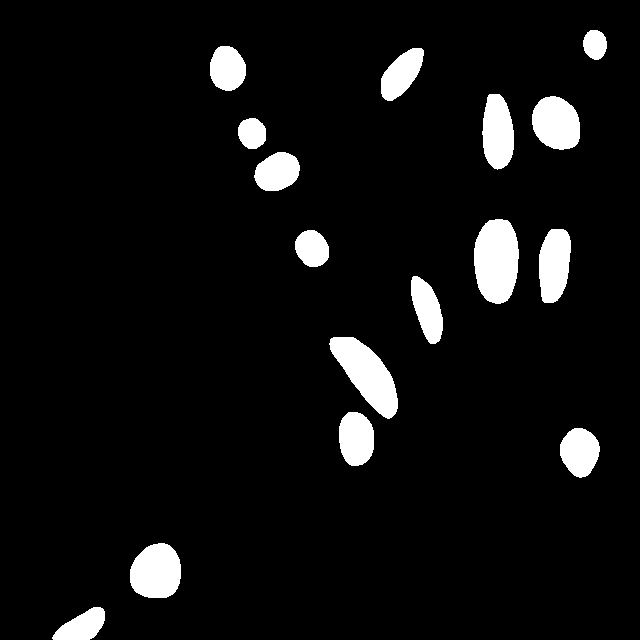

/content/bitirme-3/test/training-143_jpg.rf.22046531768b8f8d823337c0f81eeb80.jpg


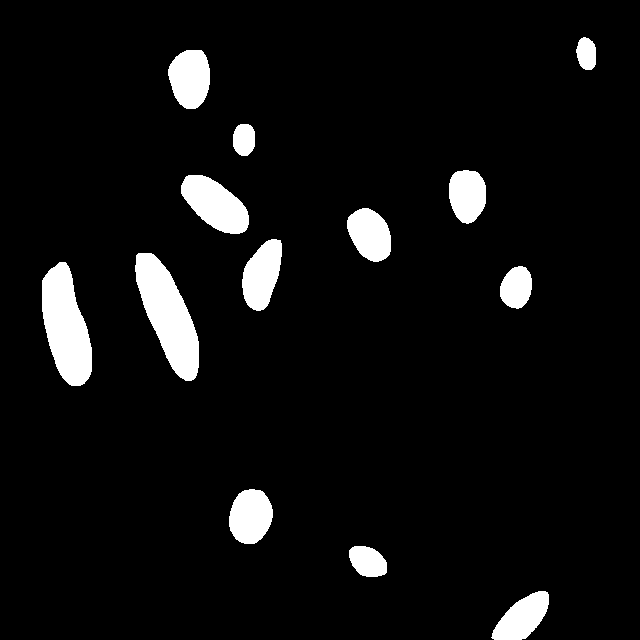

/content/bitirme-3/test/training-127_jpg.rf.041df53f0bb3cff0f28d86b21c9a2f6b.jpg


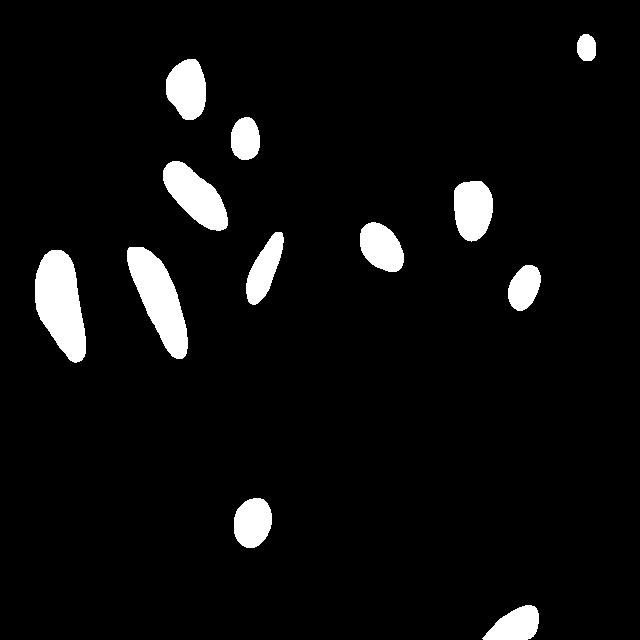

/content/bitirme-3/test/training-132_jpg.rf.213cf4a44c5081f7f6fd39c483c3961d.jpg


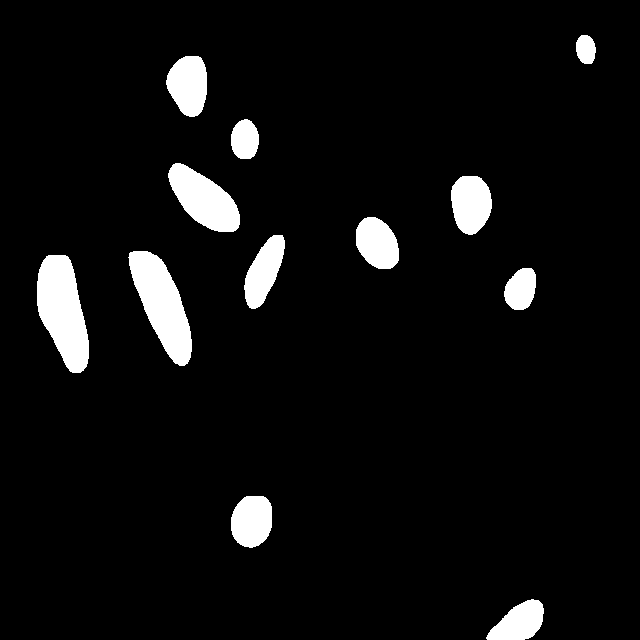

/content/bitirme-3/test/training-157_jpg.rf.2ca1a9d84caf3b5c425d2797feb3127c.jpg


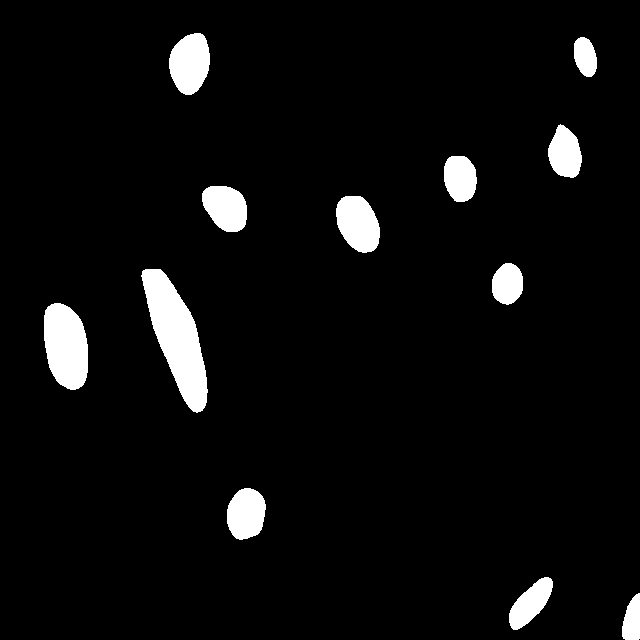

/content/bitirme-3/test/training-021_jpg.rf.2e5d9c5c20e479f26a7c83ea59b67d56.jpg


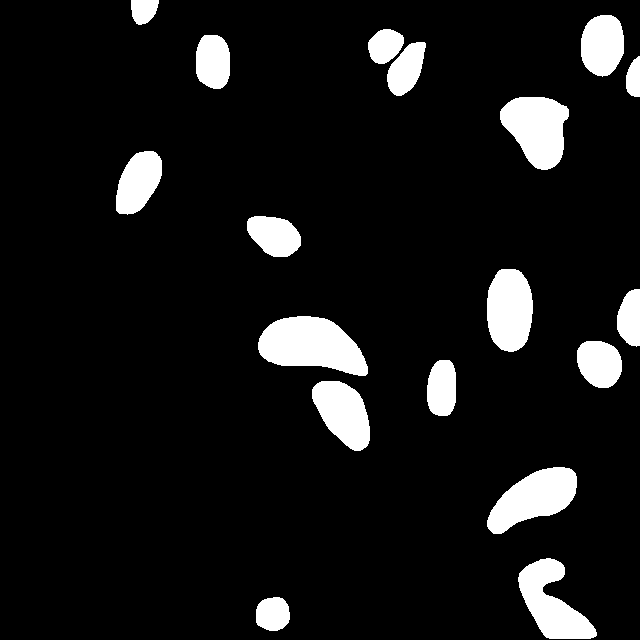

/content/bitirme-3/test/training-091_jpg.rf.38fbab4f12a87494fef9e4b4d66ff36e.jpg


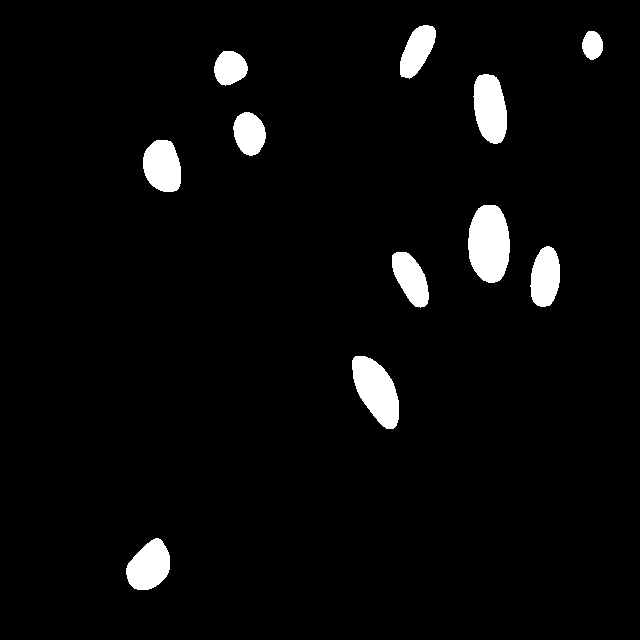

/content/bitirme-3/test/training-067_jpg.rf.23b0d016af49f70930f1f5234ab10224.jpg


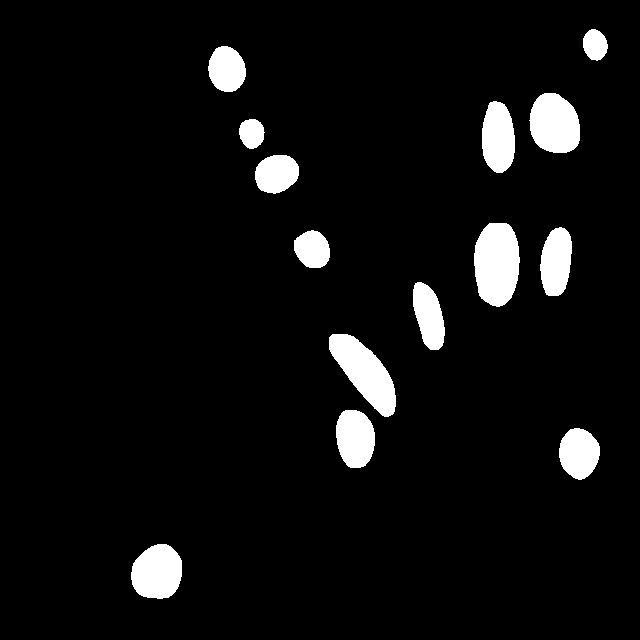

/content/bitirme-3/test/training-040_jpg.rf.306ca59f21c5a360b3cdad4add053598.jpg


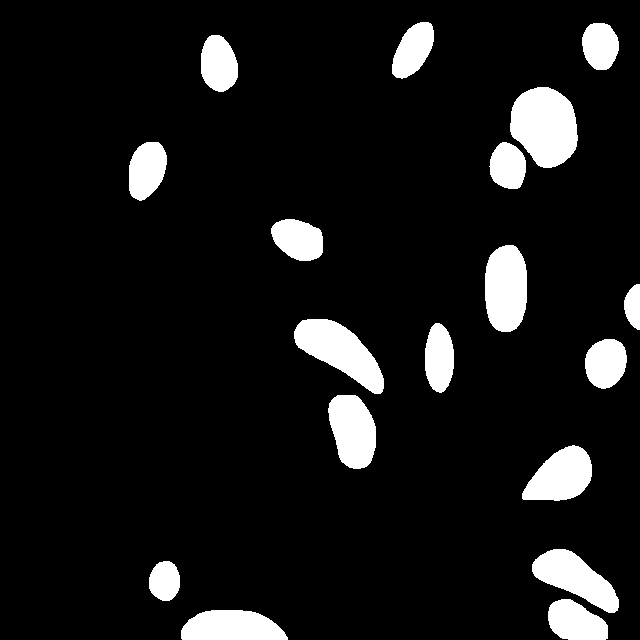

/content/bitirme-3/test/training-051_jpg.rf.41f1b8cf2d454046ab2dcf3139b65d67.jpg


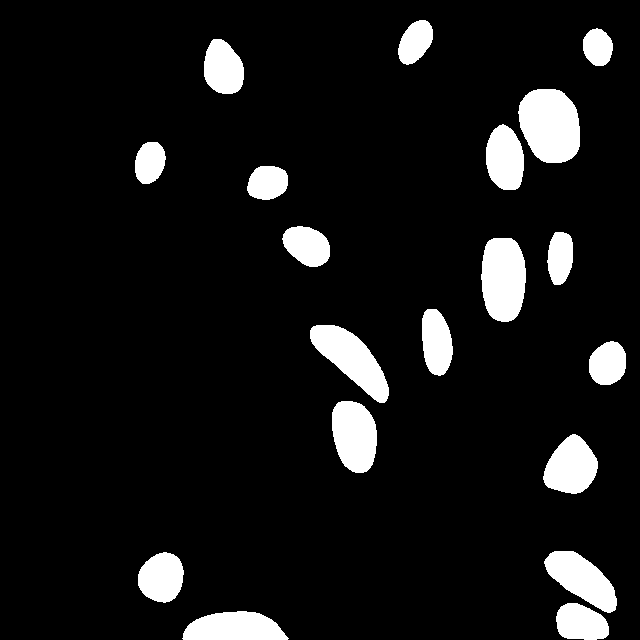

/content/bitirme-3/test/training-034_jpg.rf.2f8e16c368661c90f739f6f707fcb05b.jpg


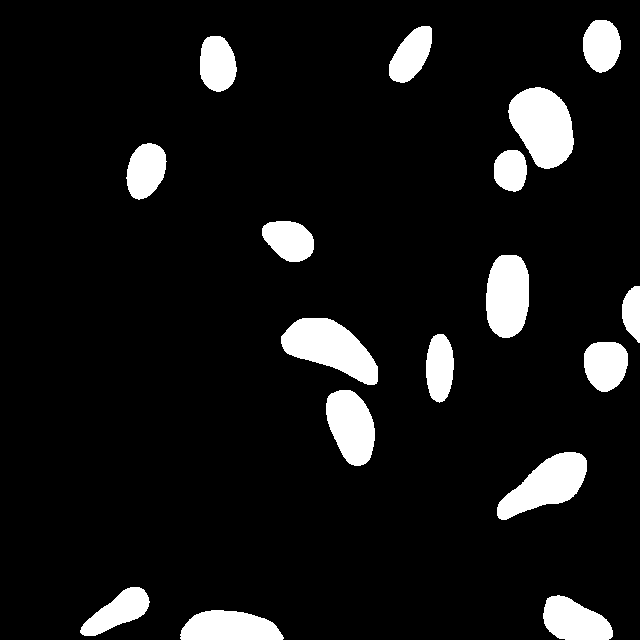

/content/bitirme-3/test/training-052_jpg.rf.42270028d6075913129bdac41fe4cebc.jpg


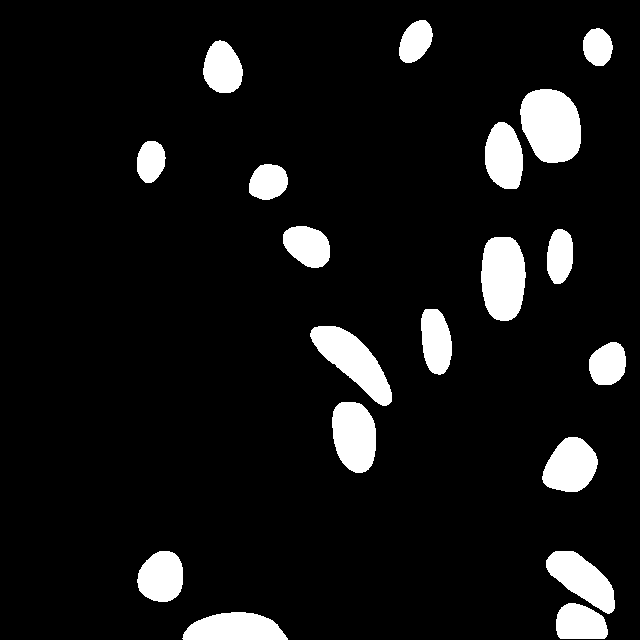

/content/bitirme-3/test/training-128_jpg.rf.33bec863cc82c9e737eeaafb726e5bea.jpg


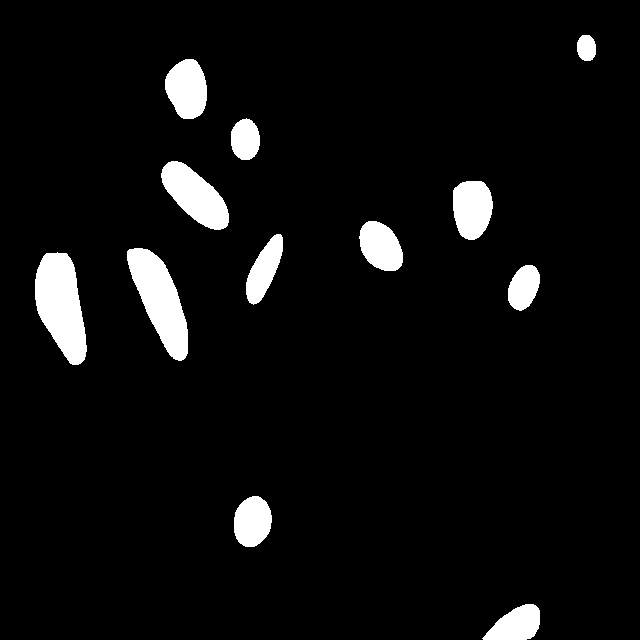

/content/bitirme-3/test/training-122_jpg.rf.433b28e62cce6eccd864554fb8256332.jpg


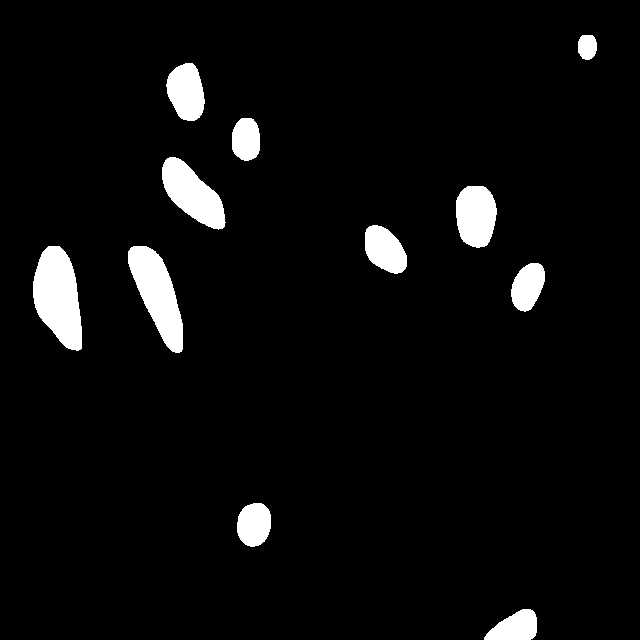

/content/bitirme-3/test/training-099_jpg.rf.3bb5291bfe7845ea3f2e992303881078.jpg


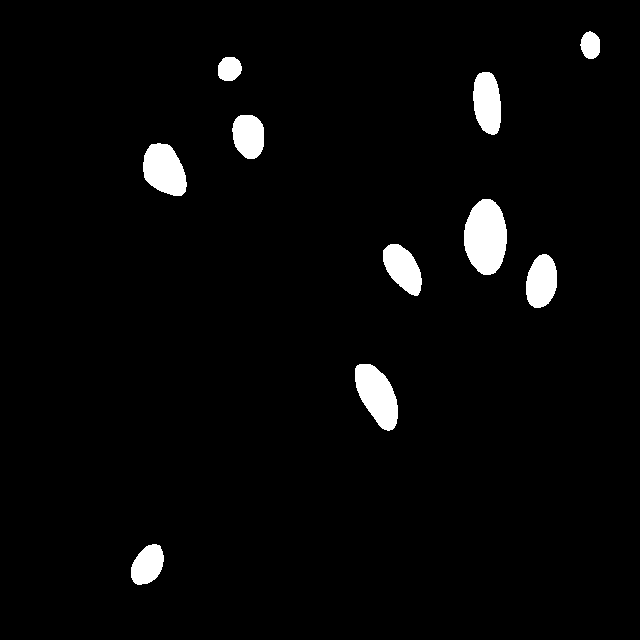

/content/bitirme-3/test/training-057_jpg.rf.31bf2788013f9dc88347eb8a97c3b187.jpg


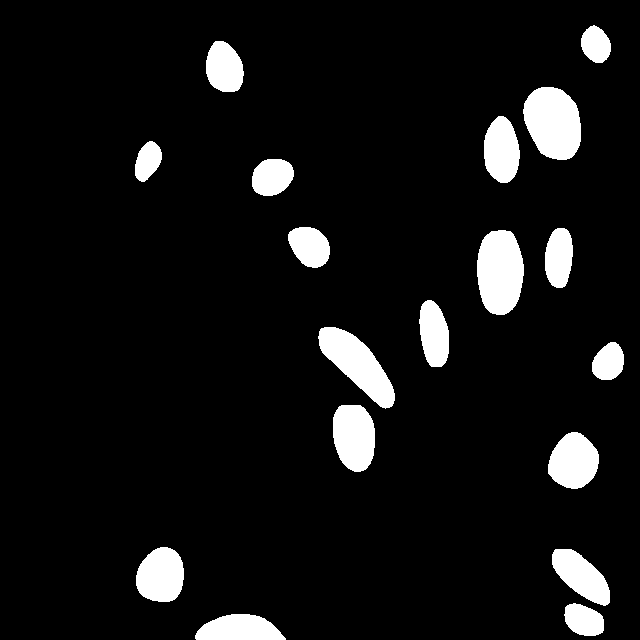

/content/bitirme-3/test/training-068_jpg.rf.2f9fb6ecdca2d14961bfe2a84a9c7975.jpg


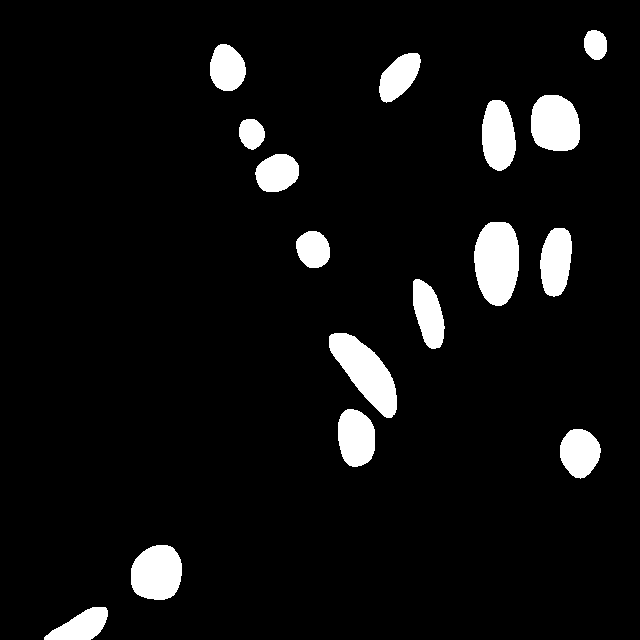

/content/bitirme-3/test/training-112_jpg.rf.4fced0d51aa433d32338299f4f336cb4.jpg


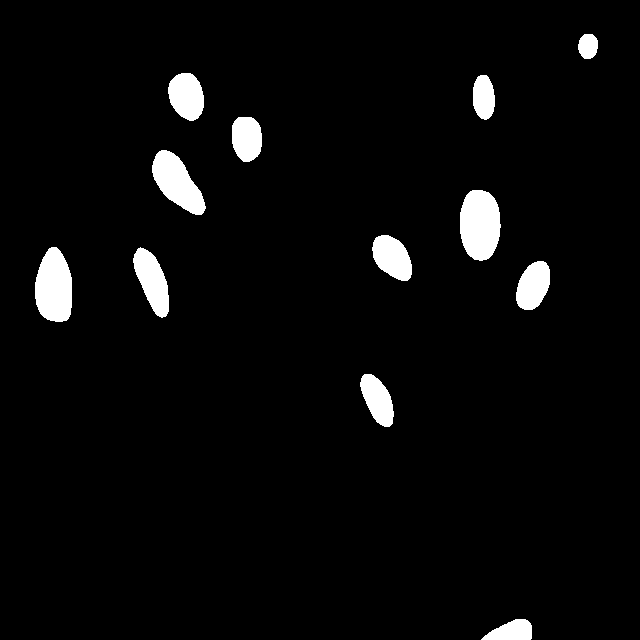

/content/bitirme-3/test/training-159_jpg.rf.2d2b6f84d3fd030dbd26135a1cfaa279.jpg


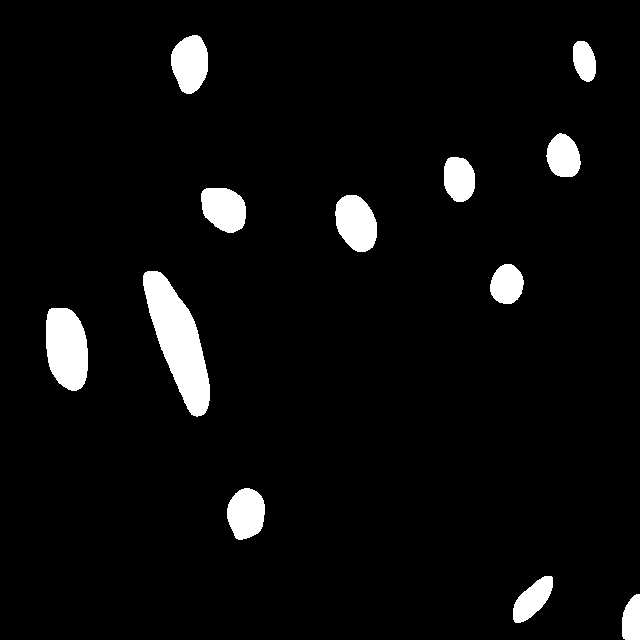

/content/bitirme-3/test/training-092_jpg.rf.4fc7c31ecc7c545c499aeeadafeb47be.jpg


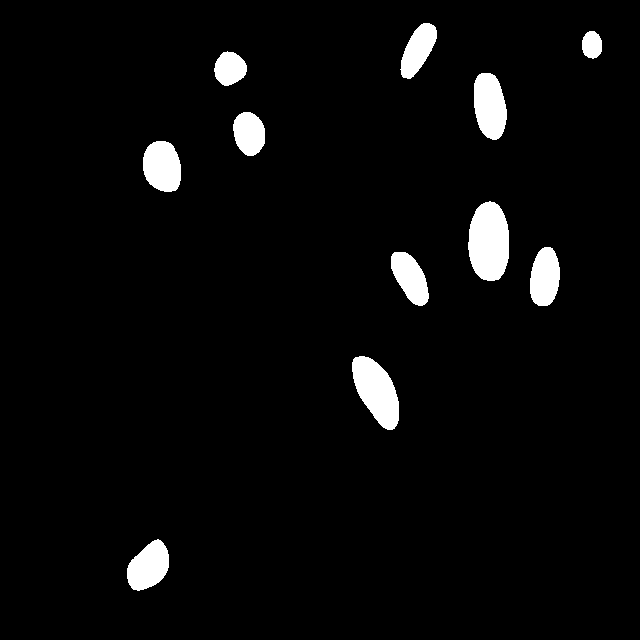

/content/bitirme-3/test/training-006_jpg.rf.4818ecf61d2b211ac35afa47c718817d.jpg


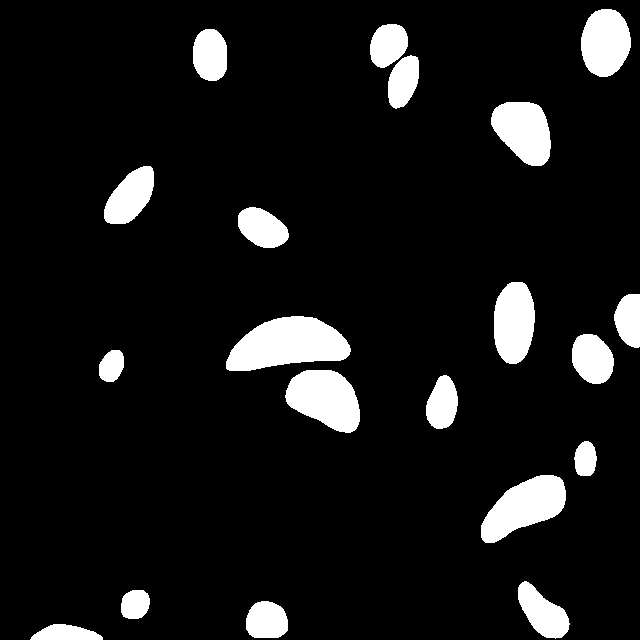

/content/bitirme-3/test/training-009_jpg.rf.39f4fe1501a533ae0fabd3e83ed00e2c.jpg


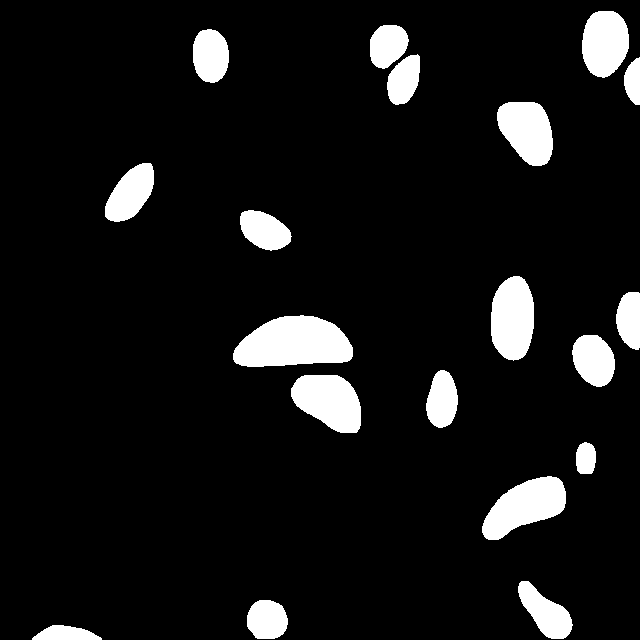

/content/bitirme-3/test/training-138_jpg.rf.45e8d1d96cd5ee9a610e8b8d44923430.jpg


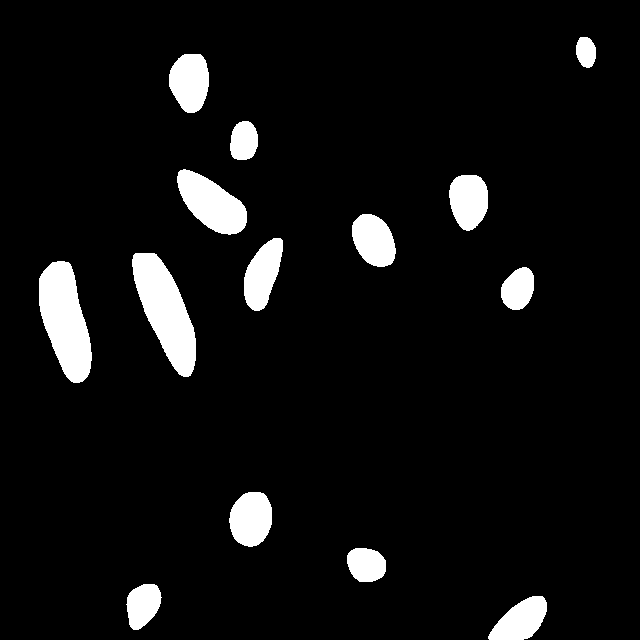

/content/bitirme-3/test/training-095_jpg.rf.4ee804fa52cdaef3411ee2c4c973cc7e.jpg


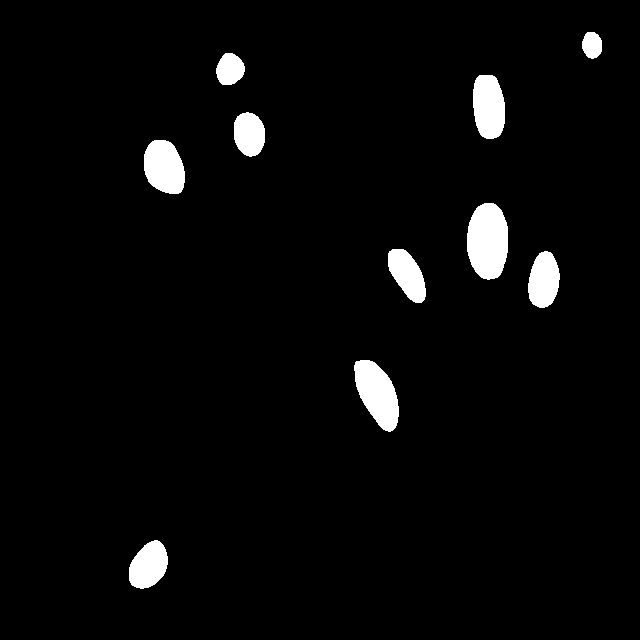

/content/bitirme-3/test/training-036_jpg.rf.3ab9d817d7cd0b5442d5005c1253e17c.jpg


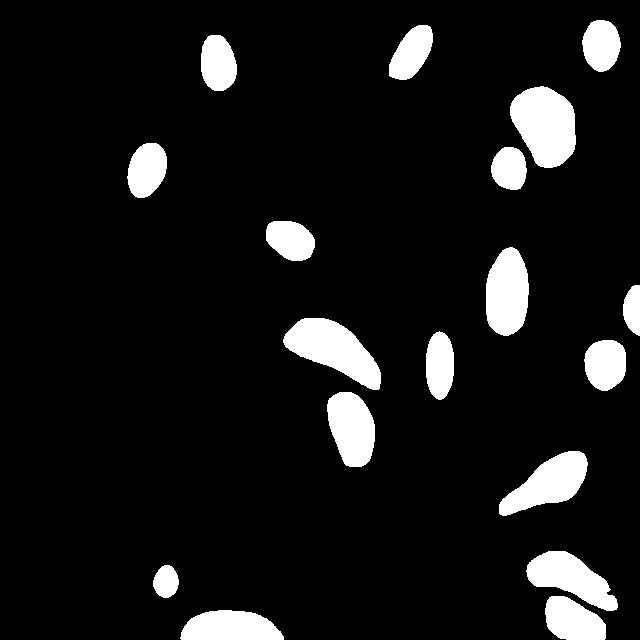

/content/bitirme-3/test/training-103_jpg.rf.64449523a401fd205a5b6a78f86c954a.jpg


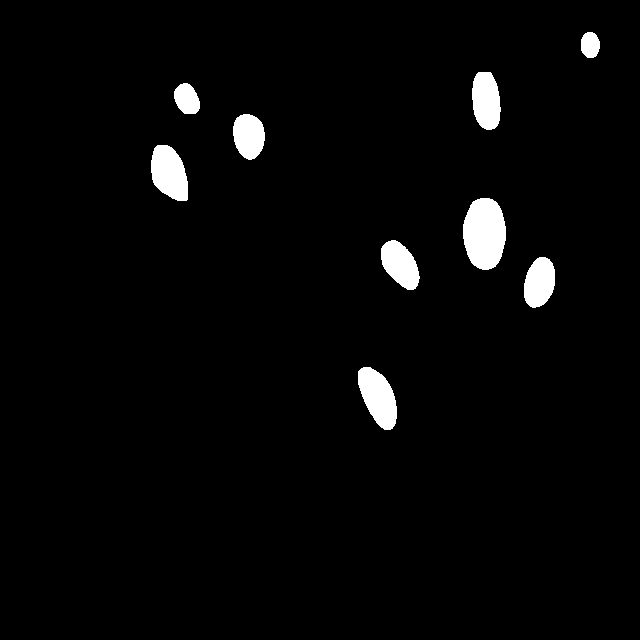

/content/bitirme-3/test/training-031_jpg.rf.5bcc3b4c74c3aa80712c9374c766bb2d.jpg


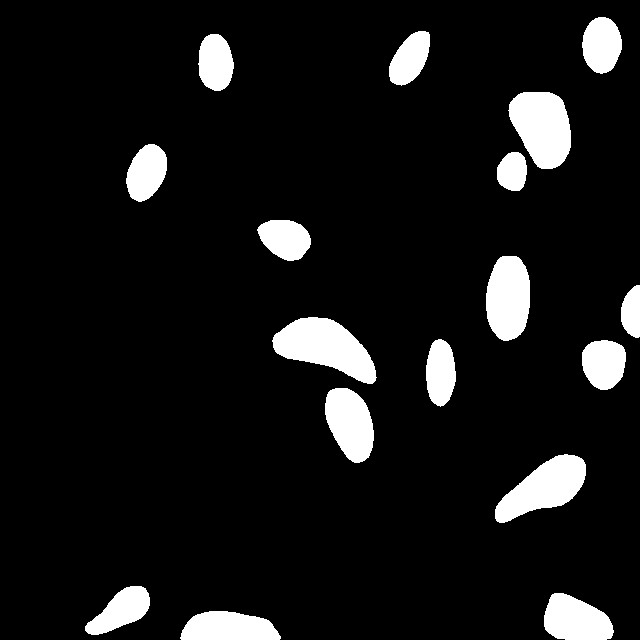

/content/bitirme-3/test/training-045_jpg.rf.60a732f8b3a1441f7ccb79fc0c95d180.jpg


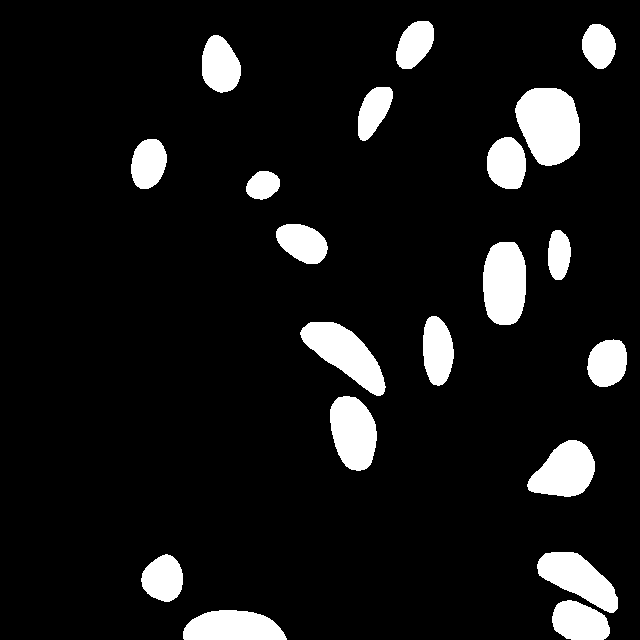

/content/bitirme-3/test/training-125_jpg.rf.3155b2bb38e9c9fb4b8d62482d1c849b.jpg


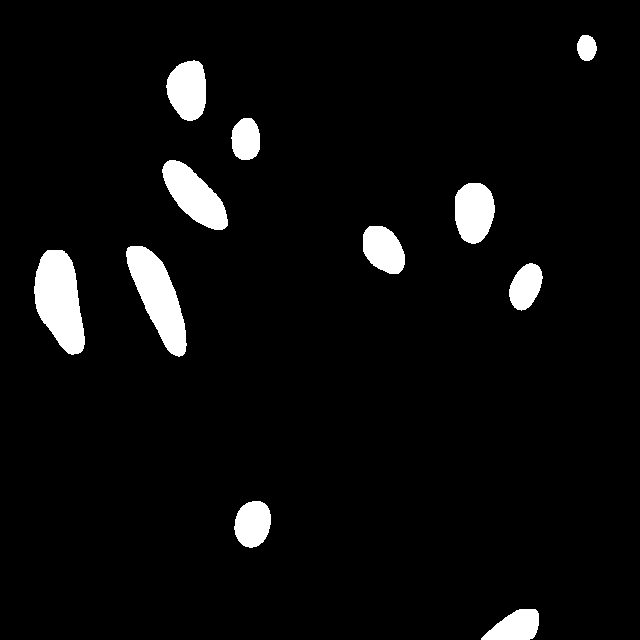

/content/bitirme-3/test/training-053_jpg.rf.672e831f52e1ff9f9d02c7c78901629d.jpg


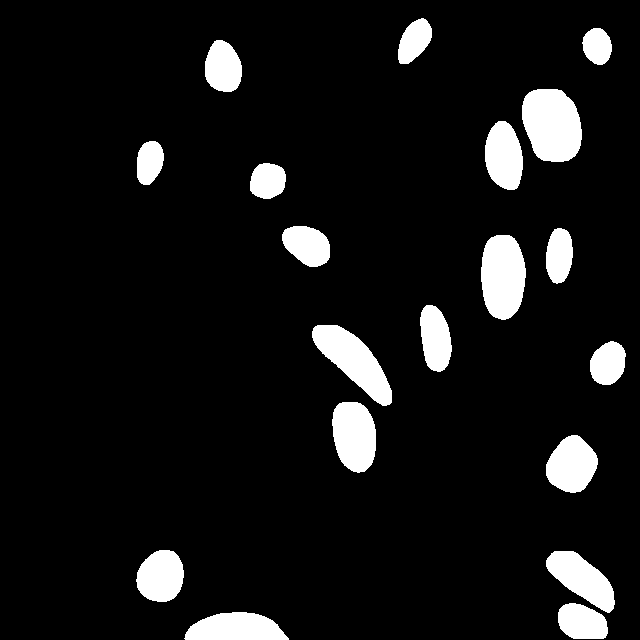

/content/bitirme-3/test/training-116_jpg.rf.4f405d9162bbe90d22bed7254a294bba.jpg


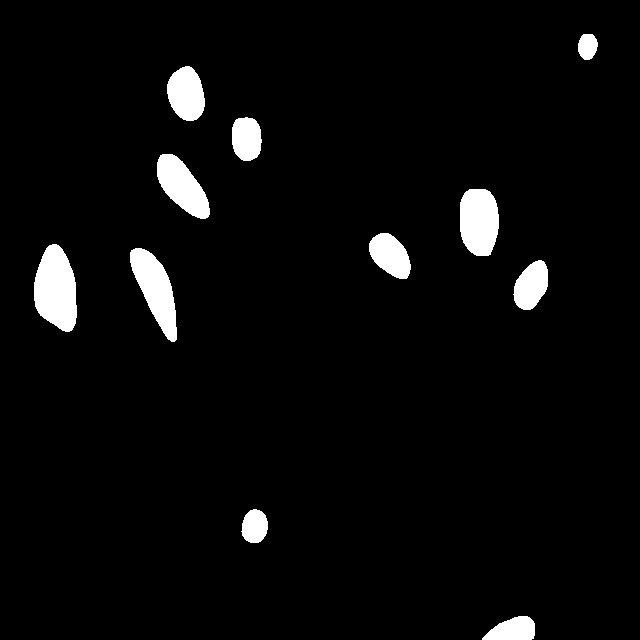

/content/bitirme-3/test/training-090_jpg.rf.2ea397beded0c961d4e4923da8f810aa.jpg


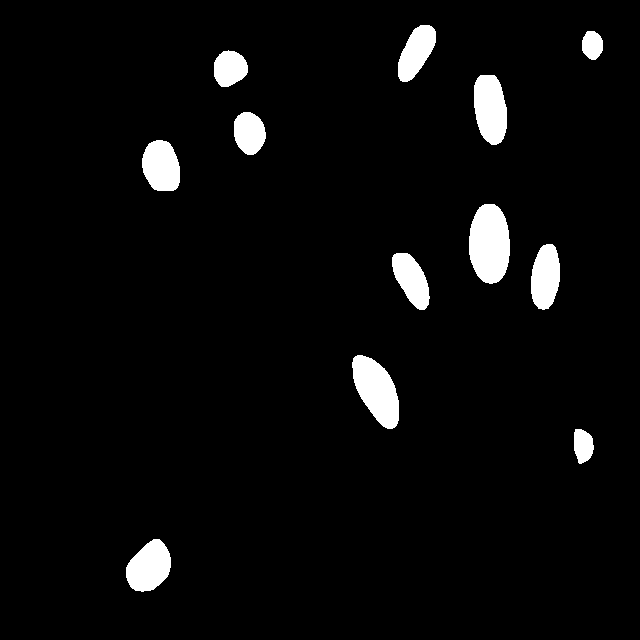

/content/bitirme-3/test/training-056_jpg.rf.4a13dea05a600d567af096e7b54615a8.jpg


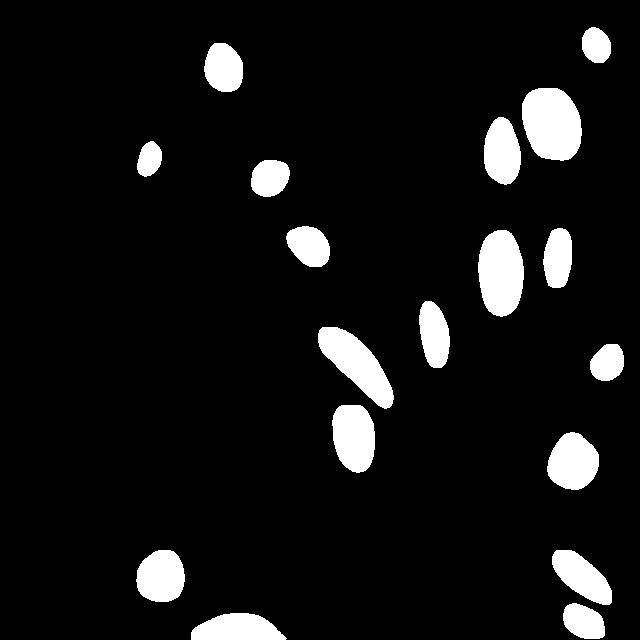

/content/bitirme-3/test/training-142_jpg.rf.59bc9d50bb7e37ac176e62c697060af0.jpg


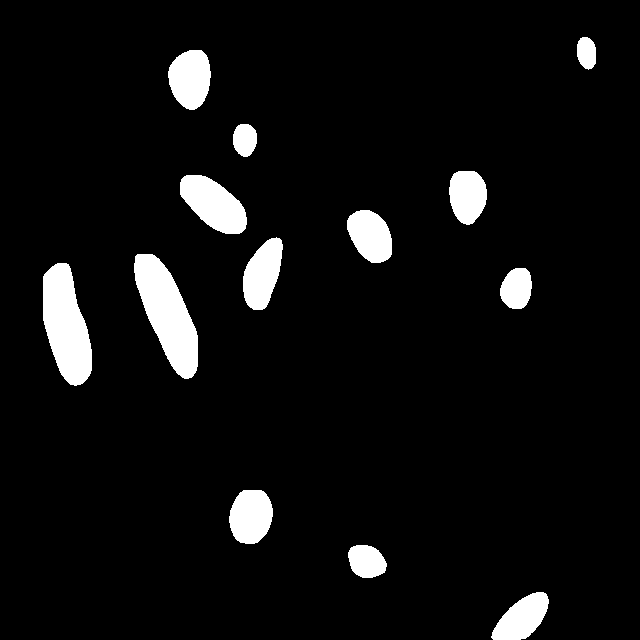

/content/bitirme-3/test/training-042_jpg.rf.683a127134aa8ad0c073665b2e3049b2.jpg


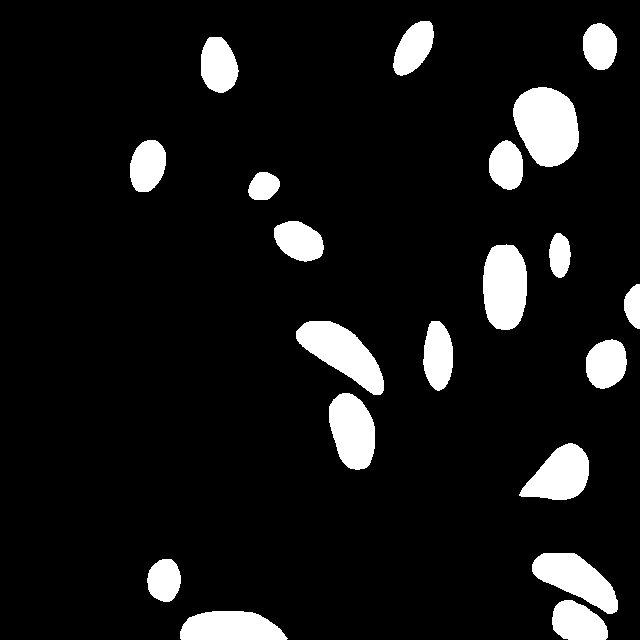

/content/bitirme-3/test/training-119_jpg.rf.7c5f68bb817c30867629c69b19b595ce.jpg


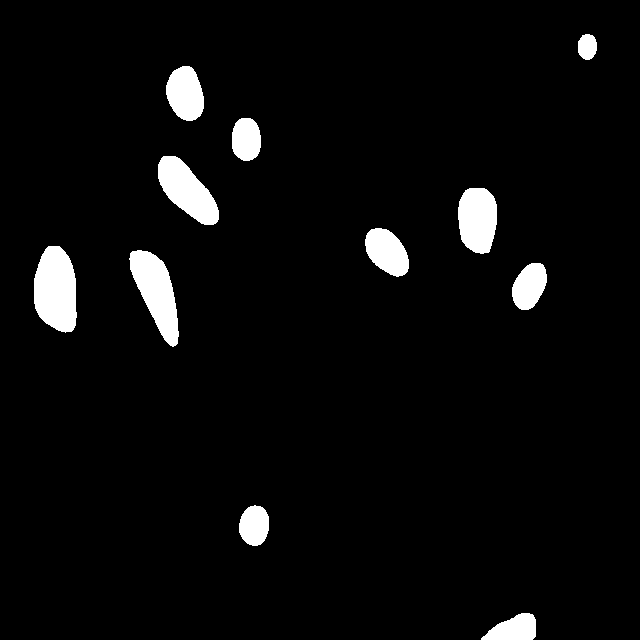

/content/bitirme-3/test/training-120_jpg.rf.72dd9cd09fd3ccc9c859e26372a9ded7.jpg


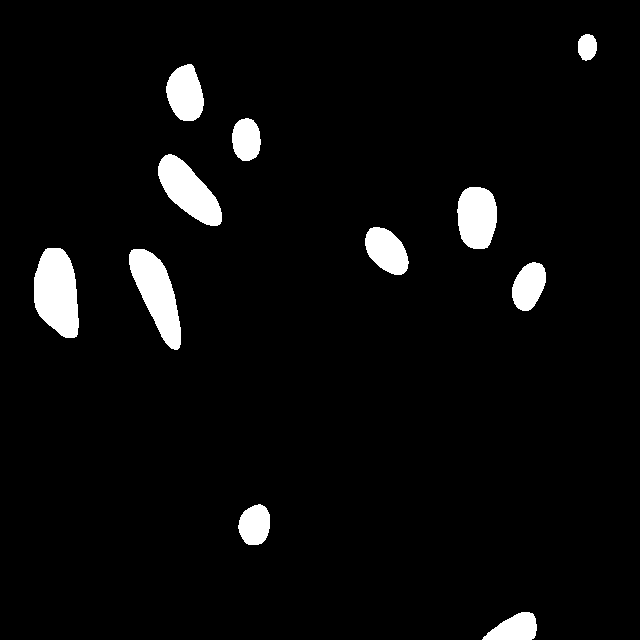

/content/bitirme-3/test/training-046_jpg.rf.63abae95aae9462b3e67bcf84ad2fd42.jpg


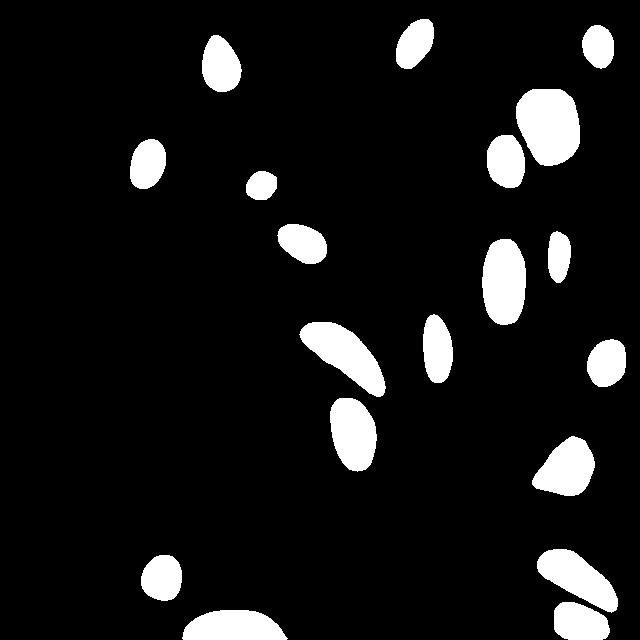

/content/bitirme-3/test/training-038_jpg.rf.5753f46e524fad2fd9038c35cc50c0b9.jpg


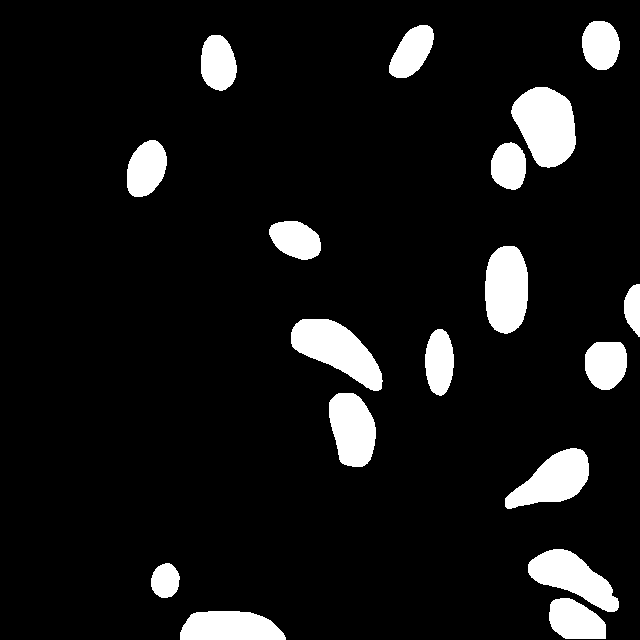

/content/bitirme-3/test/training-019_jpg.rf.772115eec5ada1597c2a8fa7ebc8ca8d.jpg


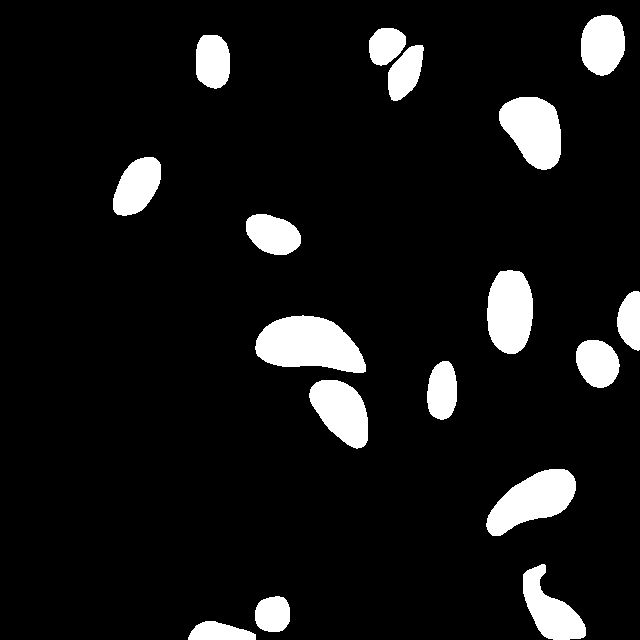

/content/bitirme-3/test/training-005_jpg.rf.850822d6e229245efe5e477571e22081.jpg


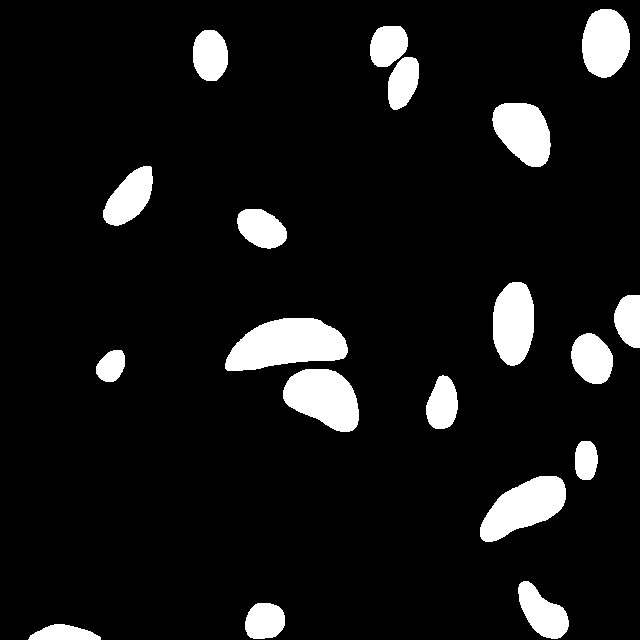

/content/bitirme-3/test/training-133_jpg.rf.6595f41cc5cf17a6d199552c06d4fd54.jpg


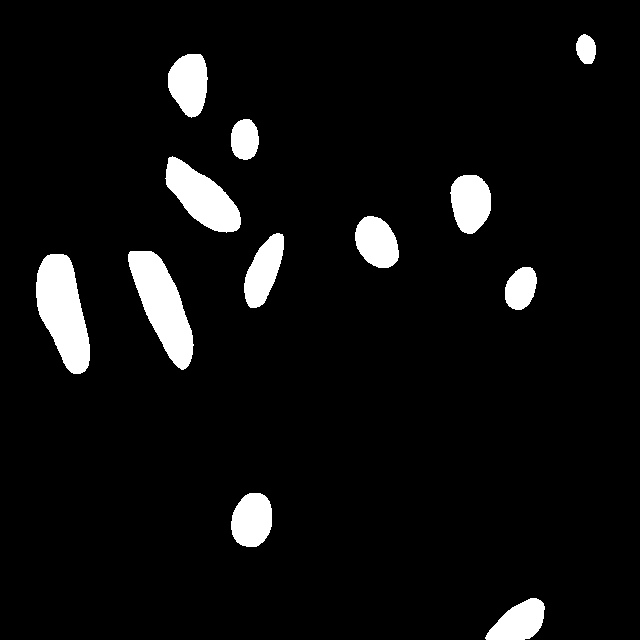

/content/bitirme-3/test/training-026_jpg.rf.7fea5ca86e05223c148248741d1402f9.jpg


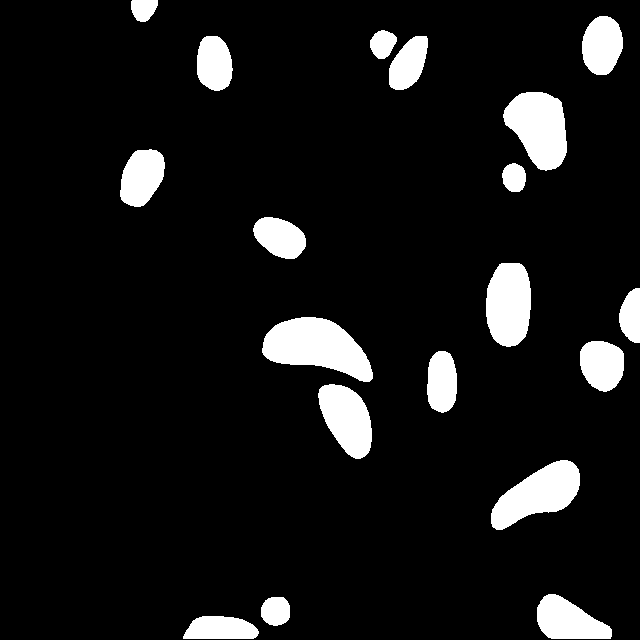

/content/bitirme-3/test/training-071_jpg.rf.68d8825711652d8286035d99d982c988.jpg


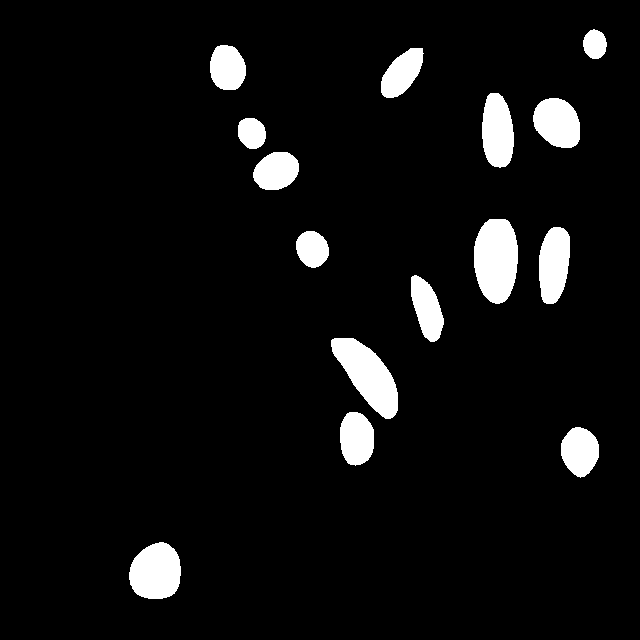

/content/bitirme-3/test/training-134_jpg.rf.80fef21d85f0a035ce2f842bf229bd2f.jpg


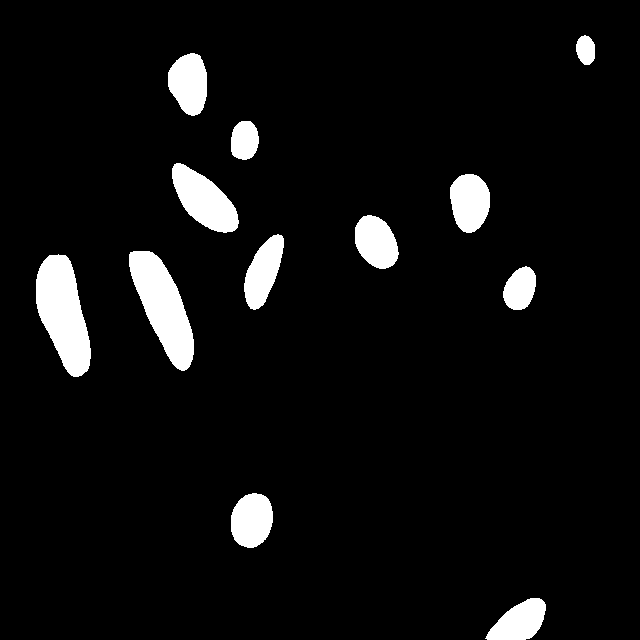

/content/bitirme-3/test/training-013_jpg.rf.674e5d65d3ea9f2eb721cce31d6fadbd.jpg


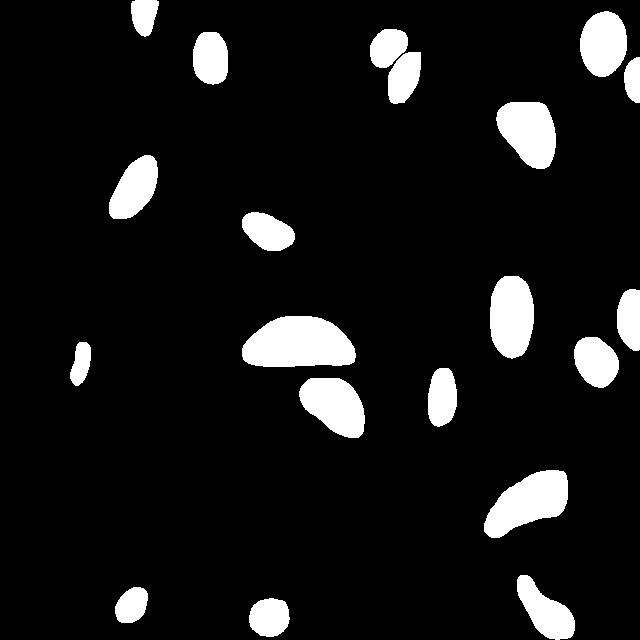

/content/bitirme-3/test/training-075_jpg.rf.94510589cc403821e533d51aa9765ad1.jpg


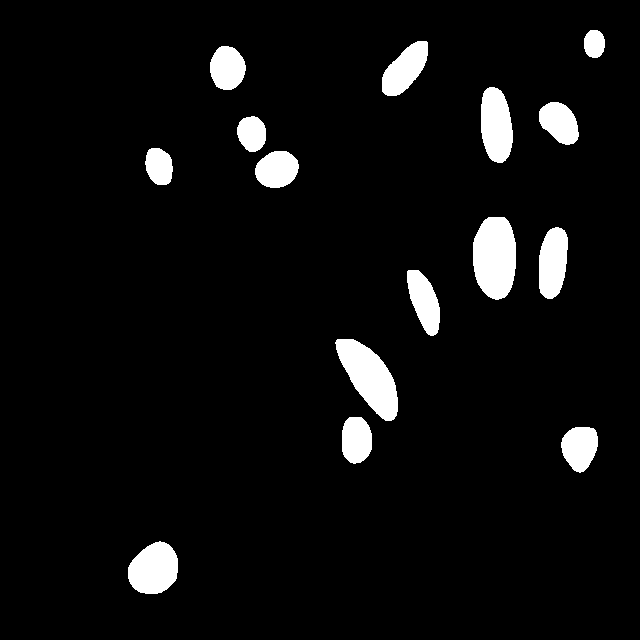

/content/bitirme-3/test/training-082_jpg.rf.90442ba21a37d43bd1ed6c09957e3309.jpg


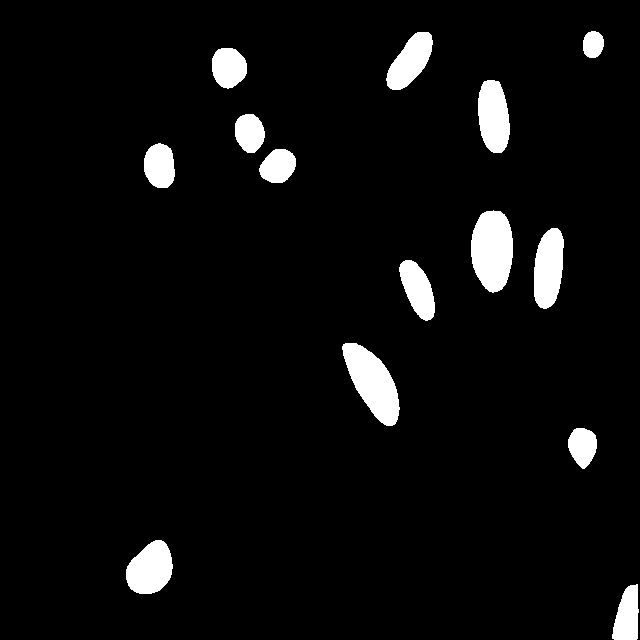

/content/bitirme-3/test/training-008_jpg.rf.8b4ab8b57c6c942acc351efba32439c5.jpg


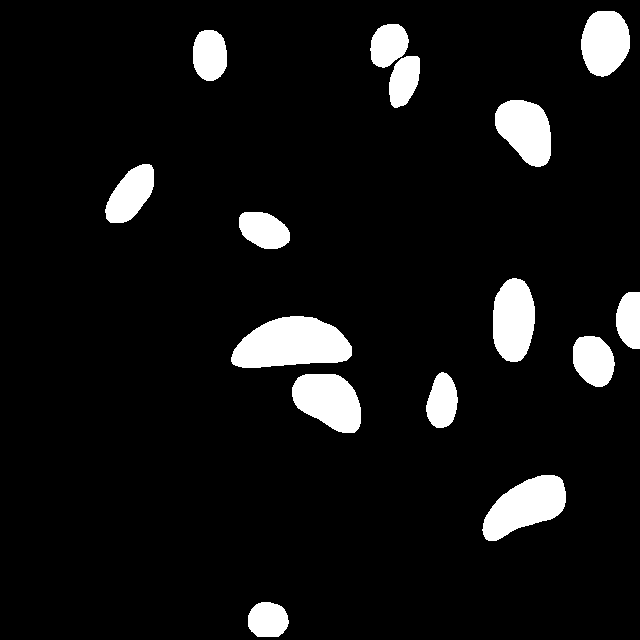

/content/bitirme-3/test/training-062_jpg.rf.67bbf5b1f76a7763d346cc61d3b2be38.jpg


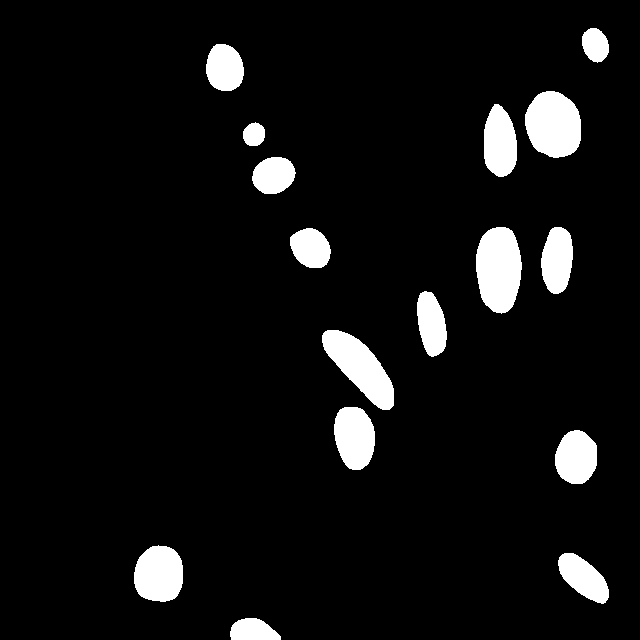

/content/bitirme-3/test/training-089_jpg.rf.658e54943df0138e8aed7fcdbb8fec55.jpg


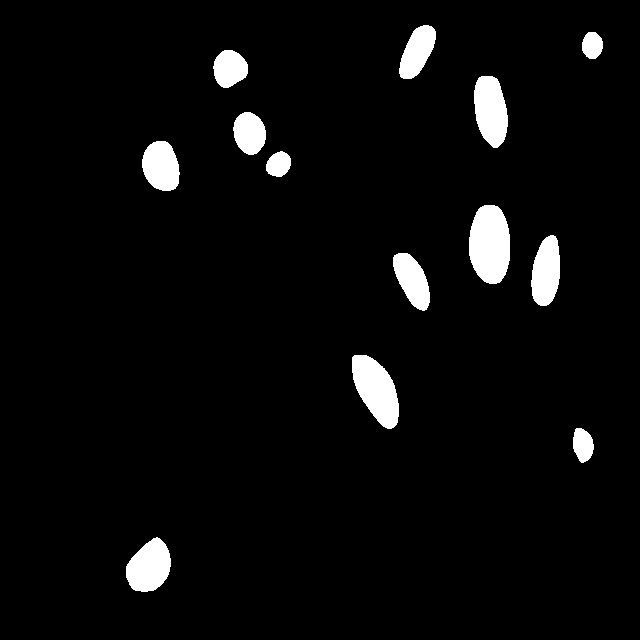

/content/bitirme-3/test/training-158_jpg.rf.6b11ba662d5785b5018c398254aeb289.jpg


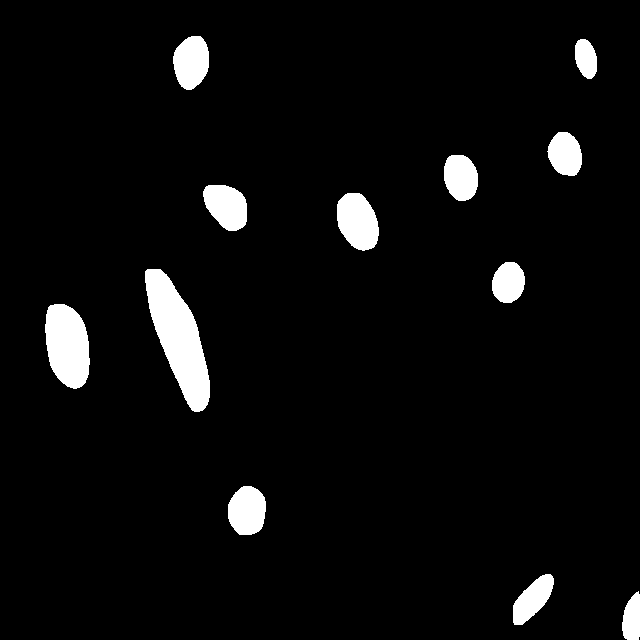

/content/bitirme-3/test/training-163_jpg.rf.87c213aa66b08ff12510474e0b4c9808.jpg


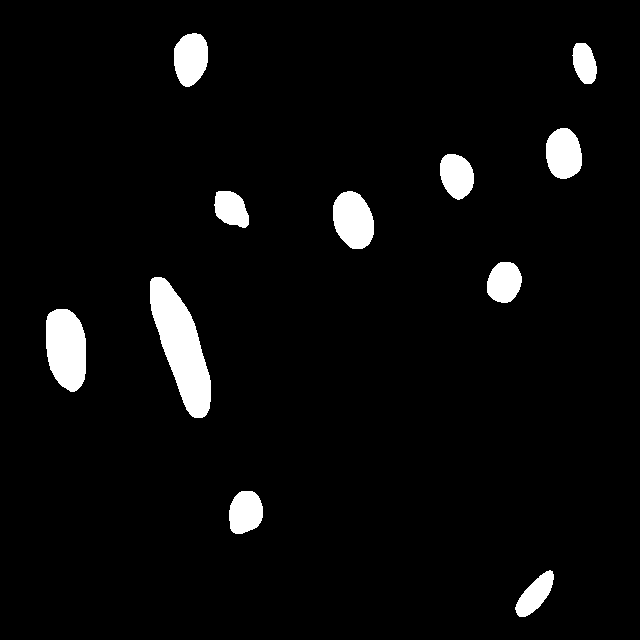

/content/bitirme-3/test/training-097_jpg.rf.8b42da92c4f8cc4d60d295c55b140ee9.jpg


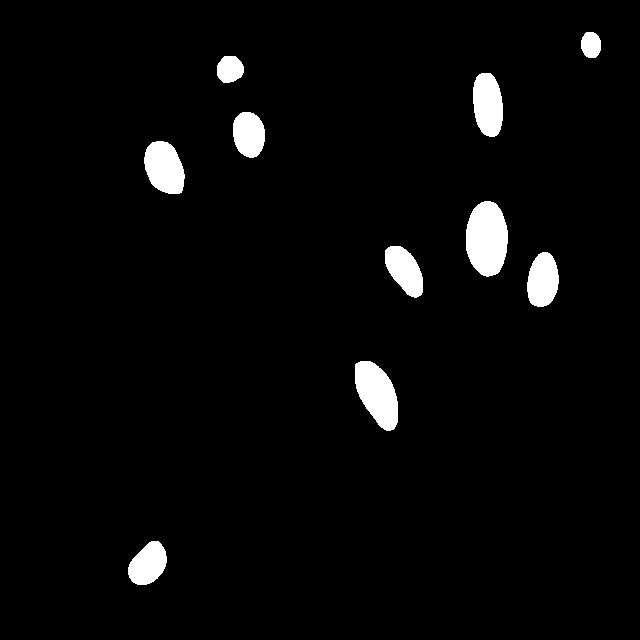

/content/bitirme-3/test/training-014_jpg.rf.3ba810de46b45ccc2714d6c3752b52ff.jpg


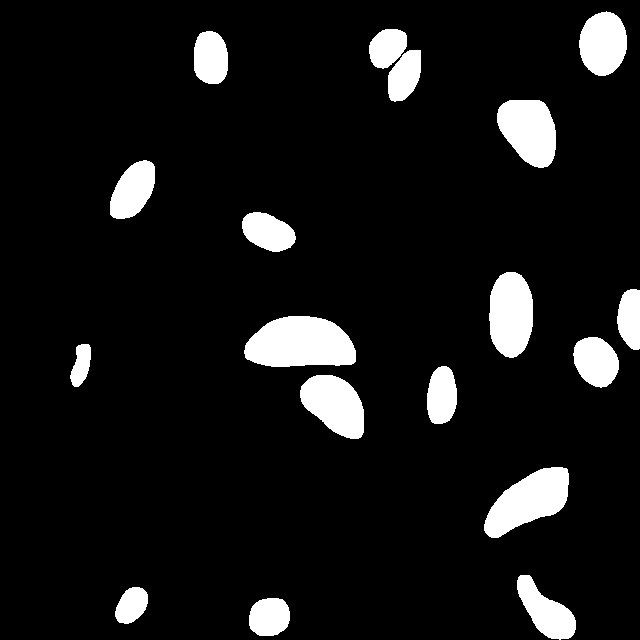

/content/bitirme-3/test/training-059_jpg.rf.89c725931a0bb15193b7f26578ad70a4.jpg


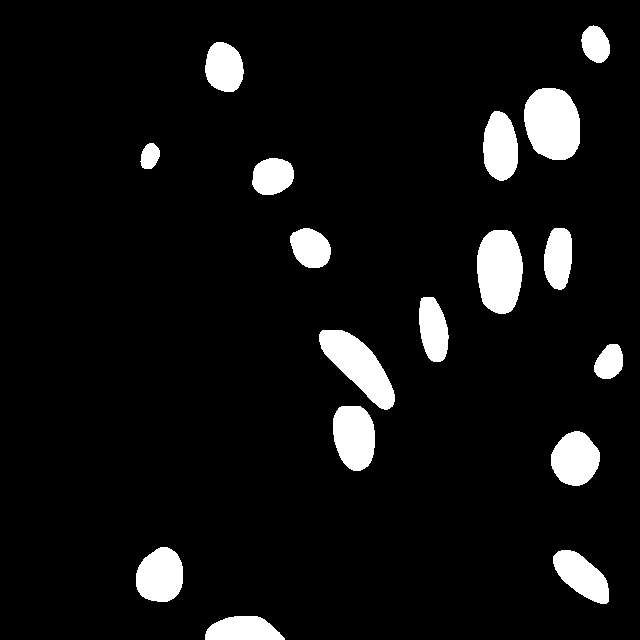

/content/bitirme-3/test/training-039_jpg.rf.693efa82ba36bbafddf4ccf3a7ecf013.jpg


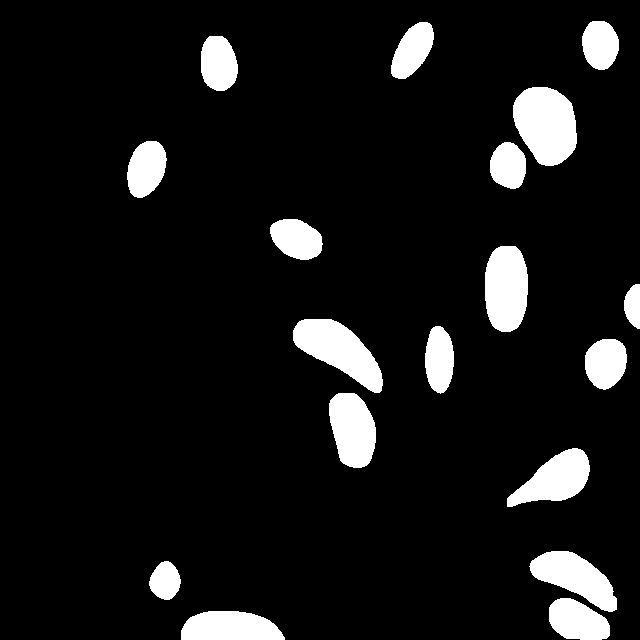

/content/bitirme-3/test/training-048_jpg.rf.5785d680ae716a1d68e57baa334cecfa.jpg


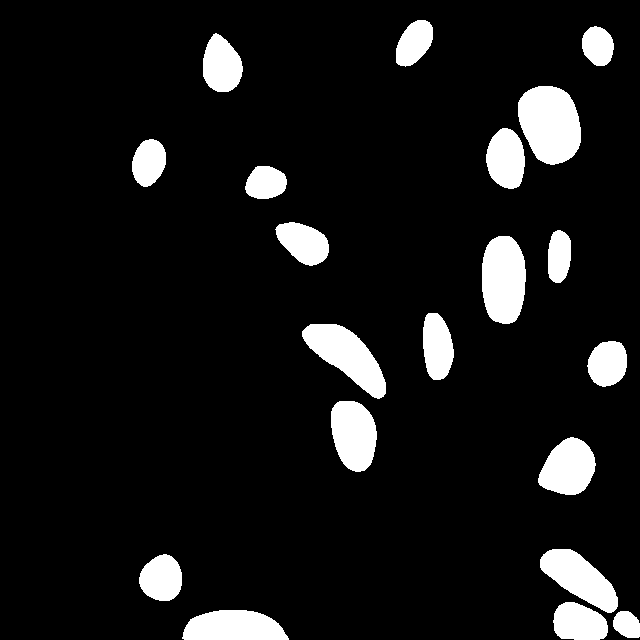

/content/bitirme-3/test/training-047_jpg.rf.9ca7644962c88a387e888365a9968bc0.jpg


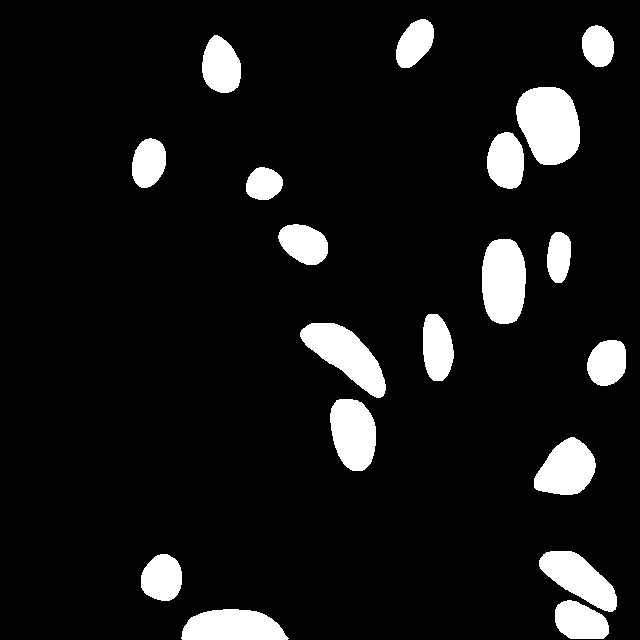

/content/bitirme-3/test/training-069_jpg.rf.a0976e481ca06fe62d7340e80990735d.jpg


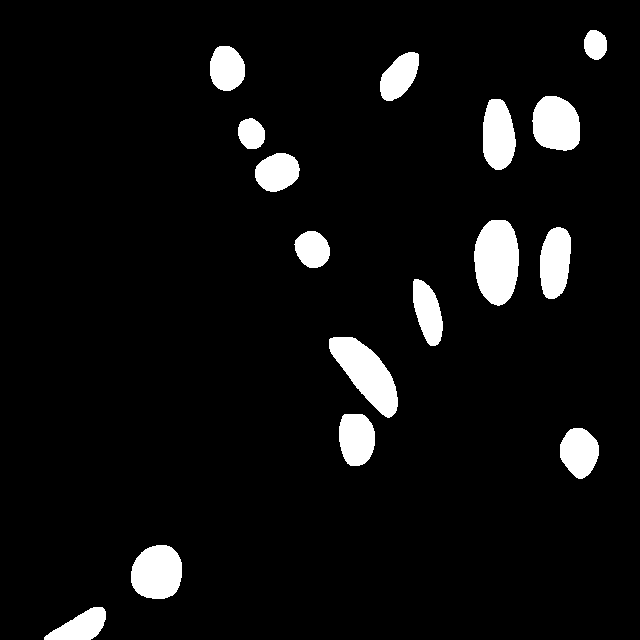

/content/bitirme-3/test/training-065_jpg.rf.94a5e0adf37279f29682609eb6d89abf.jpg


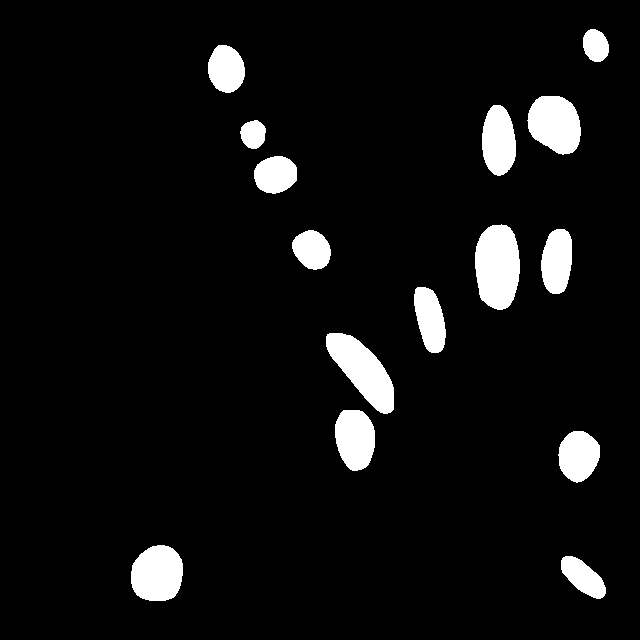

/content/bitirme-3/test/training-074_jpg.rf.841f32d1ff96bb86feb996e226de1696.jpg


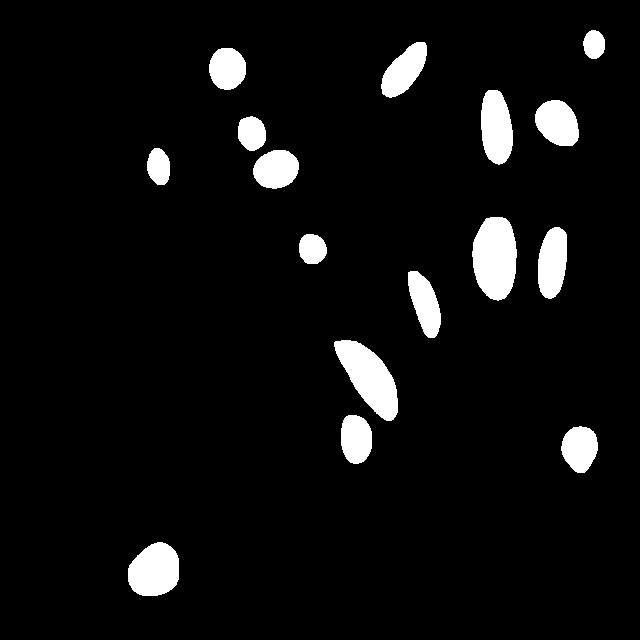

/content/bitirme-3/test/training-072_jpg.rf.a042f366d687840722dfc67ef59b8d97.jpg


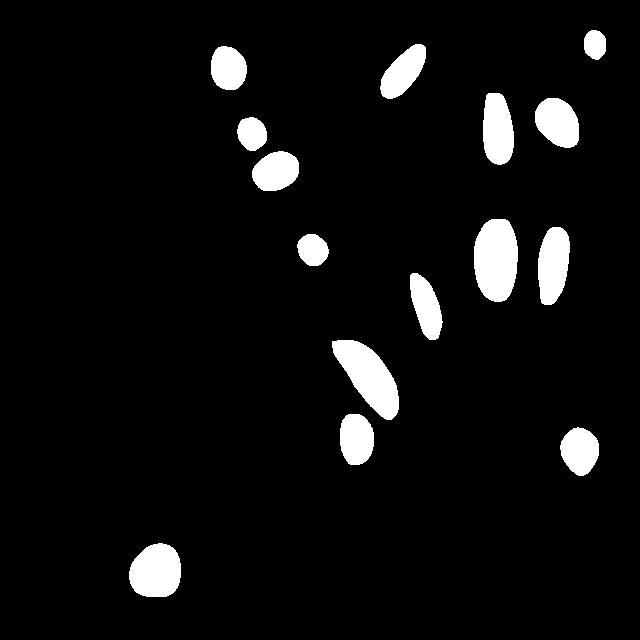

/content/bitirme-3/test/training-058_jpg.rf.954906ebaae4167fd10567feea16f95f.jpg


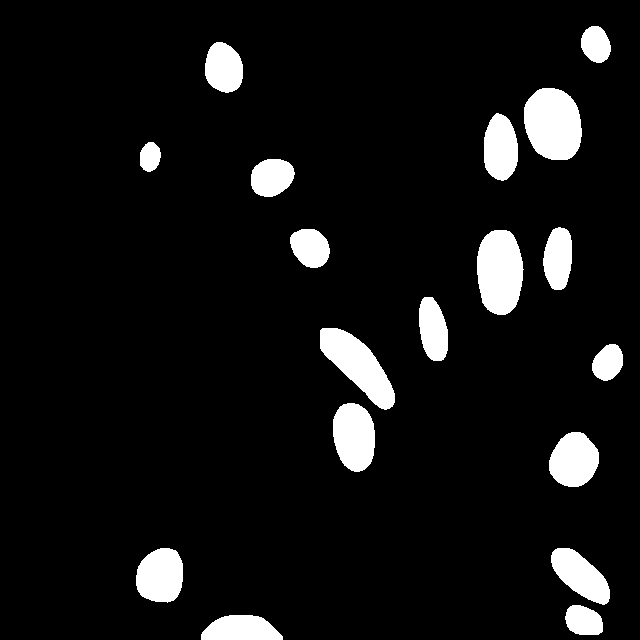

/content/bitirme-3/test/training-124_jpg.rf.aa171efe674ff2f56c11ebe6af62dc93.jpg


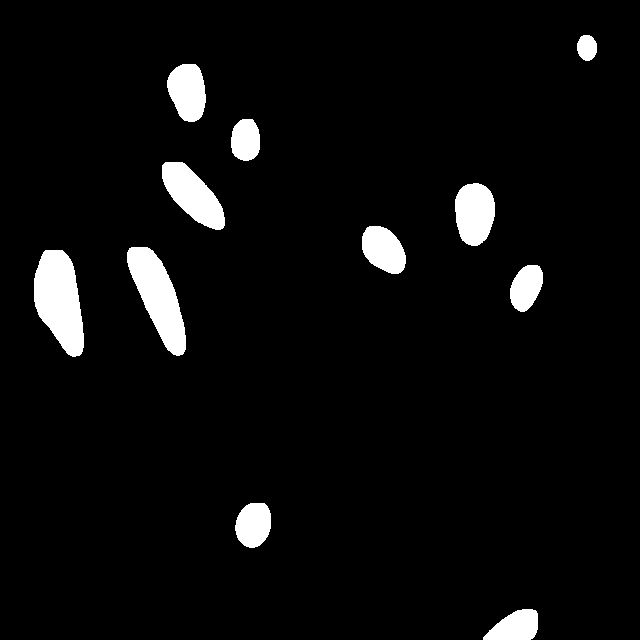

/content/bitirme-3/test/training-044_jpg.rf.9eb109b65b38636767e6855b465dc2c5.jpg


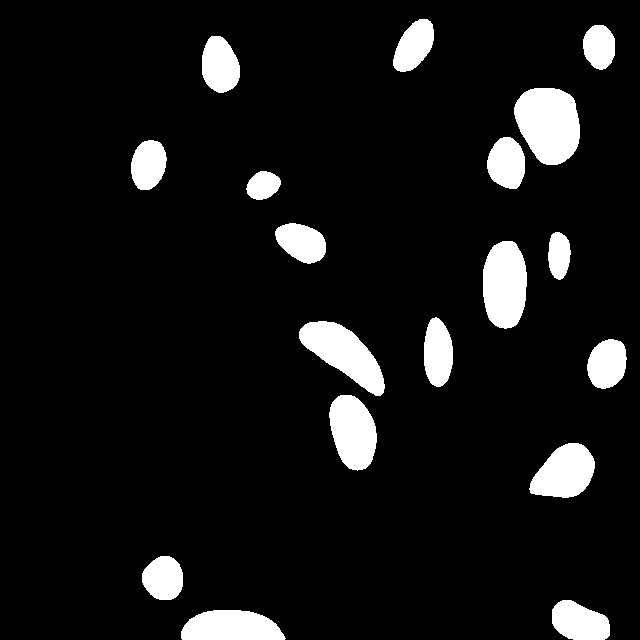

/content/bitirme-3/test/training-140_jpg.rf.a4a998b99906cb34b4b3ccb5d081008b.jpg


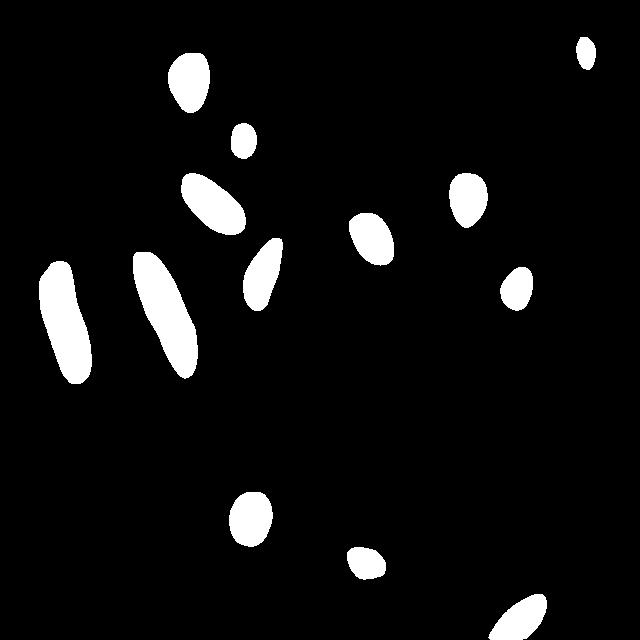

/content/bitirme-3/test/training-101_jpg.rf.9479b33aa76ce9ed40d0c9d463391efc.jpg


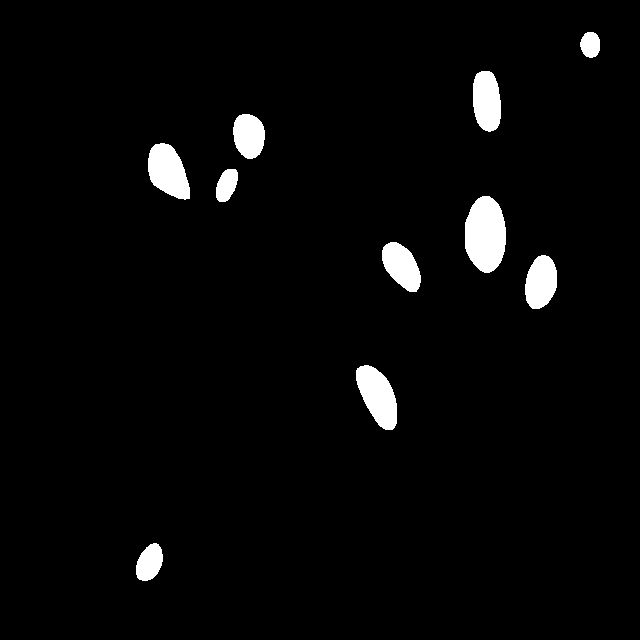

/content/bitirme-3/test/training-050_jpg.rf.a30cd5d7c9d59d13f92fb90d2840bba4.jpg


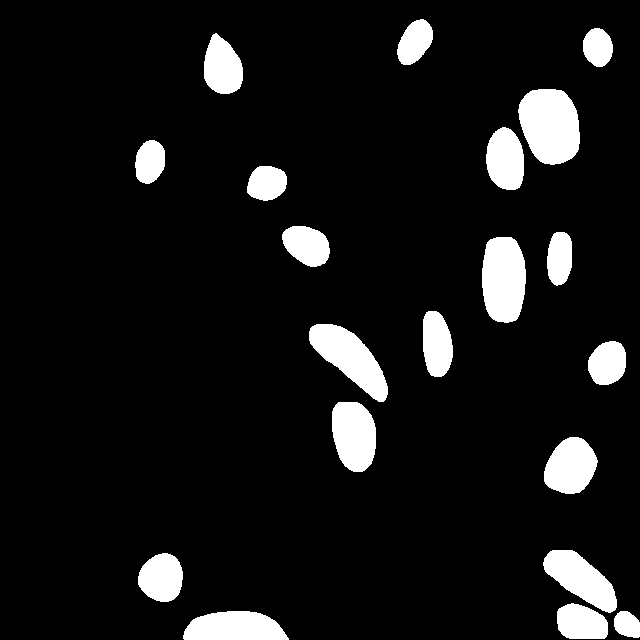

/content/bitirme-3/test/training-153_jpg.rf.980c9a36d883d67d5fecd21244e6a3b5.jpg


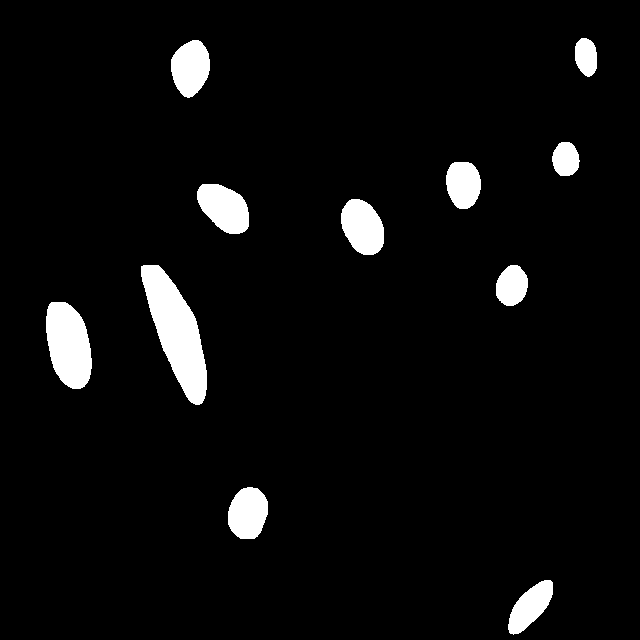

/content/bitirme-3/test/training-155_jpg.rf.a52fbee5f763e51d18fb933f2eb8b276.jpg


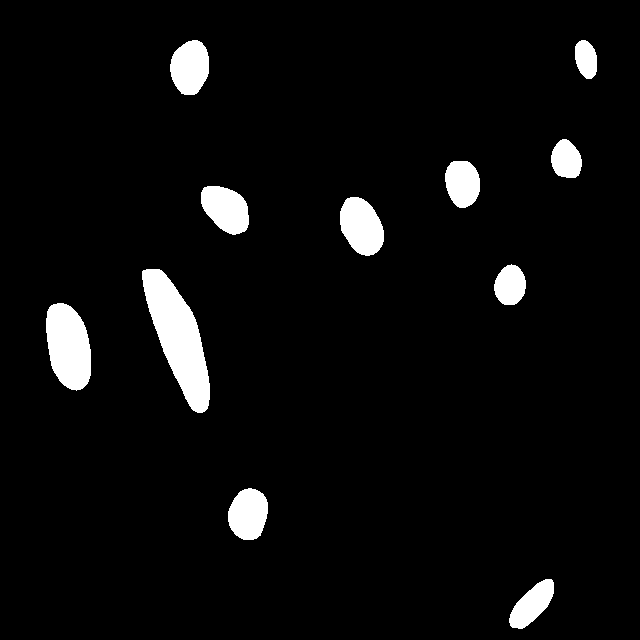

/content/bitirme-3/test/training-152_jpg.rf.7d97c4c0cede9847c381434fd5b3acd6.jpg


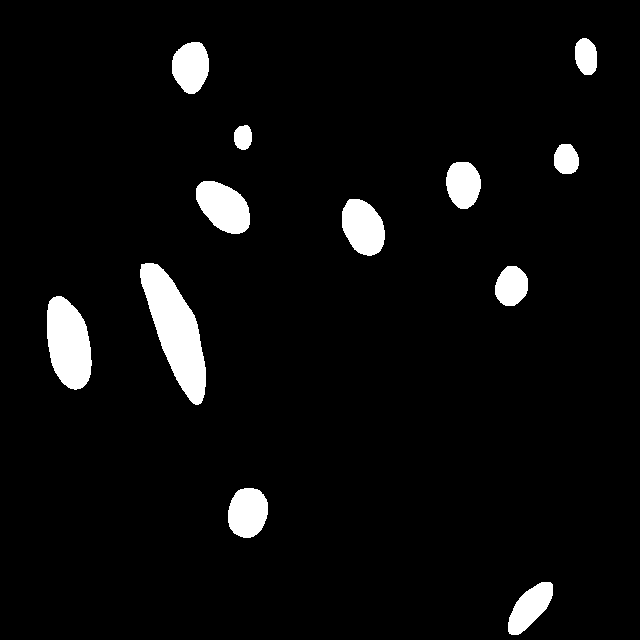

/content/bitirme-3/test/training-078_jpg.rf.aeb34908cefc0c3c409541ea8d9b73a4.jpg


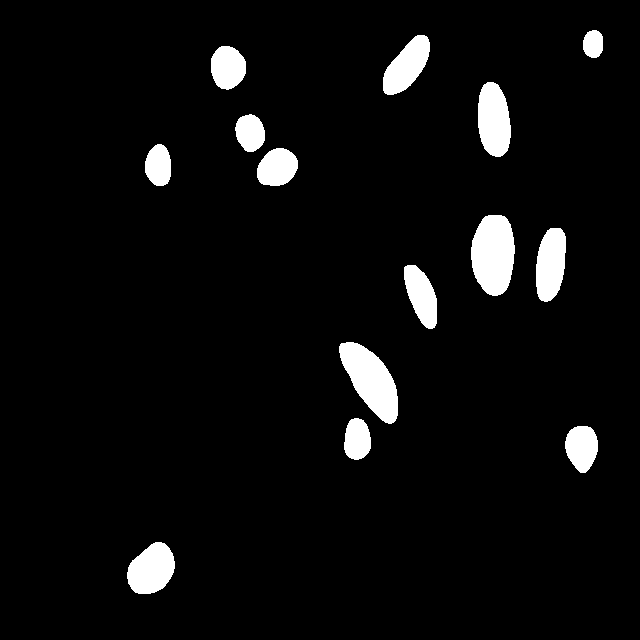

/content/bitirme-3/test/training-151_jpg.rf.adc48b79e697b162c52bbfc413721ac9.jpg


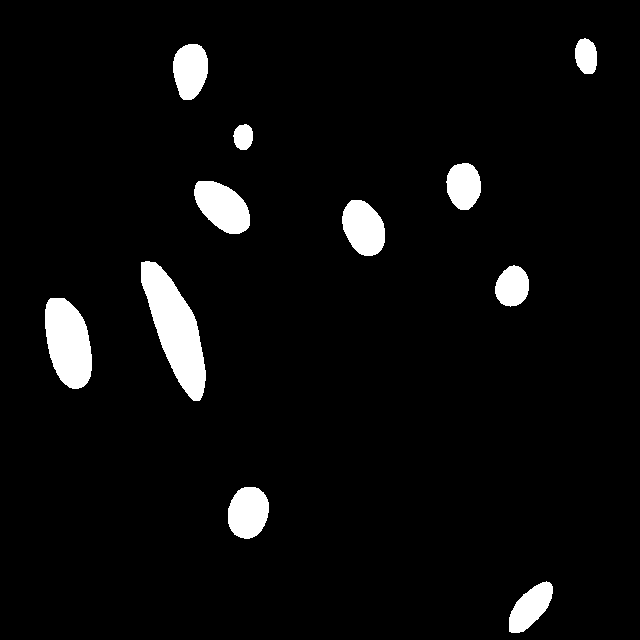

/content/bitirme-3/test/training-150_jpg.rf.ad420212919d342e2f25b2e9736c646d.jpg


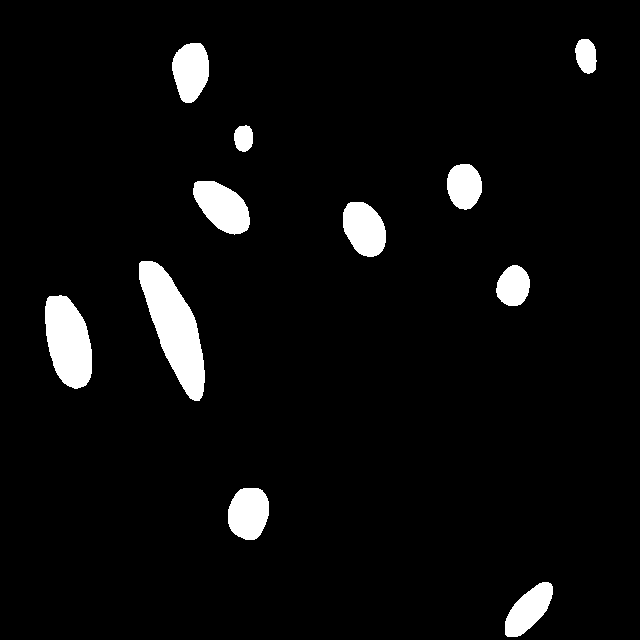

/content/bitirme-3/test/training-137_jpg.rf.aab198b46e770ab019280b39d13fd33a.jpg


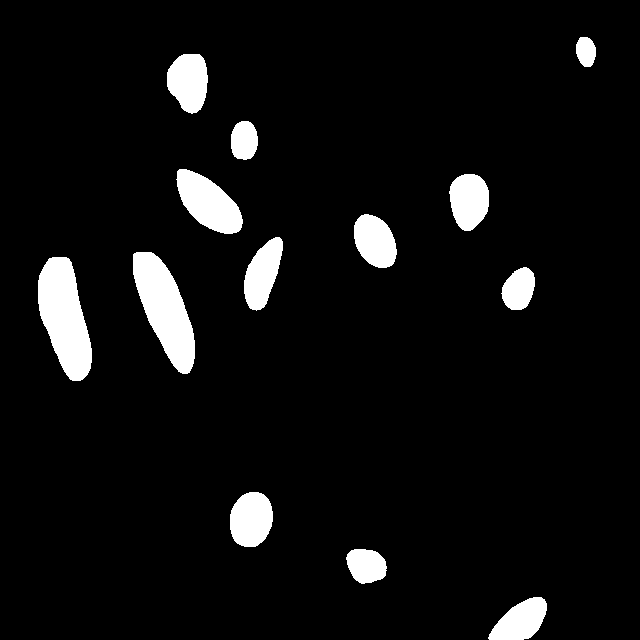

/content/bitirme-3/test/training-064_jpg.rf.b4f1569b84e3a623651ff1288401e877.jpg


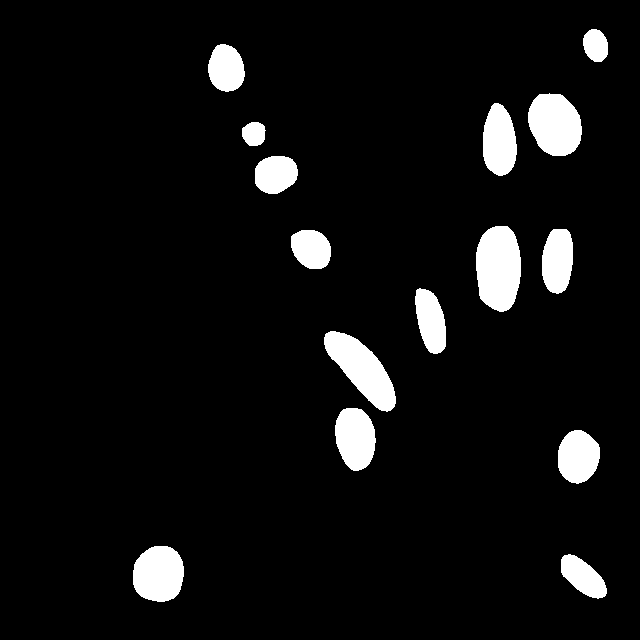

/content/bitirme-3/test/training-079_jpg.rf.9d28f9b9a211a88b97b98666bf878596.jpg


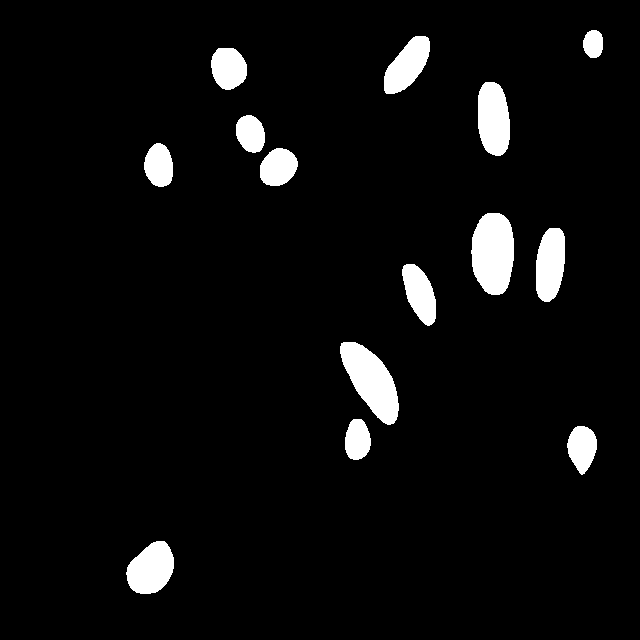

/content/bitirme-3/test/training-123_jpg.rf.aee60e47f8a3464ceb4ac1f888e05f6c.jpg


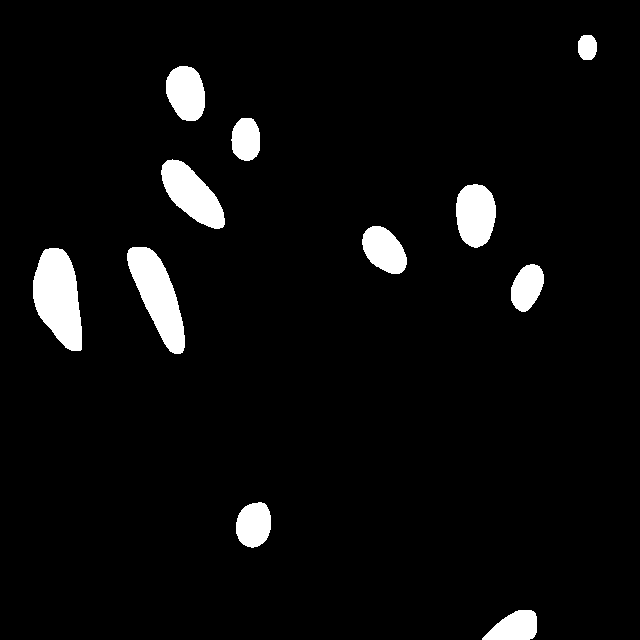

/content/bitirme-3/test/training-088_jpg.rf.ac5a962ace6bd614f45330e6b0a96934.jpg


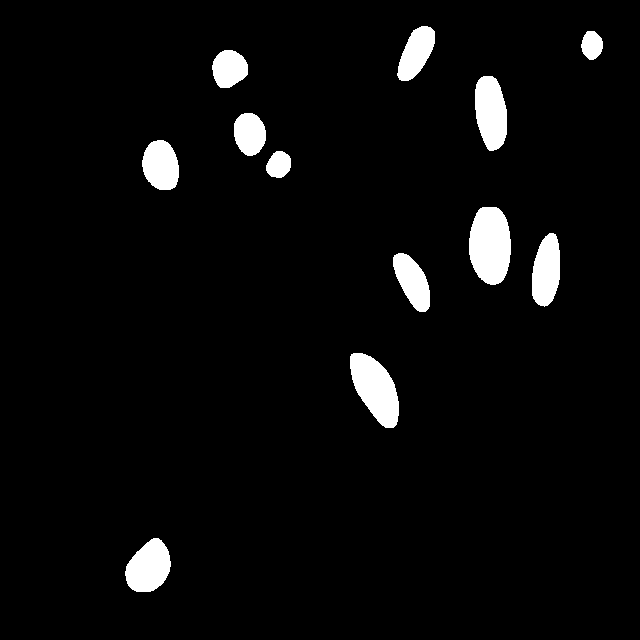

/content/bitirme-3/test/training-007_jpg.rf.b1181a6f6a3a13d3a9ba94e4bf35f593.jpg


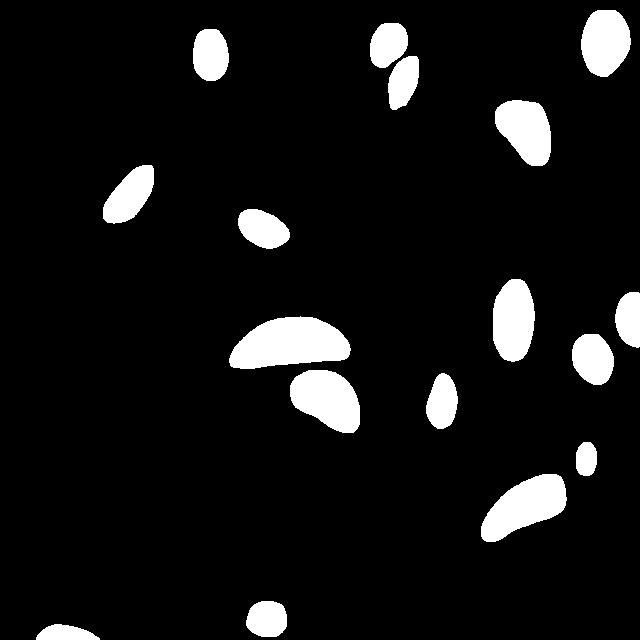

/content/bitirme-3/test/training-136_jpg.rf.ae90f7a7ce3e8f40b5f2c28d82a209d3.jpg


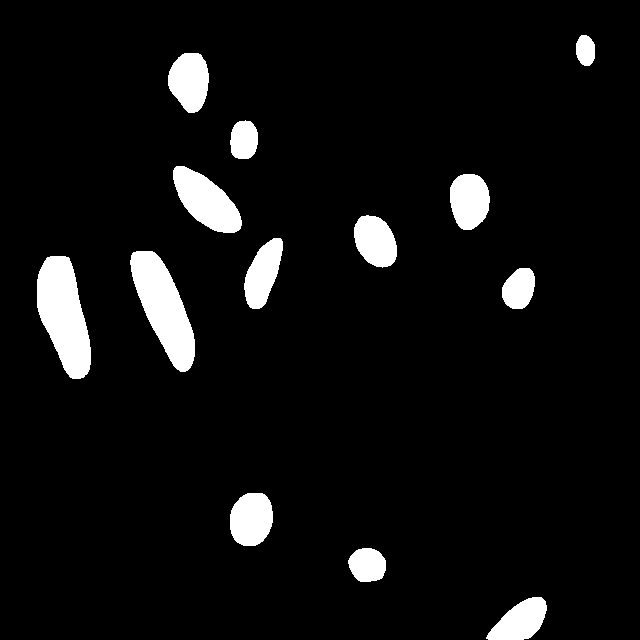

/content/bitirme-3/test/training-118_jpg.rf.b5366fbd4e7876ac4b2c0484fc37ab6a.jpg


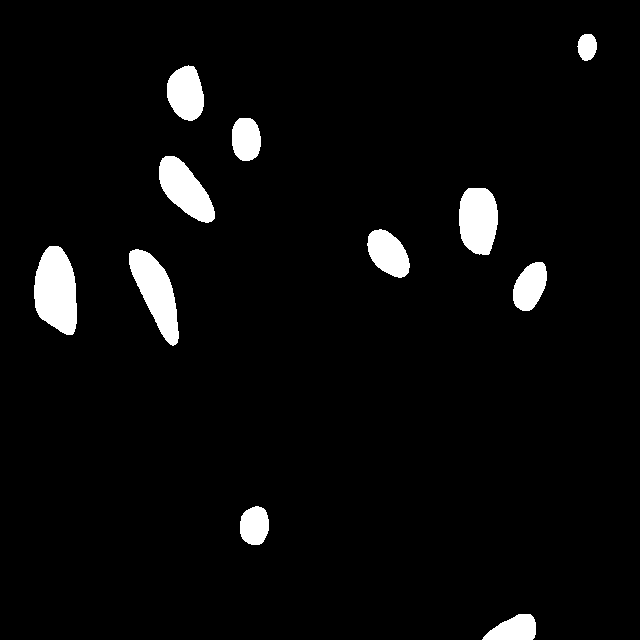

/content/bitirme-3/test/training-114_jpg.rf.94e2ec7e7c0441f7570523c2dc1d1661.jpg


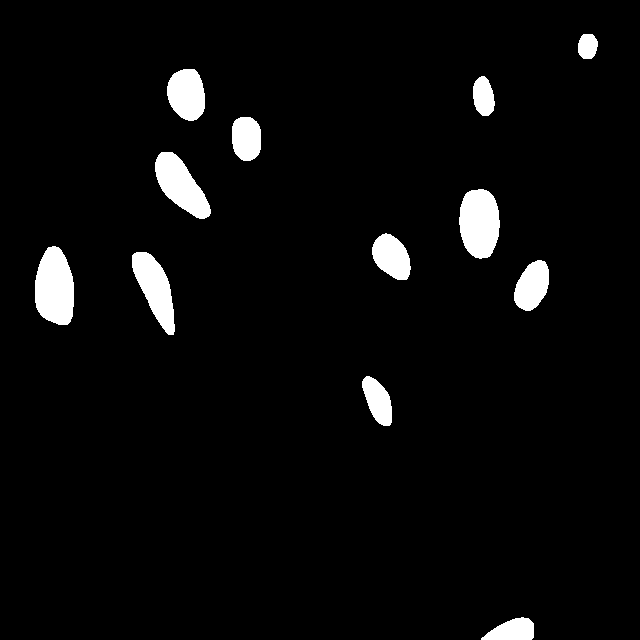

/content/bitirme-3/test/training-043_jpg.rf.b62a46d042d429116531a17bc211453d.jpg


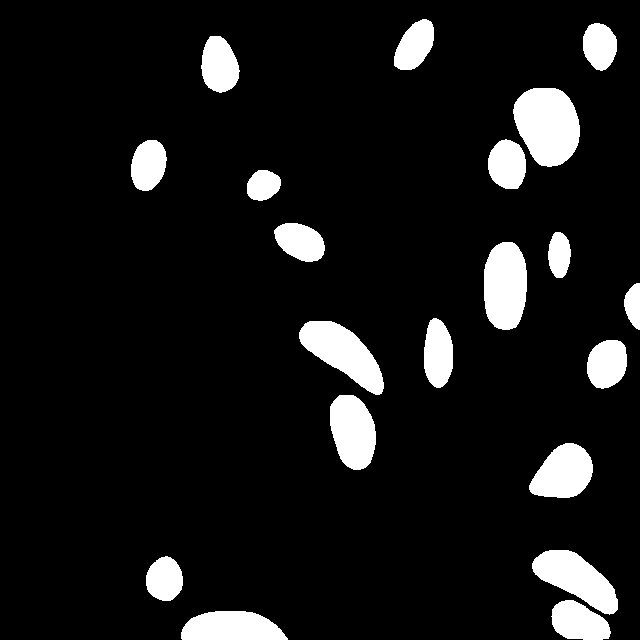

/content/bitirme-3/test/training-107_jpg.rf.a8f3372c33eade03f0330001bd3e37cb.jpg


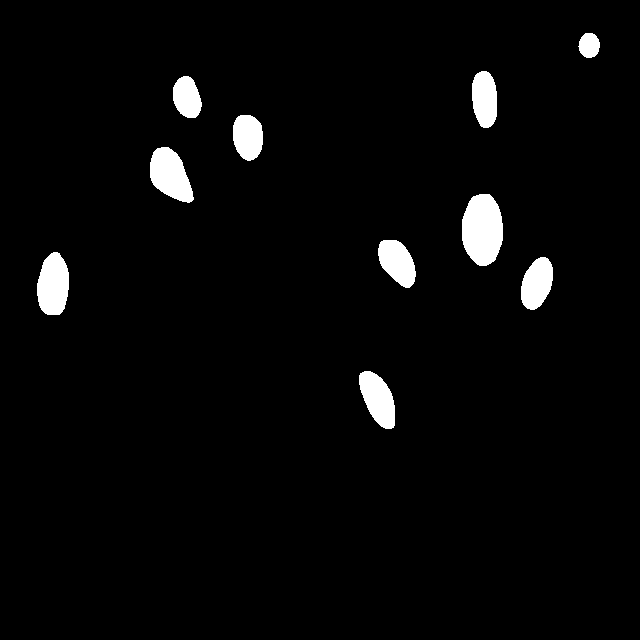

/content/bitirme-3/test/training-096_jpg.rf.baec98b99e9bb1d8c104b06006b6f263.jpg


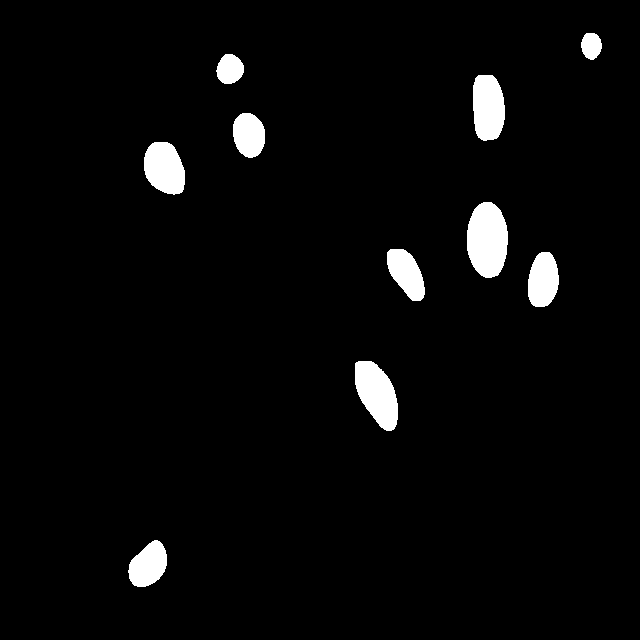

/content/bitirme-3/test/training-041_jpg.rf.b4fd2f20690ed8574d7c1328341cc027.jpg


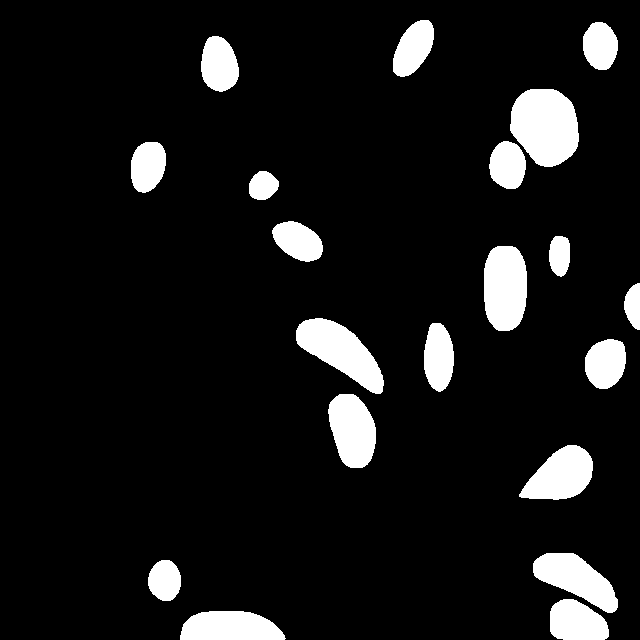

/content/bitirme-3/test/training-015_jpg.rf.b8207e13fe951ed2794b162f1f8e57db.jpg


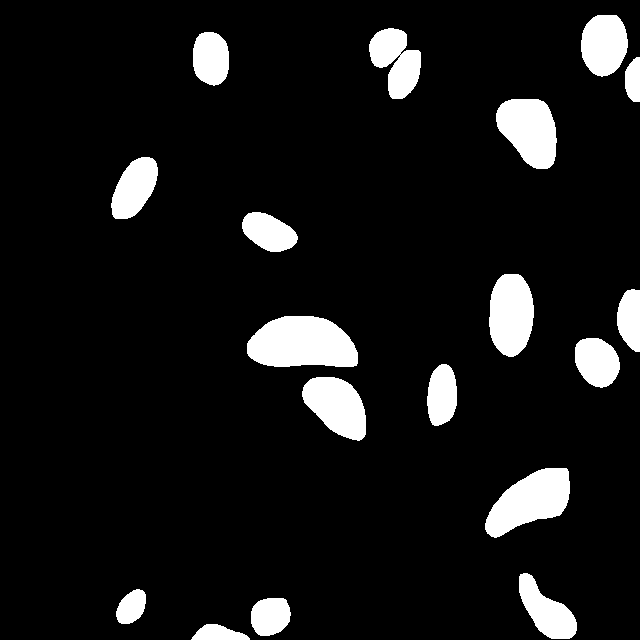

/content/bitirme-3/test/training-161_jpg.rf.6db979892b2ea3b8a67be6c1335912bf.jpg


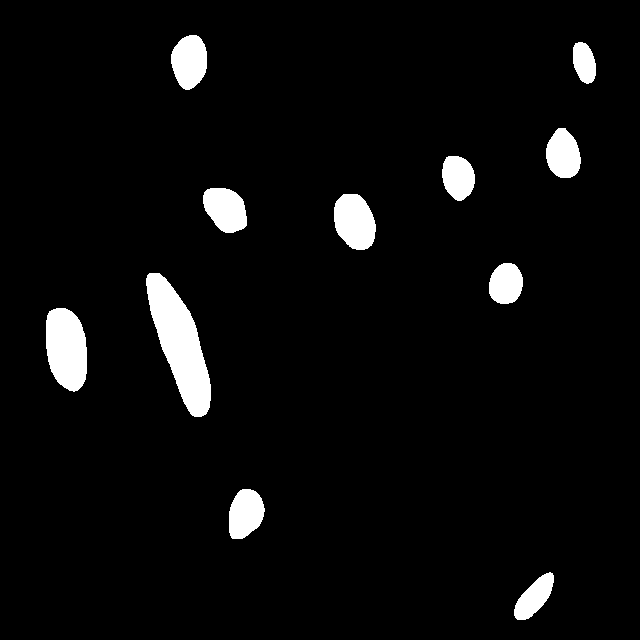

/content/bitirme-3/test/training-004_jpg.rf.b6c9d06a86f400f489a2f79a777f5e82.jpg


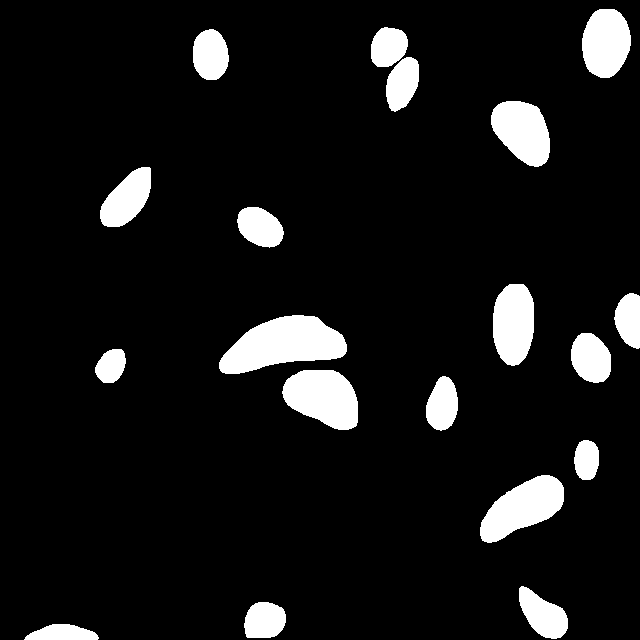

/content/bitirme-3/test/training-086_jpg.rf.b804cd22438338e2b6145f25a6cd5850.jpg


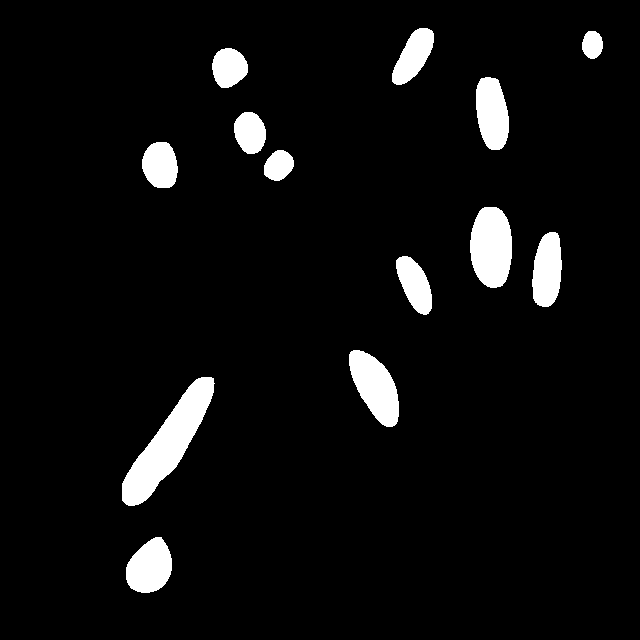

/content/bitirme-3/test/training-061_jpg.rf.c8bf49a58c67562cb4c933d9a4d202d7.jpg


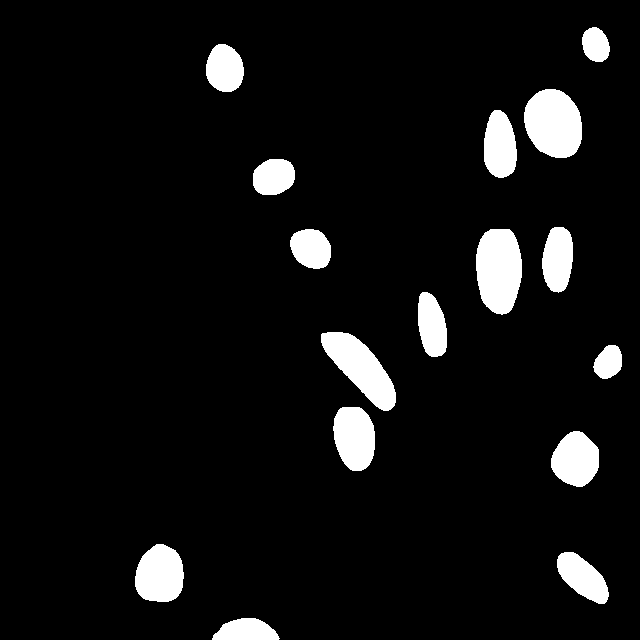

/content/bitirme-3/test/training-001_jpg.rf.bf41a9d26215be1bc95f25d1c3142cf1.jpg


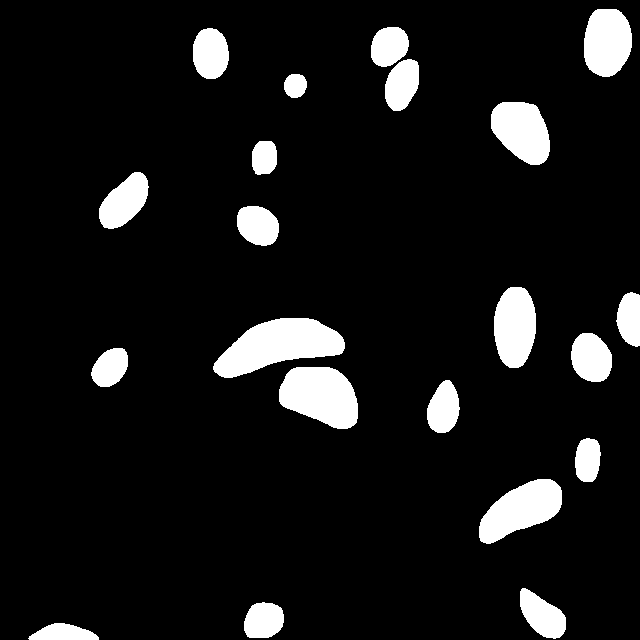

/content/bitirme-3/test/training-073_jpg.rf.b4029ac5df396bac280e438890676568.jpg


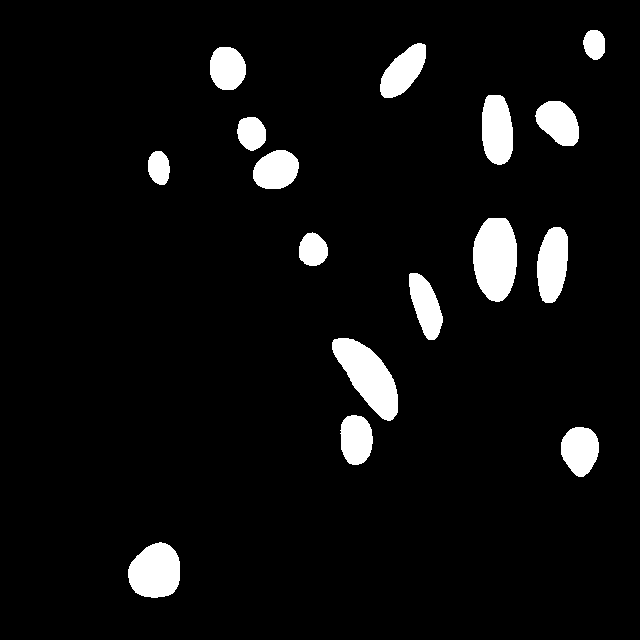

/content/bitirme-3/test/training-025_jpg.rf.adf524fc8d828a5ee9ffa1cbd9088a98.jpg


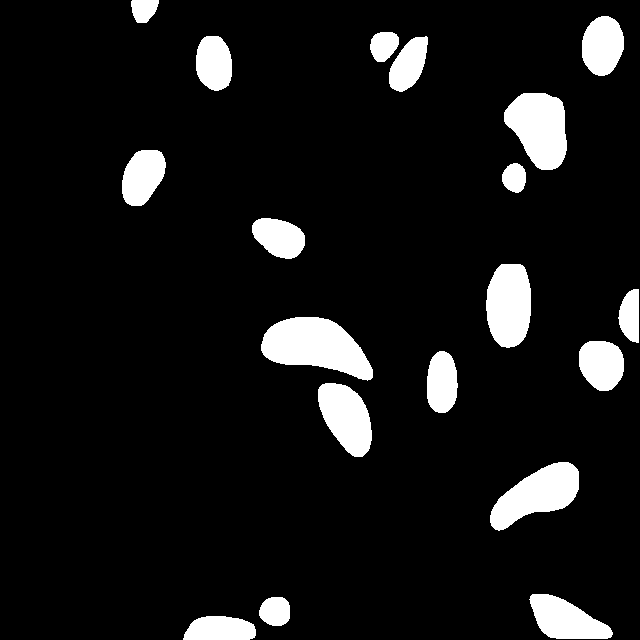

/content/bitirme-3/test/training-020_jpg.rf.acb20c85099da3fd6a81c2ef3e1f911f.jpg


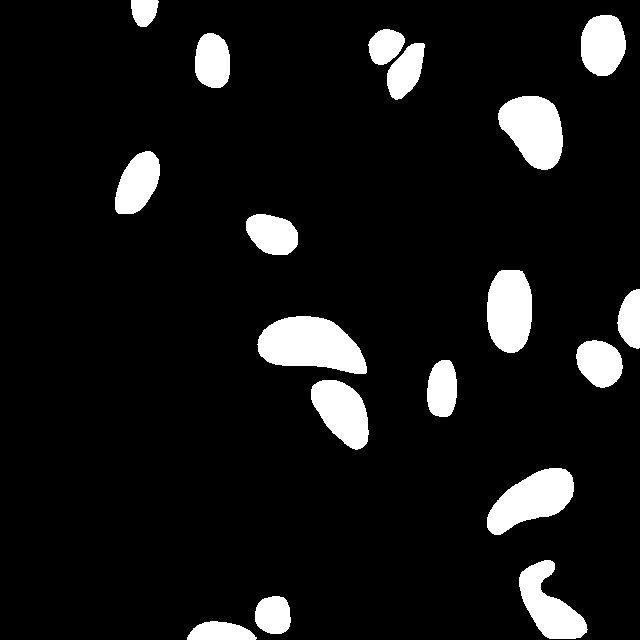

/content/bitirme-3/test/training-012_jpg.rf.b2d84a69d1e940c5d2323f8d5b3eccc7.jpg


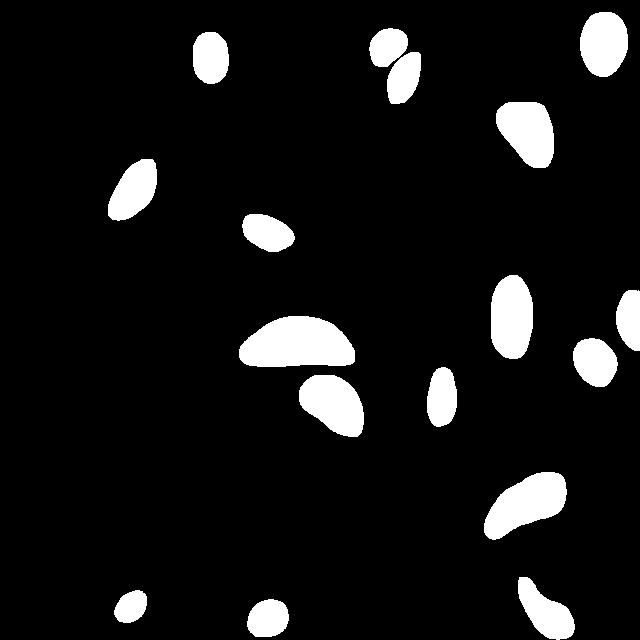

/content/bitirme-3/test/training-010_jpg.rf.cb252eab49d03f4e0245921dc9ed7d22.jpg


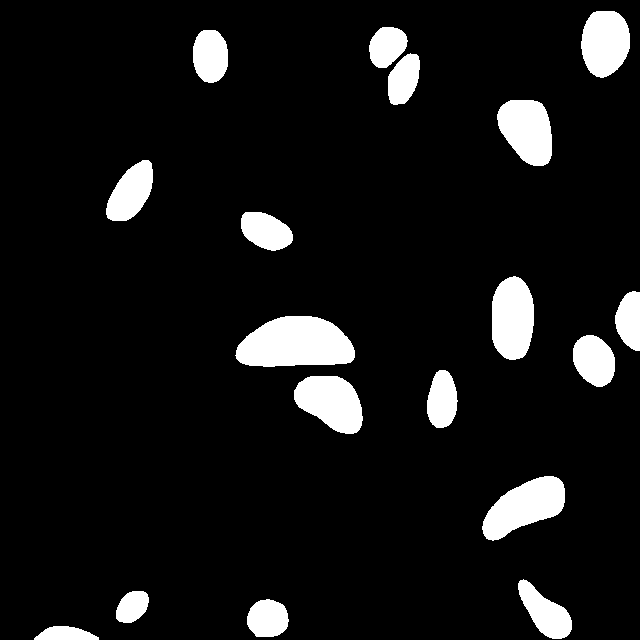

/content/bitirme-3/test/training-049_jpg.rf.d3ca6e126b7e471129ec64663bf33922.jpg


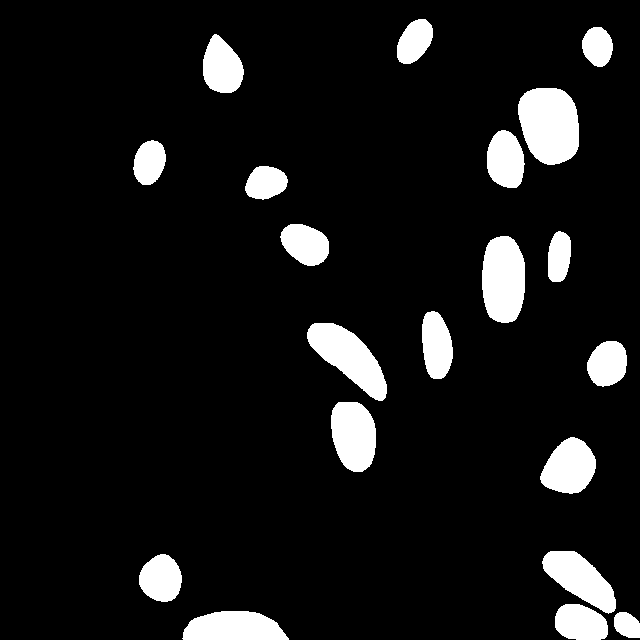

/content/bitirme-3/test/training-085_jpg.rf.cf79eced71926f0bf3a20d39be2e6141.jpg


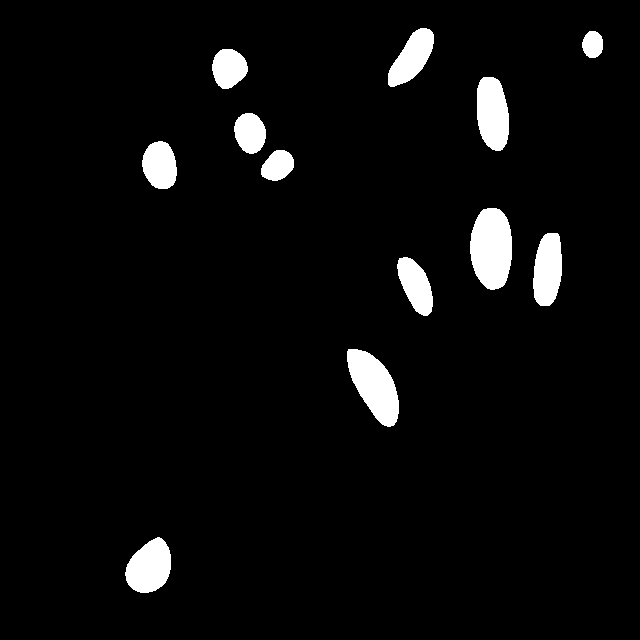

/content/bitirme-3/test/training-156_jpg.rf.af5b01912a577e083bc286f3af073eec.jpg


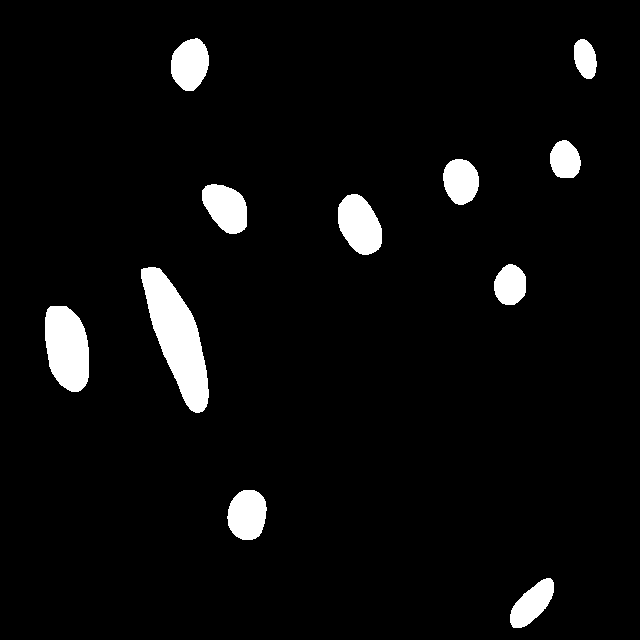

/content/bitirme-3/test/training-029_jpg.rf.d87495e2e4ae901c4e083358e482b015.jpg


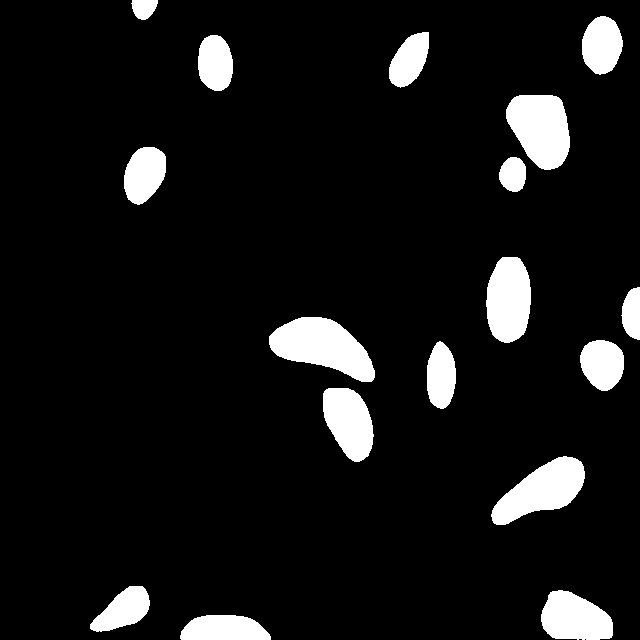

/content/bitirme-3/test/training-017_jpg.rf.d00e5464e70517fd11cee7d798dcbb24.jpg


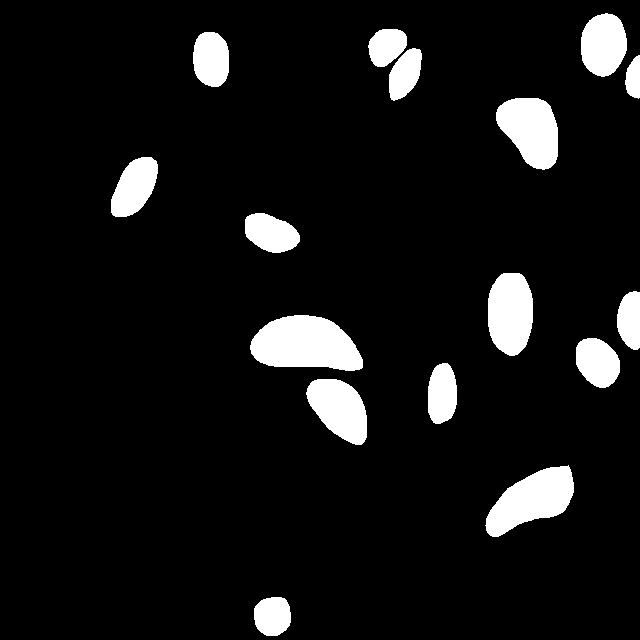

/content/bitirme-3/test/training-117_jpg.rf.db087acaac5925d7044409fc5955d2b3.jpg


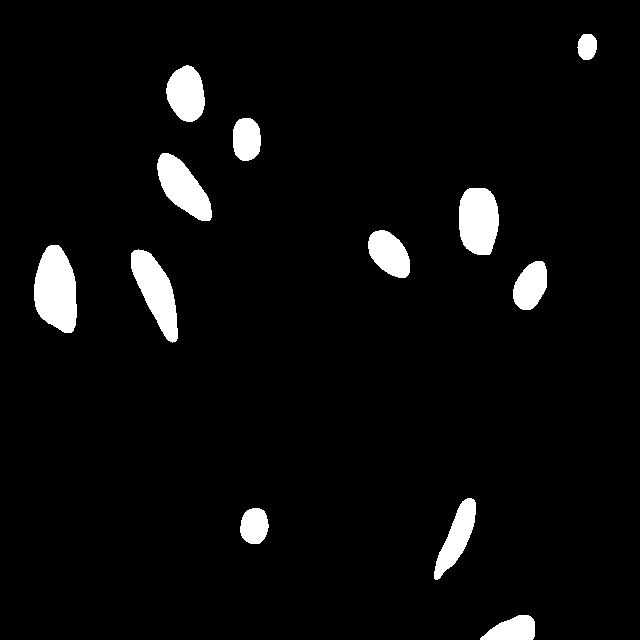

/content/bitirme-3/test/training-002_jpg.rf.dbcdac671d38c73e2c709f5413b77cb5.jpg


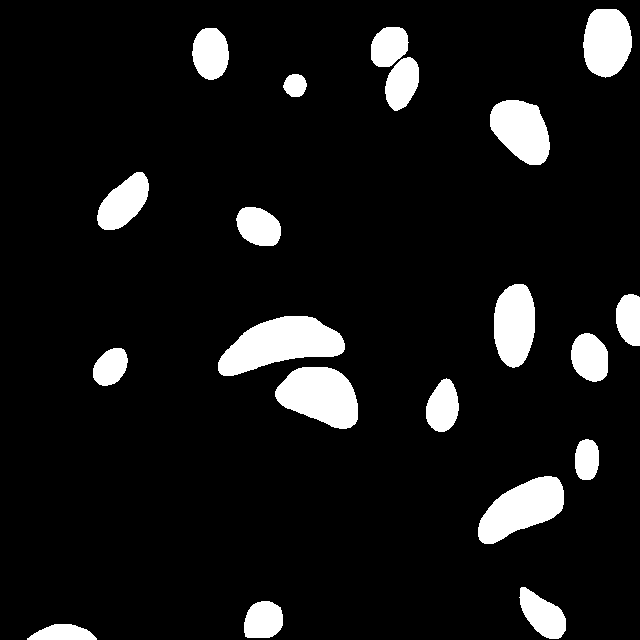

/content/bitirme-3/test/training-033_jpg.rf.d7760f79f3d432189a3b442578e2909f.jpg


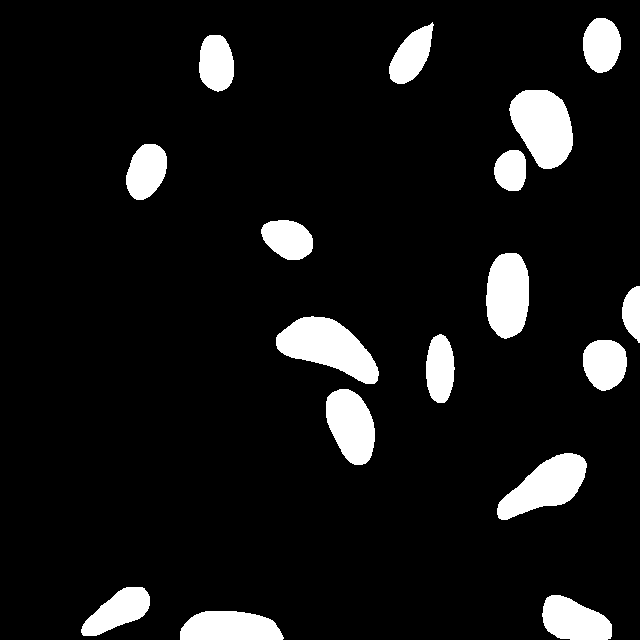

/content/bitirme-3/test/training-087_jpg.rf.e5c972f20ba242c2d4ccbb9464eec772.jpg


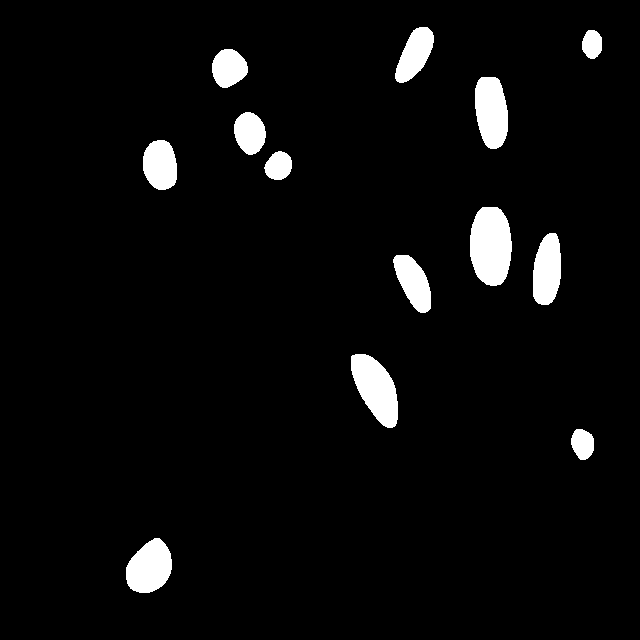

/content/bitirme-3/test/training-080_jpg.rf.dbaff44518309ae19055ef361f55aeb5.jpg


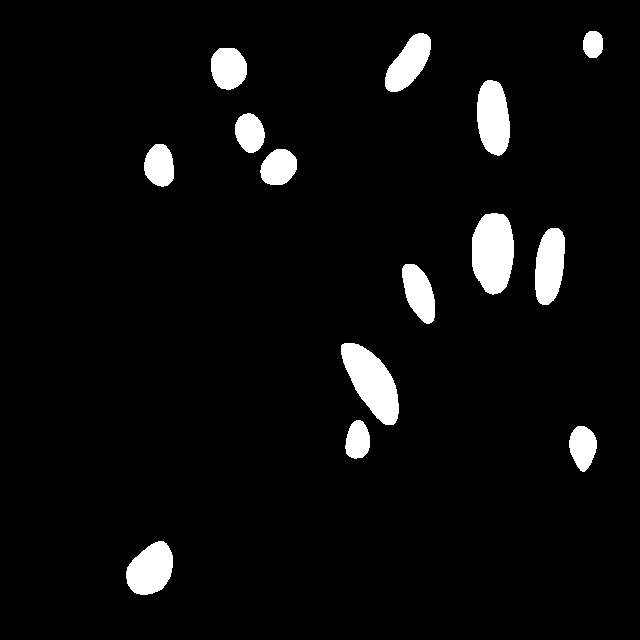

/content/bitirme-3/test/training-148_jpg.rf.cca5ae5929fab0c9fe7835db207bec4e.jpg


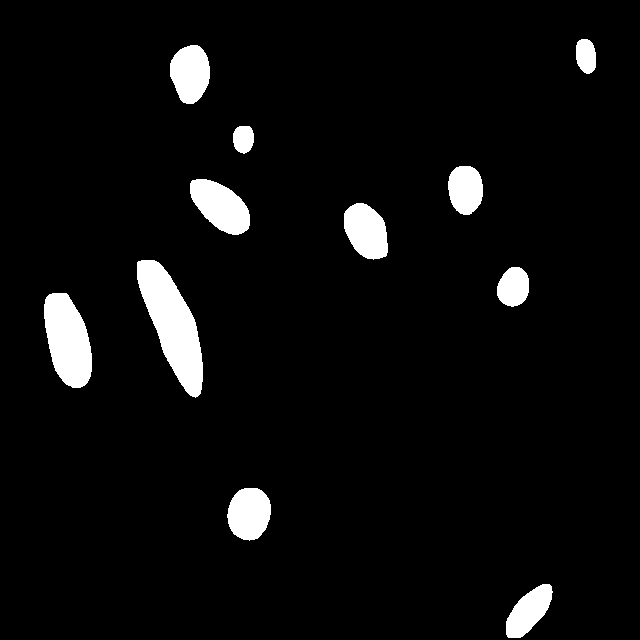

/content/bitirme-3/test/training-027_jpg.rf.d251ebe0c1e3af8d1ebd787c006eb77c.jpg


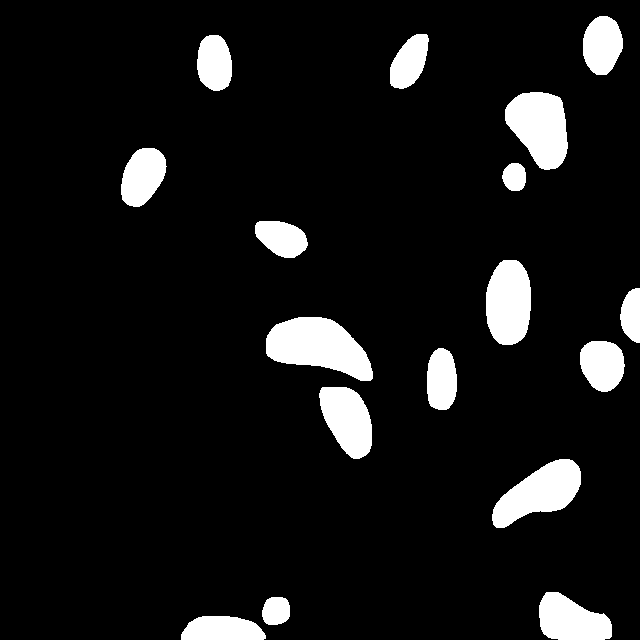

/content/bitirme-3/test/training-111_jpg.rf.cc13235cf4e60d3aa6345f6a893acc17.jpg


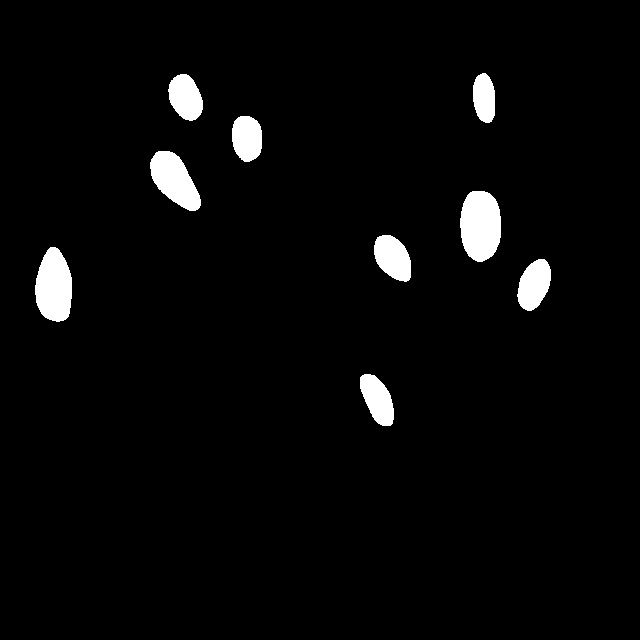

/content/bitirme-3/test/training-094_jpg.rf.d026cf1e5e6798f92ca384484e1e12f8.jpg


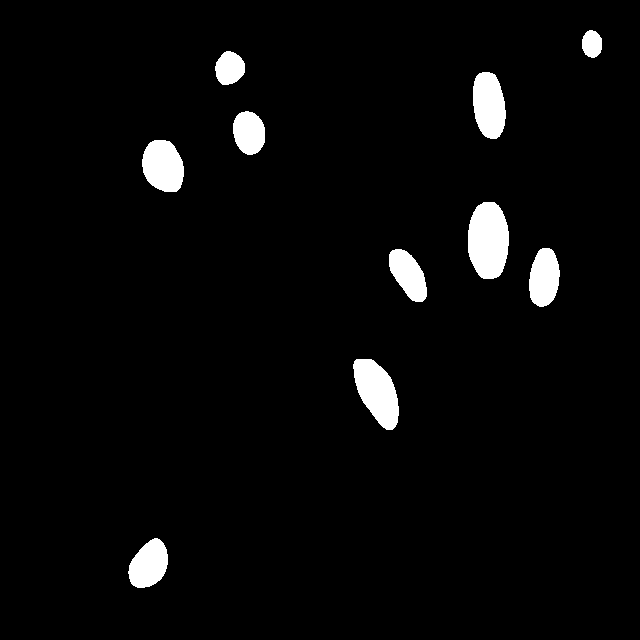

/content/bitirme-3/test/training-115_jpg.rf.e6201803f429d62bada71a4f27650561.jpg


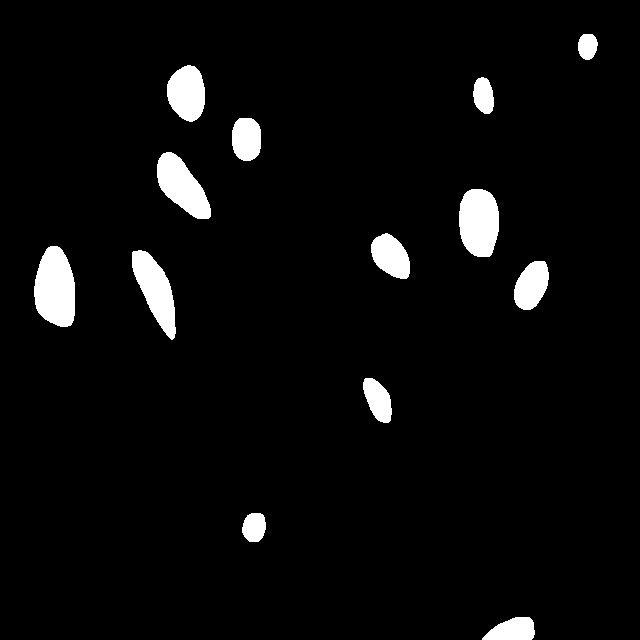

/content/bitirme-3/test/training-003_jpg.rf.d7fa96d5acfbdf5ba6d927bbefd17278.jpg


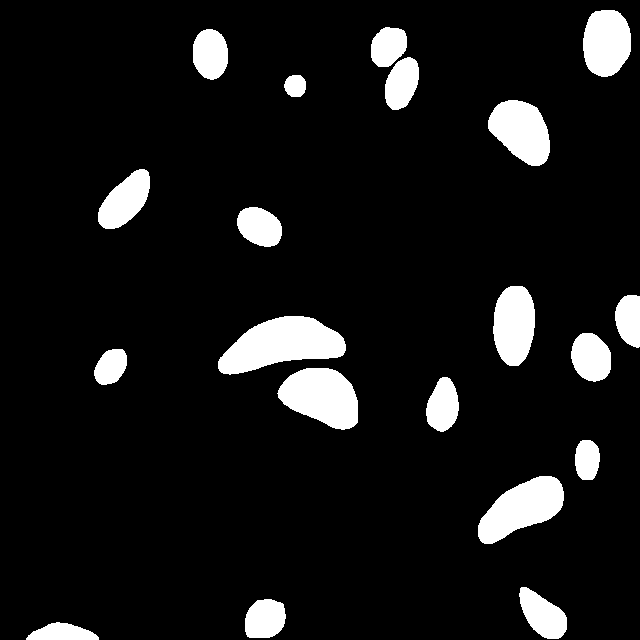

/content/bitirme-3/test/training-030_jpg.rf.ec3827a07942b1c0cbb943a2e956718e.jpg


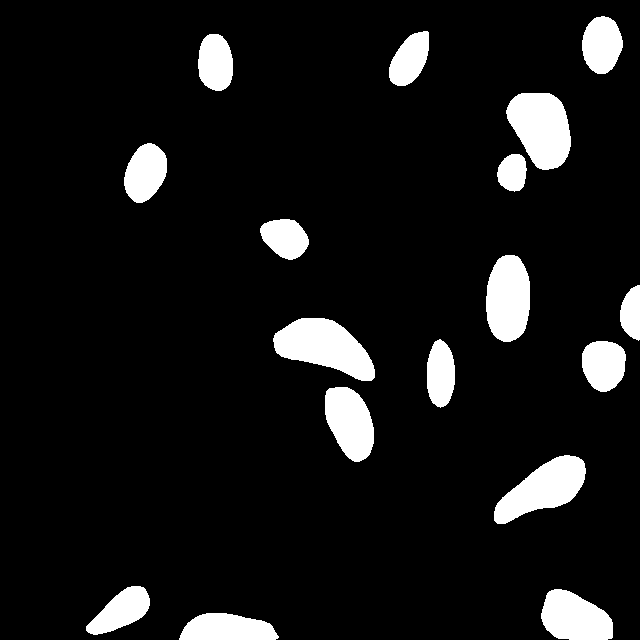

/content/bitirme-3/test/training-139_jpg.rf.daff8f3703126498944ae5186f600921.jpg


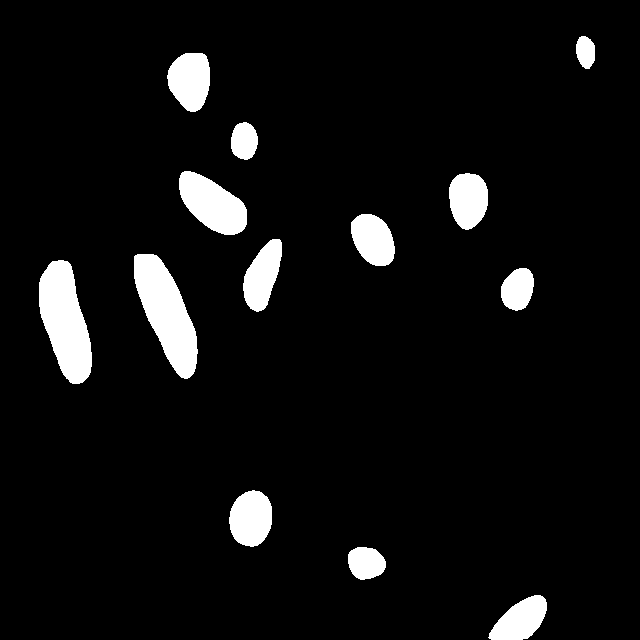

/content/bitirme-3/test/training-104_jpg.rf.eea93ad3d5723dc63193c1286492a55a.jpg


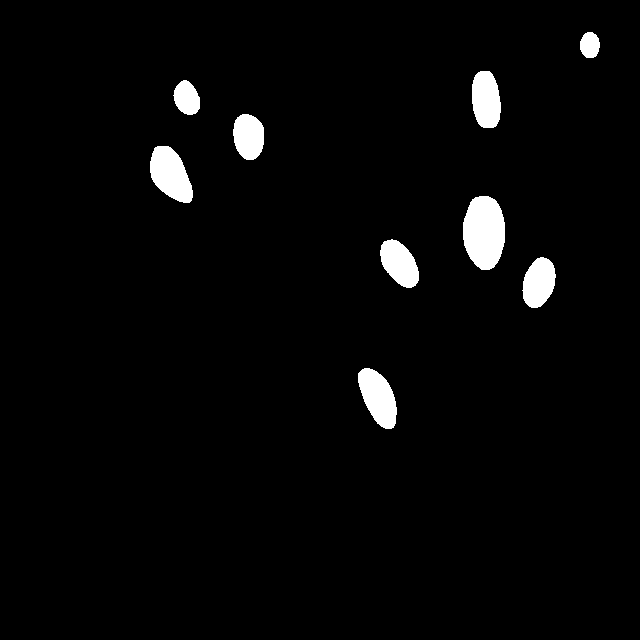

/content/bitirme-3/test/training-063_jpg.rf.d1aaaf1b5f789385c1338f89c5341926.jpg


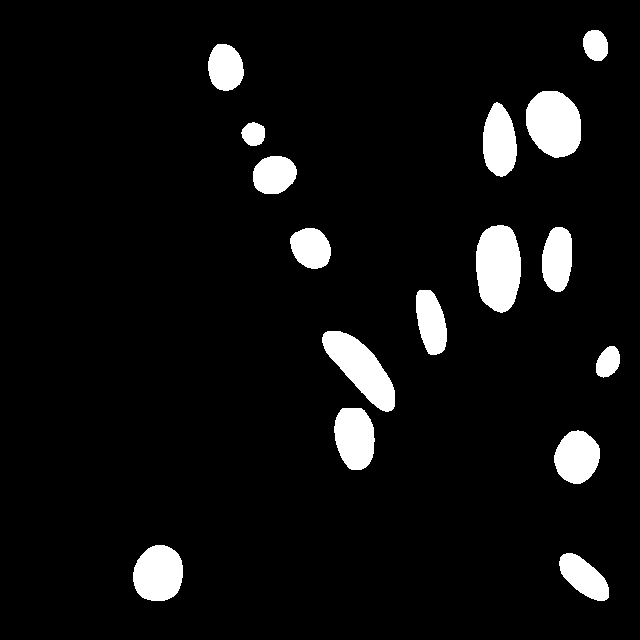

/content/bitirme-3/test/training-022_jpg.rf.c12f6e31e27b002b30ebc9b6d794a053.jpg


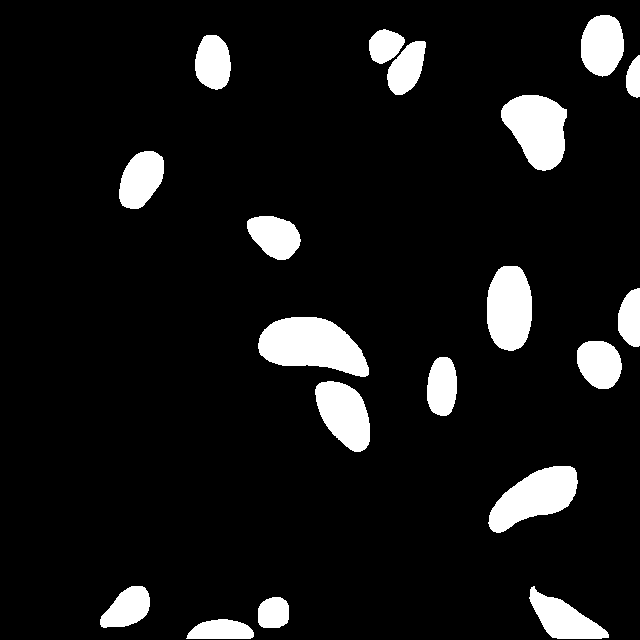

/content/bitirme-3/test/training-028_jpg.rf.ef6a01bcf2ff9a3cd01bc4c28c846762.jpg


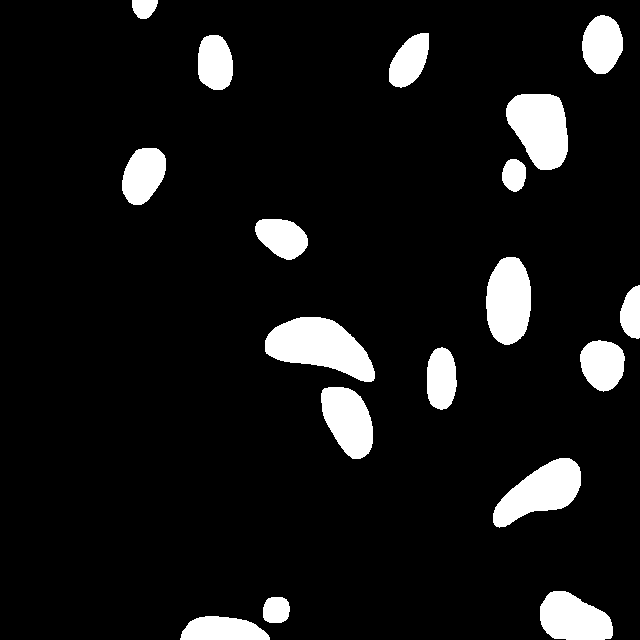

/content/bitirme-3/test/training-154_jpg.rf.e666885529b00c9ae9b77a2776186b3a.jpg


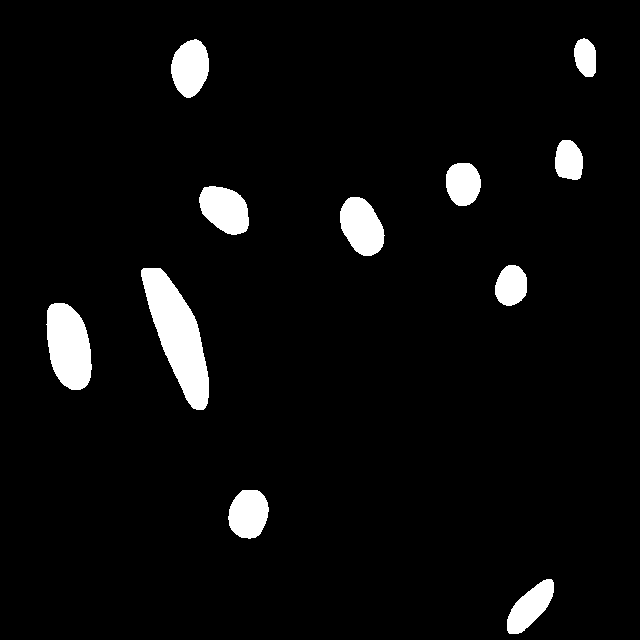

/content/bitirme-3/test/training-037_jpg.rf.aa48bf828381fe45ebb51da471af5565.jpg


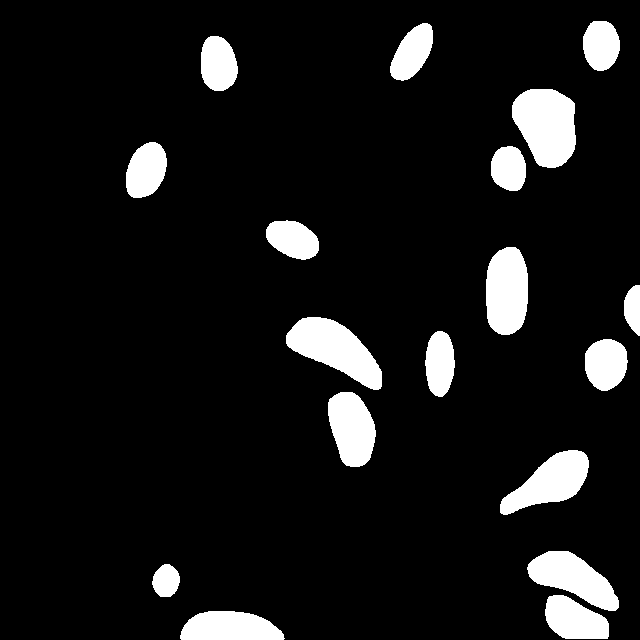

/content/bitirme-3/test/training-055_jpg.rf.f12a5142815c8121460cb8a4c7848d73.jpg


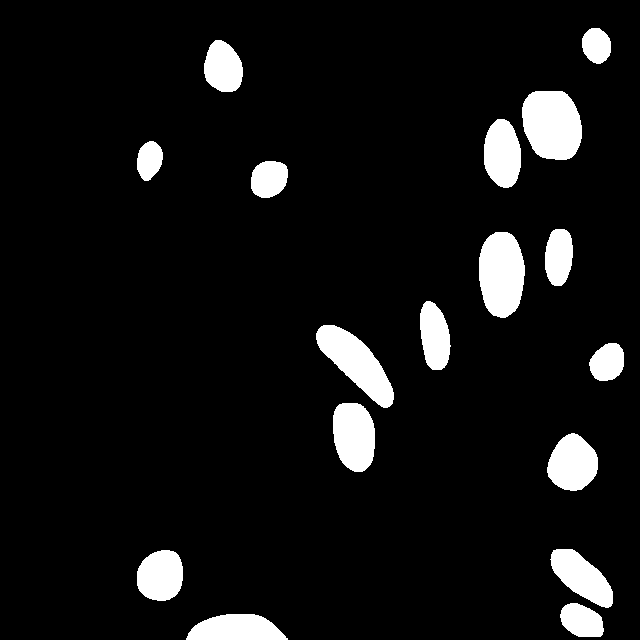

/content/bitirme-3/test/training-018_jpg.rf.e8b7bd953004cb4f4a034da77c8fbff7.jpg


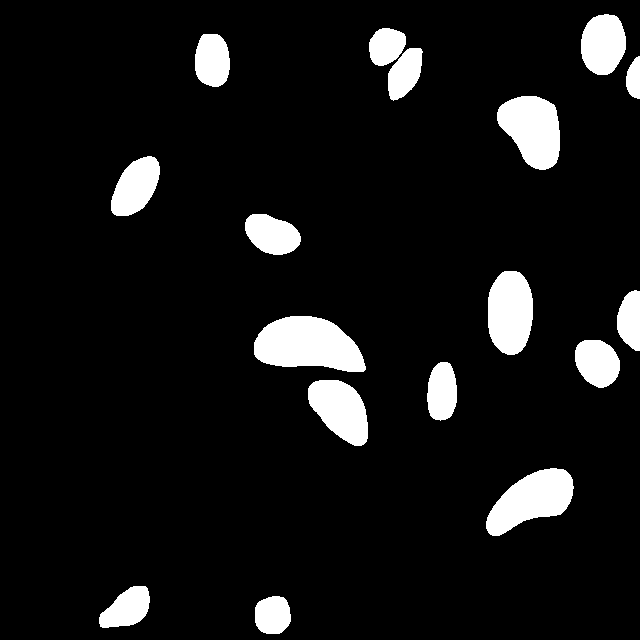

/content/bitirme-3/test/training-093_jpg.rf.de2d138ab171bb3363951c6b74e07075.jpg


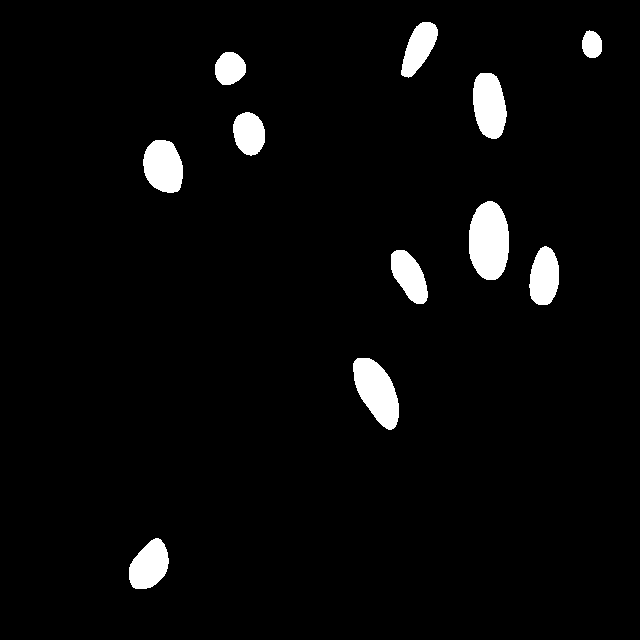

/content/bitirme-3/test/training-131_jpg.rf.efe360ddd2410848eee2ca675275f055.jpg


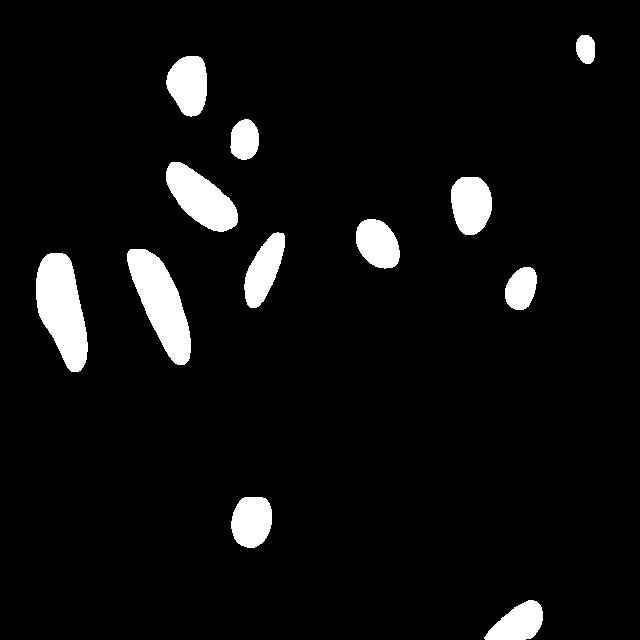

/content/bitirme-3/test/training-110_jpg.rf.f2ba1e1c15767f05fcce889092869c04.jpg


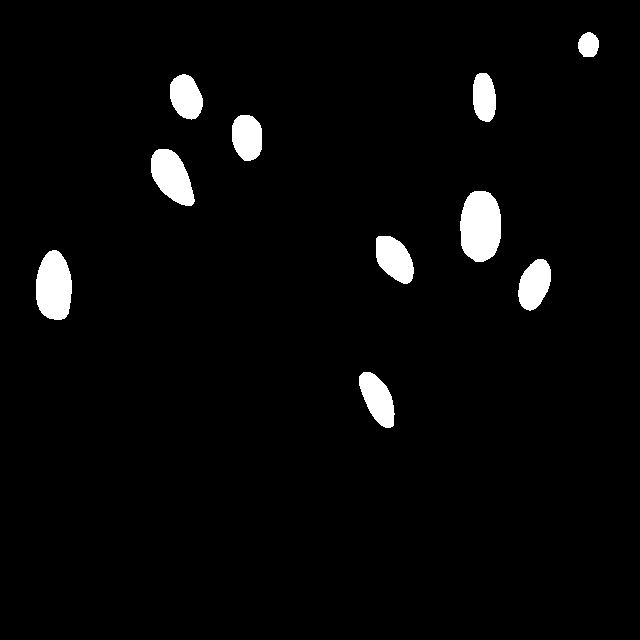

/content/bitirme-3/test/training-129_jpg.rf.fa540798ee608c21c179db088f7e546e.jpg


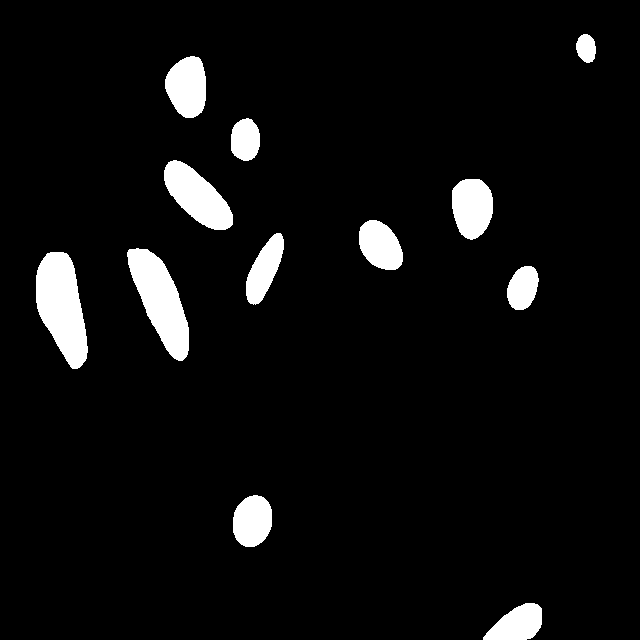

/content/bitirme-3/test/training-083_jpg.rf.ef797c133c818db427dea2ec81d5dfb0.jpg


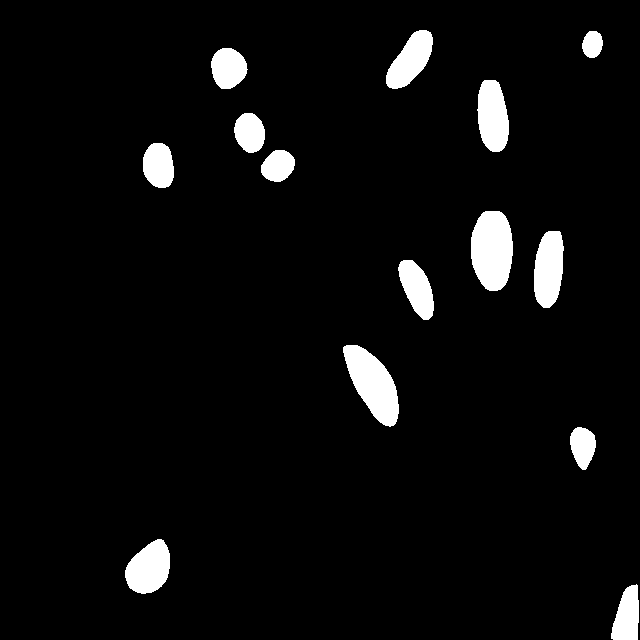

/content/bitirme-3/test/training-144_jpg.rf.f8f1fd3639b8c439eb1a8dbf6c571e82.jpg


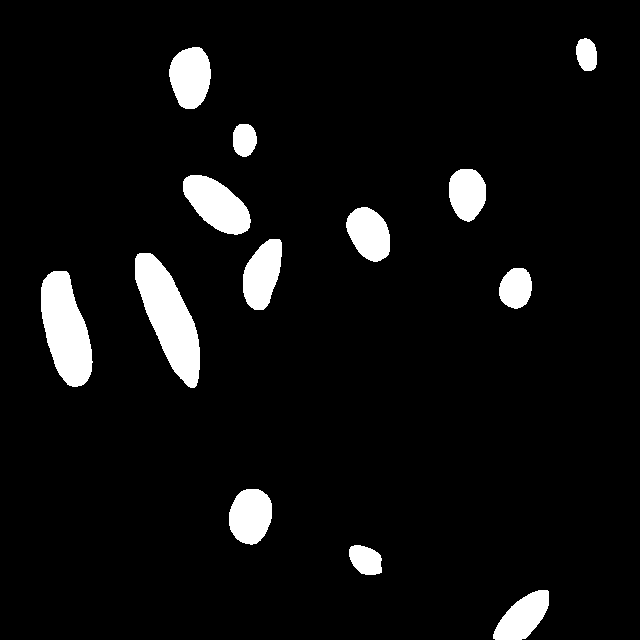

/content/bitirme-3/test/training-035_jpg.rf.fad07d8037ba150c5cc5d2837d5449f3.jpg


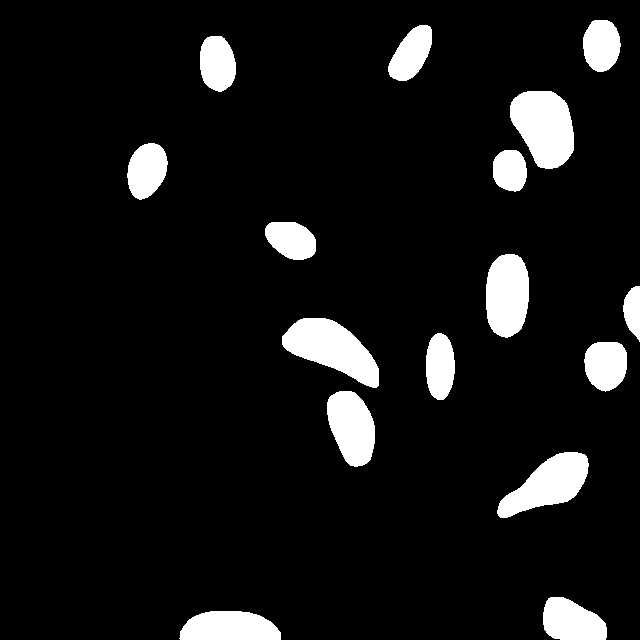

/content/bitirme-3/test/training-113_jpg.rf.ebc24f4b7f77a046ef218de48f168537.jpg


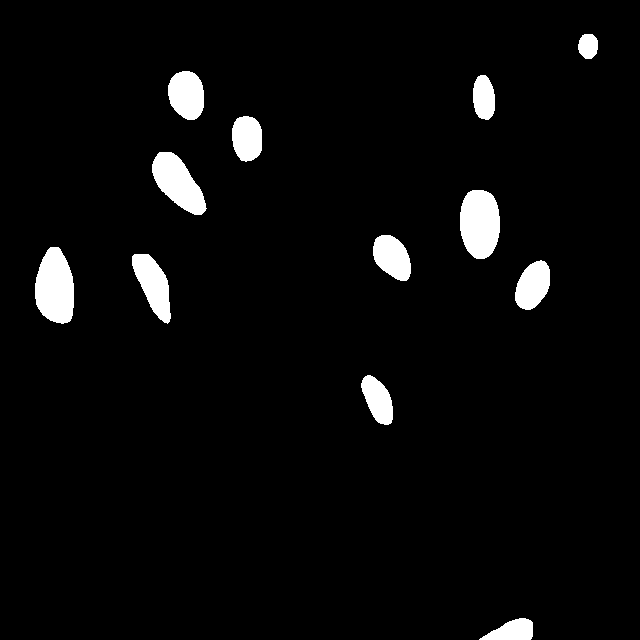

/content/bitirme-3/test/training-077_jpg.rf.f06df665875738f2330879b4c25ab342.jpg


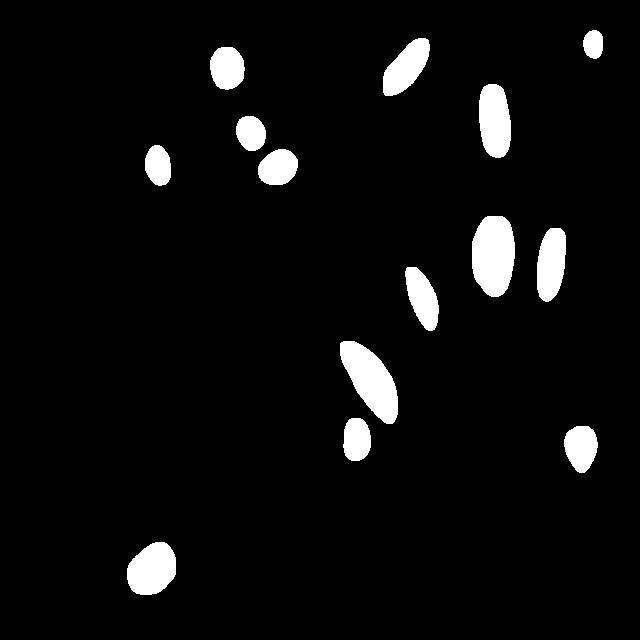

/content/bitirme-3/test/training-130_jpg.rf.ea10747347bcae27aba11c5032c51231.jpg


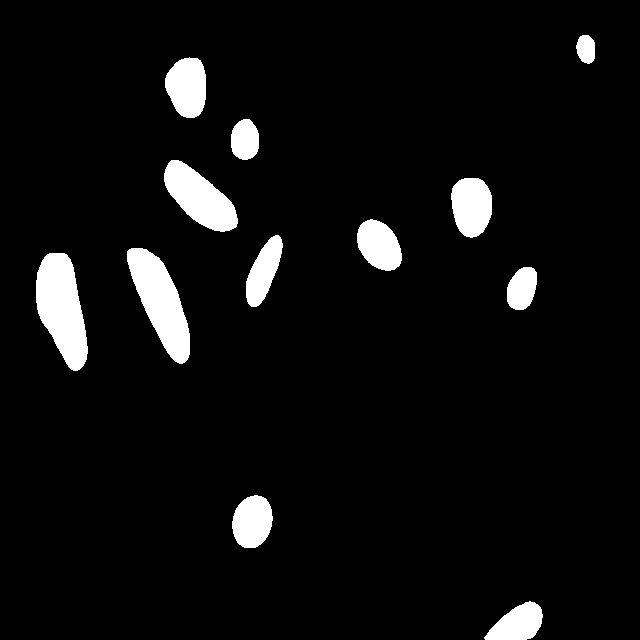

/content/bitirme-3/test/training-108_jpg.rf.f3931769c9793e2db767ced2f811929d.jpg


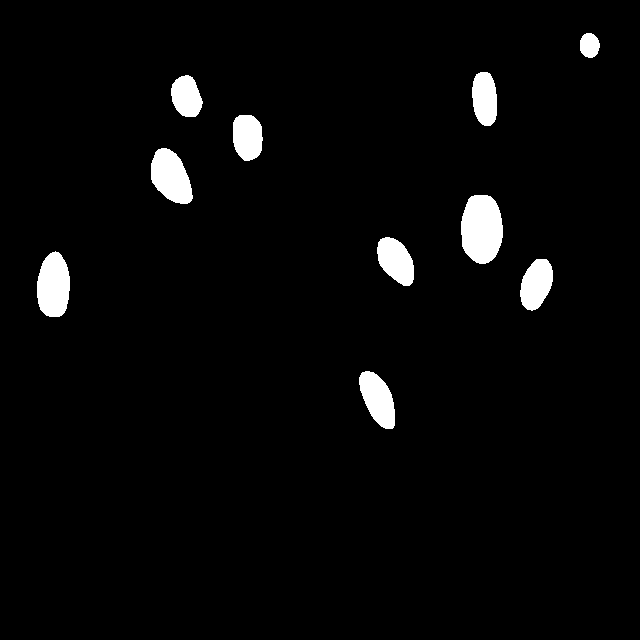

/content/bitirme-3/test/training-106_jpg.rf.fea54bbaf4264f00433049ca81d0ac15.jpg


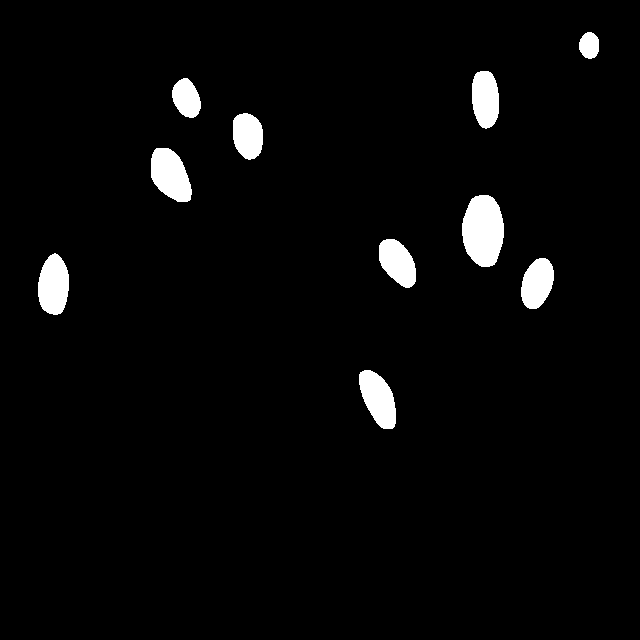

/content/bitirme-3/test/training-023_jpg.rf.f34d92d19c35d56bdb38667132becdf3.jpg


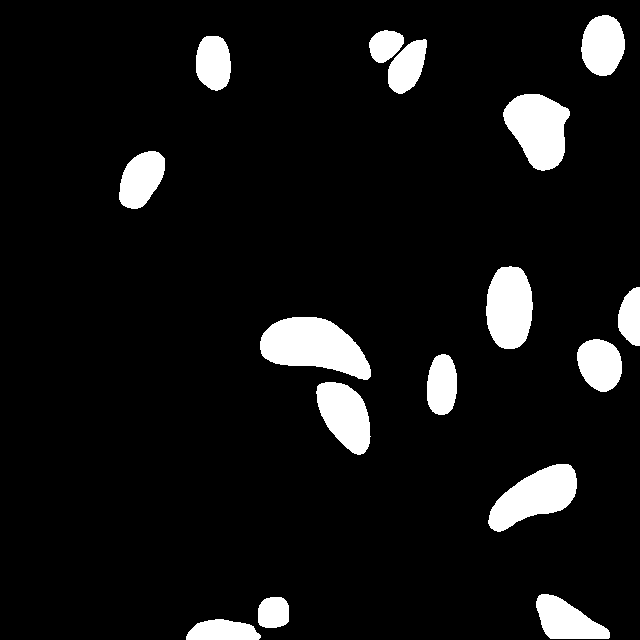

/content/bitirme-3/test/training-060_jpg.rf.f8fe2e68e856033570dfb9a48cd46023.jpg


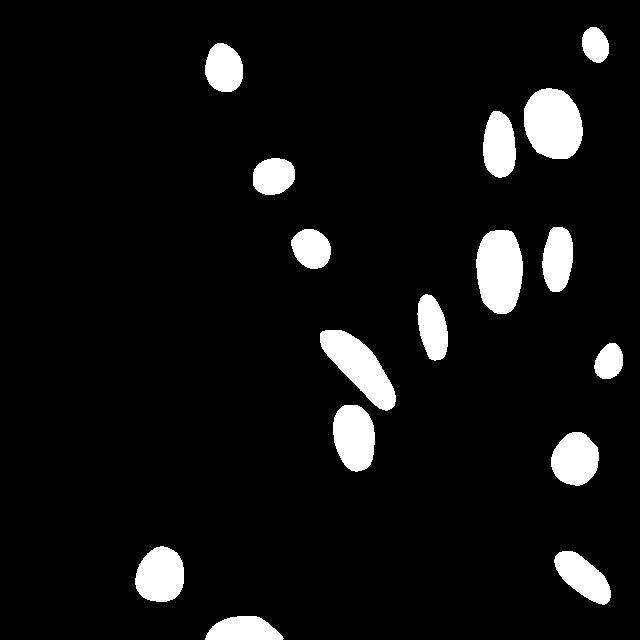

/content/bitirme-3/test/training-081_jpg.rf.fb42c0556226ab68705b6b9bd3ad19fa.jpg


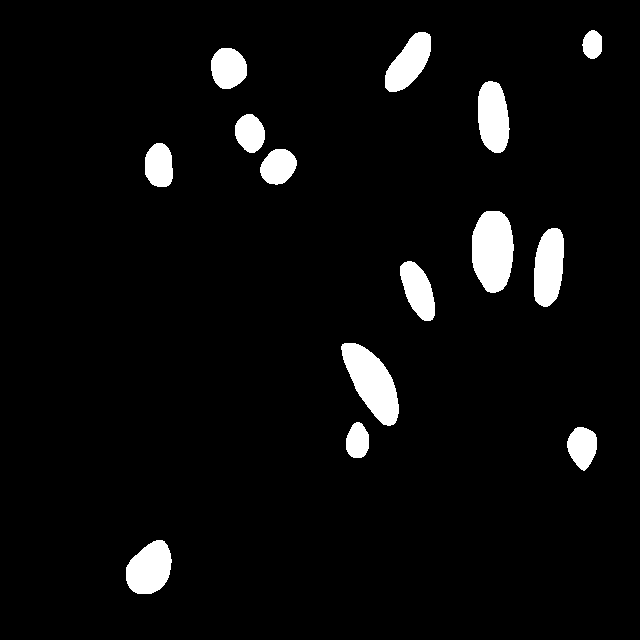

/content/bitirme-3/test/training-147_jpg.rf.fdb6e0cac88c8595ea76494da148165a.jpg


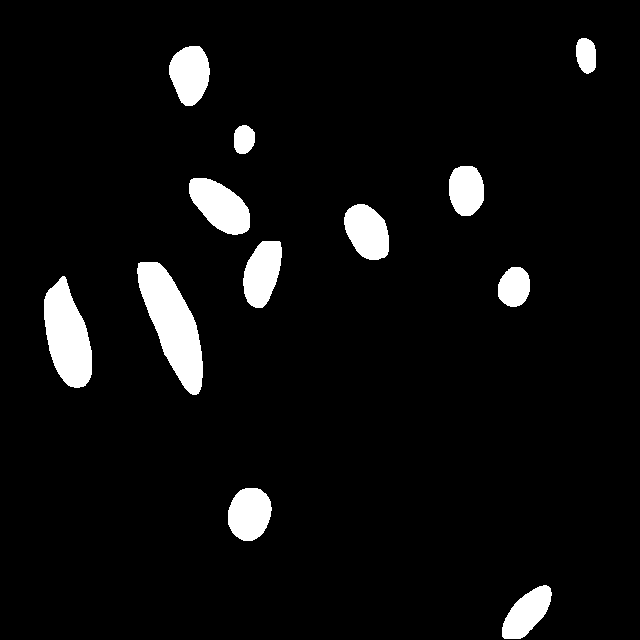

/content/bitirme-3/test/training-032_jpg.rf.fffcc9900fe8dcc9190aa77a62d63366.jpg


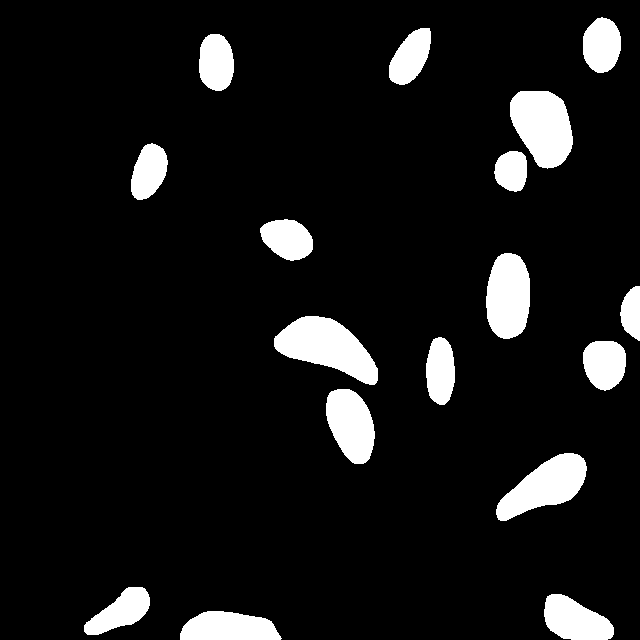

/content/bitirme-3/test/training-135_jpg.rf.fcffcc5a4facbfbd3d1fd36fe37d8672.jpg


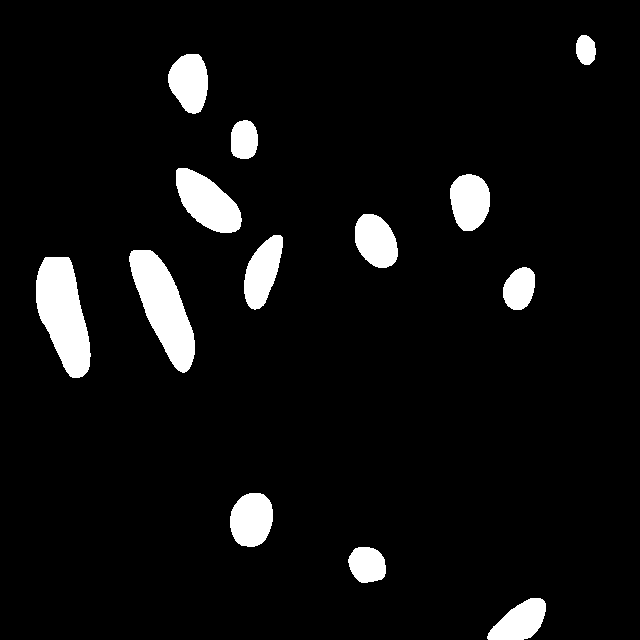

/content/bitirme-3/test/training-054_jpg.rf.d0dfe1f7dd243b19a5fa8d3e2df69cb3.jpg


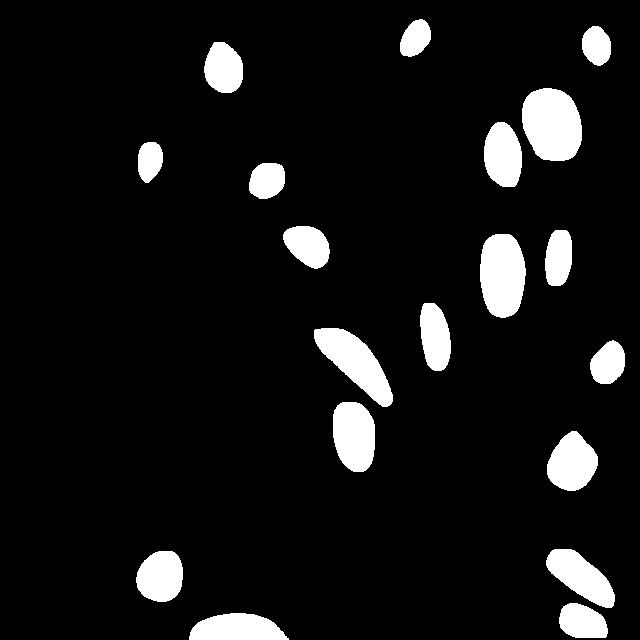

In [27]:
new_predicted_mask = np.zeros_like(img)  # Boş bir maske oluştur
new_pd_mask_list=[]

for d in new_dataset_test:
  
    img = cv2.imread(d["file_name"])
    new_predicted_mask = np.zeros_like(img[:, :, 0])  # img ile aynı boyutta bir dizi oluştur
    outputs = predictor(img)
    instances = outputs["instances"]
    masks = instances.pred_masks.cpu().numpy()
    # Her bir maskeyi birleştir
    combined_mask = np.logical_or.reduce(masks).astype(np.uint8) * 255
    print(d["file_name"])
    new_pd_mask_list.append(combined_mask)
    cv2_imshow(combined_mask)

In [28]:
toplam=0
sayac=0
for gt_mask, pd_mask in zip(new_gt_mask_list, new_pd_mask_list):
  intersection = np.logical_and(gt_mask, pd_mask)
  union = np.logical_or(gt_mask, pd_mask)
  iou = np.sum(intersection) / np.sum(union)
  toplam=toplam+iou
  sayac=sayac+1
sonuc=toplam/sayac
print("Test verisinden alınan görüntülerle ortalama jaccard değeri:",sonuc)

Test verisinden alınan görüntülerle ortalama jaccard değeri: 0.8196879068663749
